In [3]:
getwd()

[1] "/projects/pfenninggroup/singleCell/Clark_et_al_scRNAseq_Retina/Archr_Env"

In [ ]:
#some things are repeated cos I keep going over to do it
#let me know if you are confused with anything
#https://hbctraining.github.io/scRNA-seq_online/
#the website was a great resource#load necessary libraries

In [1]:
library(SingleCellExperiment)
library(Seurat)
library(tidyverse)
library(Matrix)
library(scales)
library(cowplot)
library(RCurl)

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds, rowQuantiles, rowRanges

In [2]:
library(DoubletFinder)
library(Matrix) 
library(fields) 
library(KernSmooth) 
library(ROCR) 
library(parallel)

Loading required package: spam

Spam version 2.9-1 (2022-08-07) is loaded.
Type 'help( Spam)' or 'demo( spam)' for a short introduction 
and overview of this package.
Help for individual functions is also obtained by adding the
suffix '.spam' to the function name, e.g. 'help( chol.spam)'.


Attaching package: ‘spam’


The following object is masked from ‘package:Matrix’:

    det


The following object is masked from ‘package:stats4’:

    mle


The following objects are masked from ‘package:base’:

    backsolve, forwardsolve


Loading required package: viridis

Loading required package: viridisLite


Attaching package: ‘viridis’


The following object is masked from ‘package:scales’:

    viridis_pal



Try help(fields) to get started.

KernSmooth 2.23 loaded
Copyright M. P. Wand 1997-2009



In [3]:
#read raw data
#directory should have barcodes, features, and metadata
ret_data <- Read10X(data.dir = "/projects/pfenninggroup/ScRetina/10X_run/")

In [18]:
#create a seurat object from the data
ret <- CreateSeuratObject(counts = ret_data, min.features = 100)

In [21]:
#compute genes per UMI and add to metadata
ret$log10GenesPerUMI <- log10(ret$nFeature_RNA) / log10(ret$nCount_RNA)

In [63]:
library("AnnotationHub")

Loading required package: BiocFileCache

Loading required package: dbplyr


Attaching package: ‘dbplyr’


The following objects are masked from ‘package:dplyr’:

    ident, sql



Attaching package: ‘AnnotationHub’


The following object is masked from ‘package:Biobase’:

    cache




In [64]:
#get annotations of mouse genome to extract mitochondrial genes
ah <- AnnotationHub()
ahDb <- query(ah,
              pattern = c("Mus musculus", "EnsDb"),
              ignore.case = TRUE)


snapshotDate(): 2021-10-20



In [65]:
id <- ahDb %>%
  mcols() %>%
  rownames() %>%
  tail(n = 1)

In [66]:
edb <- ah[[id]]

loading from cache

require(“ensembldb”)



In [67]:
annotations <- genes(edb,
                     return.type = "data.frame")

In [68]:
annotations <- annotations %>%
  dplyr::select(gene_id, gene_name, gene_biotype, seq_name, description, entrezid)
View(annotations)

,gene_id,gene_name,gene_biotype,seq_name,description,entrezid
,<chr>,<chr>,<chr>,<chr>,<chr>,<named list>
1,ENSMUSG00000102693,4933401J01Rik,TEC,1,RIKEN cDNA 4933401J01 gene [Source:MGI Symbol;Acc:MGI:1918292],NA
2,ENSMUSG00000064842,Gm26206,snRNA,1,"predicted gene, 26206 [Source:MGI Symbol;Acc:MGI:5455983]",115487594
3,ENSMUSG00000051951,Xkr4,protein_coding,1,X-linked Kx blood group related 4 [Source:MGI Symbol;Acc:MGI:3528744],497097
4,ENSMUSG00000102851,Gm18956,processed_pseudogene,1,"predicted gene, 18956 [Source:MGI Symbol;Acc:MGI:5011141]",NA
5,ENSMUSG00000103377,Gm37180,TEC,1,"predicted gene, 37180 [Source:MGI Symbol;Acc:MGI:5610408]",NA
6,ENSMUSG00000104017,Gm37363,TEC,1,"predicted gene, 37363 [Source:MGI Symbol;Acc:MGI:5610591]",NA
7,ENSMUSG00000103025,Gm37686,TEC,1,"predicted gene, 37686 [Source:MGI Symbol;Acc:MGI:5610914]",NA
8,ENSMUSG00000089699,Gm1992,lncRNA,1,predicted gene 1992 [Source:MGI Symbol;Acc:MGI:3780162],NA
9,ENSMUSG00000103201,Gm37329,TEC,1,"predicted gene, 37329 [Source:MGI Symbol;Acc:MGI:5610557]",NA


In [ ]:
#get mitochondrial genes
mt <- annotations %>%
        dplyr::filter(seq_name == "MT") %>%
        dplyr::pull(gene_name)
ret$mitoRatio <- PercentageFeatureSet(object = ret, pattern = "^mt-")

In [31]:
head(ret@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio
,<fct>,<dbl>,<int>,<dbl>,<dbl>
"""E11.AAACCTGAGATGTAAC.1""",SeuratProject,2794,1549,0.9256651,1.4674302
"""E11.AAACCTGAGCCCAGCT.1""",SeuratProject,11600,1889,0.8060686,0.4741379
"""E11.AAACCTGAGGCAATTA.1""",SeuratProject,3548,1848,0.9202020,1.5501691
"""E11.AAACCTGAGTAGCGGT.1""",SeuratProject,3838,1935,0.9170158,1.4069828
"""E11.AAACCTGAGTGGAGTC.1""",SeuratProject,4612,2139,0.9089278,1.4744146
"""E11.AAACCTGCAAGTTGTC.1""",SeuratProject,3296,1723,0.9199253,2.3968447


In [ ]:
ret$mitoRatio <- ret@meta.data$mitoRatio / 100

In [43]:
head(ret@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>
"""E11.AAACCTGAGATGTAAC.1""",SeuratProject,2794,1549,0.9256651,0.014674302,"""E11.AAACCTGAGATGTAAC.1""",ctrl
"""E11.AAACCTGAGCCCAGCT.1""",SeuratProject,11600,1889,0.8060686,0.004741379,"""E11.AAACCTGAGCCCAGCT.1""",ctrl
"""E11.AAACCTGAGGCAATTA.1""",SeuratProject,3548,1848,0.9202020,0.015501691,"""E11.AAACCTGAGGCAATTA.1""",ctrl
"""E11.AAACCTGAGTAGCGGT.1""",SeuratProject,3838,1935,0.9170158,0.014069828,"""E11.AAACCTGAGTAGCGGT.1""",ctrl
"""E11.AAACCTGAGTGGAGTC.1""",SeuratProject,4612,2139,0.9089278,0.014744146,"""E11.AAACCTGAGTGGAGTC.1""",ctrl
"""E11.AAACCTGCAAGTTGTC.1""",SeuratProject,3296,1723,0.9199253,0.023968447,"""E11.AAACCTGCAAGTTGTC.1""",ctrl


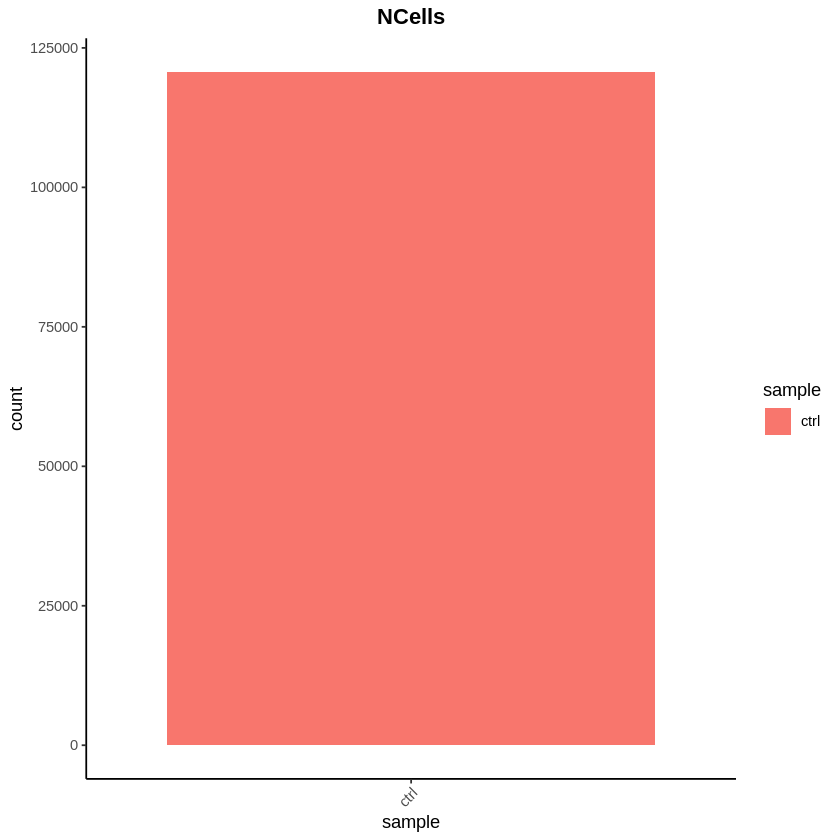

In [44]:
#barplot of number of cells
ret@meta.data %>% 
  ggplot(aes(x=sample, fill=sample)) + 
  geom_bar() +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
  theme(plot.title = element_text(hjust=0.5, face="bold")) +
  ggtitle("NCells")

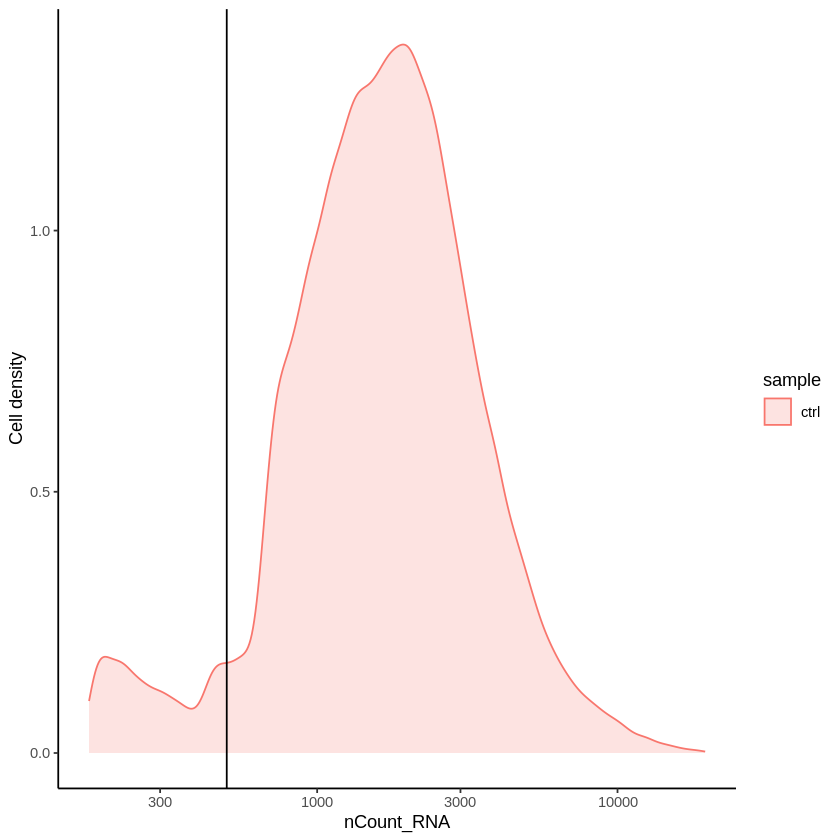

In [46]:
# Visualize the number UMIs/transcripts per cell
ret@meta.data %>% 
  ggplot(aes(color=sample, x=nCount_RNA, fill= sample)) + 
  geom_density(alpha = 0.2) + 
  scale_x_log10() + 
  theme_classic() +
  ylab("Cell density") +
  geom_vline(xintercept = 500)

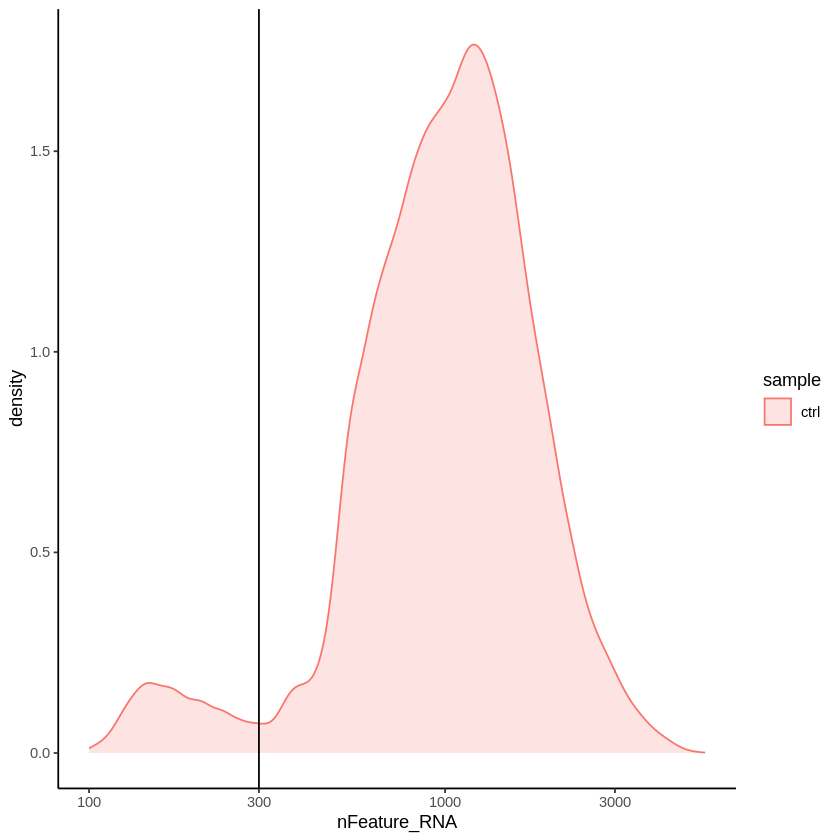

In [47]:
# Visualize the distribution of genes detected per cell via histogram
ret@meta.data %>% 
  ggplot(aes(color=sample, x=nFeature_RNA, fill= sample)) + 
  geom_density(alpha = 0.2) + 
  theme_classic() +
  scale_x_log10() + 
  geom_vline(xintercept = 300)

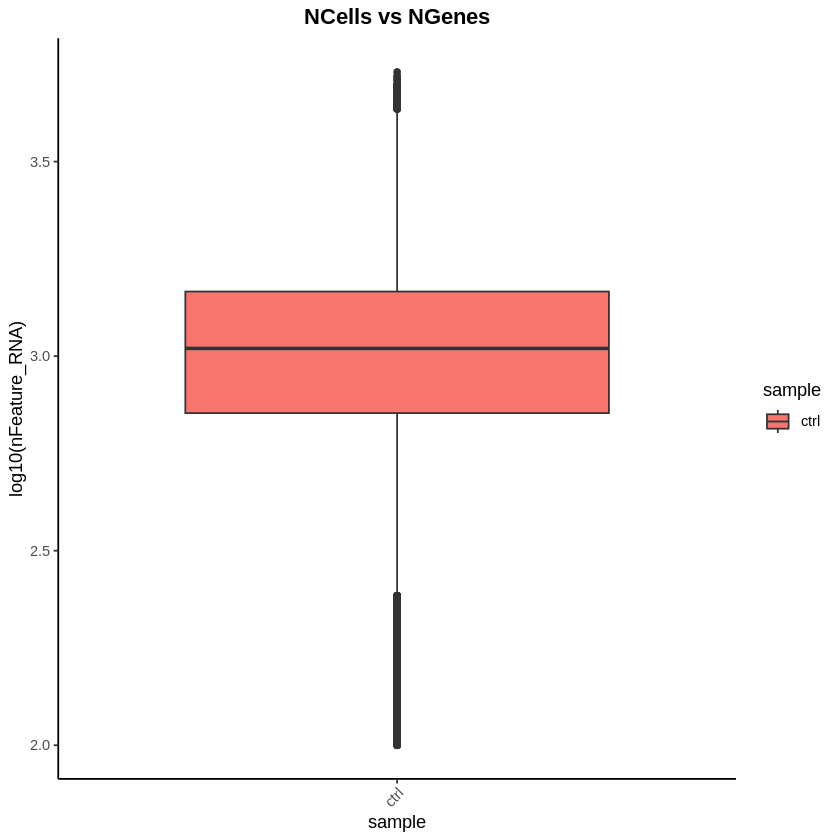

In [48]:
# Visualize the distribution of genes detected per cell via boxplot
ret@meta.data %>% 
  ggplot(aes(x=sample, y=log10(nFeature_RNA), fill=sample)) + 
  geom_boxplot() + 
  theme_classic() +
  theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
  theme(plot.title = element_text(hjust=0.5, face="bold")) +
  ggtitle("NCells vs NGenes")

`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: colour
ℹ This can happen when ggplot fails to infer the correct grouping structure in the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical variable into a factor?"


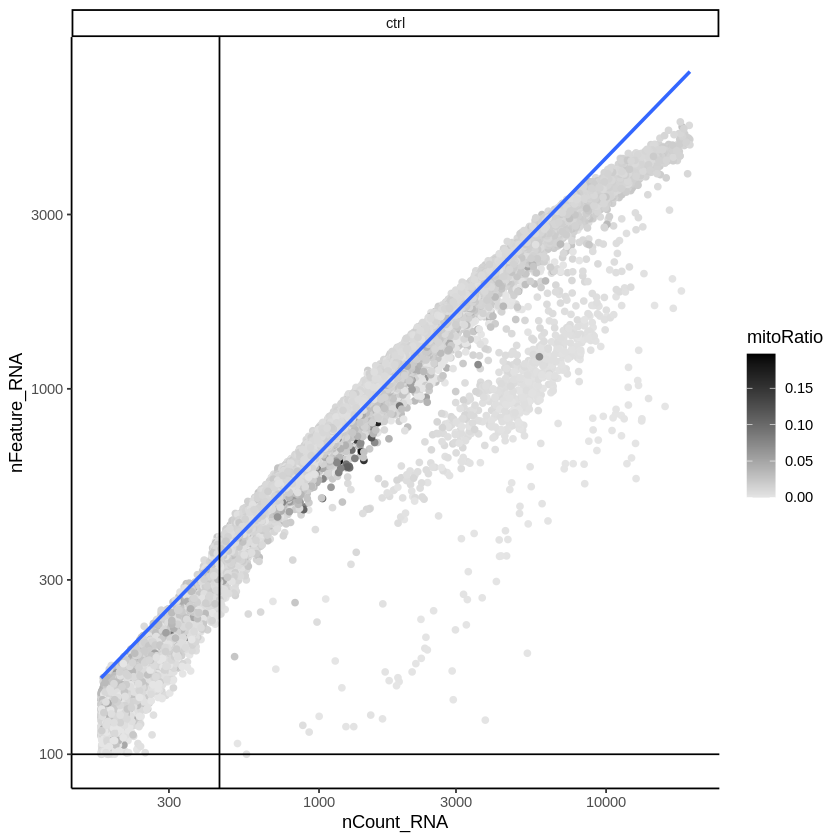

In [52]:
# Visualize the correlation between genes detected and number of UMIs and determine whether strong presence of cells with low numbers of genes/UMIs
ret@meta.data %>% 
  ggplot(aes(x=nCount_RNA, y=nFeature_RNA, color=mitoRatio)) + 
  geom_point() + 
  scale_colour_gradient(low = "gray90", high = "black") +
  stat_smooth(method=lm) +
  scale_x_log10() + 
  scale_y_log10() + 
  theme_classic() +
  geom_vline(xintercept = 450) +
  geom_hline(yintercept = 200) +
  facet_wrap(~sample)

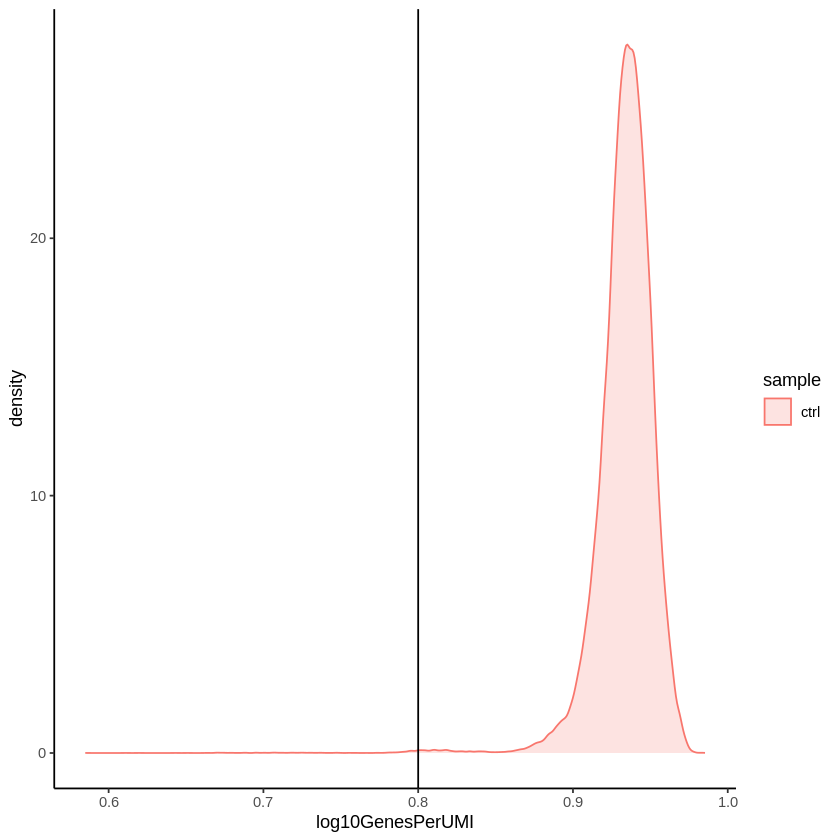

In [55]:
# Visualize the overall complexity of the gene expression by visualizing the genes detected per UMI
ret@meta.data %>%
  ggplot(aes(x=log10GenesPerUMI, color = sample, fill=sample)) +
  geom_density(alpha = 0.2) +
  theme_classic() +
  geom_vline(xintercept = 0.8)

Warning message:
"Transformation introduced infinite values in continuous x-axis"
Warning message:
"Removed 1270 rows containing non-finite values (`stat_density()`)."


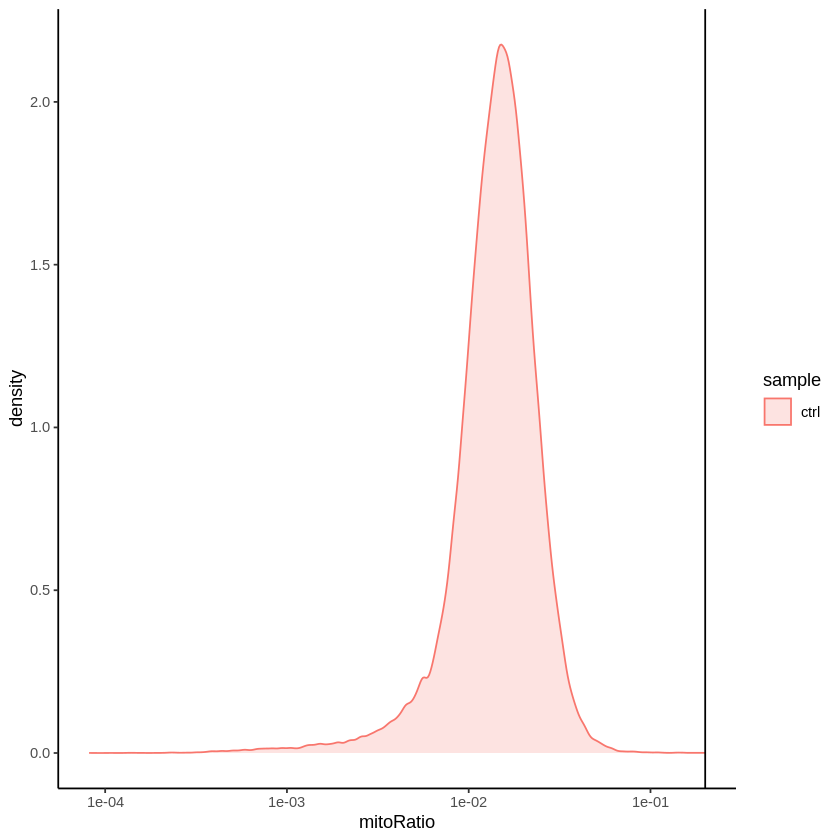

In [54]:
# Visualize the distribution of mitochondrial gene expression detected per cell
ret@meta.data %>% 
  ggplot(aes(color=sample, x=mitoRatio, fill=sample)) + 
  geom_density(alpha = 0.2) + 
  scale_x_log10() + 
  theme_classic() +
  geom_vline(xintercept = 0.2)

In [10]:
library("dplyr")
install.packages("ggplot2")


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [63]:
# Filter out low quality reads using selected thresholds - these will change with experiment
filtered_seurat <- subset(x = ret, 
                         subset= (nCount_RNA >= 500) & 
                           (nFeature_RNA >= 250) & 
                           (log10GenesPerUMI > 0.80) & 
                           (mitoRatio < 0.20))

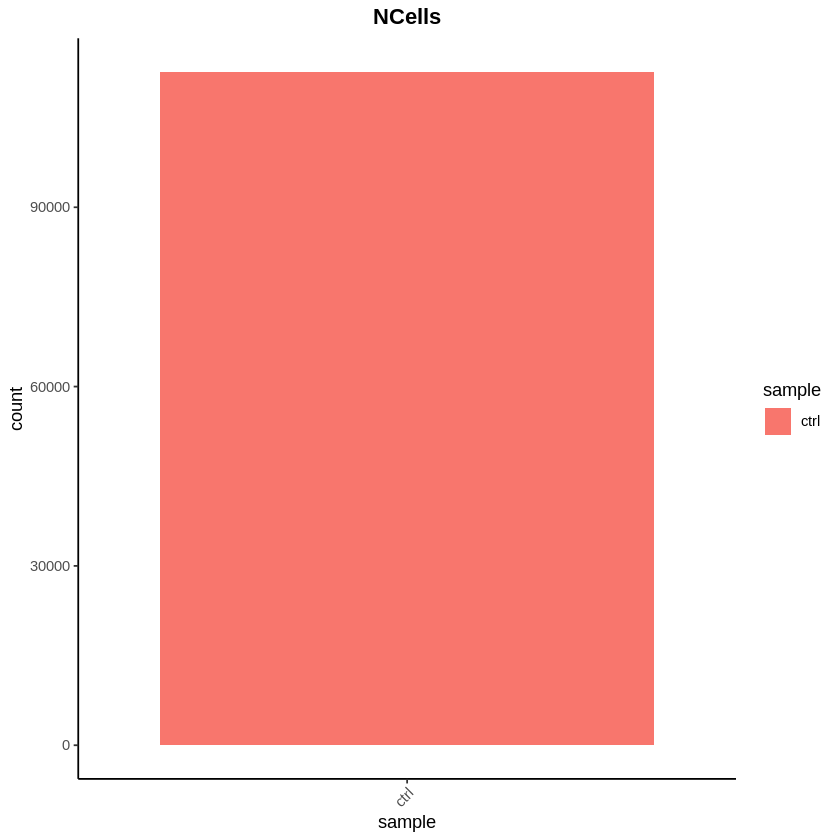

In [65]:
#let's see how many cells we have now
filtered_seurat@meta.data %>% 
  ggplot(aes(x=sample, fill=sample)) + 
  geom_bar() +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
  theme(plot.title = element_text(hjust=0.5, face="bold")) +
  ggtitle("NCells")

In [66]:
#those thresholds will be looked into
# Output a logical vector for every gene on whether there are more than zero counts per cell
# Extract counts
counts <- GetAssayData(object = filtered_seurat, slot = "counts")

In [68]:
# Output a logical vector for every gene on whether the more than zero counts per cell
nonzero <- counts > 0

In [70]:
# Sums all TRUE values and returns TRUE if there are more than 10 TRUE values per gene
keep_genes <- Matrix::rowSums(nonzero) >= 10 #not sure we will apply this

In [71]:
# Only keeping those genes expressed in more than 10 cells
filtered_counts <- counts[keep_genes, ]

In [72]:
# Reassign to filtered Seurat object
#we should filter metadata too if some cells were removed, so we have same number of cells in metada
#ta and count data
filtered_seurat <- CreateSeuratObject(filtered_counts, meta.data = filtered_seurat@meta.data)

In [73]:
#you should make those plots over and over to see the effect of your QC metrics
# Create .RData object to load at any time
save(filtered_seurat, file="seurat_filtered.RData")

In [2]:
#now, we move to clustering and marker identification
load("seurat_filtered.RData")

In [41]:
filtered_seurat

An object of class Seurat 
17880 features across 112642 samples within 1 assay 
Active assay: RNA (17880 features, 0 variable features)

In [3]:
#normalize data
seurat_phase <- NormalizeData(filtered_seurat)

In [69]:
#get cell cycle genes to investigate variation in cell cycle phase across samples
cc_file <- getURL("https://raw.githubusercontent.com/hbc/tinyatlas/master/cell_cycle/Mus_musculus.csv") 
cell_cycle_genes <- read.csv(text = cc_file)

In [70]:
# Get gene names for Ensembl IDs for each gene
cell_cycle_markers <- dplyr::left_join(cell_cycle_genes, annotations, by = c("geneID" = "gene_id"))

In [71]:
# Acquire the S phase genes
s_genes <- cell_cycle_markers %>%
        dplyr::filter(phase == "S") %>%
        pull("gene_name")
        
# Acquire the G2M phase genes        
g2m_genes <- cell_cycle_markers %>%
        dplyr::filter(phase == "G2/M") %>%
        pull("gene_name")

In [25]:
# Perform cell cycle scoring
seurat_phase <- CellCycleScoring(seurat_phase,
                                   g2m.features = g2m_genes,
                                   s.features = s_genes)

Warning message:
"The following features are not present in the object: Jpt1, Pimreg, not searching for symbol synonyms"


In [57]:
# View cell cycle scores and phases assigned to cells                                 
head(seurat_phase@meta.data) 

,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample,S.Score,G2M.Score,Phase
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>
"""E11.AAACCTGAGATGTAAC.1""",SeuratProject,2794,1549,0.9256651,0.014674302,"""E11.AAACCTGAGATGTAAC.1""",ctrl,0.10744264,0.07446449,S
"""E11.AAACCTGAGCCCAGCT.1""",SeuratProject,11600,1889,0.8060686,0.004741379,"""E11.AAACCTGAGCCCAGCT.1""",ctrl,0.09703368,0.33803304,G2M
"""E11.AAACCTGAGGCAATTA.1""",SeuratProject,3548,1848,0.9202020,0.015501691,"""E11.AAACCTGAGGCAATTA.1""",ctrl,0.10537597,0.66581846,G2M
"""E11.AAACCTGAGTAGCGGT.1""",SeuratProject,3838,1935,0.9170158,0.014069828,"""E11.AAACCTGAGTAGCGGT.1""",ctrl,0.33759034,-0.07400795,S
"""E11.AAACCTGAGTGGAGTC.1""",SeuratProject,4612,2139,0.9089278,0.014744146,"""E11.AAACCTGAGTGGAGTC.1""",ctrl,-0.05588179,0.46404311,G2M
"""E11.AAACCTGCAAGTTGTC.1""",SeuratProject,3296,1723,0.9199253,0.023968447,"""E11.AAACCTGCAAGTTGTC.1""",ctrl,-0.05196632,0.20960160,G2M


In [4]:
# Identify the most variable genes
seurat_phase <- FindVariableFeatures(seurat_phase, 
                     selection.method = "vst",
                     nfeatures = 3000, 
                     verbose = FALSE)
    
# Scale the counts
seurat_phase <- ScaleData(seurat_phase)

Centering and scaling data matrix



In [5]:
# Perform PCA
seurat_phase <- RunPCA(seurat_phase)


PC_ 1 
Positive:  Pdc, Rom1, Pde6g, Sag, Unc119, Nr2e3, Prph2, Tulp1, Gngt1, Rho 
	   Neurod1, Platr17, Snap25, Nrl, Gngt2, Rpgrip1, Gm11744, Cnga1, Rcvrn, Ebpl 
	   Fam57b, Gnb3, Pde6b, Rp1, Cngb1, Nxnl2, Samd11, Crx, Tma7, Dpysl3 
Negative:  Ccnd1, Rps4x, 2810417H13Rik, Id3, Hmgb2, Ran, Mdk, Prdx1, Top2a, Npm1 
	   Tuba1b, Birc5, Rps3a1, Cdca8, Cks1b, Dapl1, Rpl10, Rps27a, Spc25, Hes1 
	   Cenpf, Gnai2, Id2, Id1, Fgf15, Rpl22l1, Cdk1, H2afz, Nasp, Rps16 
PC_ 2 
Positive:  Sag, Pde6g, Pdc, Prph2, Gngt1, Rom1, Rho, Nr2e3, Tulp1, Cnga1 
	   Rcvrn, Nrl, Platr17, Gm11744, Pde6b, Cngb1, Rp1, Rpgrip1, Ebpl, Unc119 
	   Nxnl2, Gngt2, Rdh12, Samd11, A930003A15Rik, Plekhb1, Aipl1, March1, Rtbdn, Neurod1 
Negative:  Stmn2, Ina, Tubb3, Elavl3, Mllt11, Stmn3, Rtn1, Tubb2b, Mapt, Gap43 
	   Crmp1, Tubb2a, Tagln3, Nefl, Cd24a, Sncg, Stmn4, Nefm, Kif5c, Basp1 
	   Nnat, Rbfox2, Elavl4, Tuba1a, Tmsb10, Gng3, Nsg1, Igfbpl1, 6330403K07Rik, Ebf1 
PC_ 3 
Positive:  Ckb, Ndufa4l2, Ncam1, Tubb4b, Prc1, Esp

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



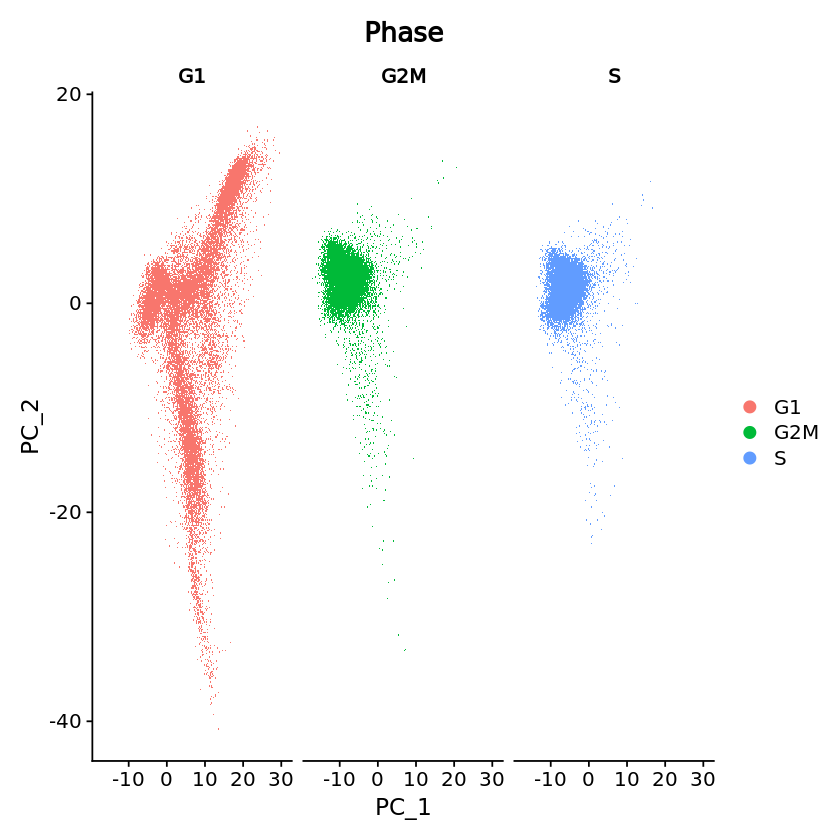

In [60]:

# Plot the PCA colored by cell cycle phase
DimPlot(seurat_phase,
        reduction = "pca",
        group.by= "Phase",
        split.by = "Phase")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



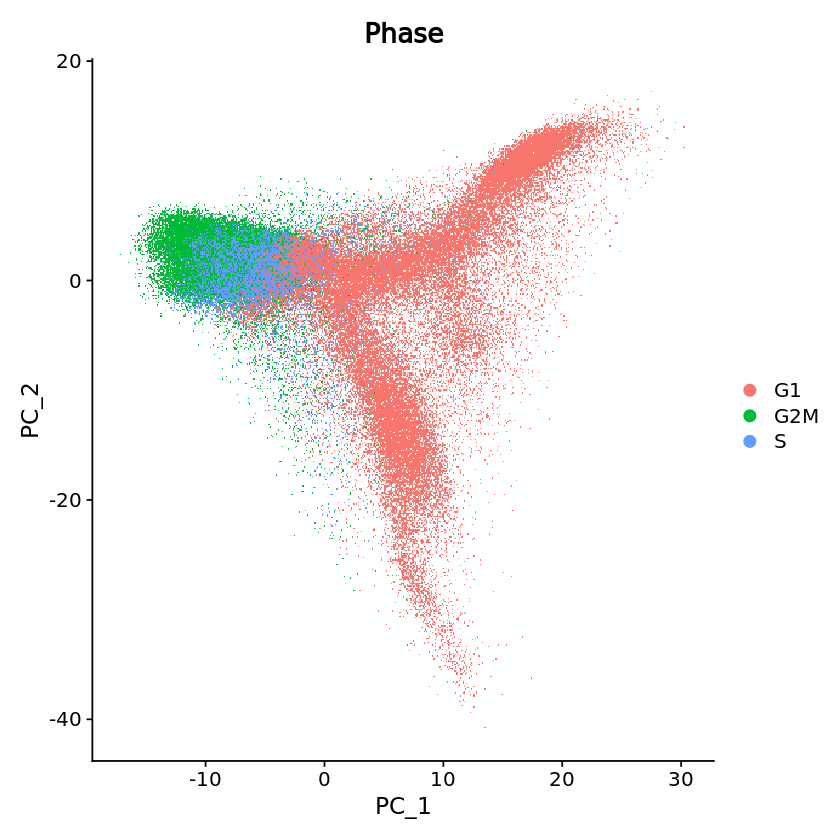

In [61]:
# Visualize the PCA, grouping by cell cycle phase
DimPlot(seurat_phase,
        reduction = "pca",
        group.by= "Phase")

#there are variations due to cell cycle, so we have to regress that out

In [29]:
# Check quartile values for mitochondrial ratio
summary(seurat_phase@meta.data$mitoRatio)



   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.01101 0.01477 0.01578 0.01938 0.19722 

In [22]:
# Turn mitoRatio into categorical factor vector based on quartile values
seurat_phase@meta.data$mitoFr <- cut(seurat_phase@meta.data$mitoRatio, 
                   breaks=c(-Inf, 0.0144, 0.0199, 0.0267, Inf), 
                   labels=c("Low","Medium","Medium high", "High"))

In [62]:
seurat_phase <- RunPCA(seurat_phase)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



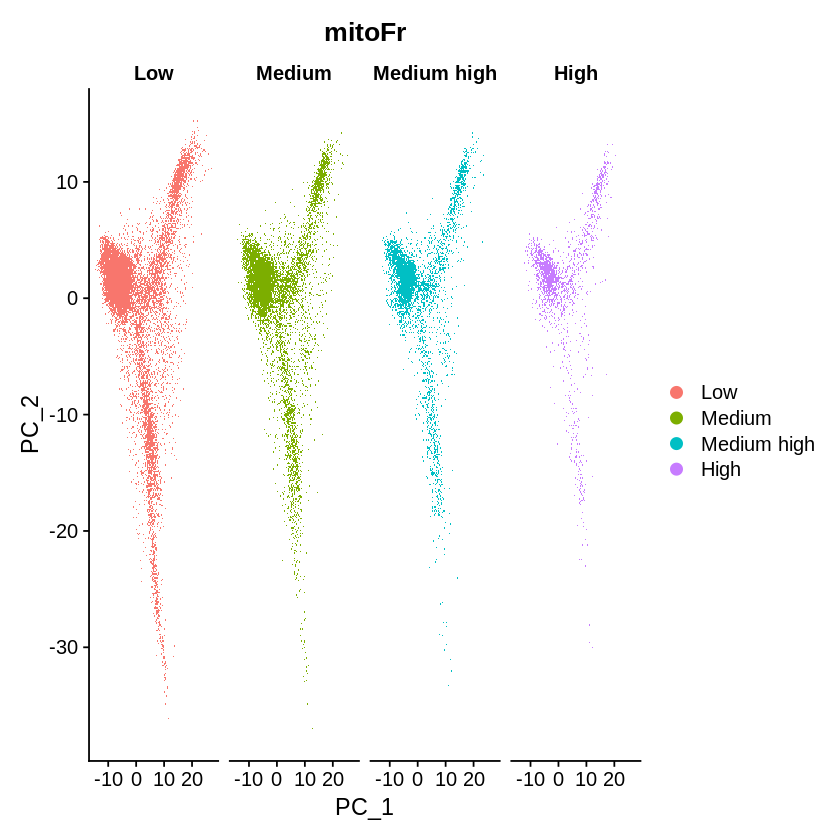

In [33]:
# Plot the PCA colored by fraction
DimPlot(seurat_phase,
        reduction = "pca",
        group.by= "mitoFr",
        split.by = "mitoFr")


#no variation due to mitochondrial gene expression

In [ ]:
#do PCA selection analysis in other notebook

In [24]:
saveRDS(seurat_phase, "seurat_phase1.rds")

In [4]:
seurat_phase <- readRDS("seurat_phase1.rds")

In [26]:
(seurat_phase@assays$RNA@counts)

  [[ suppressing 32 column names '"E11.AAACCTGAGATGTAAC.1"', '"E11.AAACCTGAGCCCAGCT.1"', '"E11.AAACCTGAGGCAATTA.1"' ... ]]

  [[ suppressing 32 column names '"E11.AAACCTGAGATGTAAC.1"', '"E11.AAACCTGAGCCCAGCT.1"', '"E11.AAACCTGAGGCAATTA.1"' ... ]]

  [[ suppressing 32 column names '"E11.AAACCTGAGATGTAAC.1"', '"E11.AAACCTGAGCCCAGCT.1"', '"E11.AAACCTGAGGCAATTA.1"' ... ]]



17880 x 112642 sparse Matrix of class "dgCMatrix"
                                                                                           
Xkr4           .  . .  .  .  .  .  . .  .  .  .  . .  . .  . .  . .  .  . .  .  . . .  .  .
Gm37381        .  . .  .  .  .  .  . .  .  .  .  . .  . .  . .  . .  .  . .  .  . . .  .  .
Rp1            .  . .  .  .  .  .  . .  .  .  .  . .  . .  . .  . .  .  . .  .  . . .  .  .
Sox17          .  . .  .  .  .  .  . .  .  .  .  . .  . .  . .  . .  .  . .  .  1 . .  .  .
Mrpl15         1  1 .  1  .  .  1  . .  .  1  2  1 1  . .  1 .  . .  2  1 .  1  . . .  .  .
Lypla1         .  . .  .  .  .  .  . .  1  .  .  . .  1 .  . .  1 1  .  1 .  .  1 1 1  .  1
Gm37988        .  . .  .  .  .  .  . .  .  .  .  . .  . .  . .  . .  .  . .  .  . . .  .  .
Tcea1          .  . .  .  .  .  .  . .  .  .  .  . .  . .  1 .  . .  .  . .  .  . . .  1  .
Rgs20          .  . .  .  .  .  .  . .  .  .  .  . .  . .  . .  . .  .  . .  .  . . .  .  .
Atp6v1h        .  . 1  1  .  .

In [29]:
#was just seeing if there was variation in ribosomal protein genes
RPS.genes <- grep(pattern = "^Rps", x = rownames(x = seurat_phase@assays$RNA@counts), value = TRUE)

In [30]:
RPS.genes

[1] "Rps6kc1"   "Rps21"     "Rps4x"     "Rps6ka6"   "Rps6ka3"   "Rps3a1"   
 [7] "Rps27"     "Rps20"     "Rps6"      "Rps8"      "Rps6ka1"   "Rps9"     
[13] "Rps5"      "Rps19"     "Rps16"     "Rps11"     "Rps17"     "Rps3"     
[19] "Rps13"     "Rps15a"    "Rps12"     "Rps15"     "Rps26"     "Rps18-ps3"
[25] "Rps26-ps1" "Rps24"     "Rps2-ps6"  "Rps25"     "Rps27l"    "Rps27rt"  
[31] "Rpsa"      "Rps27a"    "Rps6kb1"   "Rps23"     "Rps7"      "Rps29"    
[37] "Rps6kl1"   "Rps6ka5"   "Rps19bp1"  "Rps6ka2"   "Rps2"      "Rps10"    
[43] "Rps28"     "Rps18"     "Rps14"     "Rps6kb2"   "Rps6ka4"

In [3]:
#check Ribosomal protein gene distribution
seurat_phase$RPRatio <- PercentageFeatureSet(object = seurat_phase, pattern = "^Rp")

In [10]:
#create a sample column with the 2 to 4th character of cells
seurat_phase@meta.data$sample_state <- substr(seurat_phase@meta.data$cells,2,4)

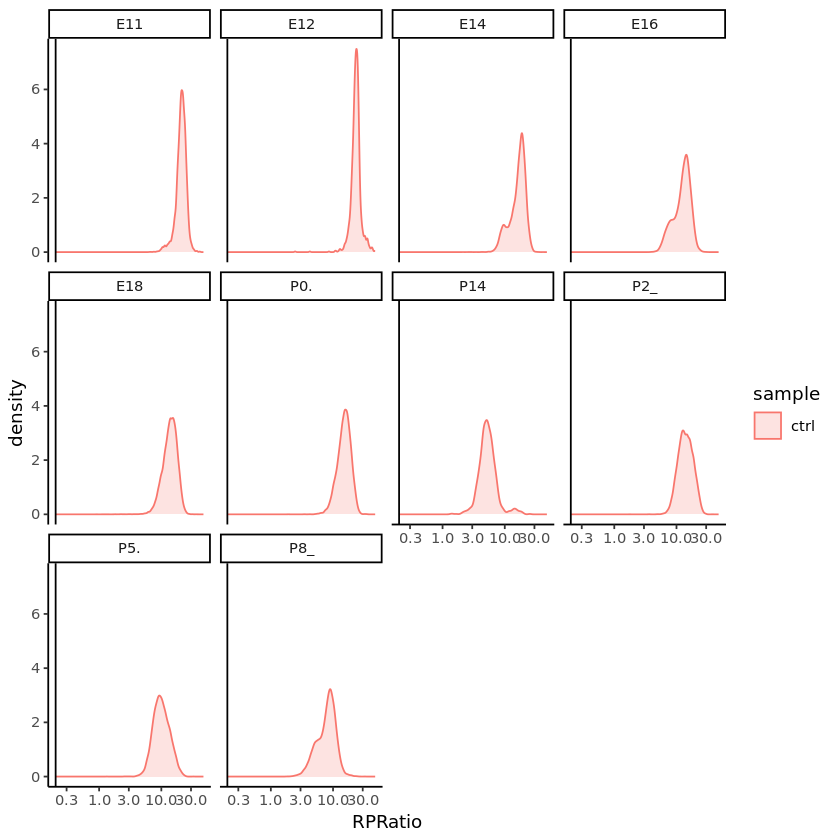

In [13]:
# Visualize the distribution of mitochondrial gene expression detected per cell
seurat_phase@meta.data %>% 
  ggplot(aes(color=sample, x=RPRatio, fill=sample)) + 
  geom_density(alpha = 0.2) + 
  scale_x_log10() + 
  theme_classic() +
  facet_wrap(~sample_state)+
  geom_vline(xintercept = 0.2)

In [14]:
#do same for clustered dataset
#this was after I completed the downstream analysis to get seurat best, so just skip
seurat_labelled <- readRDS("seurat_best.rds")

In [26]:
#check Ribosomal protein gene distribution
seurat_labelled$RPRatio <- PercentageFeatureSet(object = seurat_labelled, pattern = "^Rpl")

In [22]:
seurat_labelled$cluster_id <- factor(seurat_labelled@active.ident)

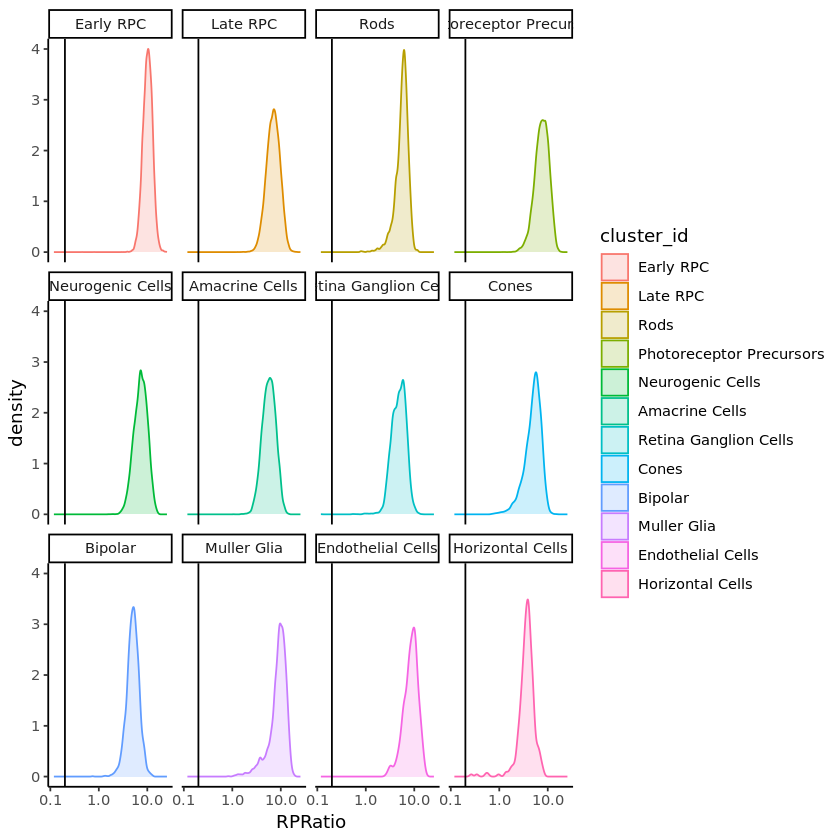

In [27]:
# Visualize the distribution of ribosomal protein gene expression detected per cell
seurat_labelled@meta.data %>% 
  ggplot(aes(color=cluster_id, x= RPRatio, fill = cluster_id)) + 
  geom_density(alpha = 0.2) + 
  scale_x_log10() + 
  theme_classic() + 
  facet_wrap(~cluster_id) +
  geom_vline(xintercept = 0.2)

#loooks pretty normal to me

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



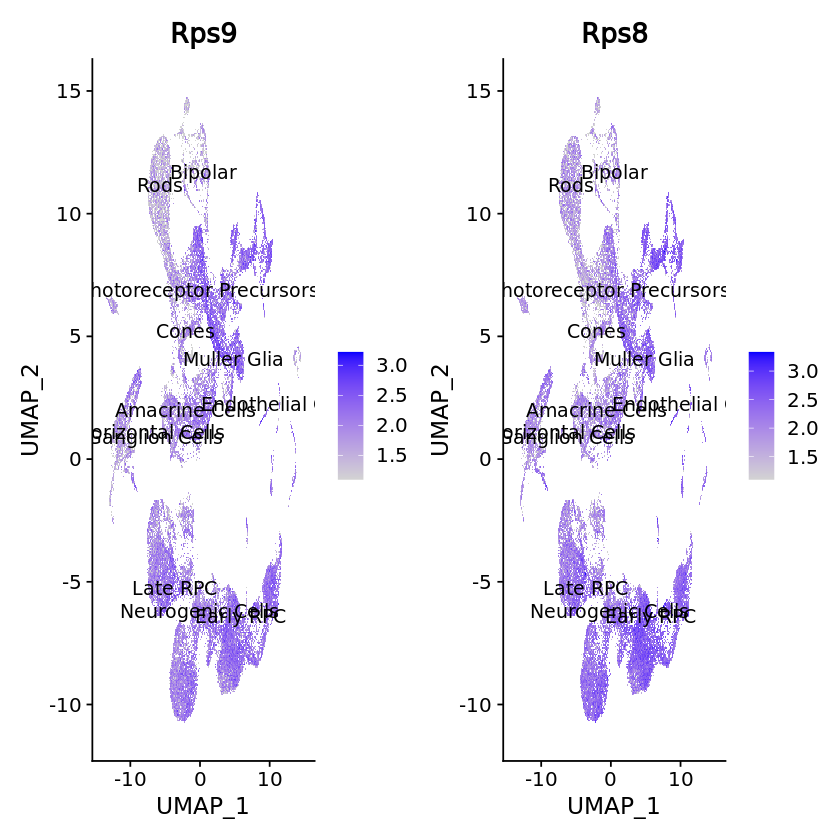

In [31]:
#feature plot of ribosomal protein gene expression\
FeaturePlot(seurat_labelled, 
            reduction = "umap", 
            features = c("Rps9","Rps8"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

In [30]:
#adding sample_condition identity
seurat_phase@meta.data$sample_state <- substr(seurat_phase@meta.data$cells,2,4)

ERROR: Error in eval(expr, envir, enclos): object 'sample_state' not found


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



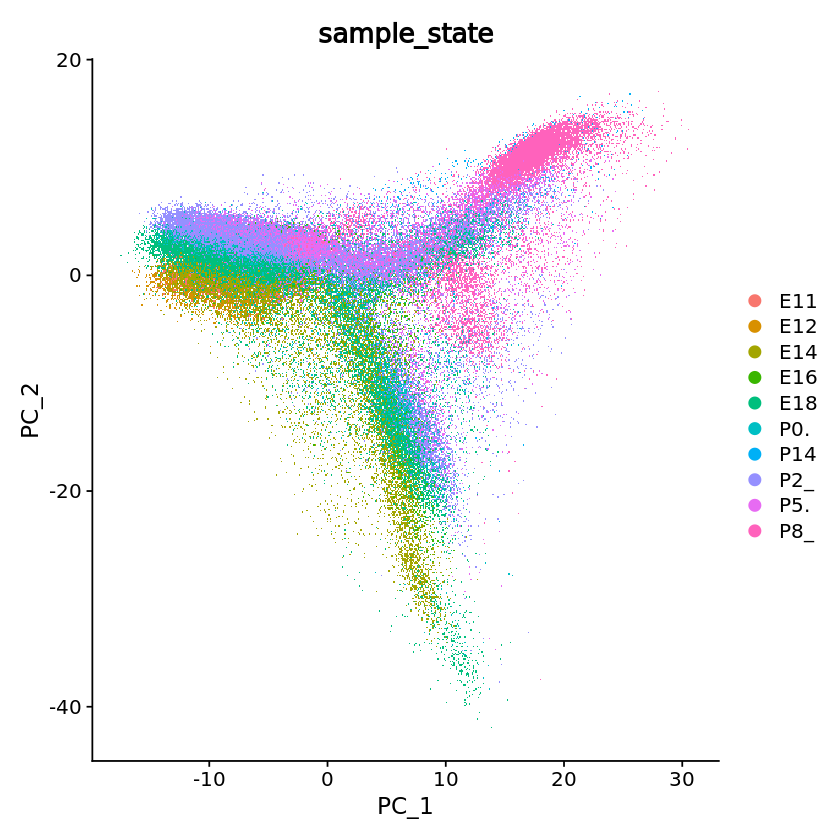

In [6]:
DimPlot(seurat_phase,
        reduction = "pca",
        group.by= "sample_state")

In [ ]:
seurat_phase <- readRDS("seurat_phase1.rds")

In [46]:
seurat_phase@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>
"""E11.AAACCTGAGATGTAAC.1""",SeuratProject,2794,1549,0.9256651,0.014674302,"""E11.AAACCTGAGATGTAAC.1""",ctrl
"""E11.AAACCTGAGCCCAGCT.1""",SeuratProject,11600,1889,0.8060686,0.004741379,"""E11.AAACCTGAGCCCAGCT.1""",ctrl
"""E11.AAACCTGAGGCAATTA.1""",SeuratProject,3548,1848,0.9202020,0.015501691,"""E11.AAACCTGAGGCAATTA.1""",ctrl
"""E11.AAACCTGAGTAGCGGT.1""",SeuratProject,3838,1935,0.9170158,0.014069828,"""E11.AAACCTGAGTAGCGGT.1""",ctrl
"""E11.AAACCTGAGTGGAGTC.1""",SeuratProject,4612,2139,0.9089278,0.014744146,"""E11.AAACCTGAGTGGAGTC.1""",ctrl
"""E11.AAACCTGCAAGTTGTC.1""",SeuratProject,3296,1723,0.9199253,0.023968447,"""E11.AAACCTGCAAGTTGTC.1""",ctrl
"""E11.AAACCTGCACCCATTC.1""",SeuratProject,3676,1806,0.9134291,0.011153428,"""E11.AAACCTGCACCCATTC.1""",ctrl
"""E11.AAACCTGCACGGATAG.1""",SeuratProject,3615,1765,0.9124918,0.013001383,"""E11.AAACCTGCACGGATAG.1""",ctrl
"""E11.AAACCTGCAGATCCAT.1""",SeuratProject,2680,1417,0.9192666,0.011567164,"""E11.AAACCTGCAGATCCAT.1""",ctrl


In [ ]:
#the next steps of sctransform and integration depends on how many conditions we have and we are integrating.

In [40]:
seurat_phase

An object of class Seurat 
17880 features across 112642 samples within 1 assay 
Active assay: RNA (17880 features, 3290 variable features)
 1 dimensional reduction calculated: pca

In [10]:
# SCTranform, do this for just one sample
#we could also split the conditions and run sctransform on each condition
#seurat_phase <- SCTransform(seurat_phase, vars.to.regress = c("Phase"))
seurat_phase <- SCTransform(seurat_phase)

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 17880 by 112642

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 145 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17880 genes



  |======================================================================| 100%


Computing corrected count matrix for 17880 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 7.531383 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT



In [44]:
#if you have many samples, you have to iterate through them
#I think for this experiment, the different time points are the conditions sort of, so I will transform by that
#I did not use this eventually

In [11]:
# Perform PCA
seurat_phase <- RunPCA(seurat_phase)

seurat_phase <- RunUMAP(seurat_phase, dims = 1:40)


PC_ 1 
Positive:  Ccnd1, Sfrp2, Tubb5, Rps4x, Rpl32, Gap43, Stmn2, Actb, Tuba1a, Ptma 
	   Rplp0, Rps5, Hes5, Rps3a1, Rpl10, Rps27a, Fgf15, Id3, Hsp90ab1, Npm1 
	   Mdk, Hmgb2, Rpl18a, Rpl13, Rps11, Rpl35, Rps8, Tuba1b, Sox11, 2810417H13Rik 
Negative:  Sag, Rho, Pdc, Gngt1, Pde6g, Rom1, Prph2, Nr2e3, Rcvrn, Cnga1 
	   Unc119, Tulp1, Gngt2, Nrl, Platr17, Pde6b, Gm11744, Cngb1, Ebpl, Gnb1 
	   Rp1, Opn1sw, Rdh12, Rpgrip1, Fam57b, Neurod1, Tma7, A930003A15Rik, Aipl1, Nxnl2 
PC_ 2 
Positive:  Ccnd1, Sfrp2, Hmgb2, Hes5, Hbb-y, Id3, Fos, Dbi, Hes1, Fgf15 
	   2810417H13Rik, Ube2c, Cenpf, Id1, Hba-x, Tuba1b, Dapl1, Mdk, Rps4x, Top2a 
	   Hbb-bh1, Ndufa4l2, Id2, H2afx, Prdx1, Rplp0, Hba-a1, Rps19, Ckb, Tubb4b 
Negative:  Gap43, Stmn2, Sncg, Nefl, Tubb3, Tuba1a, Ina, Tubb2b, Rtn1, Nefm 
	   Stmn3, Nnat, Tmsb10, Mllt11, Mapt, Tubb2a, Isl1, Ebf1, Elavl4, Igfbpl1 
	   Crabp1, Meg3, Stmn4, S100a10, Snhg11, Tagln3, Basp1, Uchl1, Tmsb4x, Pou6f2 
PC_ 3 
Positive:  Tyrobp, C1qc, C1qb, C1qa, Fcer1g, Cts

In [5]:
#create a sample column with the 2 to 4th character of cells
#seurat_phase@meta.data$sample_state <- substr(seurat_phase@meta.data$cells,2,4)

In [7]:
options(future.globals.maxSize = 4000 * 1024^2)

In [6]:
#run doublet finder on each sample
#we have another algorithm for finding doublet

In [12]:
split_seurat <- SplitObject(seurat_phase, split.by = "sample_state")

In [13]:
split_seurat

$E11
An object of class Seurat 
35760 features across 9237 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

$E12
An object of class Seurat 
35760 features across 1569 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

$E14
An object of class Seurat 
35760 features across 26881 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

$E16
An object of class Seurat 
35760 features across 4854 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

$E18
An object of class Seurat 
35760 features across 23011 samples within 2 assays 
Active assay: SCT (17880 features,

In [28]:
#split_seurat <- split_seurat[c("E11", "E12","E14","E16","E18","P0.","P14","P2_","P5.","P8_")]

In [29]:
split_seurat

$E11
An object of class Seurat 
17880 features across 9237 samples within 1 assay 
Active assay: RNA (17880 features, 2000 variable features)

$E12
An object of class Seurat 
17880 features across 1569 samples within 1 assay 
Active assay: RNA (17880 features, 2000 variable features)

$E14
An object of class Seurat 
17880 features across 26881 samples within 1 assay 
Active assay: RNA (17880 features, 2000 variable features)

$E16
An object of class Seurat 
17880 features across 4854 samples within 1 assay 
Active assay: RNA (17880 features, 2000 variable features)

$E18
An object of class Seurat 
17880 features across 23011 samples within 1 assay 
Active assay: RNA (17880 features, 2000 variable features)

$P0.
An object of class Seurat 
17880 features across 9925 samples within 1 assay 
Active assay: RNA (17880 features, 2000 variable features)

$P14
An object of class Seurat 
17880 features across 1160 samples within 1 assay 
Active assay: RNA (17880 features, 2000 variable features

In [30]:
saveRDS(split_seurat, "split_seurat.rds")

In [8]:
# Load the split seurat object into the environment
split_seurat <- readRDS("split_seurat.rds")

In [ ]:
#had memory issues initially and just ran SCtransform on some samples from the split

In [3]:
split_seurat <- SplitObject(seurat_phase, split.by = "sample_state")
for (i in 1:2) {
    split_seurat[[i]] <- SCTransform(split_seurat[[i]], vars.to.regress = c("Phase"))
    }

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 15118 by 9237

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 125 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 15118 genes



  |======================================================================| 100%


Computing corrected count matrix for 15118 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.970441 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 13877 by 1569

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1569 cells



  |======================================================================| 100%


Found 151 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 13877 genes



  |======================================================================| 100%


Computing corrected count matrix for 13877 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 30.89132 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT



In [4]:
saveRDS(split_seurat, "split_seurat.rds")

In [37]:
split_seurat <- readRDS("split_seurat.rds")

In [38]:
#for (i in 3:4) {
    split_seurat[[3]] <- SCTransform(split_seurat[[3]], vars.to.regress = c("Phase"))
#    }
saveRDS(split_seurat, "split_seurat.rds")

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 16182 by 26881

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 117 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 16182 genes



  |======================================================================| 100%


Computing corrected count matrix for 16182 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 2.969277 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT



In [9]:
split_seurat <- readRDS("split_seurat.rds")

In [10]:
split_seurat

$E11
An object of class Seurat 
32998 features across 9237 samples within 2 assays 
Active assay: SCT (15118 features, 3000 variable features)
 1 other assay present: RNA

$E12
An object of class Seurat 
31757 features across 1569 samples within 2 assays 
Active assay: SCT (13877 features, 3000 variable features)
 1 other assay present: RNA

$E14
An object of class Seurat 
34062 features across 26881 samples within 2 assays 
Active assay: SCT (16182 features, 3000 variable features)
 1 other assay present: RNA

$E16
An object of class Seurat 
17880 features across 4854 samples within 1 assay 
Active assay: RNA (17880 features, 2000 variable features)

$E18
An object of class Seurat 
17880 features across 23011 samples within 1 assay 
Active assay: RNA (17880 features, 2000 variable features)

$P0.
An object of class Seurat 
17880 features across 9925 samples within 1 assay 
Active assay: RNA (17880 features, 2000 variable features)

$P14
An object of class Seurat 
17880 features across

In [10]:
for (i in 4:11) {
    split_seurat[[i]] <- SCTransform(split_seurat[[i]], vars.to.regress = c("Phase"))
    }

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 13073 by 4854

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 4854 cells



  |======================================================================| 100%


Found 137 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 13073 genes



  |======================================================================| 100%


Computing corrected count matrix for 13073 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.798741 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 16414 by 23011

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 116 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 16414 genes



  |======================================================================| 100%


Computing corrected count matrix for 16414 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 2.598376 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 15101 by 9925

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 111 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 15101 genes



  |======================================================================| 100%


Computing corrected count matrix for 15101 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.974454 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 10320 by 1160

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1160 cells



  |======================================================================| 100%


Found 165 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 10320 genes



  |======================================================================| 100%


Computing corrected count matrix for 10320 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 27.49869 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 15823 by 17963

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 105 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 15823 genes



  |======================================================================| 100%


Computing corrected count matrix for 15823 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 2.382732 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 14208 by 6752

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 150 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 14208 genes



  |======================================================================| 100%


Computing corrected count matrix for 14208 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.83609 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 14651 by 11290

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 112 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 14651 genes



  |======================================================================| 100%


Computing corrected count matrix for 14651 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 2.05754 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT



ERROR: Error in split_seurat[[i]]: subscript out of bounds


In [12]:
saveRDS(split_seurat, "split_seurat.rds")

In [14]:
split_seurat <- readRDS("split_seurat.rds")

In [16]:
#without integration
split_seurat.list <- lapply(X = split_seurat, FUN = function(x) {
    x <- ScaleData(x, verbose = FALSE)
    x <- RunPCA(x, verbose = FALSE)
    x <- RunUMAP(x, dims =1 :40, verbose = FALSE)
})

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'Bioc

In [22]:
seurat_phase

An object of class Seurat 
35760 features across 112642 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [36]:
library(Seurat)
library(tidyverse)

In [39]:
#I was subsetting by timepoint to find doublets
#pfenning lab should have a better alg they use I think
E11_seurat <- subset(seurat_phase, cells = rownames(seurat_phase@meta.data[which(seurat_phase@meta.data$sample_state == "E11"),])) 

In [40]:
E11_seurat

An object of class Seurat 
35760 features across 9237 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

[1] "Creating artificial doublets for pN = 5%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 10%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 15%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 20%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 25%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 30%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
NULL


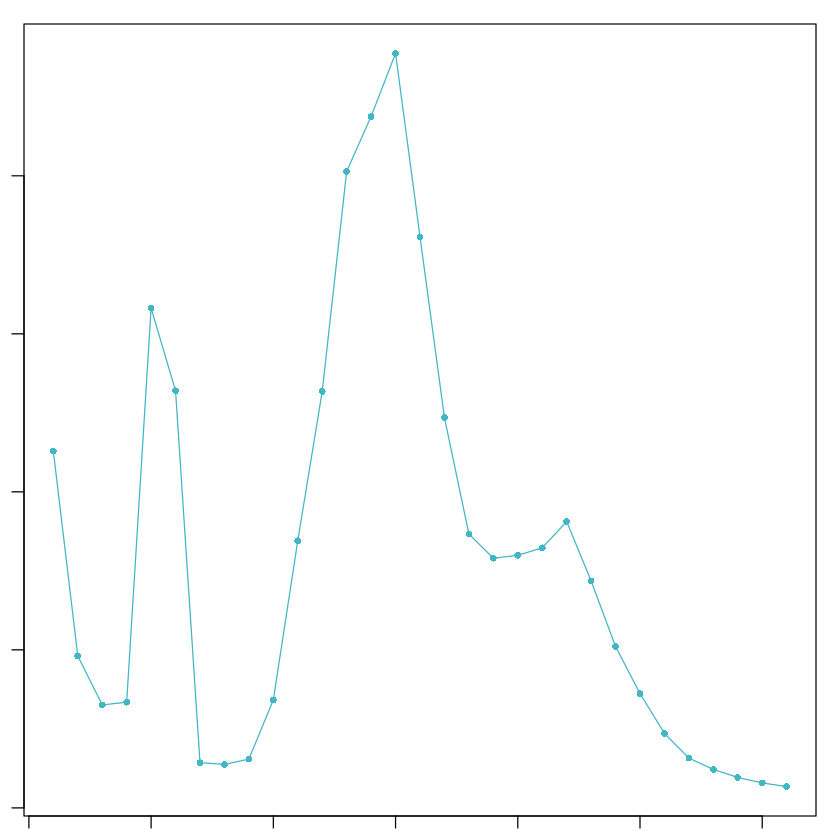

In [41]:
#doublet finder
sweep.res.list_E11 <- paramSweep_v3(E11_seurat, PCs = 1:40, sct = FALSE)
sweep.stats_E11 <- summarizeSweep(sweep.res.list_E11, GT = FALSE)
seurat_doub_E11 <- find.pK(sweep.stats_E11)

In [42]:
seurat_doub_E11

ParamID,pK,MeanBC,VarBC,BCmetric
<int>,<fct>,<dbl>,<dbl>,<dbl>
1,0.005,0.8466839,0.0007502384,1128.55313
2,0.01,0.8320541,0.0017307107,480.75865
3,0.02,0.7940186,0.0024365410,325.87943
4,0.03,0.7512284,0.0022468898,334.34145
5,0.04,0.7466567,0.0004722285,1581.13434
6,0.05,0.7067657,0.0005355591,1319.67829
7,0.06,0.6622075,0.0046349595,142.87234
8,0.07,0.6807138,0.0049436213,137.69538
9,0.08,0.6934764,0.0044935285,154.32781


In [48]:
annotations <- E11_seurat@meta.data$ClusteringResults

In [49]:
## Homotypic Doublet Proportion Estimate -------------------------------------------------------------------------------------
homotypic.prop <- modelHomotypic(annotations)           ## ex: annotations <- seu_kidney@meta.data$ClusteringResults
nExp_poi <- round(0.025*nrow(E11_seurat@meta.data))  ## Assuming 7.5% doublet formation rate - tailor for your dataset
nExp_poi.adj <- round(nExp_poi*(1-homotypic.prop))

In [50]:
seurat_phase_doub <- doubletFinder_v3(E11_seurat, PCs = 1:40, pN = 0.25, pK = 0.14, nExp = nExp_poi, reuse.pANN = FALSE, sct = FALSE)

[1] "Creating 3079 artificial doublets..."
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Computing pANN..."
[1] "Classifying doublets.."


In [ ]:
table(seurat_phase_doub@meta.data,DF.classifications_0.25_0.14_231 )

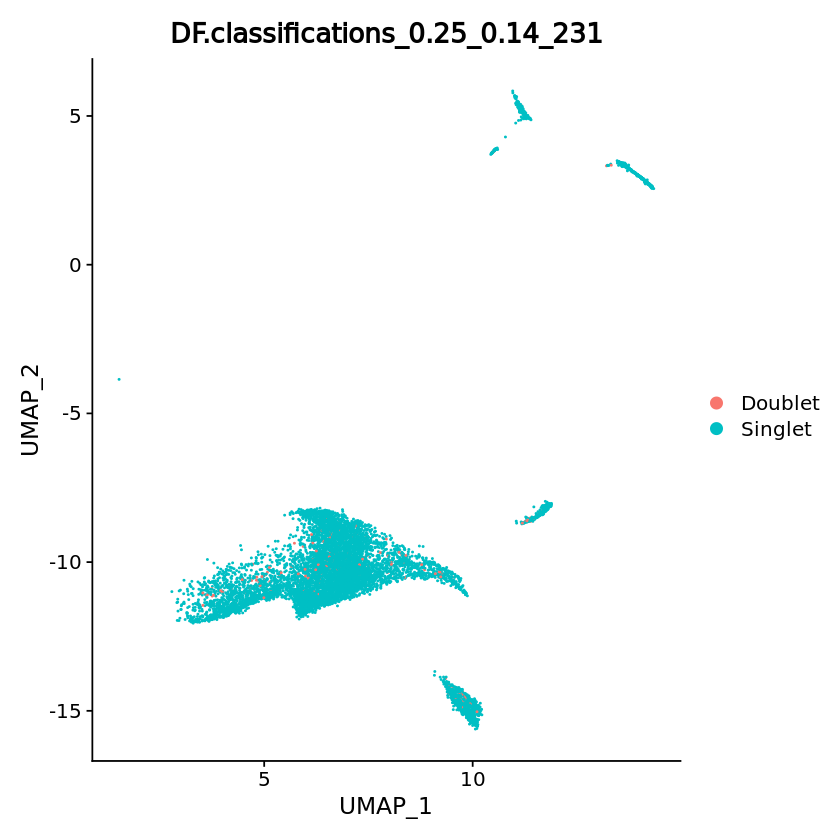

In [52]:
DimPlot(seurat_phase_doub, reduction = "umap", group.by = "DF.classifications_0.25_0.14_231")

In [17]:
#we will go from sctransform to integration procedure
#we could use harmony and not cca
integ_features <- SelectIntegrationFeatures(object.list = split_seurat, 
                                            nfeatures = 3000)

In [18]:
split_seurat.list <- lapply(X = split_seurat, FUN = function(x) {
    x <- ScaleData(x, features = integ_features, verbose = FALSE)
    x <- RunPCA(x, features = integ_features, verbose = FALSE)
})

In [ ]:
#Prepare the SCT list object for integration
split_seurat <- PrepSCTIntegration(object.list = split_seurat, 
                                   anchor.features = integ_features)

In [33]:
# Find best buddies - can take a while to run

integ_anchors <- FindIntegrationAnchors(object.list = split_seurat.list,
                                         reduction = "rpca",
                                        dims = 1:40,
                                        normalization.method = "SCT", 
                                        anchor.features = integ_features)


Computing within dataset neighborhoods

Finding all pairwise anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1144 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1433 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1213 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 388 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 547 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1690 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 878 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Fin

In [21]:
saveRDS(integ_anchors, "integ_anchors_rpca.rds")

In [12]:
# Find best buddies - can take a while to run
integ_anchors <- FindIntegrationAnchors(object.list = split_seurat, 
                                        normalization.method = "SCT", 
                                        anchor.features = integ_features)
saveRDS(integ_anchors, "integ_anchors.rds")

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 7027 anchors

Filtering anchors

	Retained 6521 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 27482 anchors

Filtering anchors

	Retained 9194 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 7296 anchors

Filtering anchors

	Retained 3110 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 14843 anchors

Filtering anchors

	Retained 8012 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 6536 anchors

Filtering anchors

	Retained 3612 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 18929 anchors

Filtering anchors

	Retained 14400 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 24287 anchors

Filtering anchors

	Retained 9724 anchors

Running CCA

Merging object

In [4]:
integ_anchors <- readRDS("integ_anchors.rds")

In [ ]:
seurat_integrated <- IntegrateData(anchorset = integ_anchors,
                                   normalization.method = "SCT")

In [ ]:
#integrate with leiden
#while integrating, we can try different algorithms and see what works best

In [34]:
seurat_integrated_leiden <- IntegrateData(anchorset = integ_anchors, 
                                   normalization.method = "SCT")

Merging dataset 2 into 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 into 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 8 into 5 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 7 into 10

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 3 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 9 into 5 6 8

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 3 2 4 into 5 6 8 9

Extracting anchors for merged samples

Finding integration vectors


In [35]:
saveRDS(seurat_integrated_leiden, "seurat_integrated_leiden.rds")

In [11]:
seurat_integrated_leiden <- readRDS("seurat_integrated_leiden.rds")

In [36]:
#try running PCA without integration


In [37]:
features <- SelectIntegrationFeatures(object.list = split_seurat, 
                                            nfeatures = 3200)

In [38]:
split_seurat <- PrepSCTIntegration(object.list = split_seurat, 
                                   anchor.features = features)

In [39]:
split_no_int <- RunPCA(object = split_seurat)

ERROR: Error in RowVar(x = object): Not compatible with requested type: [type=list; target=double].


PC_ 1 
Positive:  Gngt2, Fabp7, Neurod1, Otx2, Tulp1, Pik3r1, Meg3, Glo1, Btg2, Rpgrip1 
	   Unc119, Rom1, Cltb, Crx, Apoe, Amer2, Prdm1, Ccdc136, Ebpl, Dmd 
	   Ankrd33b, Arhgap31, Rax, Tmem158, Gnat2, Nxnl2, Ldha, Cplx2, Hes6, Platr17 
Negative:  Stmn2, Rtn1, Tuba1a, Ina, Tubb2b, Nnat, Tubb3, Tmsb10, Tfap2b, Gap43 
	   Mapt, Stmn3, Sox4, Tubb2a, Mllt11, Actb, Nefl, Cd24a, Sncg, Stmn4 
	   Tagln3, Basp1, Runx1t1, Elavl3, Pcsk1n, Isl1, Zfhx3, Kif5c, Celf4, Crmp1 
PC_ 2 
Positive:  Ccnd1, Id3, Hes5, Hes1, Fos, Dapl1, Ier2, Rps8, Rpl13, Dbi 
	   Rpl32, Id1, Rpl18a, Rps4x, Mdk, Rps18, Rps19, Rpsa, Sparc, Rps5 
	   Rpl8, Rps12, Rplp0, Eno1, Rplp2, Rpl41, Ckb, Rpl11, Dkk3, Rps2 
Negative:  Meg3, Gngt2, Neurod1, Fabp7, Otx2, Tulp1, Snap25, Rpgrip1, Unc119, Pik3r1 
	   Ccdc136, Cltb, Rom1, Ebpl, Malat1, Dmd, Crx, Tmsb4x, Map1b, Prdm1 
	   Amer2, Dpysl3, Cplx2, Glo1, Arhgap31, Cngb3, Nxnl2, Xist, Gnat2, Tmem158 
PC_ 3 
Positive:  Fos, Sncg, Gap43, Nefl, Ccnd1, Id3, Meg3, Gngt2, Map1b, S100a10 

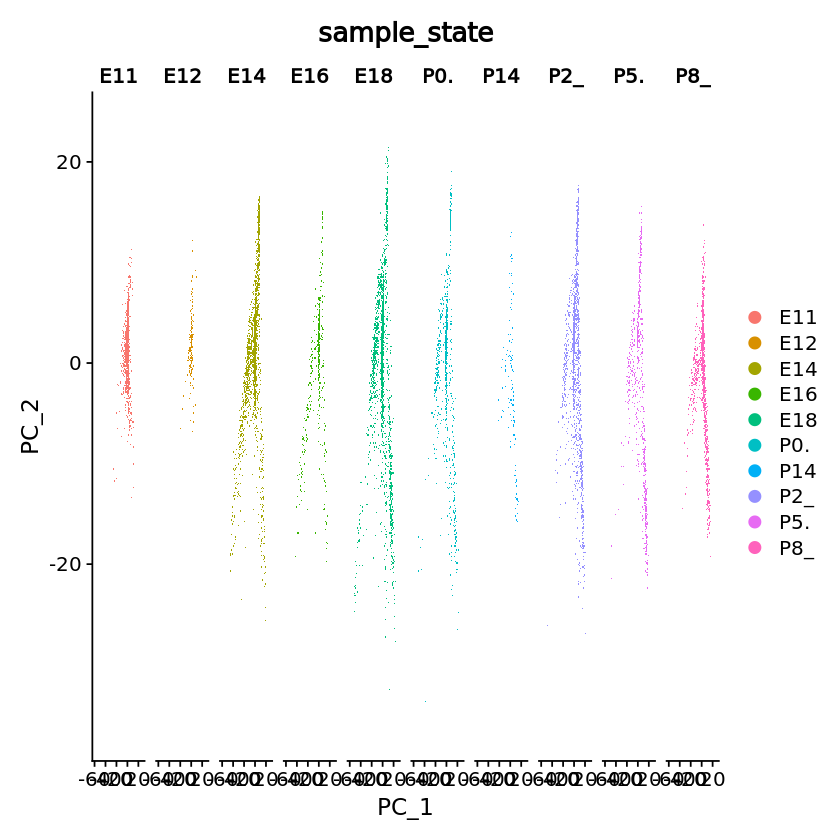

In [6]:
# Run PCA
seurat_integrated <- RunPCA(object = seurat_integrated)

 

In [15]:
seurat_phase

An object of class Seurat 
35760 features across 112642 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 1 dimensional reduction calculated: pca

In [31]:
DefaultAssay(seurat_phase) <- "SCT"

In [50]:
seurat_phase <- ScaleData(seurat_phase , verbose = FALSE)

In [32]:
seurat_phase <- RunPCA(object = seurat_phase)

PC_ 1 
Positive:  Gap43, Stmn2, Tubb3, Tuba1a, Sncg, Nefl, Tubb2b, Nnat, Ina, Rtn1 
	   Sox4, Actb, Tmsb10, Nefm, Tmsb4x, Sox11, Cd24a, Crabp1, Tfap2b, Mllt11 
	   Basp1, Stmn3, Tagln3, Ftl1, Igfbpl1, Tubb2a, Elavl4, Mapt, Isl1, Tubb5 
Negative:  Sag, Rho, Pdc, Gngt1, Pde6g, Rom1, Prph2, Nr2e3, Rcvrn, Cnga1 
	   Unc119, Tulp1, Gngt2, Nrl, Pde6b, Platr17, Cngb1, Gm11744, Ebpl, Gnb1 
	   Rp1, Rdh12, Rpgrip1, Fam57b, Opn1sw, A930003A15Rik, Tma7, Aipl1, Gnat1, Nxnl2 
PC_ 2 
Positive:  Fabp7, Apoe, Otx2, Hes5, Neurod4, Gadd45g, Neurod1, Fos, Dbi, Btg2 
	   Ckb, Hbb-y, Rps19, Rpl18a, Crym, Tyrobp, H3f3b, Hes6, Sat1, C1qc 
	   Rplp0, C1qb, Rpl32, C1qa, Rps27, Rps14, Hba-x, Ctss, Ier2, Rps18 
Negative:  Gap43, Sncg, Stmn2, Nefl, Ina, Tubb3, Nefm, Tubb2b, Tuba1a, Rtn1 
	   Sag, Rho, Stmn3, Mapt, Tmsb10, Tubb2a, S100a10, Mllt11, Ebf1, Elavl4 
	   Snhg11, Stmn4, Uchl1, Igfbpl1, Isl1, Crabp1, Pou6f2, Basp1, Pou4f1, Gngt1 
PC_ 3 
Positive:  Tyrobp, C1qc, C1qb, C1qa, Fcer1g, Ctss, Tmsb4x, Apoe, Ccl3

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



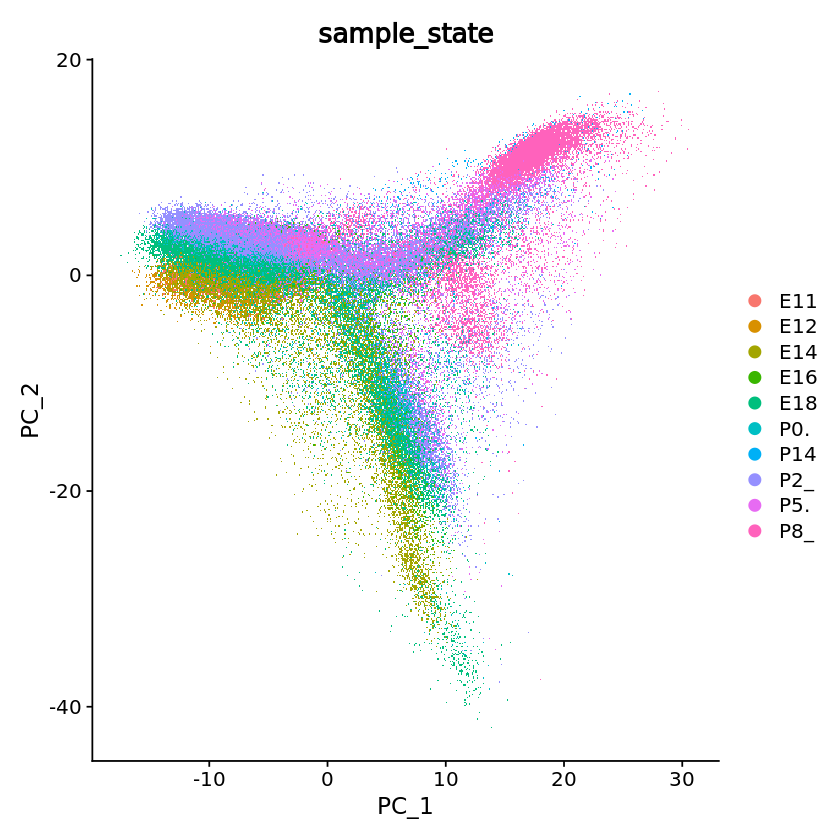

In [16]:
# Plot PCA
PCAPlot(seurat_phase,
        group.by = "sample_state")

In [17]:
# Run UMAP
#I need to figure how to include cluster if so I can show the cluster number while plotting

seurat_phase <- RunUMAP(seurat_phase, 
                             dims = 1:30,
                               reduction = "pca")
 


Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
15:52:26 UMAP embedding parameters a = 0.9922 b = 1.112

15:52:26 Read 112642 rows and found 30 numeric columns

15:52:26 Using Annoy for neighbor search, n_neighbors = 30

15:52:26 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:52:39 Writing NN index file to temp file /tmp/RtmpDmiBnX/file2aff11c962b4e

15:52:39 Searching Annoy index using 1 thread, search_k = 3000

15:53:22 Annoy recall = 100%

15:53:23 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbor

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



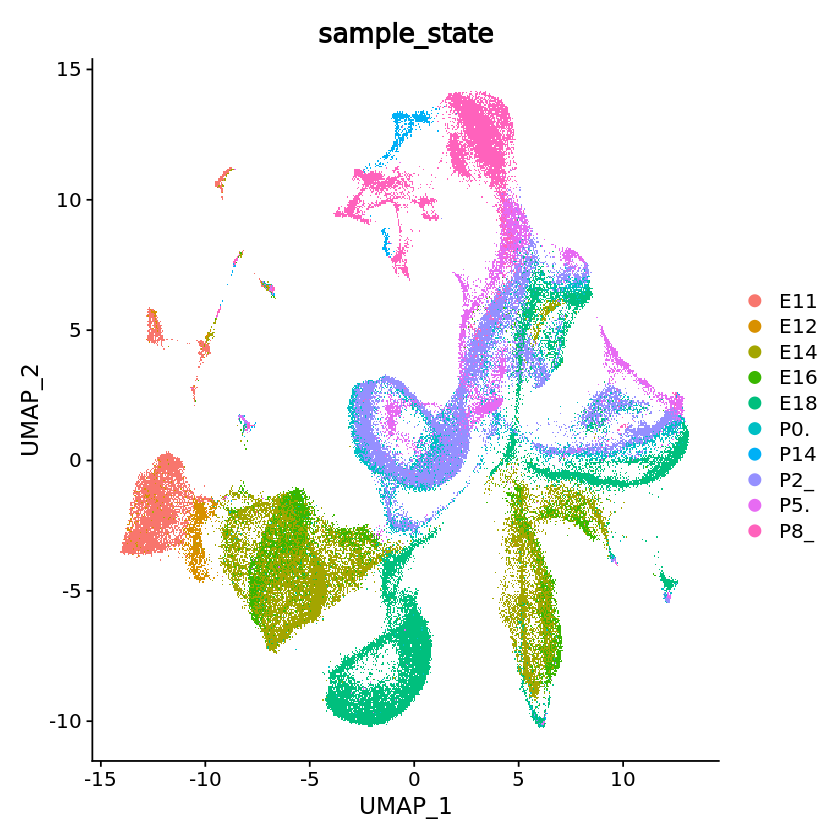

In [19]:
#without integration
# Plot UMAP                             
DimPlot(seurat_phase, group.by = "sample_state")

15:55:35 UMAP embedding parameters a = 0.9922 b = 1.112

15:55:35 Read 112642 rows and found 50 numeric columns

15:55:35 Using Annoy for neighbor search, n_neighbors = 30

15:55:35 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:55:54 Writing NN index file to temp file /tmp/Rtmpn8dzhP/file103bc1ef1b6

15:55:54 Searching Annoy index using 1 thread, search_k = 3000

15:56:50 Annoy recall = 100%

15:56:51 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

15:56:57 Initializing from normalized Laplacian + noise (using irlba)

15:57:03 Commencing optimization for 200 epochs, with 5501554 positive edges

15:59:58 Optimization finished

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FAL

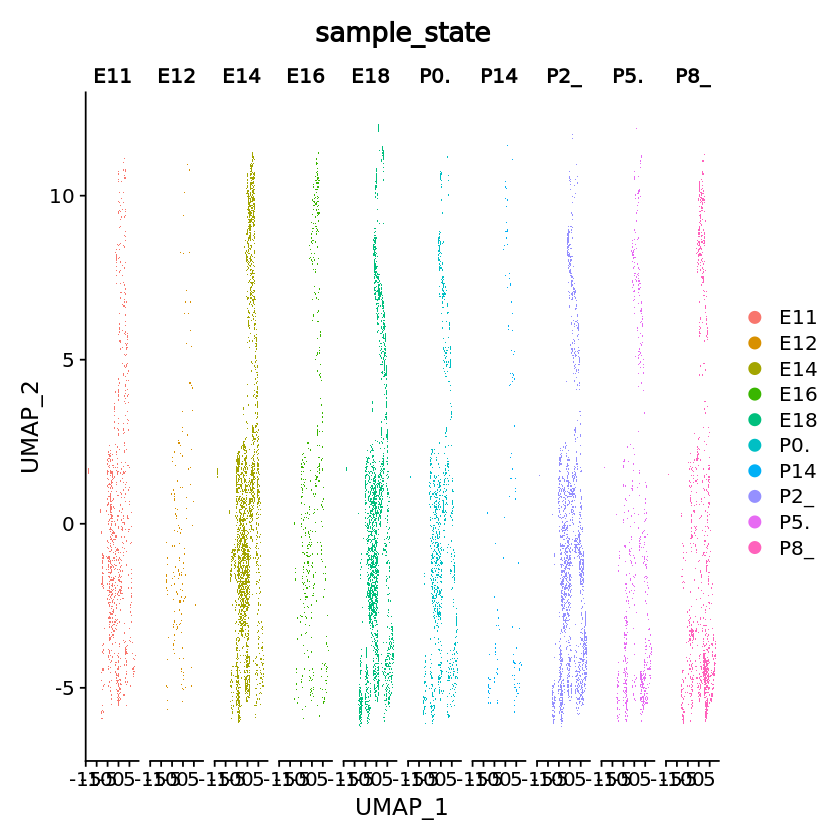

In [31]:
# Run UMAP


seurat_integrated <- RunUMAP(seurat_integrated, 
                             dims = 1:50,
                               reduction = "pca")

# Plot UMAP                             
DimPlot(seurat_integrated,
       group.by = "sample_state",
       split.by = "sample_state") 


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



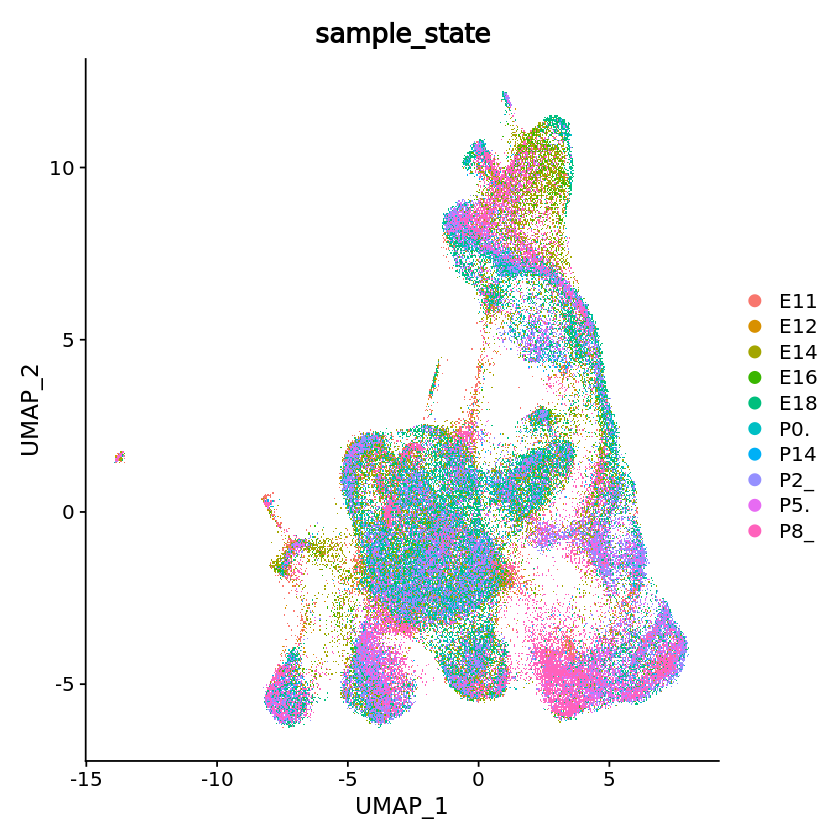

In [32]:
#with integration
DimPlot(seurat_integrated, group.by = "sample_state")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



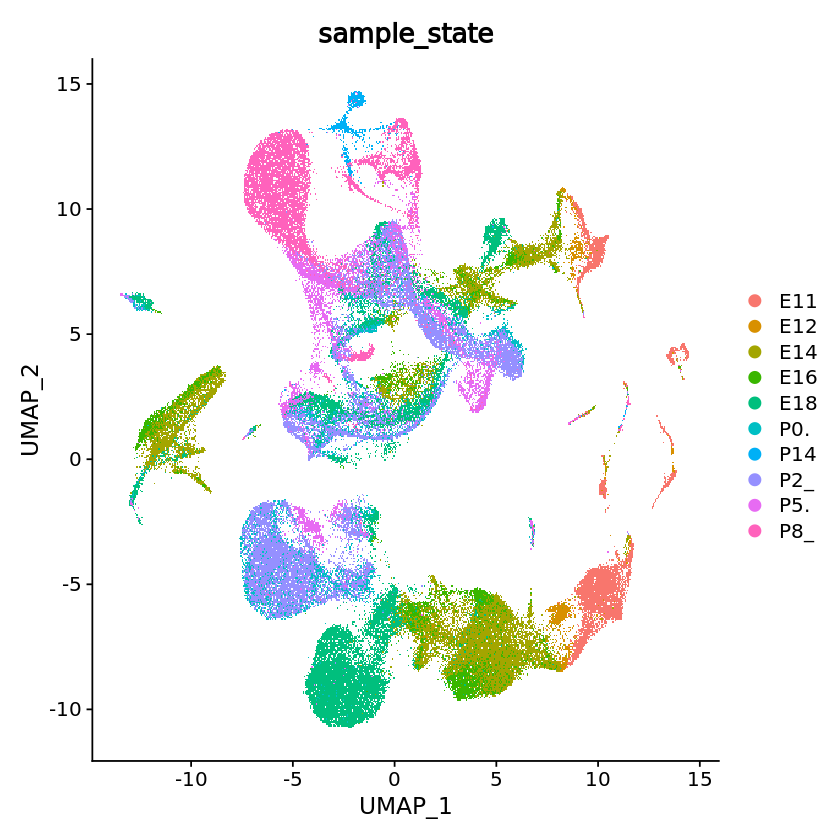

In [39]:
DimPlot(seurat_phase, group.by = "sample_state")

In [ ]:
saveRDS(seurat_integrated, "seurat_integrated.rds")

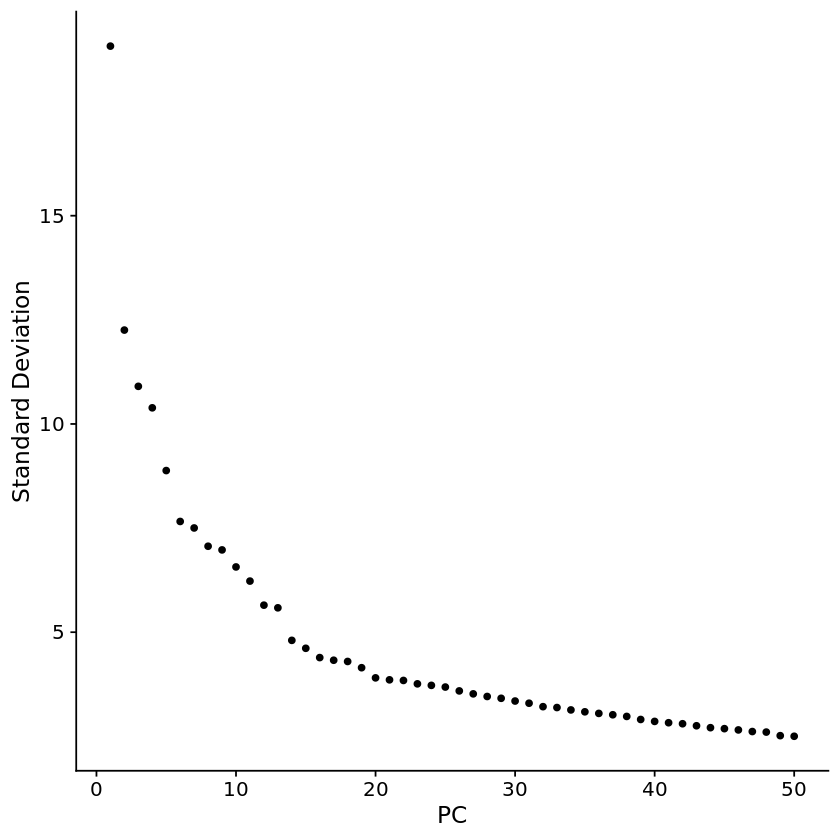

In [36]:
# Plot the elbow plot to determine pcs to use
ElbowPlot(object = seurat_phase, 
          ndims = 50)

In [36]:
seurat_integrated_leiden <- ScaleData(seurat_integrated_leiden, verbose = FALSE)
seurat_integrated_leiden <- RunPCA(seurat_integrated_leiden, verbose = FALSE)
seurat_integrated_leiden <- RunUMAP(seurat_integrated_leiden, dims = 1:40)

10:35:16 UMAP embedding parameters a = 0.9922 b = 1.112

10:35:16 Read 112642 rows and found 40 numeric columns

10:35:16 Using Annoy for neighbor search, n_neighbors = 30

10:35:16 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:35:30 Writing NN index file to temp file /tmp/RtmpGrBWAw/file24db216ef638b

10:35:30 Searching Annoy index using 1 thread, search_k = 3000

10:36:18 Annoy recall = 100%

10:36:19 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

10:36:24 Initializing from normalized Laplacian + noise (using irlba)

10:36:44 Commencing optimization for 200 epochs, with 5284308 positive edges

10:39:38 Optimization finished



Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



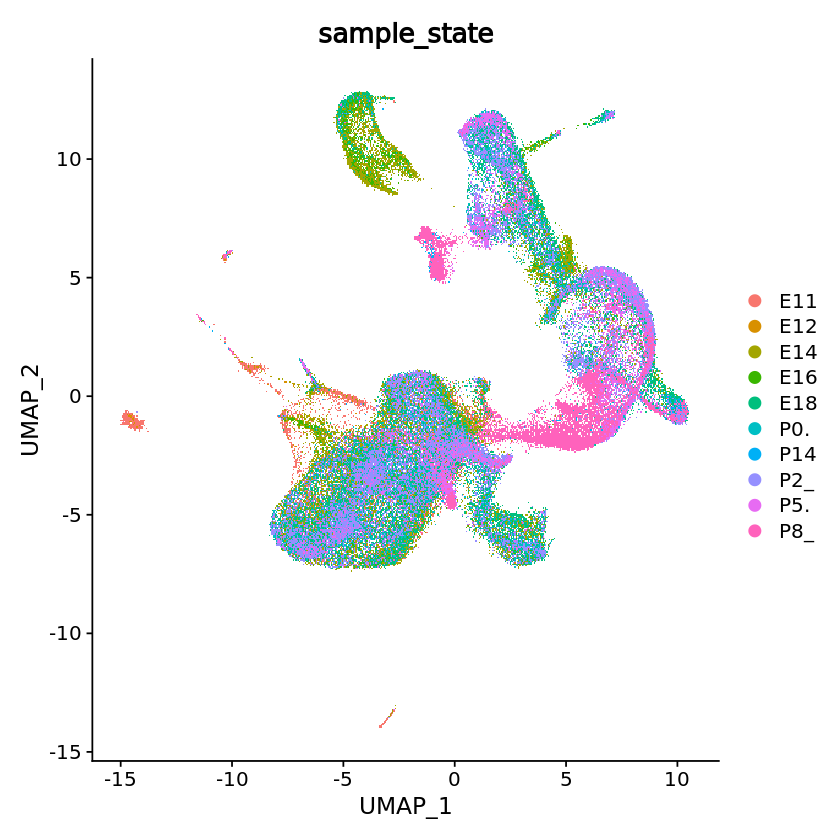

In [37]:
DimPlot(seurat_integrated_leiden , group.by = "sample_state")

In [38]:
# Determine the K-nearest neighbor graph
seurat_integrated_leiden <- FindNeighbors(object = seurat_integrated_leiden, 
                                dims = 1:40)

Computing nearest neighbor graph

Computing SNN



In [4]:
reticulate::use_python("/home/soladejo/miniconda3/envs/ArchR_Env/bin/python3")

In [45]:
# Determine the K-nearest neighbor graph
# Plot the elbow plot to determine pcs to use

seurat_phase <- FindNeighbors(object = seurat_phase, 
                                dims = 1:30)

Computing nearest neighbor graph

Computing SNN



In [6]:
options(future.globals.maxSize = 4000 * 1024^2)

In [ ]:
seurat_integrated_leiden <- FindClusters(object = seurat_integrated_leiden,
                                        algorithm = 4,
                                        resolution = c(0.2,0.4,0.8,1.0,1.4))

In [37]:
DefaultAssay(seurat_phase) <- "SCT"

In [38]:
seurat_phase

An object of class Seurat 
35760 features across 112642 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [47]:
seurat_phase <- FindClusters(object = seurat_phase,
                                        algorithm = 2,
                                    )

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 112642
Number of edges: 4080216

Running Louvain algorithm with multilevel refinement...
Maximum modularity in 10 random starts: 0.9352
Number of communities: 42
Elapsed time: 41 seconds


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



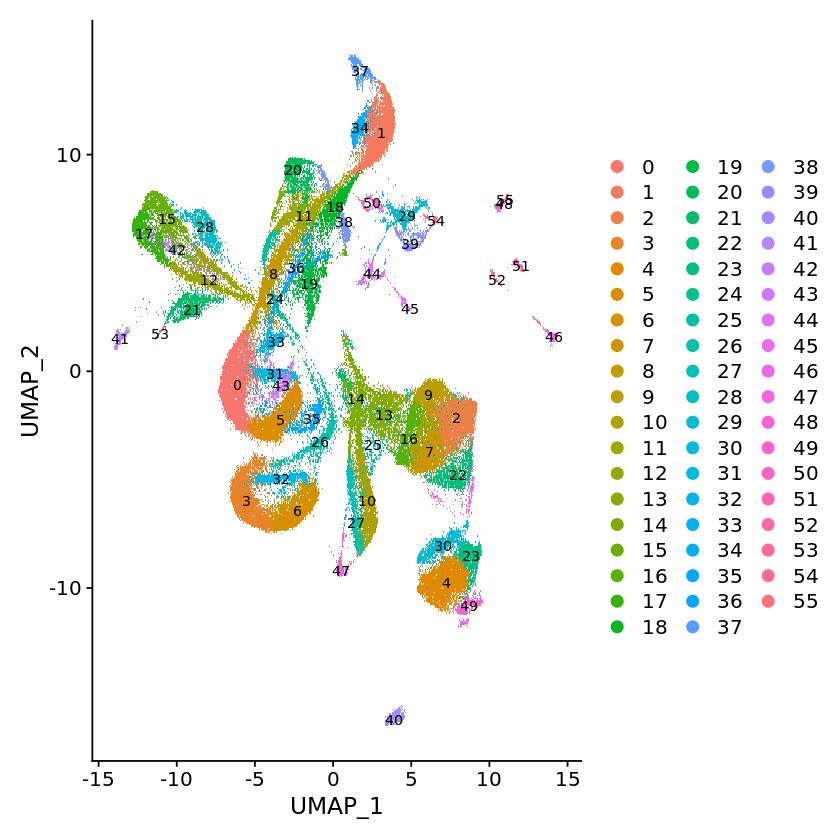

In [11]:
# Plot the UMAP
DimPlot(seurat_phase,
        reduction = "umap",
        label = TRUE,
        label.size = 3)

In [48]:
seurat_phase

An object of class Seurat 
35760 features across 112642 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [56]:
saveRDS(seurat_phase,"seurat_phase_new.rds")

In [12]:
saveRDS(seurat_integrated, "seurat_integrated.rds")

In [2]:
seurat_phase_new <- readRDS("seurat_phase_new.rds")

In [4]:
# Assign identity of clusters, you can tune the resolution
Idents(object = seurat_phase_integrated) <- "integrated_snn_res.1"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



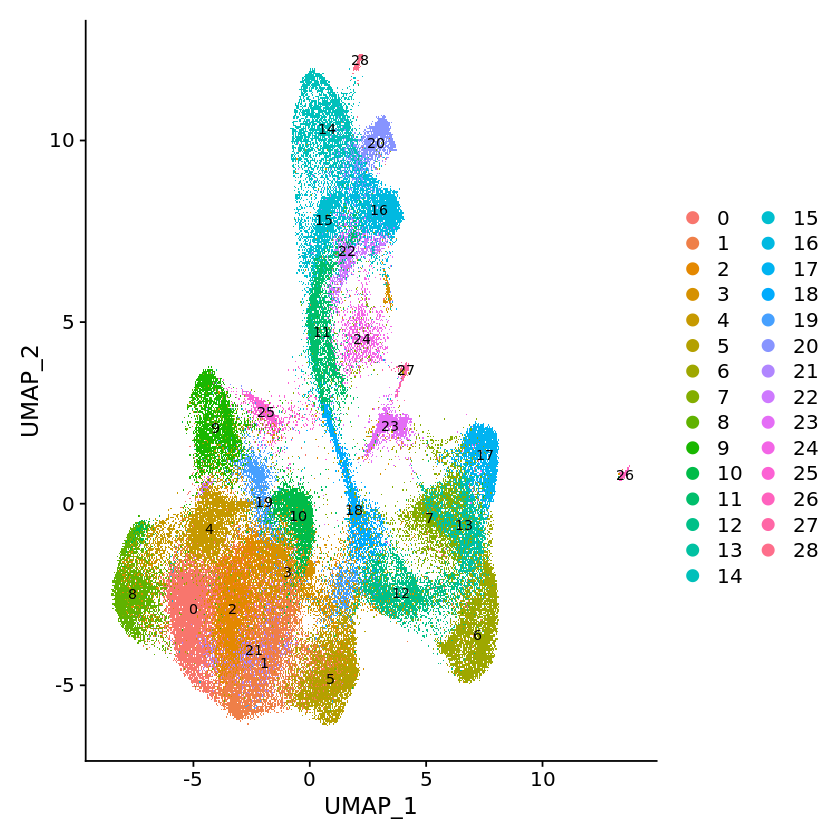

In [5]:
# Plot the UMAP
DimPlot(seurat_phase_integrated,
        reduction = "umap",
        label = TRUE,
        label.size = 3)

In [45]:
# Assign identity of clusters
Idents(object = seurat_phase) <- "SCT_snn_res.0.8"

In [11]:
seurat_phase_new

An object of class Seurat 
35760 features across 112642 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [40]:
# Assign identity of clusters
Idents(object = seurat_integrated_leiden) <- "integrated_snn_res.0.4"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



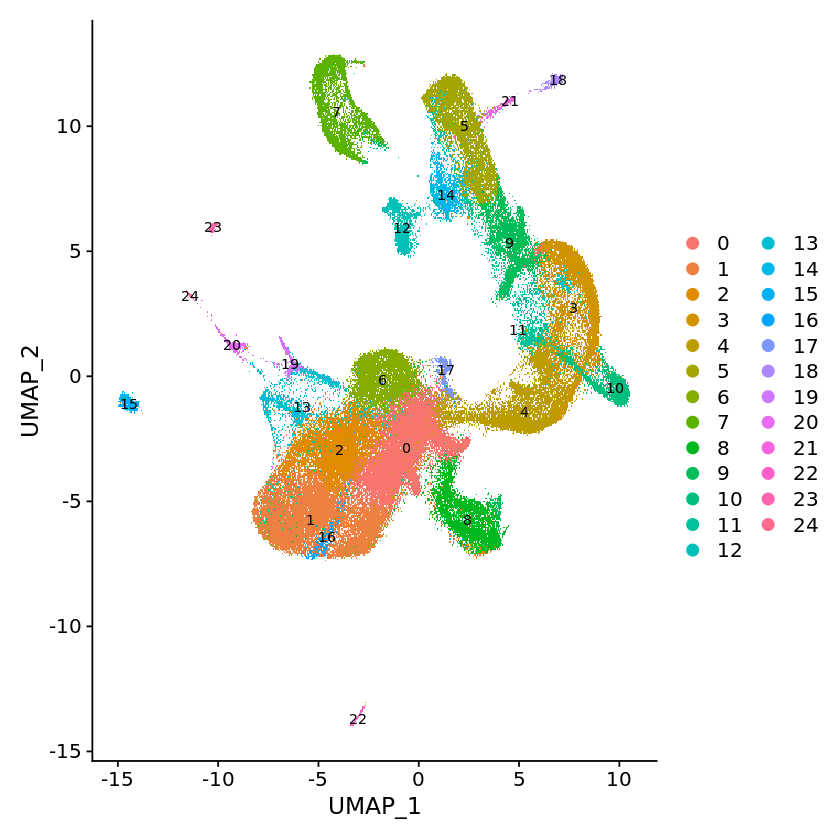

In [42]:
# Plot the UMAP
DimPlot(seurat_integrated_leiden,
        reduction = "umap",
        
        label = TRUE,
        label.size = 3)

In [3]:
seurat_phase_new

An object of class Seurat 
35760 features across 112642 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [4]:
options(repr.plot.width = 10, repr.plot.height = 8)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



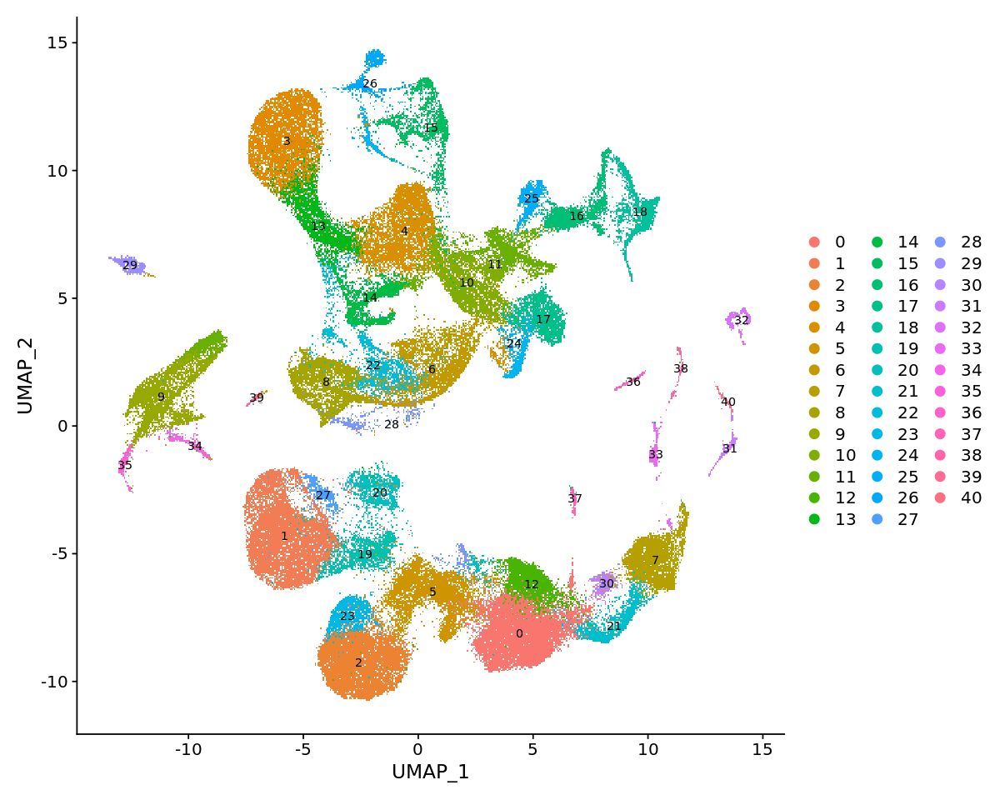

In [5]:
# Plot the UMAP
DimPlot(seurat_phase_new,
        reduction = "umap",
        label = TRUE,
        label.size = 3)

In [47]:
seurat_phase@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample,nCount_SCT,nFeature_SCT,S.Score,G2M.Score,Phase,sample_state,SCT_snn_res.0.4,SCT_snn_res.0.6,SCT_snn_res.0.8,SCT_snn_res.1,SCT_snn_res.1.4,seurat_clusters
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
"""E11.AAACCTGAGATGTAAC.1""",SeuratProject,2794,1549,0.9256651,0.014674302,"""E11.AAACCTGAGATGTAAC.1""",ctrl,2242,1533,0.04478495,-0.005480254,S,E11,5,7,7,6,8,8
"""E11.AAACCTGAGCCCAGCT.1""",SeuratProject,11600,1889,0.8060686,0.004741379,"""E11.AAACCTGAGCCCAGCT.1""",ctrl,2952,416,0.01950329,0.103778947,G2M,E11,23,28,32,39,44,44
"""E11.AAACCTGAGGCAATTA.1""",SeuratProject,3548,1848,0.9202020,0.015501691,"""E11.AAACCTGAGGCAATTA.1""",ctrl,2401,1738,0.05246152,0.319038444,G2M,E11,5,7,7,6,8,8
"""E11.AAACCTGAGTAGCGGT.1""",SeuratProject,3838,1935,0.9170158,0.014069828,"""E11.AAACCTGAGTAGCGGT.1""",ctrl,2440,1772,0.17249993,-0.098862250,S,E11,5,7,7,6,8,8
"""E11.AAACCTGAGTGGAGTC.1""",SeuratProject,4612,2139,0.9089278,0.014744146,"""E11.AAACCTGAGTGGAGTC.1""",ctrl,2406,1682,-0.03080314,0.215619976,G2M,E11,5,7,7,6,8,8
"""E11.AAACCTGCAAGTTGTC.1""",SeuratProject,3296,1723,0.9199253,0.023968447,"""E11.AAACCTGCAAGTTGTC.1""",ctrl,2342,1654,-0.01293481,0.060667339,G2M,E11,21,27,31,36,42,42
"""E11.AAACCTGCACCCATTC.1""",SeuratProject,3676,1806,0.9134291,0.011153428,"""E11.AAACCTGCACCCATTC.1""",ctrl,2396,1684,0.11746743,-0.015700995,S,E11,5,7,7,6,8,8
"""E11.AAACCTGCACGGATAG.1""",SeuratProject,3615,1765,0.9124918,0.013001383,"""E11.AAACCTGCACGGATAG.1""",ctrl,2360,1634,0.03260440,0.007622207,S,E11,5,7,7,6,8,8
"""E11.AAACCTGCAGATCCAT.1""",SeuratProject,2680,1417,0.9192666,0.011567164,"""E11.AAACCTGCAGATCCAT.1""",ctrl,2204,1411,0.11951732,0.152665449,G2M,E11,5,23,21,22,31,31


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



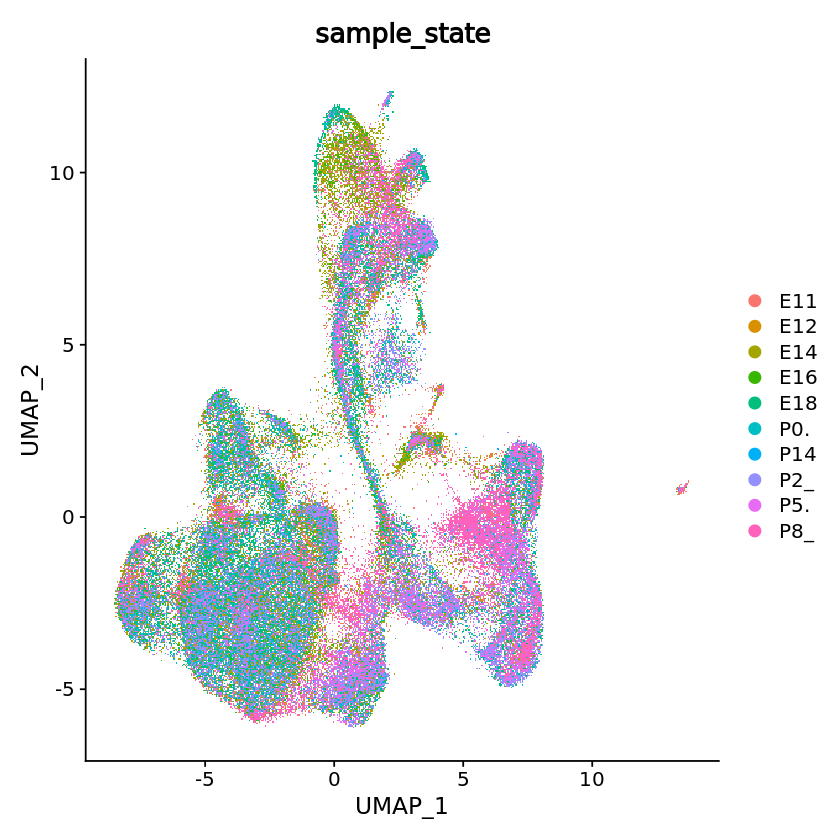

In [17]:
# Assign identity of clusters
#Idents(object = seurat_integrated) <- "integrated_snn_res.1"

# Plot the UMAP
DimPlot(seurat_phase_integrated,
        reduction = "umap",
       group.by = "sample_state")

In [7]:
seurat_phase_new@meta.data$sample_state <- gsub('[._]',"", seurat_phase_new@meta.data$sample_state)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



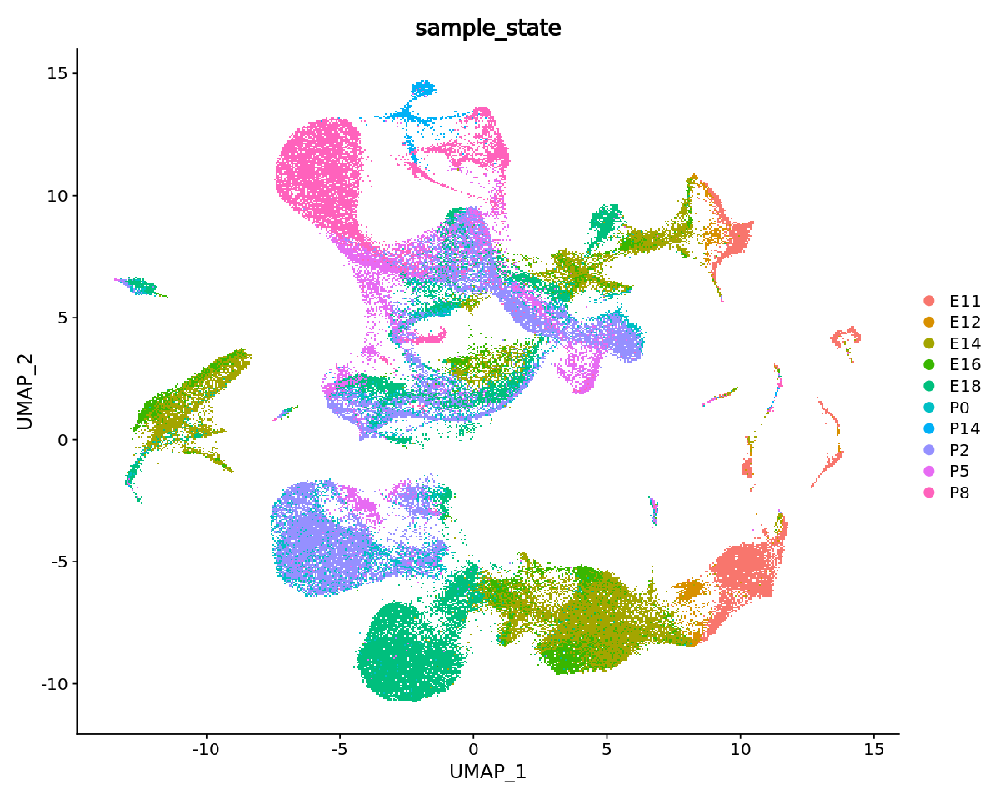

In [8]:
# Assign identity of clusters
#Idents(object = seurat_integrated) <- "integrated_snn_res.1"
#this was my final set of clusters
# Plot the UMAP
DimPlot(seurat_phase_new,
        reduction = "umap",
       group.by = "sample_state")

In [49]:
saveRDS(seurat_phase, "seurat_phase_new.rds")

In [1]:
seurat_phase_new <- readRDS("seurat_phase_new.rds")

In [18]:
head(seurat_integrated@meta.data
    )

,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample,S.Score,G2M.Score,Phase,sample_state,nCount_SCT,nFeature_SCT,integrated_snn_res.0.4,integrated_snn_res.0.6,integrated_snn_res.0.8,integrated_snn_res.1,integrated_snn_res.1.4,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
"""E11.AAACCTGAGATGTAAC.1""",SeuratProject,2794,1549,0.9256651,0.014674302,"""E11.AAACCTGAGATGTAAC.1""",ctrl,0.10744264,0.07446449,S,E11,2796,1548,1,2,1,3,26,26
"""E11.AAACCTGAGCCCAGCT.1""",SeuratProject,11600,1889,0.8060686,0.004741379,"""E11.AAACCTGAGCCCAGCT.1""",ctrl,0.09703368,0.33803304,G2M,E11,4054,664,1,2,1,7,4,4
"""E11.AAACCTGAGGCAATTA.1""",SeuratProject,3548,1848,0.9202020,0.015501691,"""E11.AAACCTGAGGCAATTA.1""",ctrl,0.10537597,0.66581846,G2M,E11,3310,1847,14,17,19,23,27,27
"""E11.AAACCTGAGTAGCGGT.1""",SeuratProject,3838,1935,0.9170158,0.014069828,"""E11.AAACCTGAGTAGCGGT.1""",ctrl,0.33759034,-0.07400795,S,E11,3421,1934,3,1,2,0,0,0
"""E11.AAACCTGAGTGGAGTC.1""",SeuratProject,4612,2139,0.9089278,0.014744146,"""E11.AAACCTGAGTGGAGTC.1""",ctrl,-0.05588179,0.46404311,G2M,E11,3607,2124,3,1,2,0,0,0
"""E11.AAACCTGCAAGTTGTC.1""",SeuratProject,3296,1723,0.9199253,0.023968447,"""E11.AAACCTGCAAGTTGTC.1""",ctrl,-0.05196632,0.20960160,G2M,E11,3176,1723,6,9,12,11,14,14


### Clustering QC

In [18]:
n_cells <- FetchData(seurat_integrated, 
                     vars = c("ident", "sample_state")) %>%
        dplyr::count(ident, sample_state) %>%
        tidyr::spread(ident, n)

# View table
View(n_cells)

sample_state,0,1,2,3,4,5,6,7,8,⋯,16,17,18,19,20,21,22,23,24,25
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
E11,1225,2365,926,394,867,372,101,10,122,⋯,31,44,103,494,160,12,31,141,61,NA
E12,273,293,198,79,102,88,16,1,20,⋯,3,8,29,86,21,NA,15,13,12,NA
E14,2785,1717,2605,2190,1653,1660,406,1557,389,⋯,1152,224,608,680,529,65,455,105,78,3
E16,509,208,293,491,276,122,178,193,88,⋯,197,95,95,97,37,61,85,12,18,NA
E18,1926,595,2433,1454,1135,2047,1222,1126,640,⋯,789,1121,579,108,522,256,285,25,4,137
P0.,1054,404,1040,787,517,417,591,497,297,⋯,324,398,319,32,109,207,123,15,5,52
P14,112,144,18,6,157,48,96,43,132,⋯,16,92,4,15,9,19,3,8,36,1
P2_,1431,587,1463,1196,475,681,1827,1684,1012,⋯,525,506,660,89,152,415,148,20,3,49
P5.,627,124,193,204,325,174,740,523,1079,⋯,79,369,168,75,81,163,19,25,12,17


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



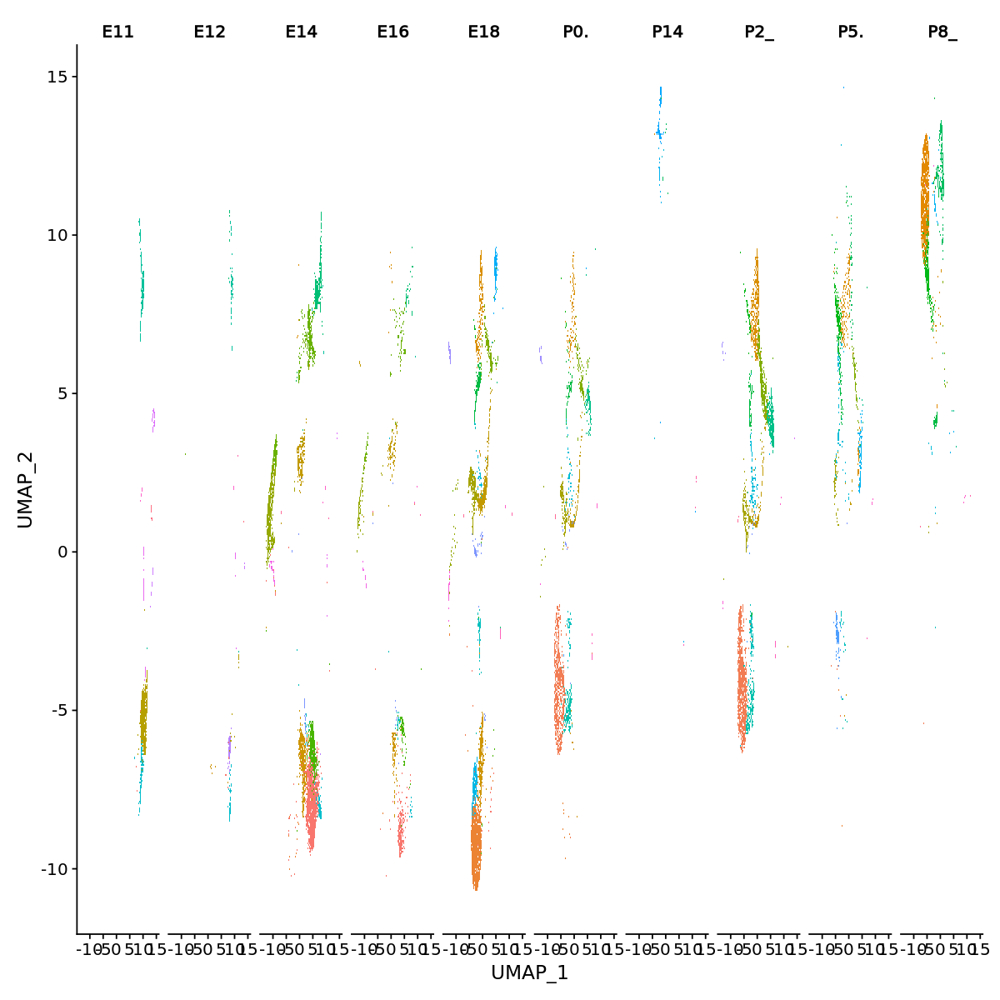

In [53]:
# UMAP of cells in each cluster by sample
DimPlot(seurat_phase, 
        label = FALSE, 
        split.by = "sample_state")  + NoLegend()

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



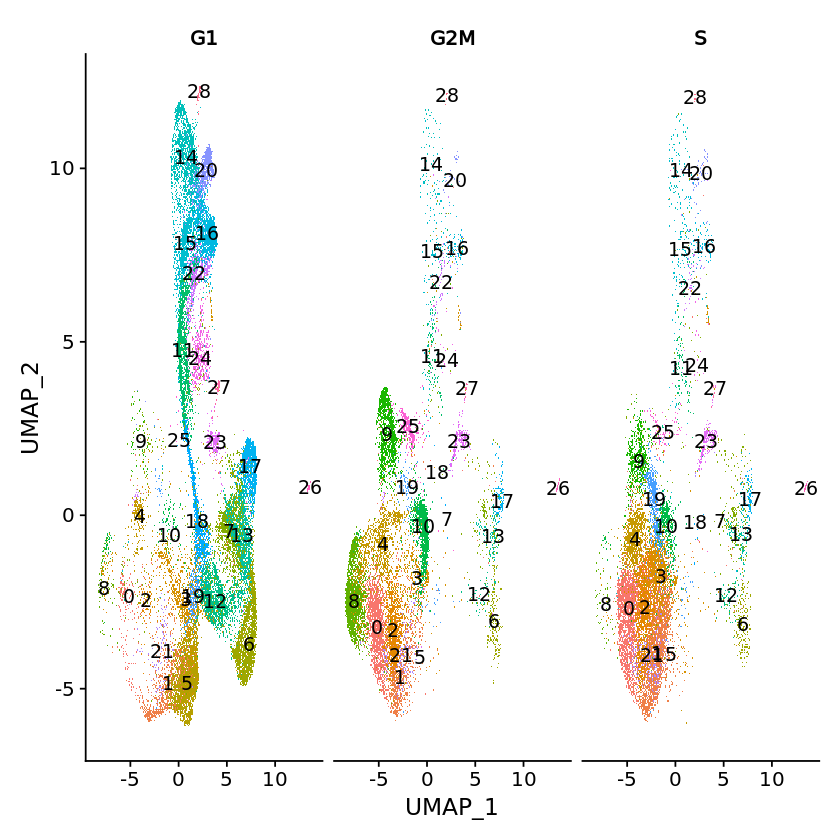

In [26]:
# Explore whether clusters segregate by cell cycle phase
DimPlot(seurat_phase_integrated,
        label = TRUE, 
        split.by = "Phase")  + NoLegend()

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



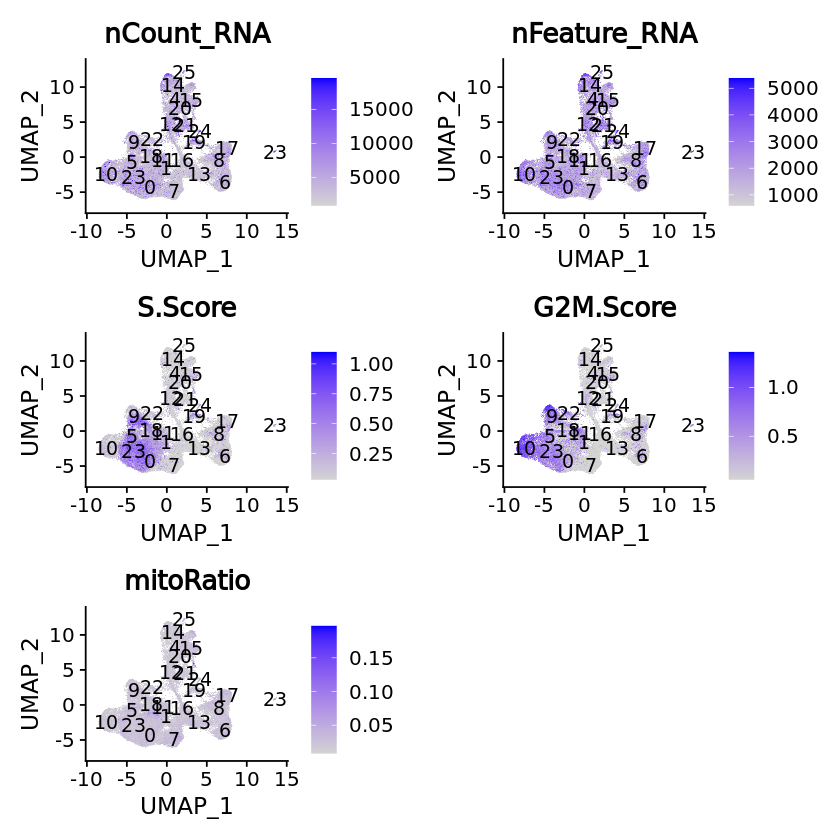

In [21]:
# Determine metrics to plot present in seurat_integrated@meta.data
#we want to check of theses metrics results in variation in clustering
metrics <-  c("nCount_RNA", "nFeature_RNA", "S.Score", "G2M.Score", "mitoRatio")

FeaturePlot(seurat_integrated, 
            reduction = "umap", 
            features = metrics,
            pt.size = 0.6, 
            order = TRUE,
            min.cutoff = 'q10',
            label = TRUE)

In [22]:
#check genes expressed in PC/clustering by pc score
# Defining the information in the seurat object of interest
columns <- c(paste0("PC_", 1:16),
            "ident",
            "UMAP_1", "UMAP_2")

# Extracting this data from the seurat object
pc_data <- FetchData(seurat_integrated, 
                     vars = columns)

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”
Warning message:
“The `guide` argument in `scale_*()` cannot be `FALSE`. This was deprecated in ggplot2 3.3.4.
ℹ Please use "none" instead.”


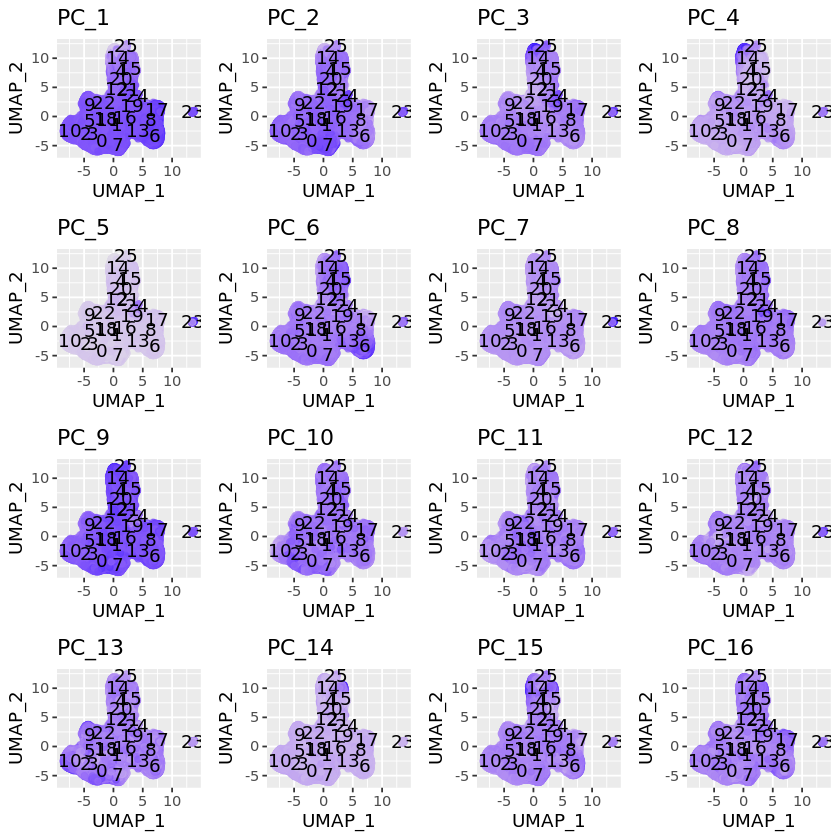

In [23]:
#In the UMAP plots below, the cells are colored by their PC 
#score for each respective principal component.
# Adding cluster label to center of cluster on UMAP
umap_label <- FetchData(seurat_integrated, 
                        vars = c("ident", "UMAP_1", "UMAP_2"))  %>%
  group_by(ident) %>%
  summarise(x=mean(UMAP_1), y=mean(UMAP_2))
  
# Plotting a UMAP plot for each of the PCs
map(paste0("PC_", 1:16), function(pc){
        ggplot(pc_data, 
               aes(UMAP_1, UMAP_2)) +
                geom_point(aes_string(color=pc), 
                           alpha = 0.7) +
                scale_color_gradient(guide = FALSE, 
                                     low = "grey90", 
                                     high = "blue")  +
                geom_text(data=umap_label, 
                          aes(label=ident, x, y)) +
                ggtitle(pc)
}) %>% 
        plot_grid(plotlist = .)

In [55]:
# Examine PCA results
#what are the genes driving the pc
print(seurat_phase[["pca"]], dims = 6:10, nfeatures = 5)

PC_ 6 
Positive:  Fabp7, Sfrp2, Crybb3, Cryaa, Aldh1a1 
Negative:  Hes5, Pcp4, Crym, Ckb, Fos 
PC_ 7 
Positive:  Opn1sw, Pcp4, Pcp2, Pde6h, Guca1a 
Negative:  Fabp7, Gap43, Rho, Hes5, Sag 
PC_ 8 
Positive:  Tfap2b, Fabp7, Nnat, Pcp4, Sox4 
Negative:  Opn1sw, Gap43, Pde6h, Guca1a, Sncg 
PC_ 9 
Positive:  Pcp4, Pcp2, Fabp7, Gng13, Grm6 
Negative:  Opn1sw, Tfap2b, Nnat, Sox4, Pde6h 
PC_ 10 
Positive:  Crybb3, Igfbp7, Cryaa, Cryab, Tfap2b 
Negative:  Pcp2, Pcp4, Aldh1a1, Gng13, Gap43 


In [25]:
#With the cells clustered, we can explore the cell type identities by looking for known markers. 
#The UMAP plot with clusters marked is shown, 
#followed by the different cell types expected.

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



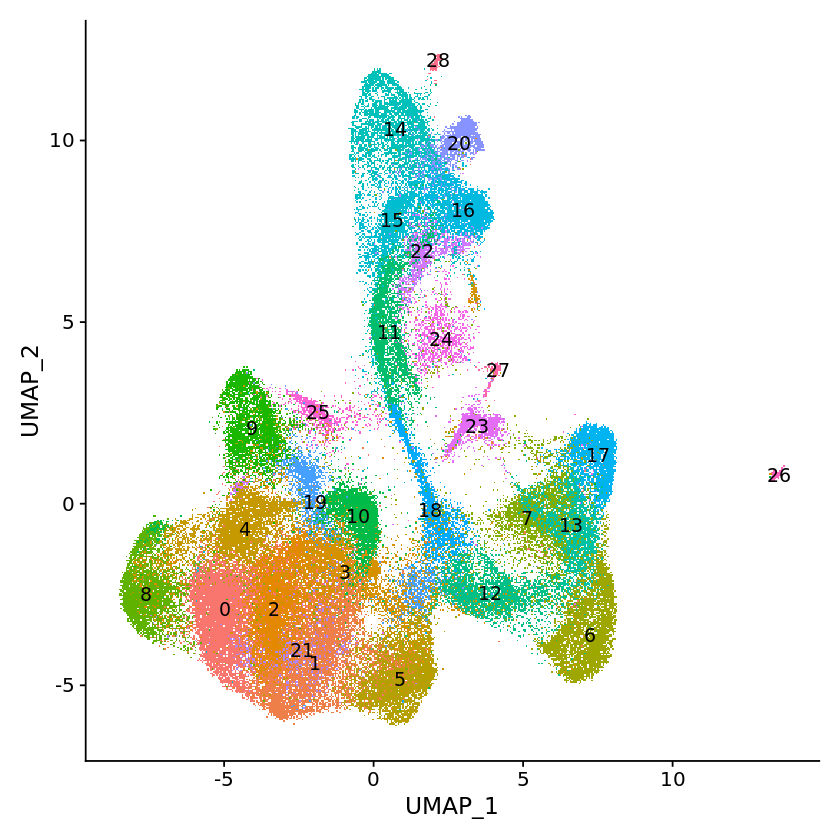

In [27]:
DimPlot(object = seurat_phase_integrated, 
        reduction = "umap", 
        label = TRUE) + NoLegend()

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



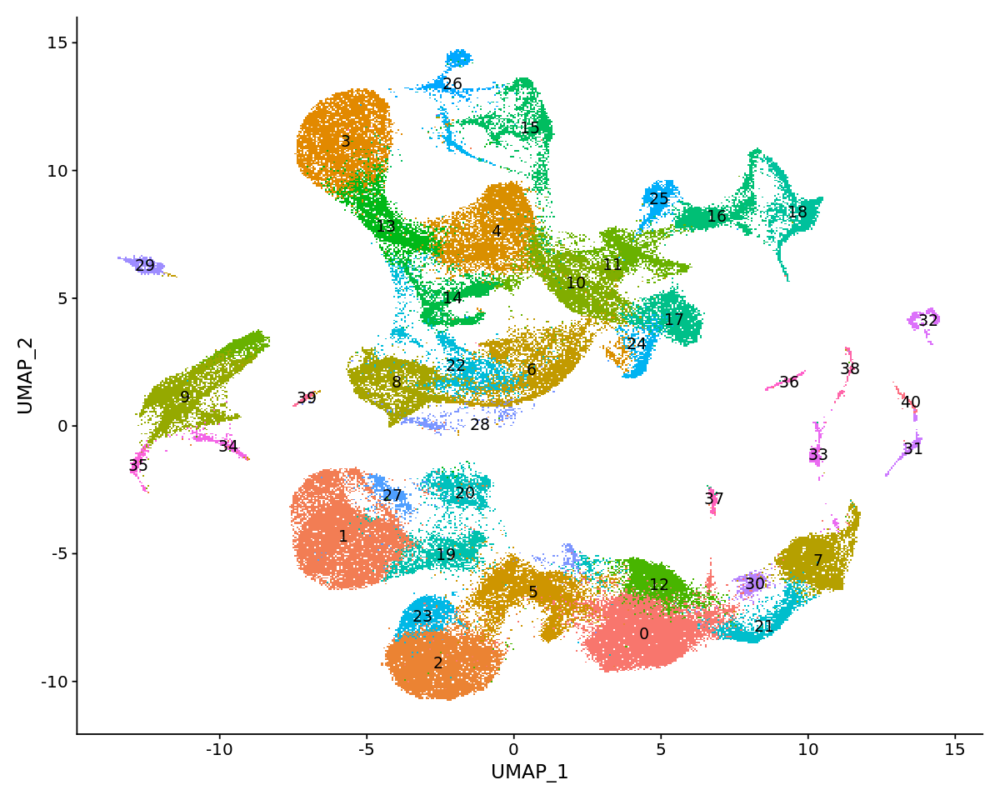

In [9]:
DimPlot(object = seurat_phase_new, 
        reduction = "umap", 
        label = TRUE) + NoLegend()

In [27]:
# Select the RNA counts slot to be the default assay
DefaultAssay(seurat_integrated) <- "RNA"

# Normalize RNA data for visualization purposes
seurat_integrated <- NormalizeData(seurat_integrated, verbose = FALSE)

In [56]:
# Select the RNA counts slot to be the default assay
DefaultAssay(seurat_phase) <- "RNA"

# Normalize RNA data for visualization purposes
seurat_phase <- NormalizeData(seurat_phase, verbose = FALSE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



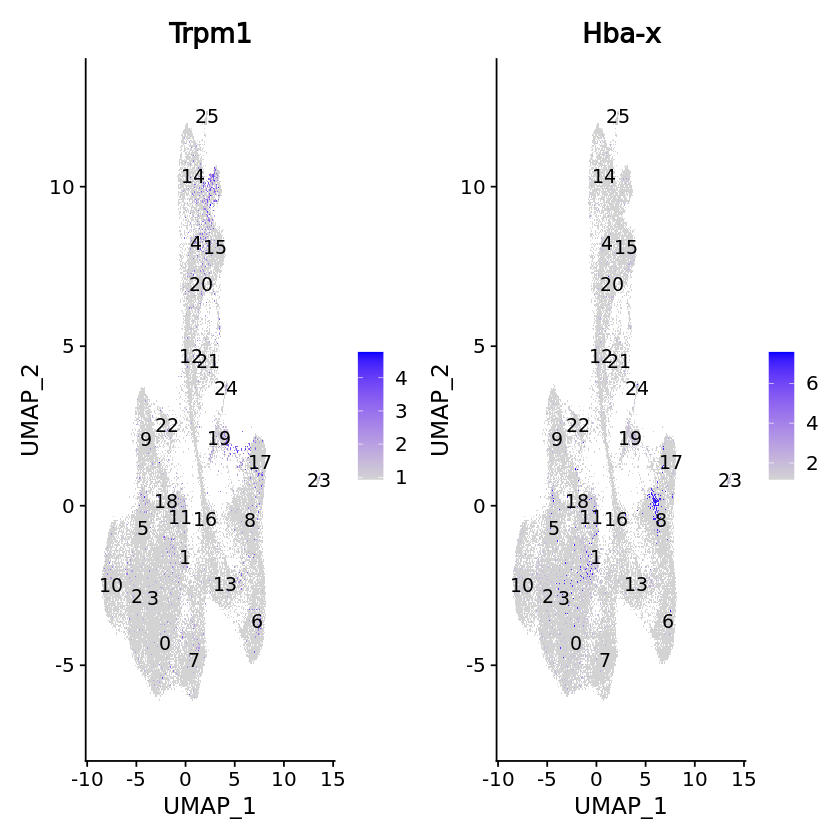

In [28]:
#CD14 monocyte marker
FeaturePlot(seurat_integrated, 
            reduction = "umap", 
            features = c("Trpm1", "Hba-x"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



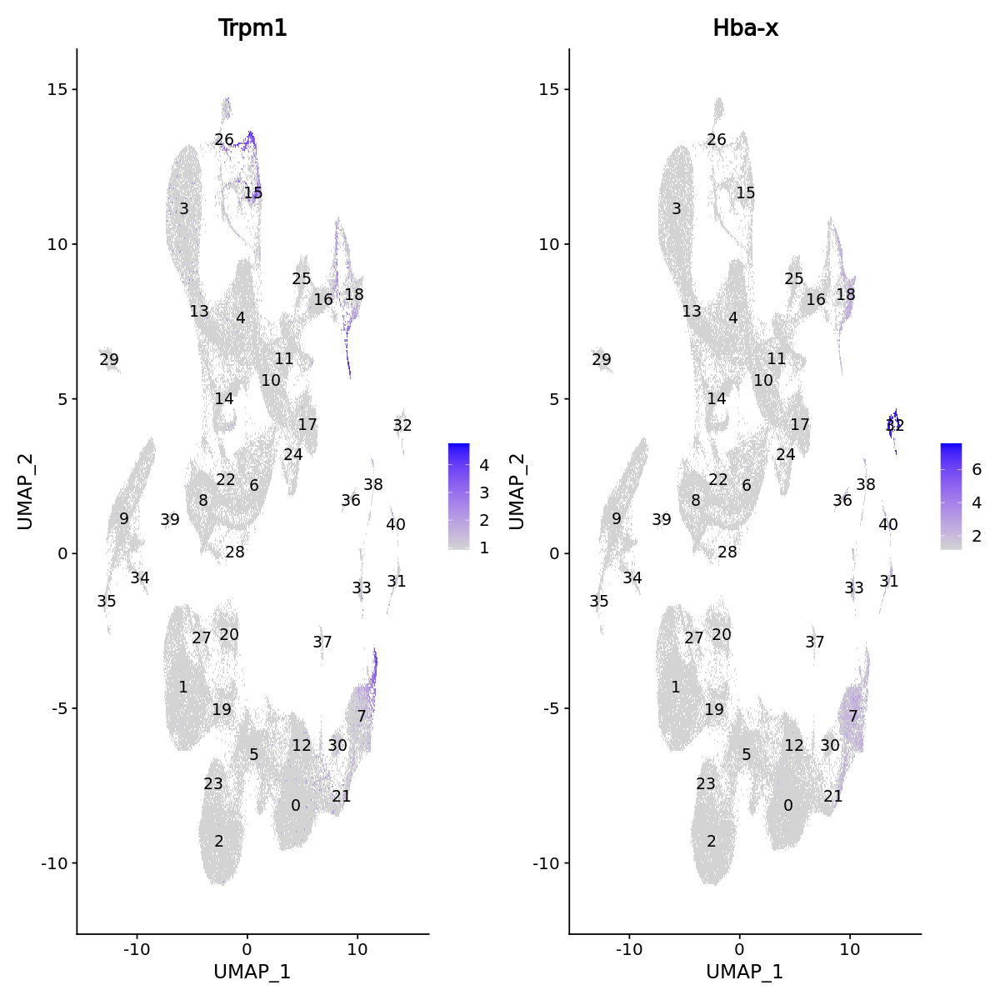

In [57]:
#CD14 monocyte marker
FeaturePlot(seurat_phase, 
            reduction = "umap", 
            features = c("Trpm1", "Hba-x"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

In [29]:
saveRDS(seurat_integrated, "seurat_integrated.rds")

In [3]:
seurat_integrated <- readRDS("seurat_integrated.rds")

In [10]:
markers <- FindAllMarkers(object = seurat_integrated, 
                          only.pos = TRUE,
                          logfc.threshold = 0.25) 

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25



In [11]:
saveRDS(markers, "markers.RDS")

In [4]:
DefaultAssay(seurat_integrated) <- "RNA"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



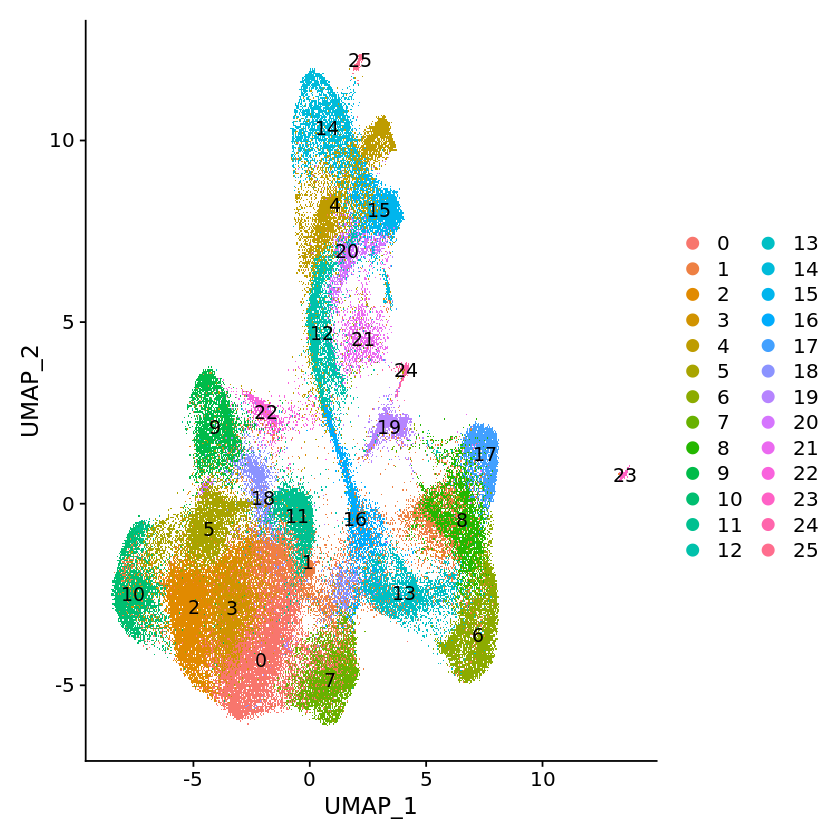

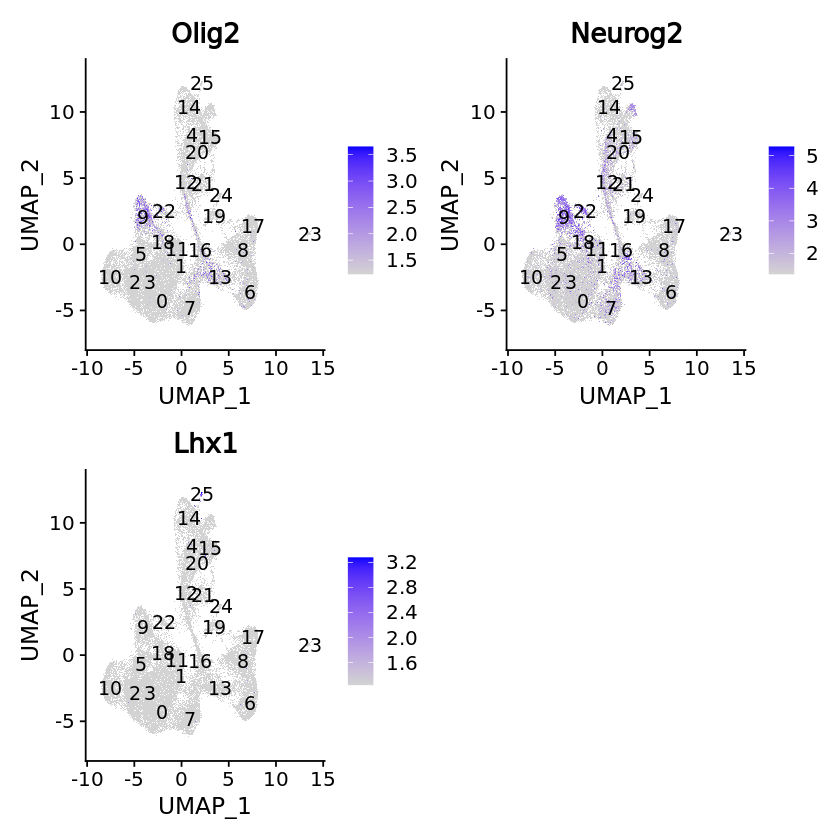

In [6]:
#start finding markers
DimPlot(object = seurat_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_integrated, 
            reduction = "umap", 
            features = c("Olig2","Neurog2","Lhx1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



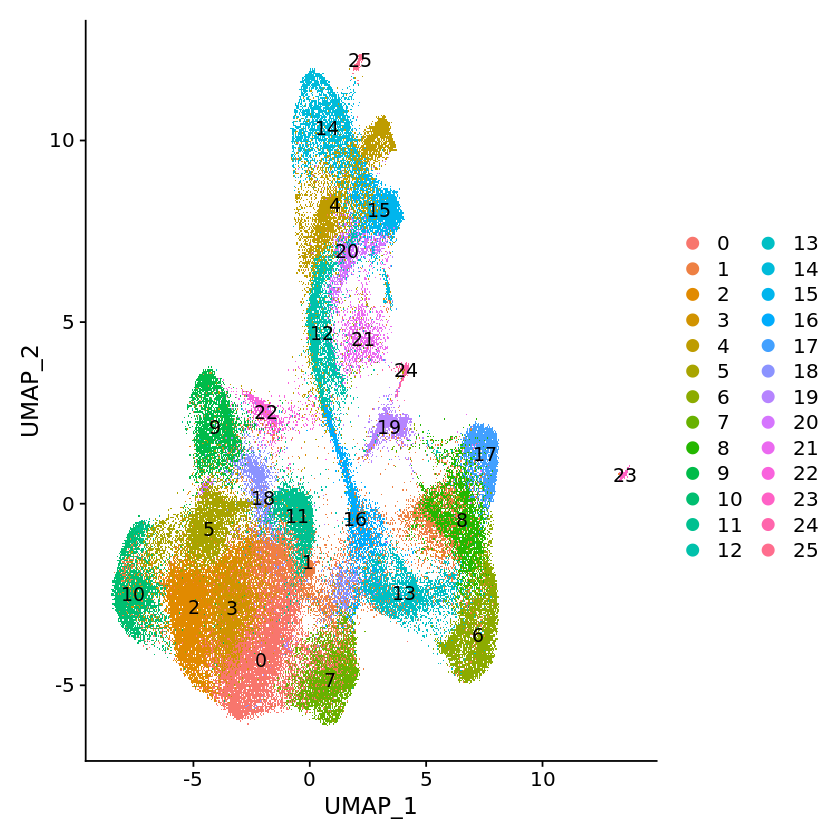

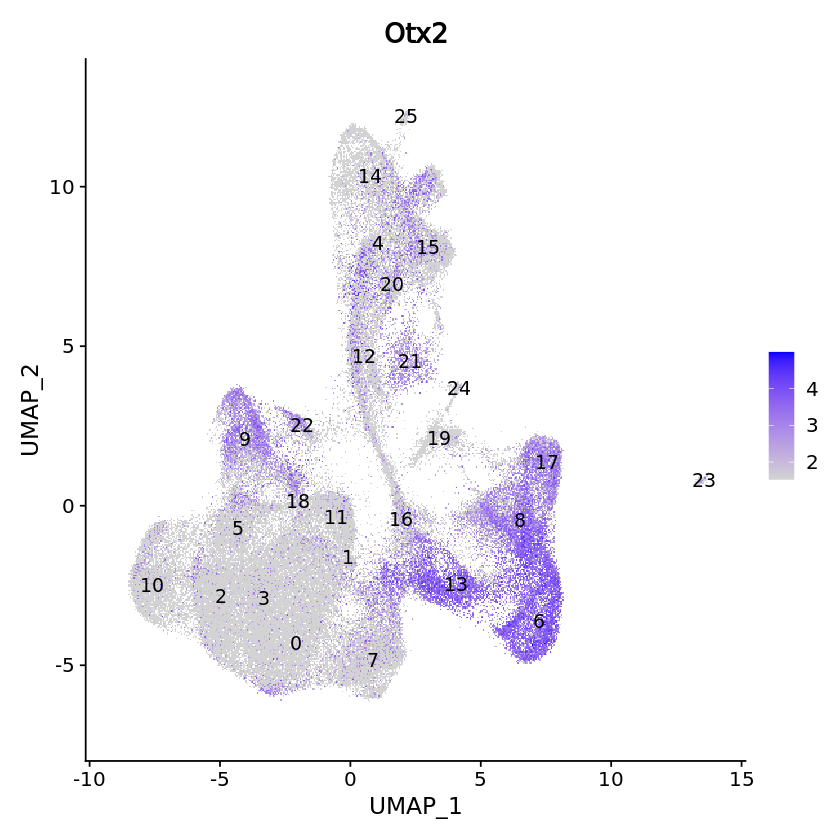

In [7]:
DimPlot(object = seurat_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_integrated, 
            reduction = "umap", 
            features = c("Otx2"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



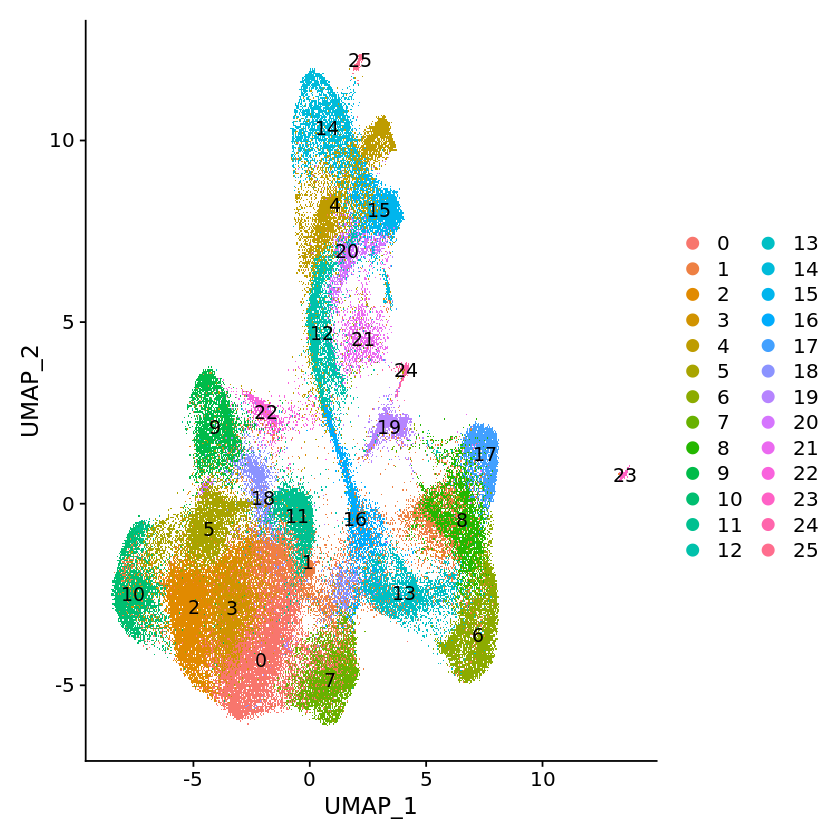

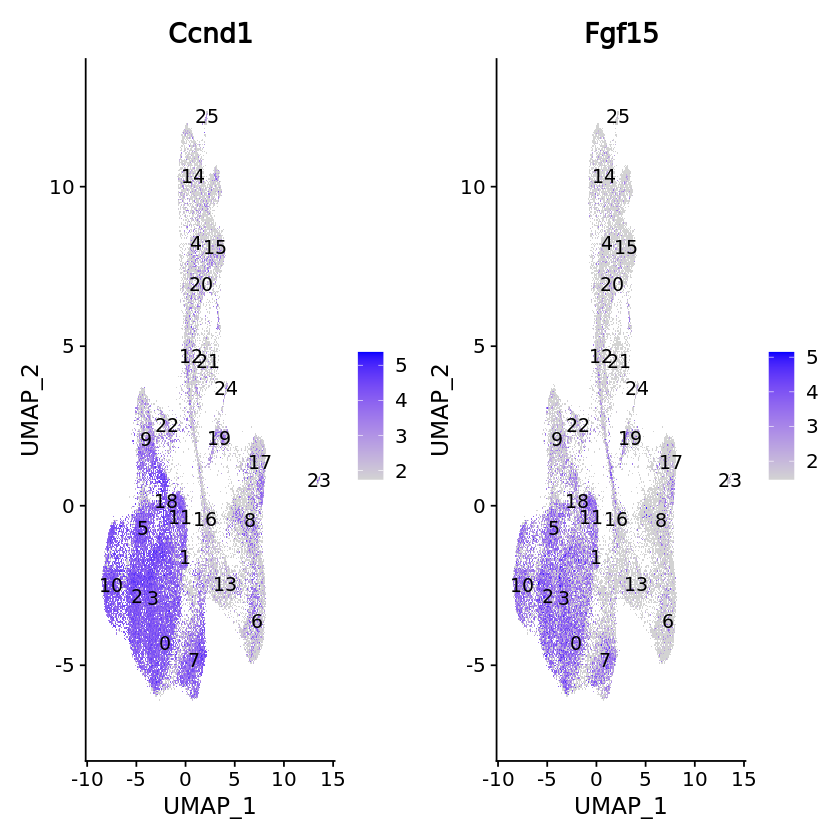

In [8]:
DimPlot(object = seurat_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_integrated, 
            reduction = "umap", 
            features = c("Ccnd1", "Fgf15"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

In [ ]:
#reassignment

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



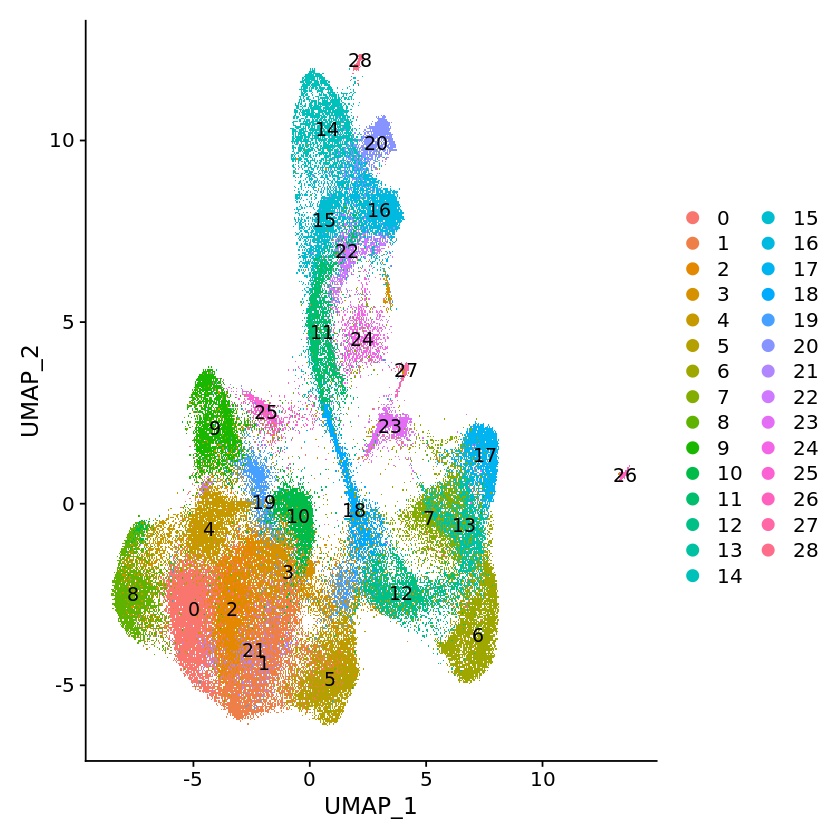

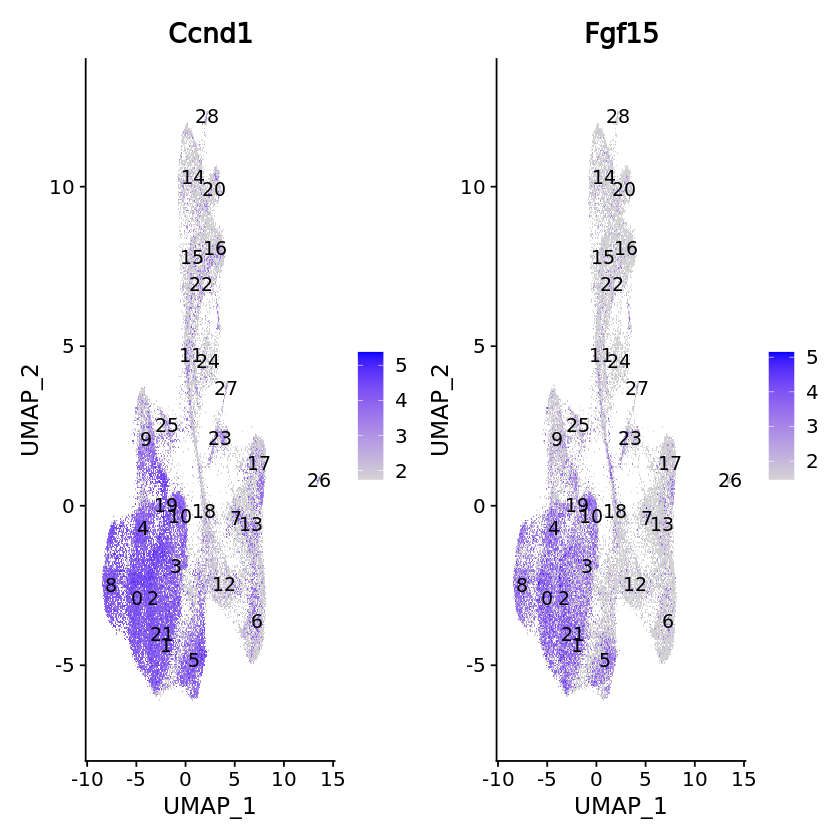

In [32]:
DimPlot(object = seurat_phase_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Ccnd1","Fgf15"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



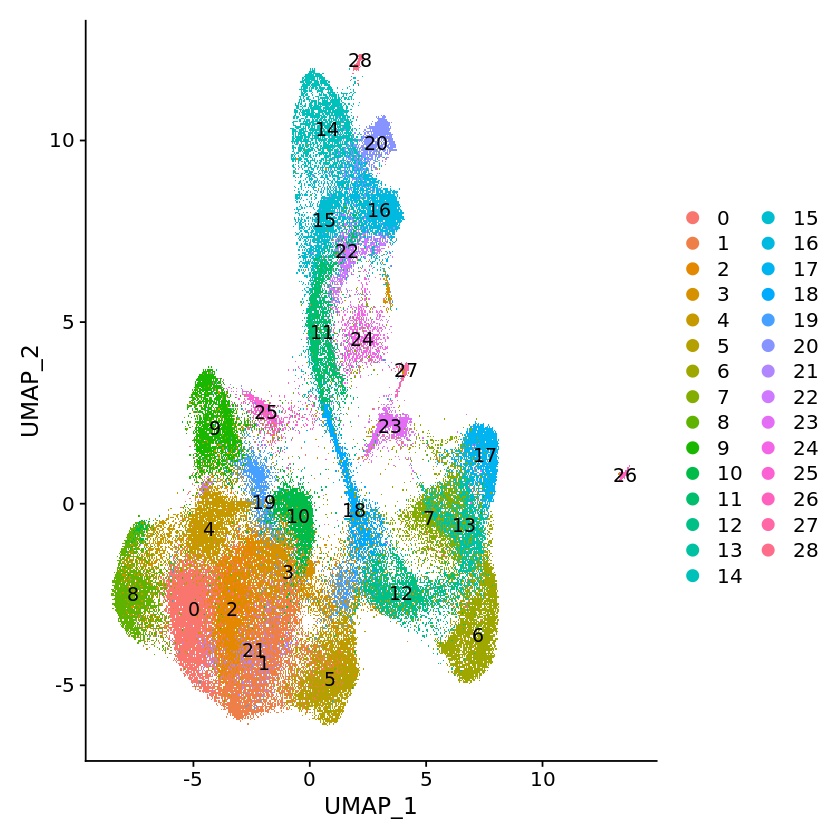

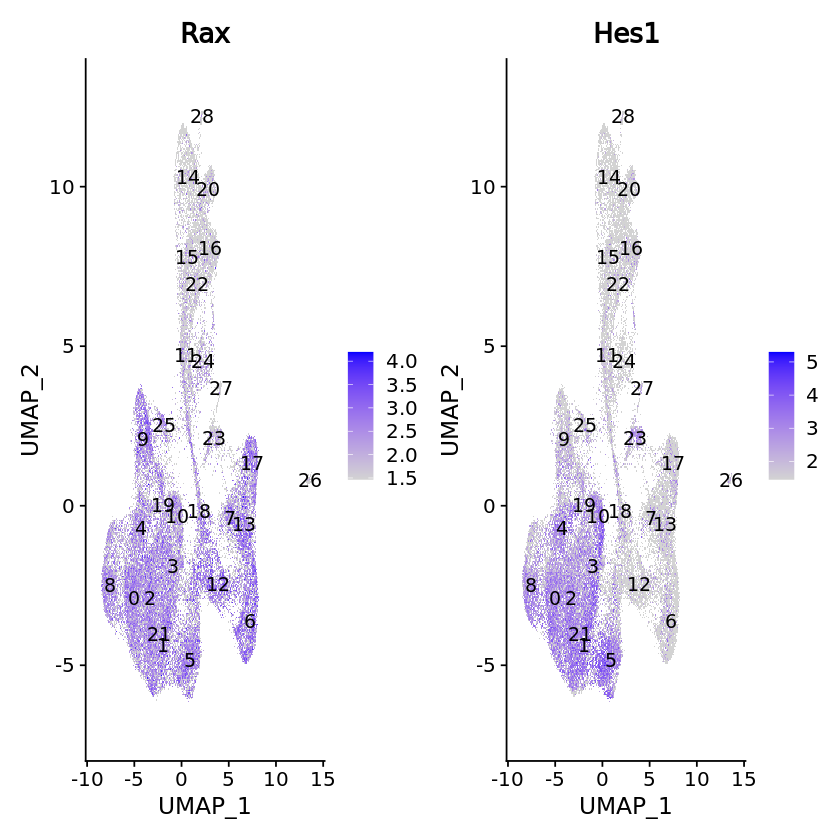

In [38]:
DimPlot(object = seurat_phase_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Rax","Hes1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



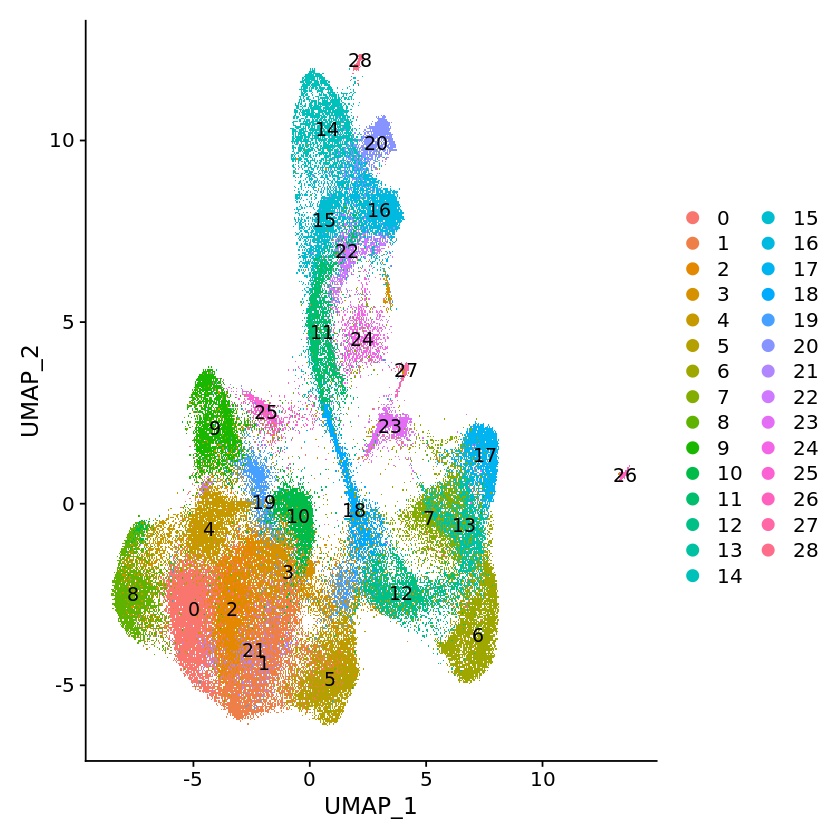

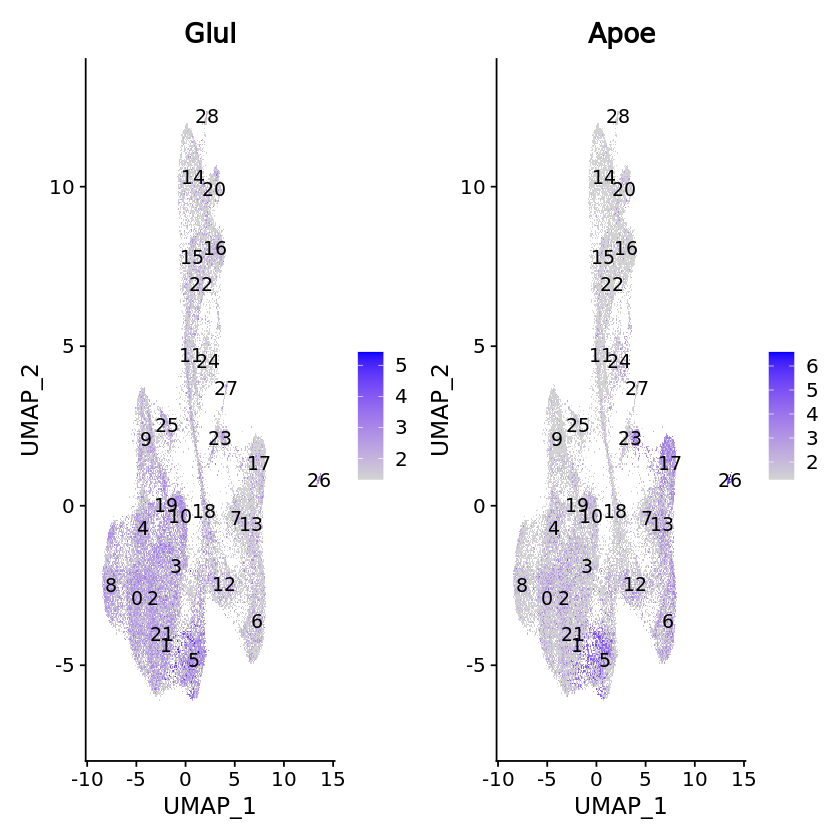

In [44]:
DimPlot(object = seurat_phase_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Glul", "Apoe"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



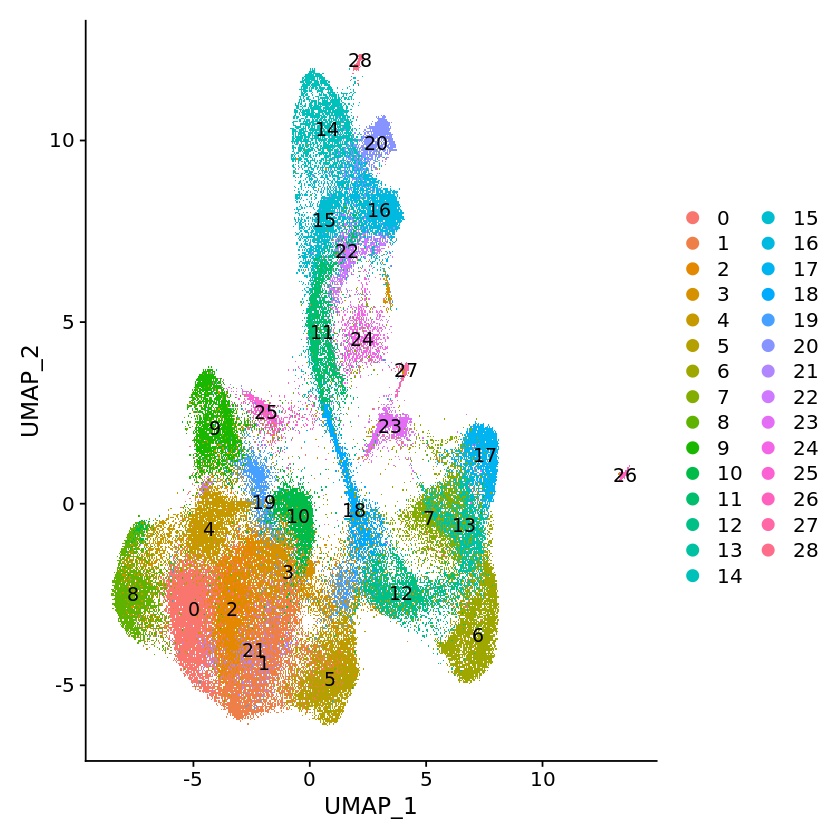

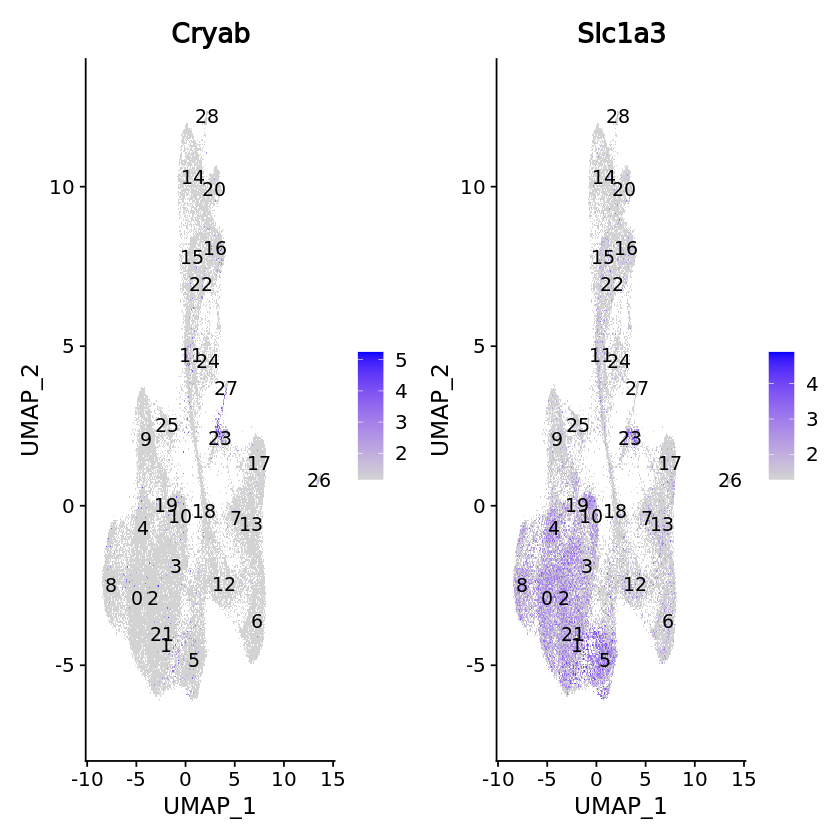

In [6]:
DimPlot(object = seurat_phase_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Cryab", "Slc1a3"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



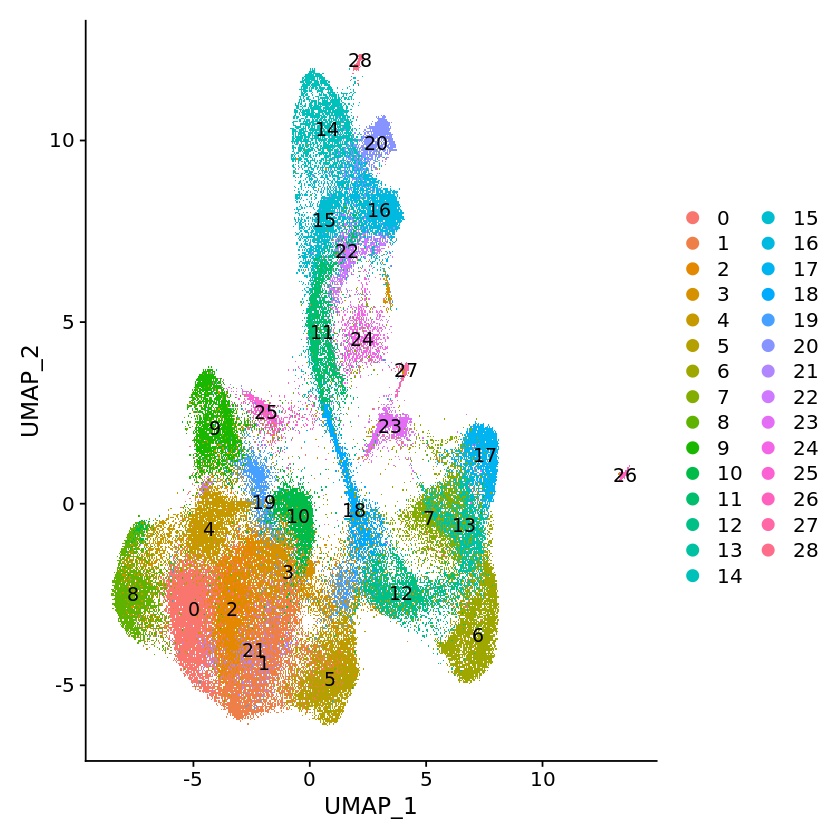

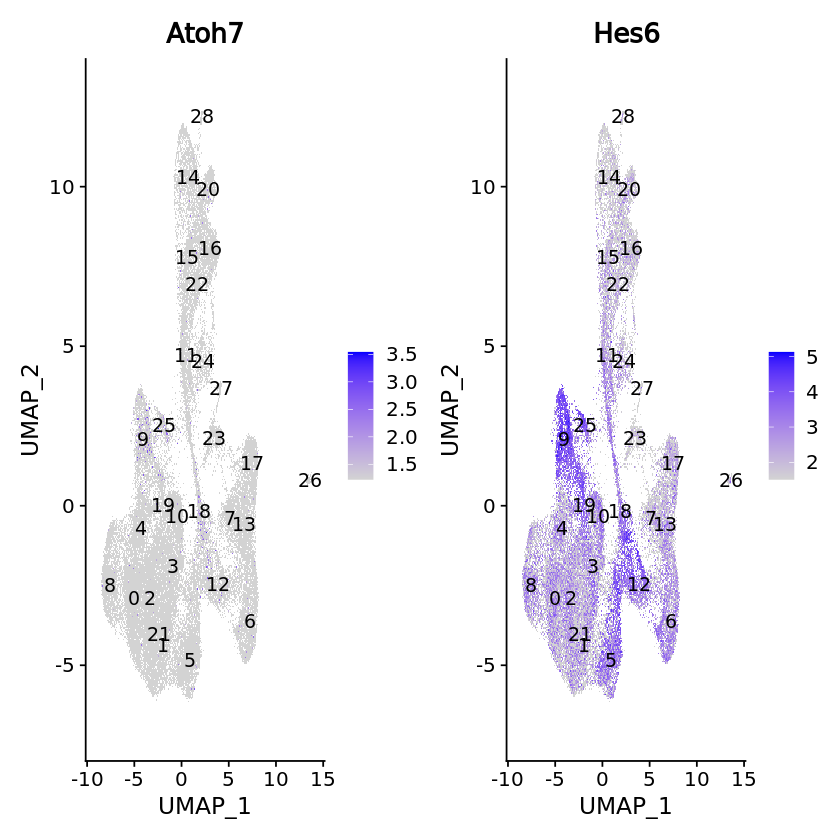

In [55]:
DimPlot(object = seurat_phase_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Atoh7", "Hes6"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



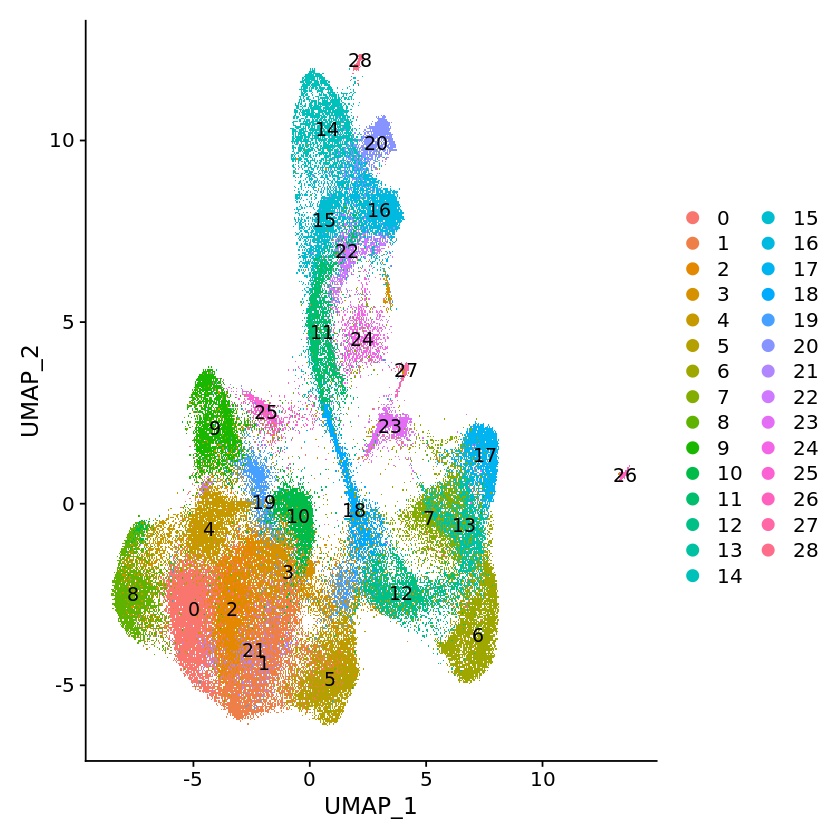

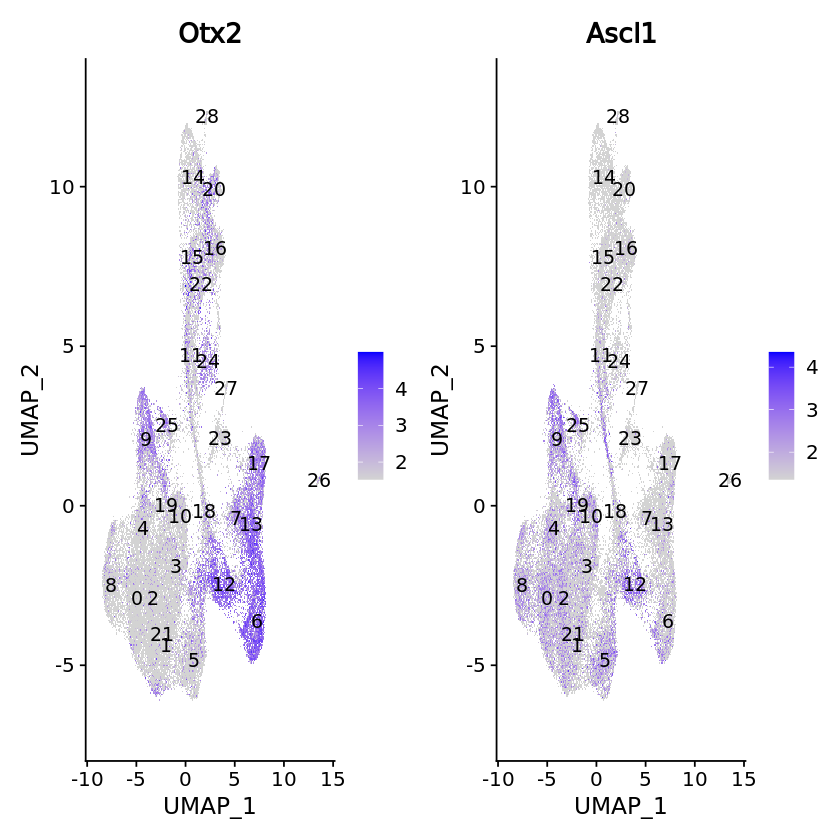

In [53]:
DimPlot(object = seurat_phase_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Otx2", "Ascl1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



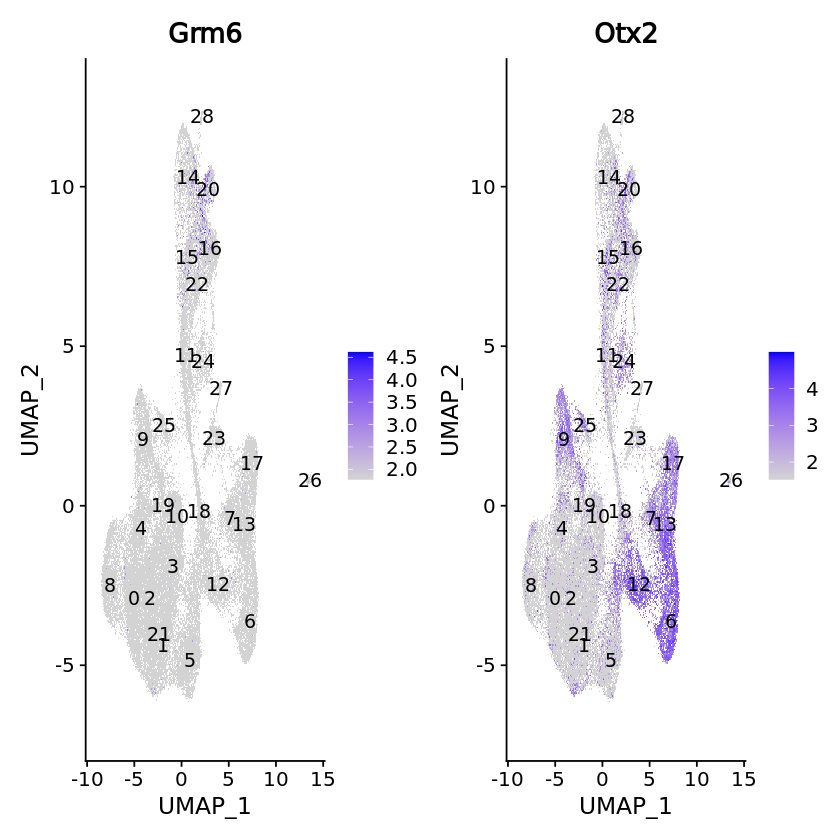

In [56]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Grm6", "Otx2"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

In [ ]:
#assign celltypes
# Rename all identities
seurat_integrated_new <- RenameIdents(object = seurat_integrated_new, 
                               "0" = "Early RPC",
                               "1" = "Early RPC",
                               "2" = "Early RPC",
                               "3" = "Early RPC",
                               "4" = "Early RPC",
                               "5" = "late RPC",
                               "6" = "Photoreceptor Precursor",
                               "7" = "Rods",
                               "8" = "Early RPC",
                               "9" = "Neurogenic Cells",
                               "10" = "Early RPC",
                               "11" = "Amacrine Cells",
                               "12" = "Photo Precursors",
                               "13" = "Rods",
                               "14" = "RGC",
                               "15" = "Amacrine Cells",
                                "16" = "Amacrine Cells",
                                "17" = "Cone", 
                                  "18" = "Neurogenic Cells", 
                                  "19" = "Early RPC", 
                                   "20" = "Bipolar",
                                "21" = "Early RPC",
                                 "22" = "Amacrine Cells",
                                  "23" = "Muller Glia",
                                 "24" = "Amacrine Cells",
                                 "25" = "Neurogenic Cells",
                                  "26" = "Muller Glia",
                                 "27" = "Muller Glia",
                                 "28" = "Horizontal Cells"
                                 )


# Plot the UMAP
DimPlot(object = seurat_integrated_new, 
        reduction = "umap", 
        label = TRUE,
        label.size = 3,
        repel = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



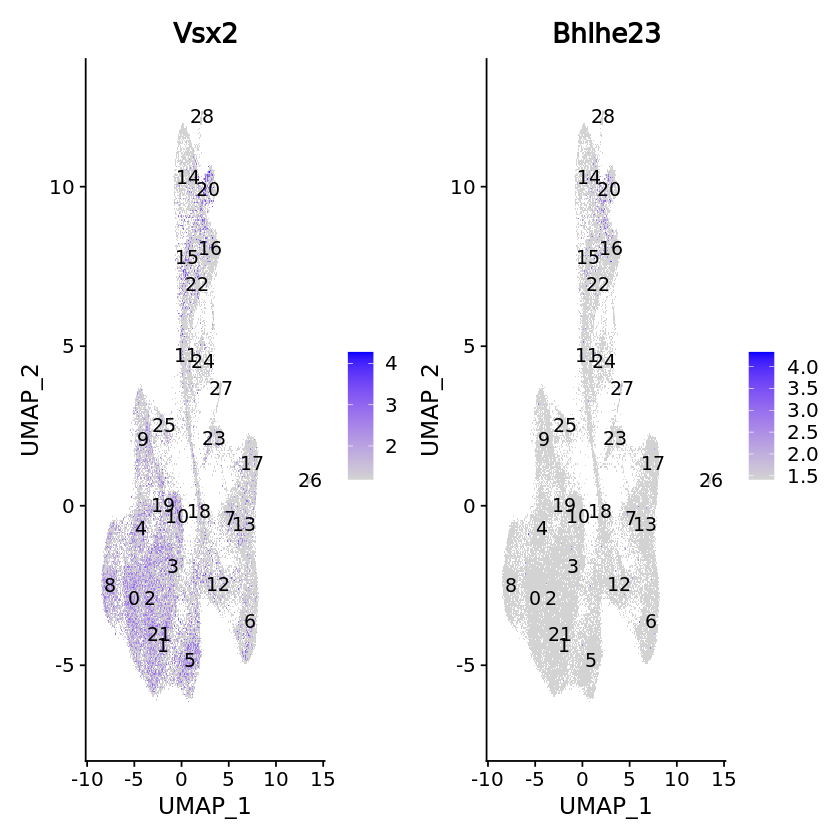

In [61]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Vsx2", "Bhlhe23"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



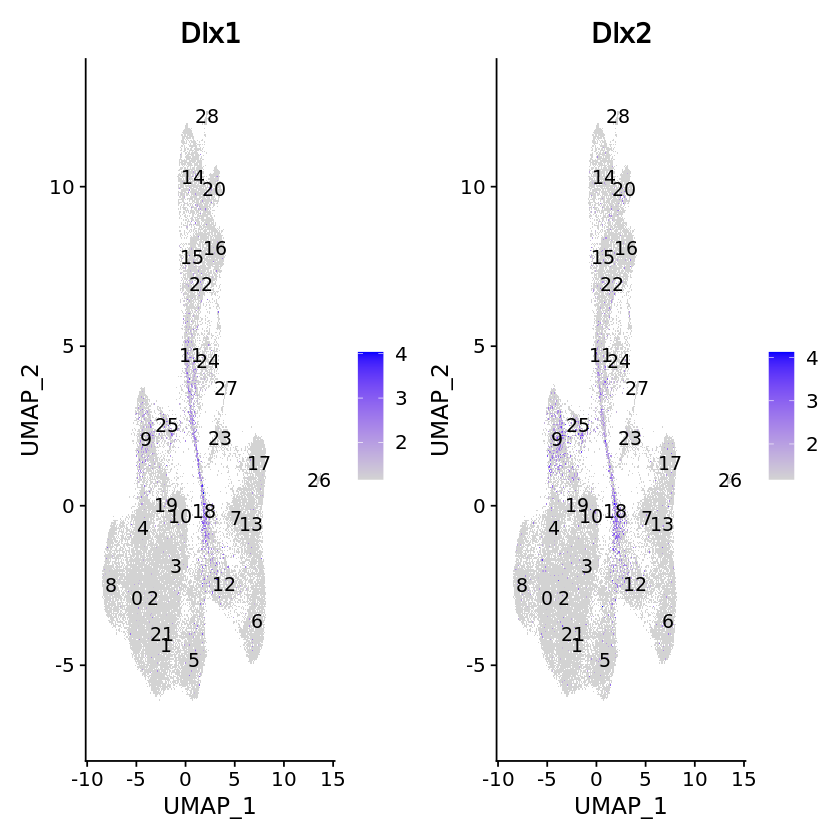

In [62]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Dlx1", "Dlx2"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



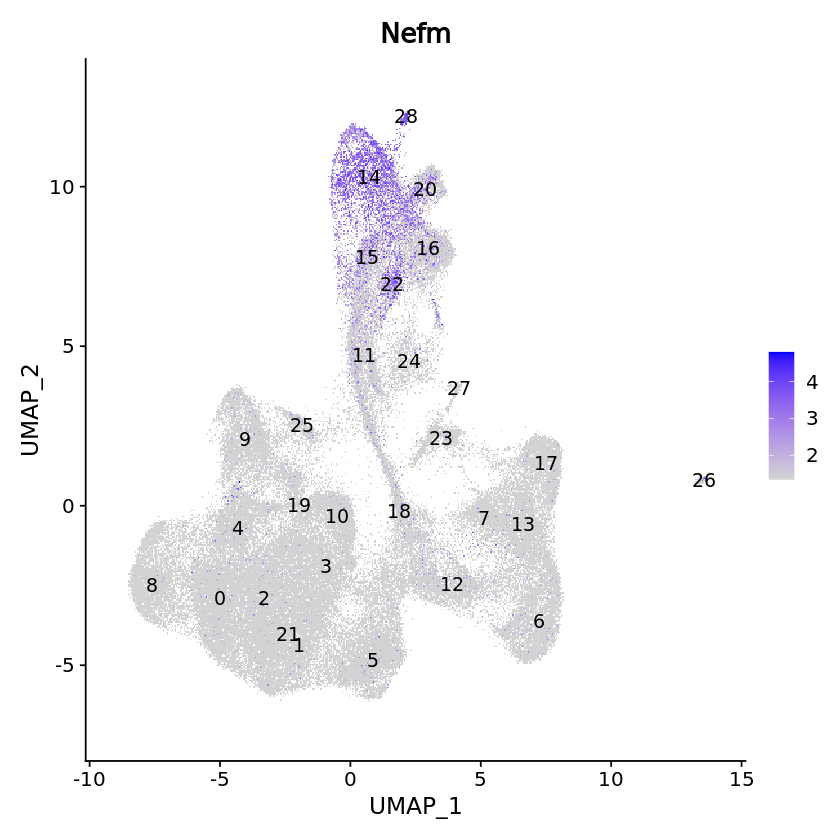

In [65]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Nefm"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



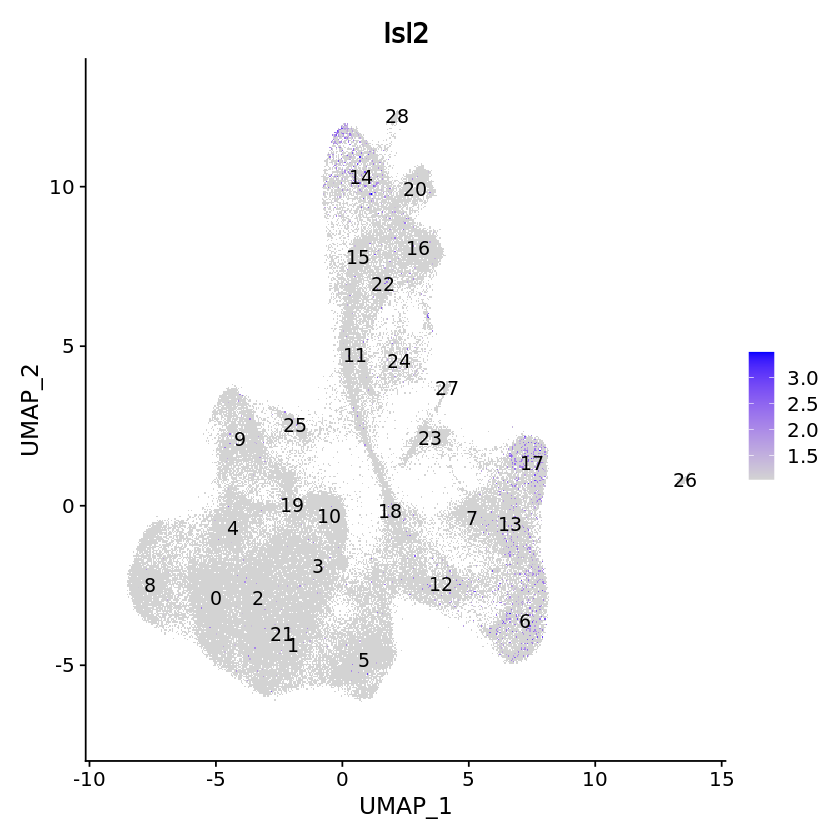

In [31]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Isl2"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



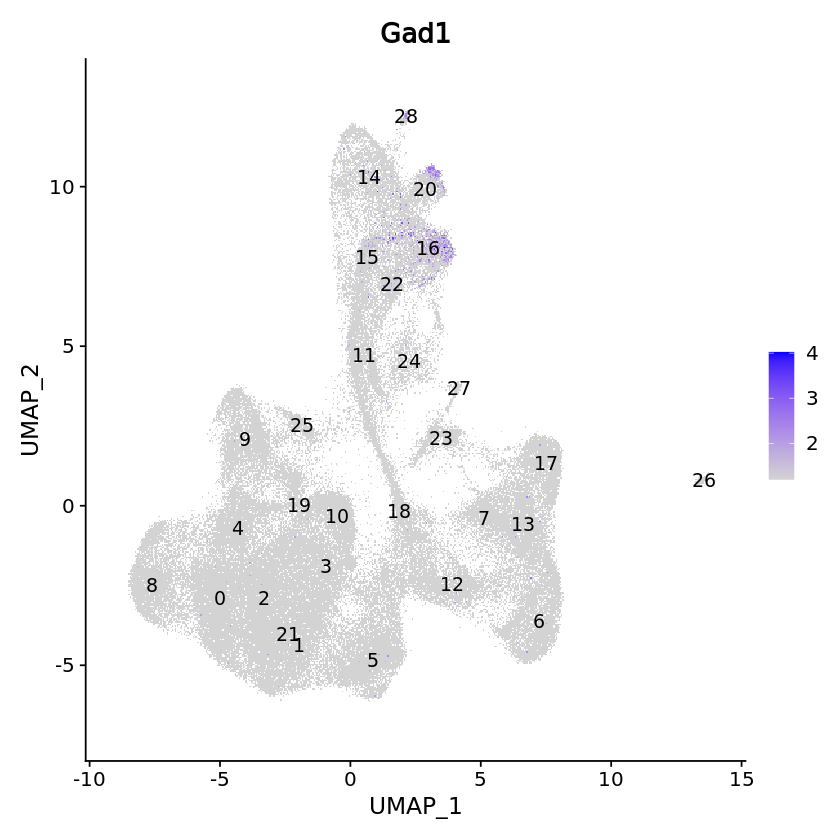

In [17]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Gad1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



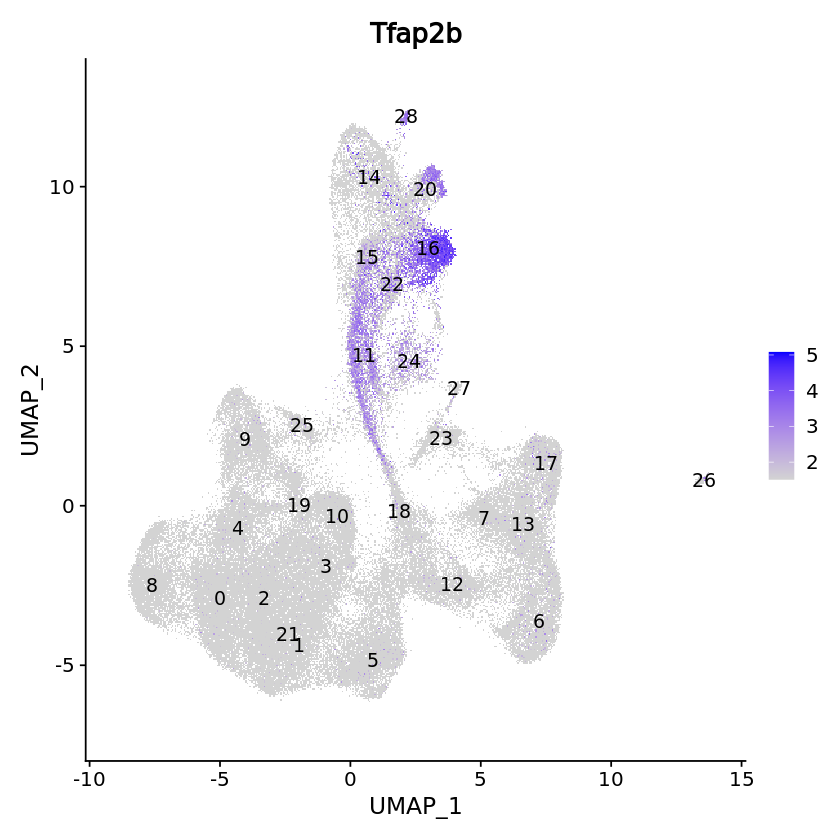

In [73]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Tfap2b"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



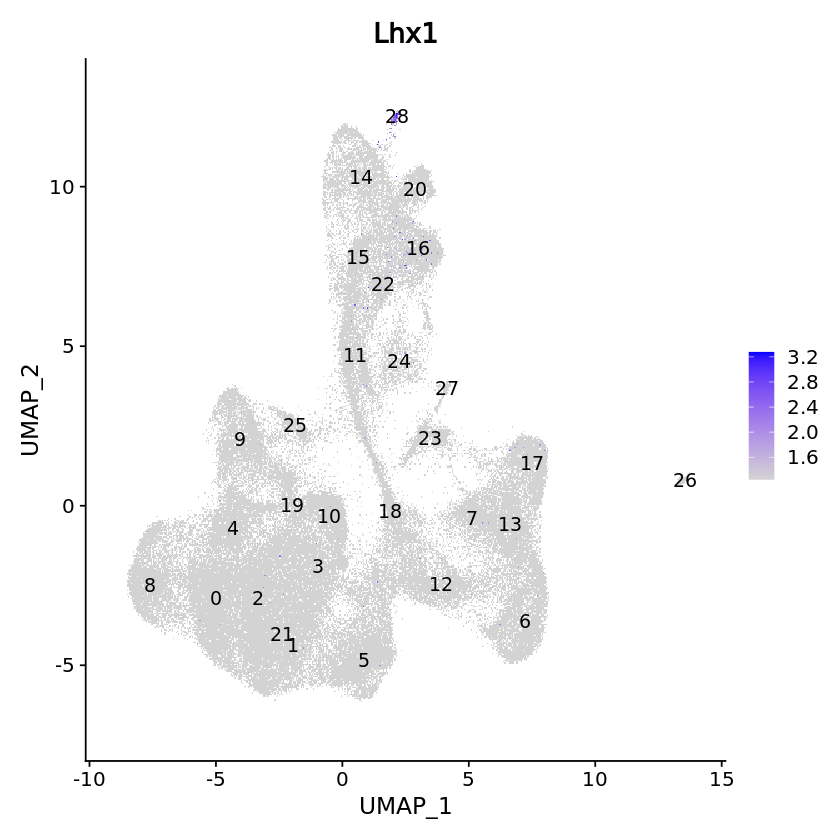

In [83]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Lhx1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

In [4]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Onecut1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

ERROR: Error in Key(object = object[[reduction]]): object 'seurat_phase_integrated' not found


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



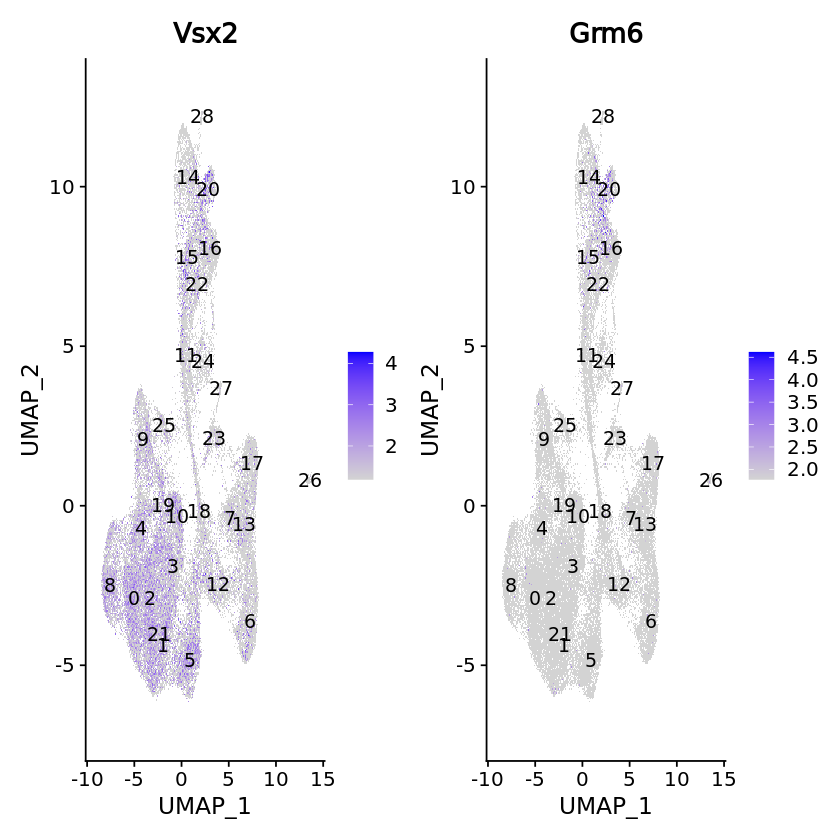

In [108]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Vsx2","Grm6"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



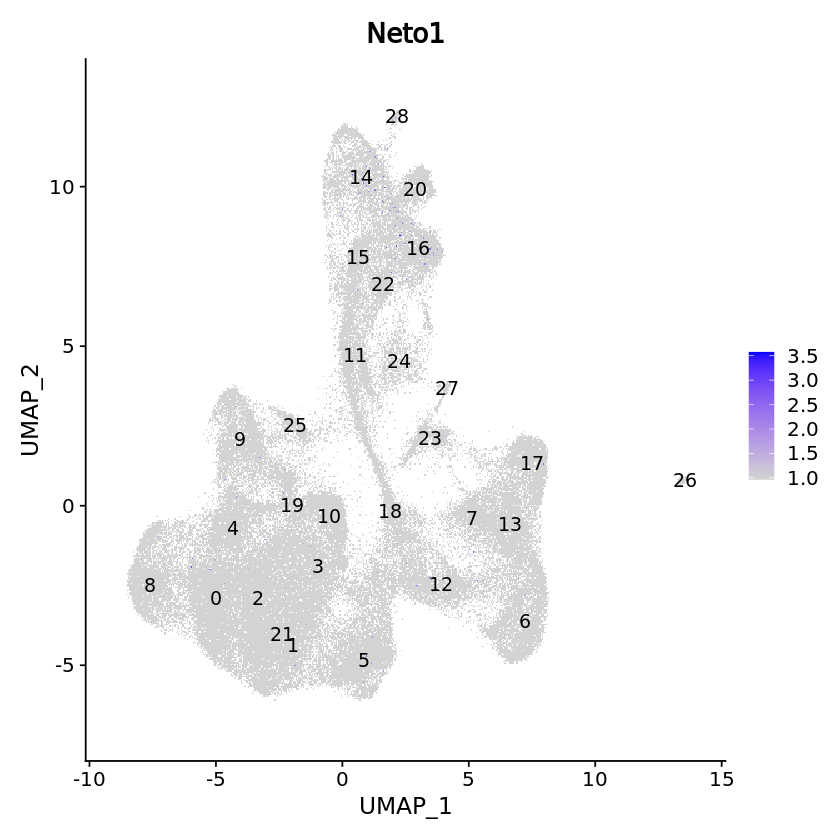

In [114]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Neto1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



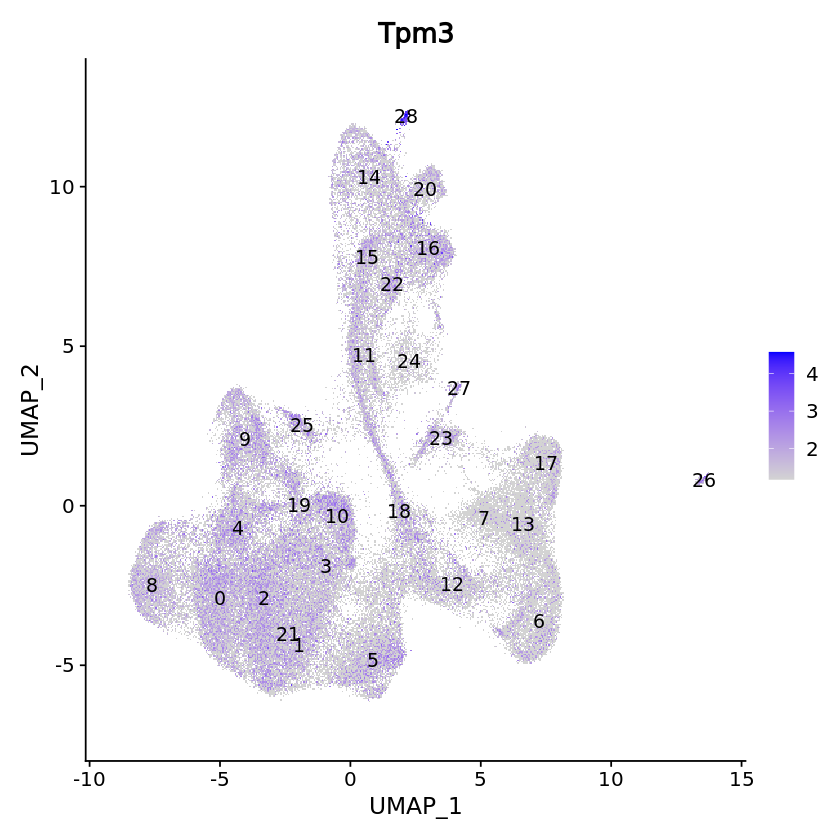

In [16]:
#horizontal
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Tpm3"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



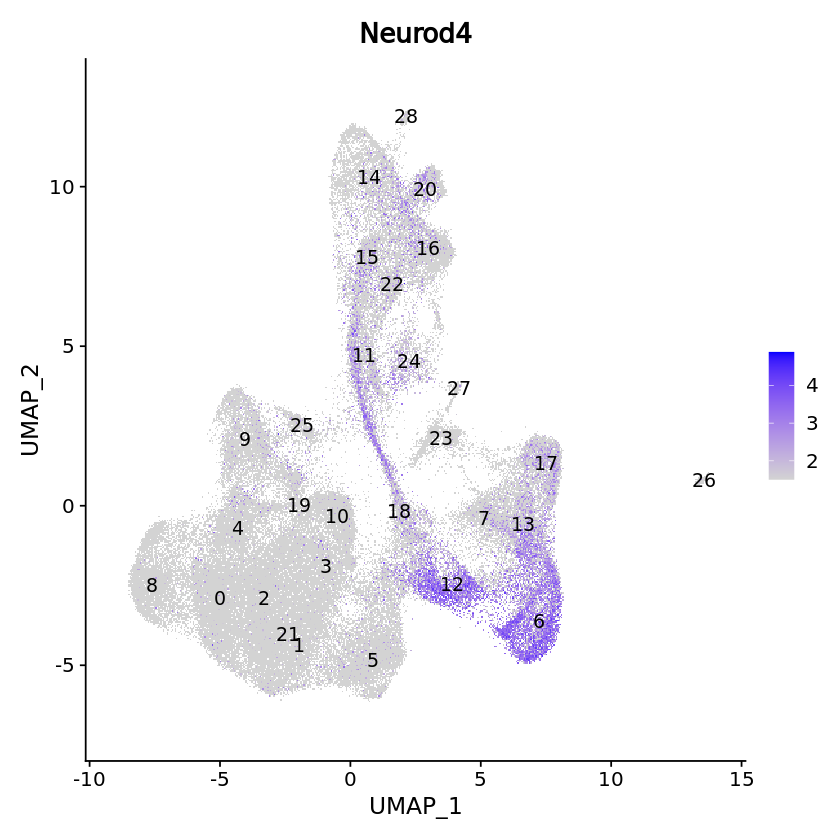

In [106]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Neurod4"),
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



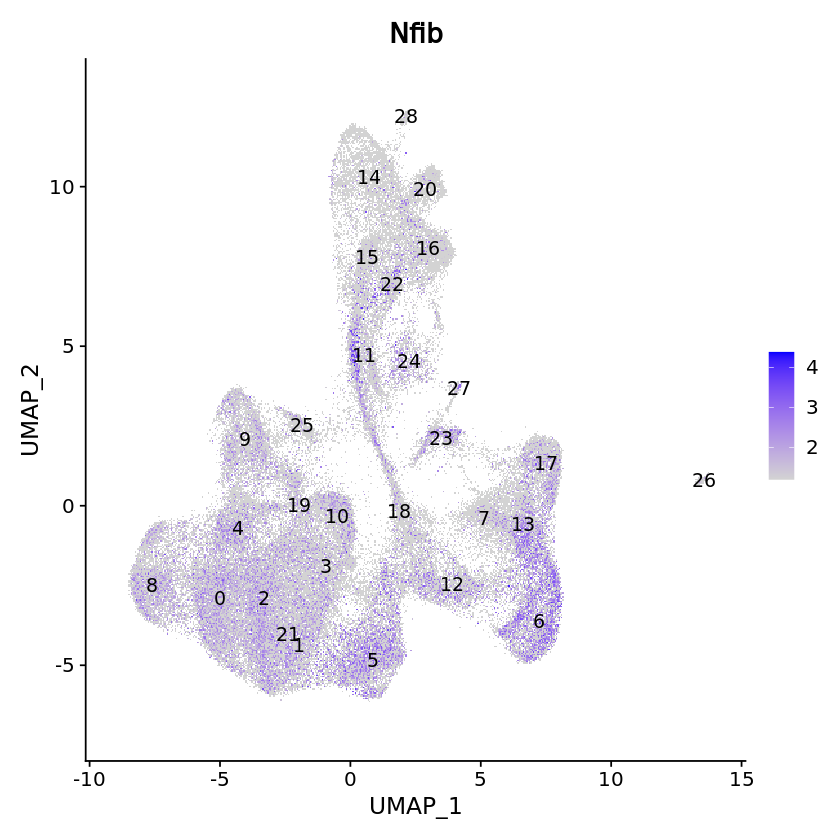

In [120]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Nfib"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

In [5]:
BiocManager::install('limma')
#BiocManager::install("multtest")

'getOption("repos")' replaces Bioconductor standard repositories, see
'?repositories' for details

replacement repositories:
    CRAN: https://cran.r-project.org


Bioconductor version 3.14 (BiocManager 1.30.19), R 4.1.3 (2022-03-10)

Installing package(s) 'limma'

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Old packages: 'broom', 'bslib', 'cli', 'digest', 'formatR', 'future', 'highr',
  'htmlwidgets', 'httpuv', 'isoband', 'listenv', 'nlme', 'parallelly',
  'pkgdown', 'purrr', 'ragg', 'rgeos', 'rmarkdown', 'RSQLite', 'shiny', 'xfun',
  'XML'



Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



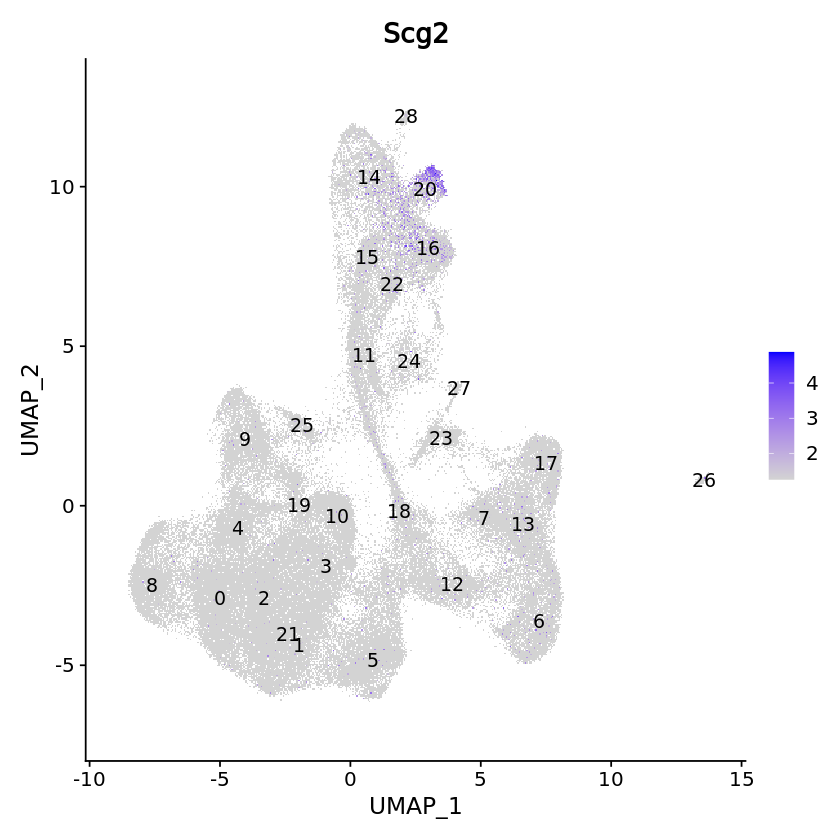

In [21]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Scg2"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



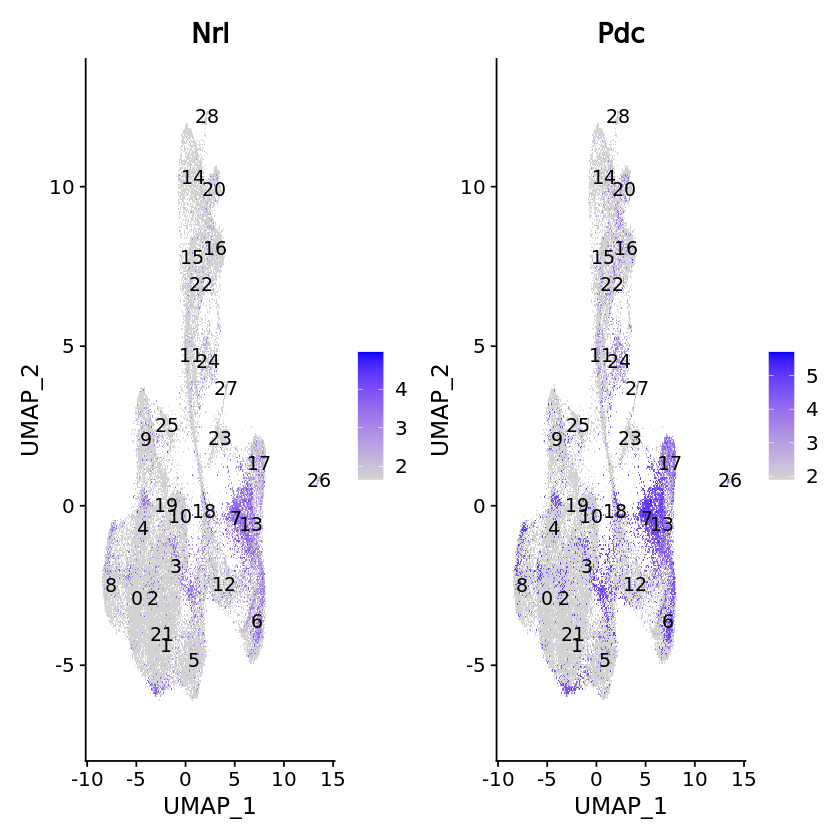

In [100]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Nrl","Pdc"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



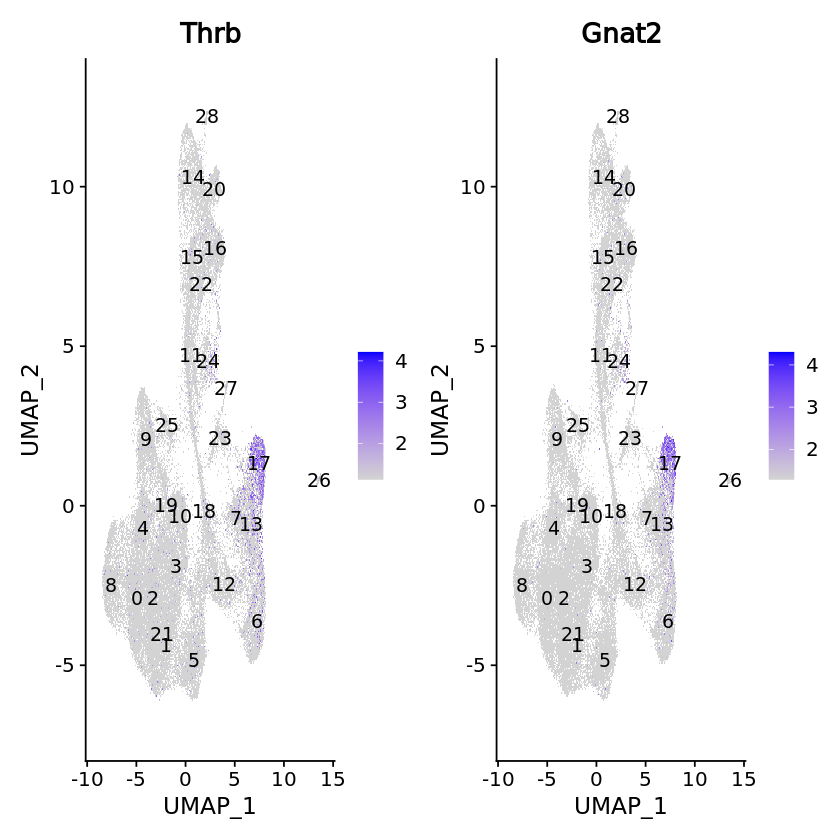

In [105]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Thrb","Gnat2"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



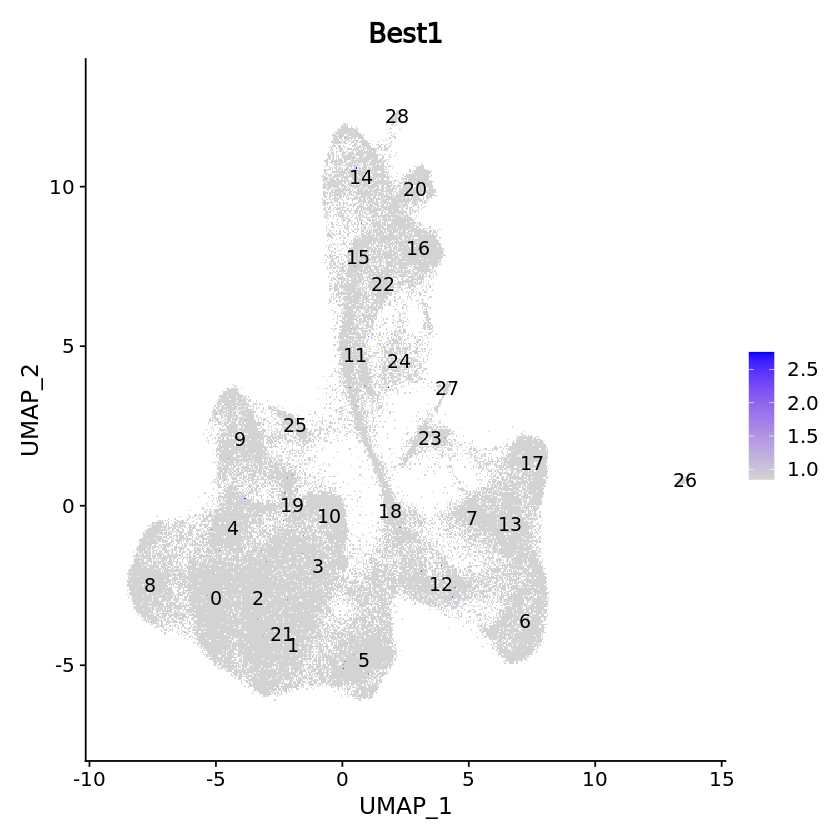

In [133]:
FeaturePlot(seurat_phase_integrated, 
            reduction = "umap", 
            features = c("Best1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

also installing the dependencies ‘TH.data’, ‘multcomp’, ‘robustbase’, ‘mutoss’, ‘qqconf’


Warning message in install.packages("metap"):
“installation of package ‘qqconf’ had non-zero exit status”
Warning message in install.packages("metap"):
“installation of package ‘metap’ had non-zero exit status”
Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



Warning message in install.packages("qqconf"):
“installation of package ‘qqconf’ had non-zero exit status”
Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



ERROR: Error in library("qqconf"): there is no package called ‘qqconf’


In [121]:
cluster23_conserved_markers <- FindConservedMarkers(seurat_phase_integrated,
                              ident.1 = 23,
                              grouping.var = "sample_state",
                              only.pos = TRUE,
                            logfc.threshold = 0.25)

Testing group P14: (23) vs (11, 6, 17, 15, 20, 27, 13, 7, 9, 0, 5, 25, 14, 3, 1, 24, 16, 26, 2, 28, 8, 4, 18, 12, 10, 21, 22, 19)

Testing group E12: (23) vs (1, 2, 21, 25, 15, 7, 4, 10, 0, 22, 6, 11, 26, 3, 27, 8, 19, 12, 16, 17, 9, 20, 14, 13, 18, 5)

Testing group E16: (23) vs (6, 16, 8, 14, 19, 9, 11, 10, 3, 17, 2, 0, 18, 12, 1, 24, 20, 5, 15, 21, 25, 26, 7, 4, 13, 22, 27)

Testing group P5.: (23) vs (4, 14, 3, 12, 5, 1, 6, 13, 0, 15, 17, 24, 16, 19, 2, 11, 8, 22, 9, 10, 7, 26, 27, 18, 28, 21, 20, 25)

Testing group E11: (23) vs (3, 7, 0, 11, 2, 10, 8, 15, 12, 27, 21, 1, 16, 6, 14, 26, 4, 22, 25, 20, 19, 9, 17, 13, 18, 5, 24)

Testing group P0.: (23) vs (16, 11, 8, 21, 17, 0, 19, 5, 2, 12, 15, 3, 10, 6, 9, 1, 24, 13, 25, 4, 14, 28, 20, 18, 7, 26, 22, 27)

Testing group P8_: (23) vs (3, 6, 7, 0, 20, 13, 12, 1, 5, 17, 14, 2, 16, 4, 8, 22, 19, 15, 27, 10, 9, 18, 11, 26, 24, 21, 25, 28)

Testing group P2_: (23) vs (6, 5, 12, 16, 10, 2, 0, 13, 1, 18, 25, 17, 24, 9, 8, 11, 28, 4, 21, 15,

In [122]:
cluster23_conserved_markers


,P14_p_val,P14_avg_log2FC,P14_pct.1,P14_pct.2,P14_p_val_adj,E12_p_val,E12_avg_log2FC,E12_pct.1,E12_pct.2,E12_p_val_adj,⋯,E18_pct.1,E18_pct.2,E18_p_val_adj,E14_p_val,E14_avg_log2FC,E14_pct.1,E14_pct.2,E14_p_val_adj,max_pval,minimump_p_val
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Igfbp5,1.175535e-65,4.4770710,0.667,0.014,2.101857e-61,5.290769e-51,1.8919976,0.628,0.091,9.459895e-47,⋯,0.89,0.031,0.000000e+00,4.660465e-24,0.7774931,0.173,0.068,8.332911e-20,6.968155e-15,0.000000e+00
Ntrk2,4.843453e-23,3.0624565,0.400,0.018,8.660094e-19,2.566757e-16,0.7003047,0.419,0.121,4.589362e-12,⋯,0.71,0.018,0.000000e+00,1.524212e-76,0.8509593,0.246,0.061,2.725292e-72,5.120064e-12,0.000000e+00
Fn1,1.181472e-17,2.1092193,0.333,0.017,2.112472e-13,1.558381e-01,0.4286962,0.384,0.367,1.000000e+00,⋯,0.80,0.050,4.169747e-260,2.965920e-24,0.5745182,0.157,0.058,5.303066e-20,1.558381e-01,0.000000e+00
Tmem37,7.624206e-07,1.2943518,0.133,0.008,1.363208e-02,1.116618e-25,0.9269581,0.465,0.102,1.996512e-21,⋯,0.70,0.021,0.000000e+00,5.631539e-123,0.8531185,0.157,0.018,1.006919e-118,7.624206e-07,0.000000e+00
Ptn,5.630938e-23,3.9929407,0.933,0.128,1.006812e-18,4.130579e-04,0.5478464,0.849,0.852,1.000000e+00,⋯,0.95,0.413,1.903410e-44,1.925567e-142,1.7803408,0.787,0.397,3.442913e-138,4.130579e-04,1.925567e-141
Pdlim5,2.329237e-02,0.8488313,0.133,0.030,1.000000e+00,7.601882e-06,0.6110516,0.465,0.295,1.359217e-01,⋯,0.60,0.055,4.990767e-111,8.728493e-25,0.4414263,0.120,0.038,1.560655e-20,2.329237e-02,2.791257e-114
Sparc,2.936677e-20,3.1377328,0.933,0.139,5.250779e-16,3.746483e-26,1.3567814,0.953,0.807,6.698711e-22,⋯,0.82,0.273,6.879172e-34,5.617295e-103,1.4732960,0.739,0.369,1.004372e-98,9.910232e-09,5.617295e-102
Cst3,1.951895e-11,5.4983832,1.000,0.750,3.489989e-07,1.557598e-33,2.6242281,0.977,0.782,2.784985e-29,⋯,0.97,0.648,2.413784e-42,3.517974e-102,2.6849811,0.758,0.440,6.290138e-98,1.951895e-11,3.517974e-101
Vim,6.370687e-05,1.3647928,0.333,0.065,1.000000e+00,4.008766e-19,1.0161600,0.965,0.909,7.167673e-15,⋯,0.98,0.410,4.549152e-66,5.728030e-100,1.4582826,0.846,0.566,1.024172e-95,6.370687e-05,5.728030e-99


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



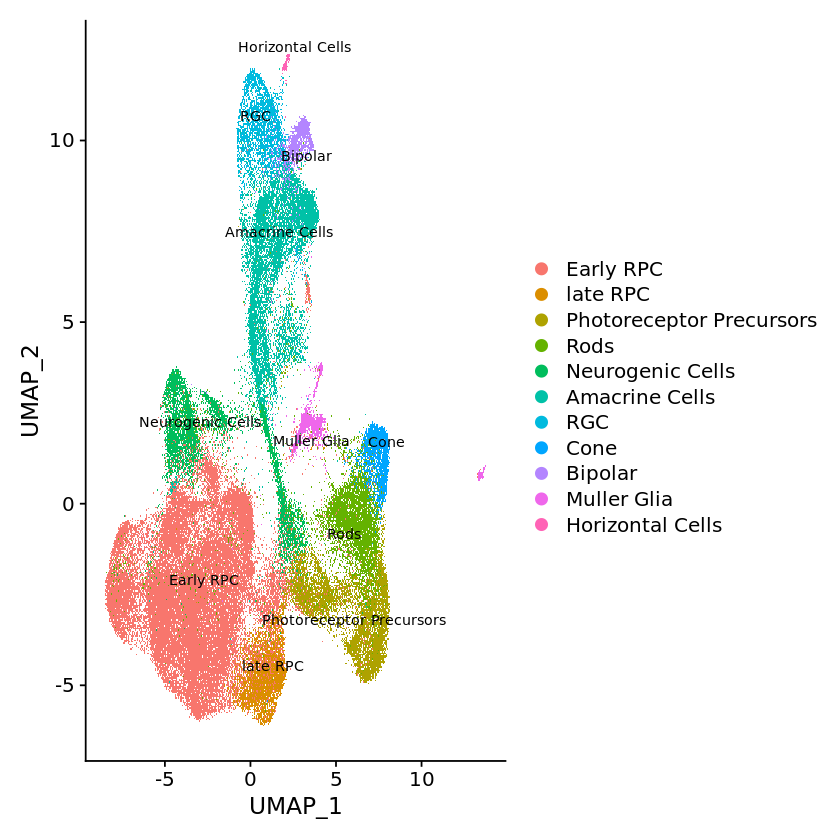

In [33]:
#assign celltypes
# Rename all identities
seurat_phase_ann <- RenameIdents(object = seurat_phase_integrated, 
                               "0" = "Early RPC",
                               "1" = "Early RPC",
                               "2" = "Early RPC",
                               "3" = "Early RPC",
                               "4" = "Early RPC",
                               "5" = "late RPC",
                               "6" = "Photoreceptor Precursors",
                               "7" = "Rods",
                               "8" = "Early RPC",
                               "9" = "Neurogenic Cells",
                               "10" = "Early RPC",
                               "11" = "Amacrine Cells",
                               "12" = "Photoreceptor Precursors",
                               "13" = "Rods",
                               "14" = "RGC",
                               "15" = "Amacrine Cells",
                                "16" = "Amacrine Cells",
                                "17" = "Cone", 
                                  "18" = "Neurogenic Cells", 
                                  "19" = "Early RPC", 
                                   "20" = "Bipolar",
                                "21" = "Early RPC",
                                 "22" = "Amacrine Cells",
                                  "23" = "Muller Glia",
                                 "24" = "Amacrine Cells",
                                 "25" = "Neurogenic Cells",
                                  "26" = "Muller Glia",
                                 "27" = "Muller Glia",
                                 "28" = "Horizontal Cells"
                                 )


# Plot the UMAP
DimPlot(object = seurat_phase_ann, 
        reduction = "umap", 
        label = TRUE,
        label.size = 3,
        repel = TRUE)

In [25]:
metadata <- seurat_phase_ann@meta.data 

In [26]:
metadata$cluster_id <- factor(seurat_phase_ann@active.ident)

In [27]:
# Extract raw counts and metadata to create SingleCellExperiment object
counts <- seurat_phase_ann@assays$RNA@counts

In [28]:
# Create single cell experiment object
sce <- SingleCellExperiment(assays = list(counts = counts), 
                           colData = metadata)

In [29]:
# Subset metadata to include only the variables you want to aggregate across (here, we want to aggregate by sample and by cluster)
groups <- colData(sce)[, c("cluster_id", "sample_state")]
head(groups)

DataFrame with 6 rows and 2 columns
                             cluster_id sample_state
                               <factor>  <character>
"E11.AAACCTGAGATGTAAC.1" Early RPC               E11
"E11.AAACCTGAGCCCAGCT.1" Rods                    E11
"E11.AAACCTGAGGCAATTA.1" Muller Glia             E11
"E11.AAACCTGAGTAGCGGT.1" Early RPC               E11
"E11.AAACCTGAGTGGAGTC.1" Early RPC               E11
"E11.AAACCTGCAAGTTGTC.1" Amacrine Cells          E11

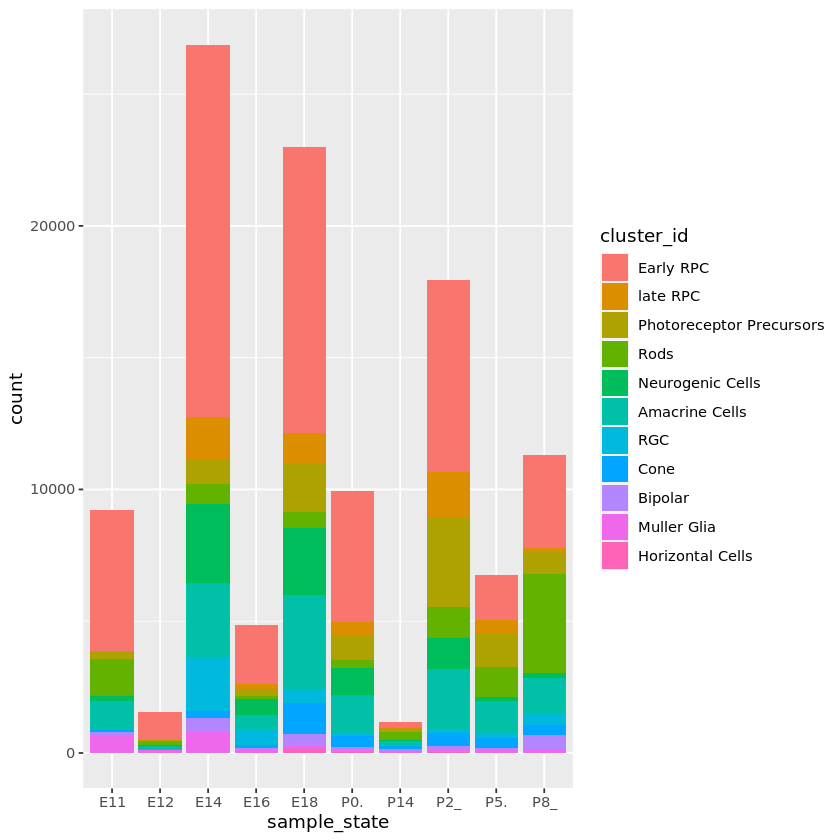

In [30]:
#quick check for the identities by timepoint
library(ggplot2)
ggplot(as.data.frame(groups), aes(sample_state, fill = cluster_id))+
    geom_bar()

In [34]:
new_ann_subset <- subset(seurat_phase_ann, idents = "Early RPC") 

In [3]:
# Assign identity of clusters
Idents(object = seurat_phase_new) <- "SCT_snn_res.0.8"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



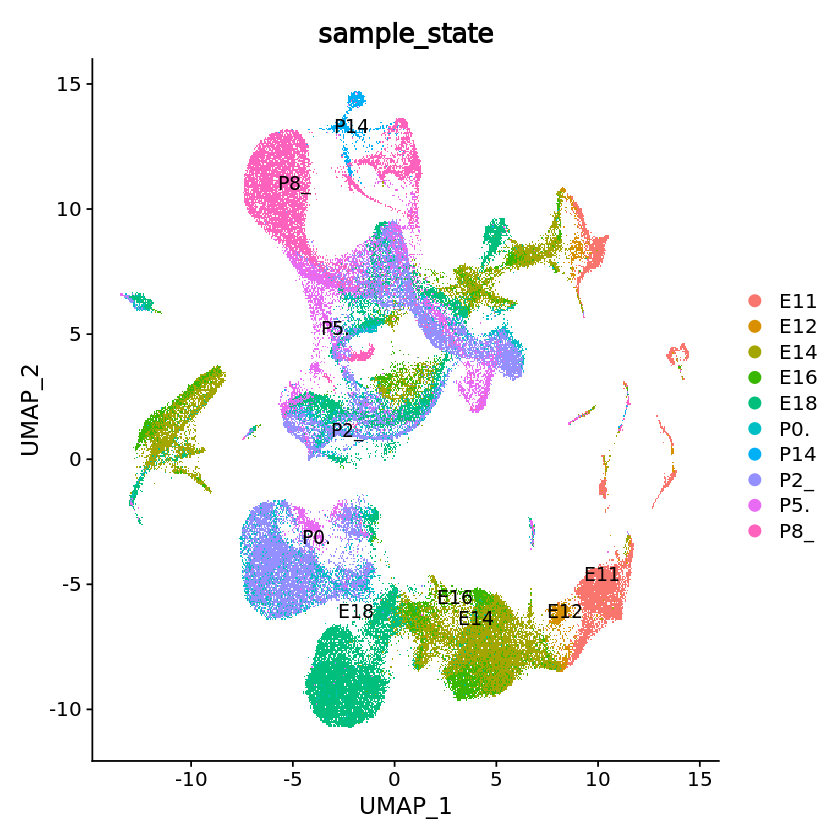

In [4]:
DimPlot(object = seurat_phase_new, 
        reduction = "umap", 
        label = TRUE,
        group.by = "sample_state")

In [59]:
# Assign identity of clusters
Idents(object = seurat_phase) <- "SCT_snn_res.0.4"

In [2]:
seurat_phase_new <- readRDS("seurat_phase_new.rds")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



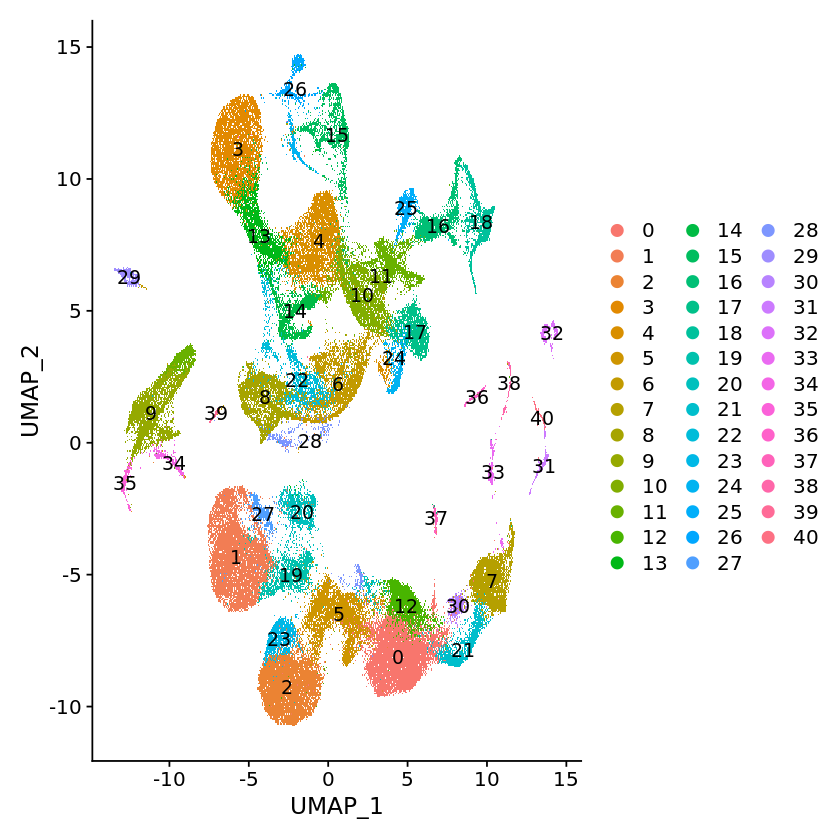

In [4]:
DimPlot(object = seurat_phase_new, 
        reduction = "umap", 
        label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



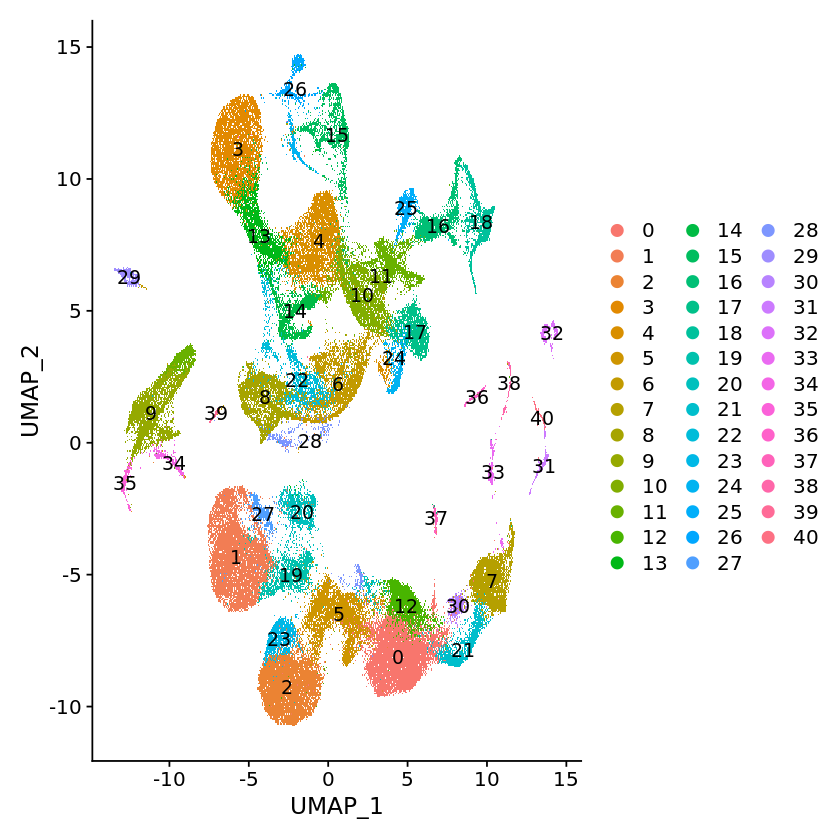

In [3]:
DimPlot(object = seurat_phase_new, 
        reduction = "umap", 
        label = TRUE)

In [35]:
new_ann_subset

An object of class Seurat 
38405 features across 51318 samples within 3 assays 
Active assay: RNA (17880 features, 0 variable features)
 2 other assays present: SCT, integrated
 2 dimensional reductions calculated: pca, umap

In [6]:
options(repr.plot.width = 10, repr.plot.height = 7)

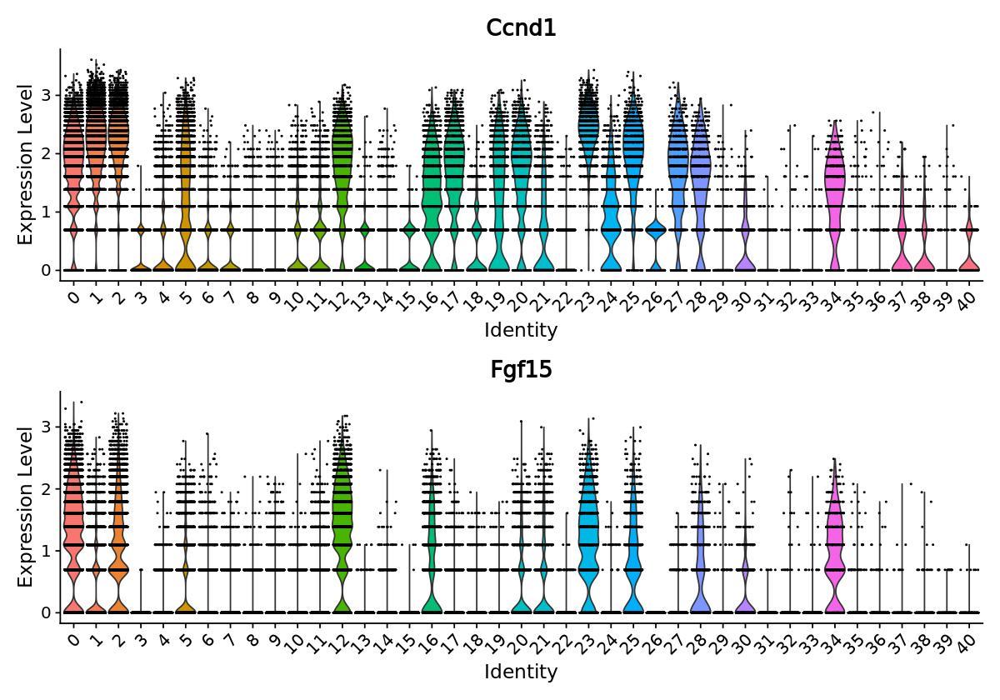

In [8]:
#find markers for non integrated dataset
VlnPlot(seurat_phase_new, features = c("Ccnd1","Fgf15"),
       pt.size = 0.2, ncol = 1)

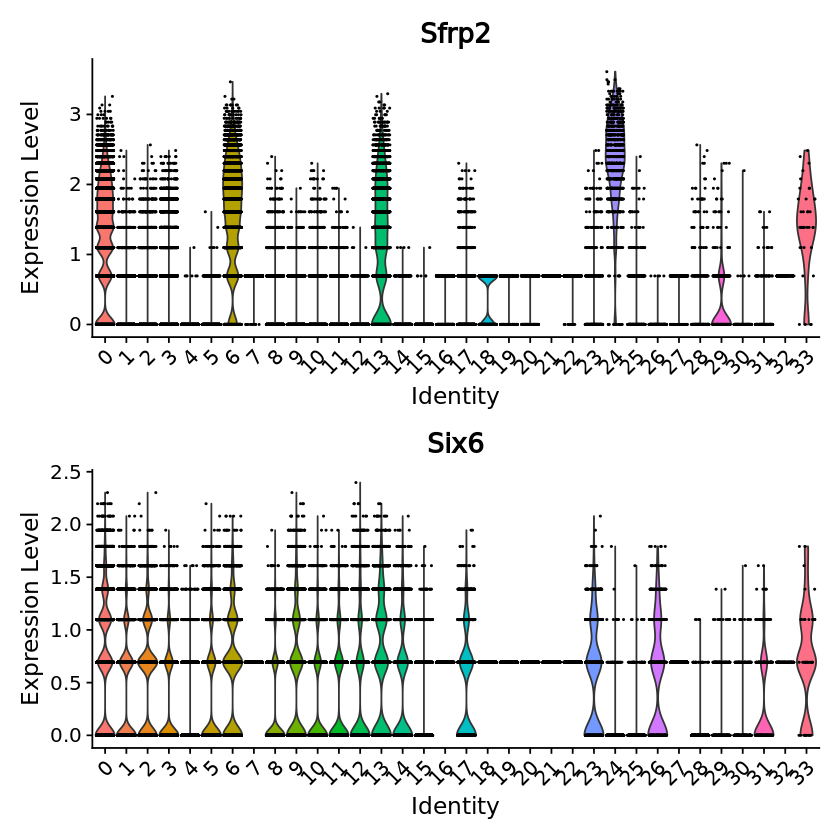

In [47]:
#find markers for non integrated dataset
#changed to integrated with adult
VlnPlot(seurat_integrated, features = c("Sfrp2","Six6"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



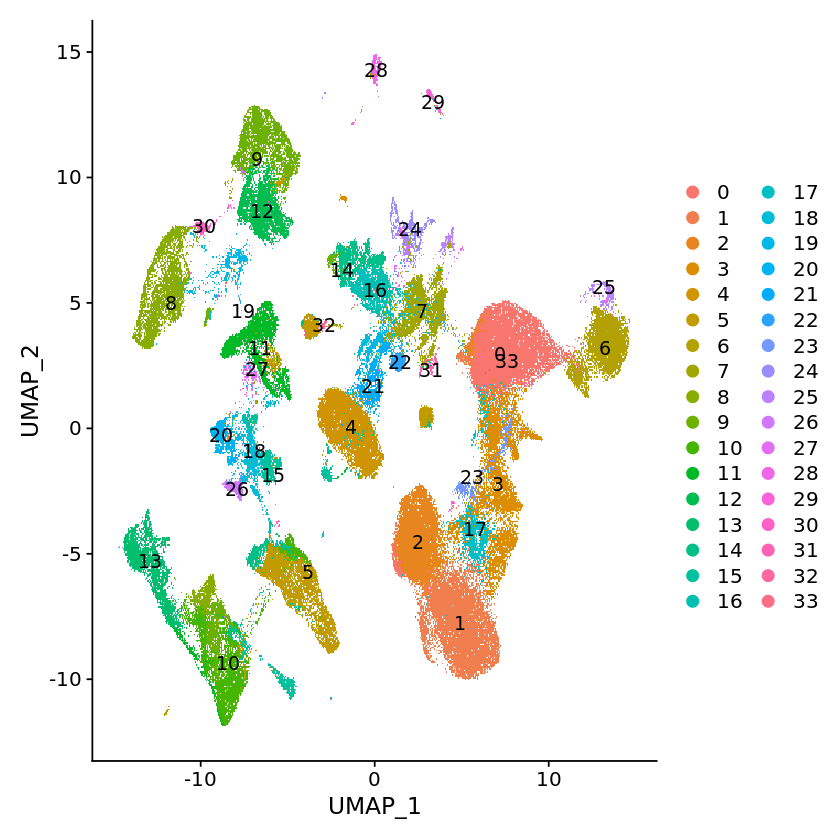

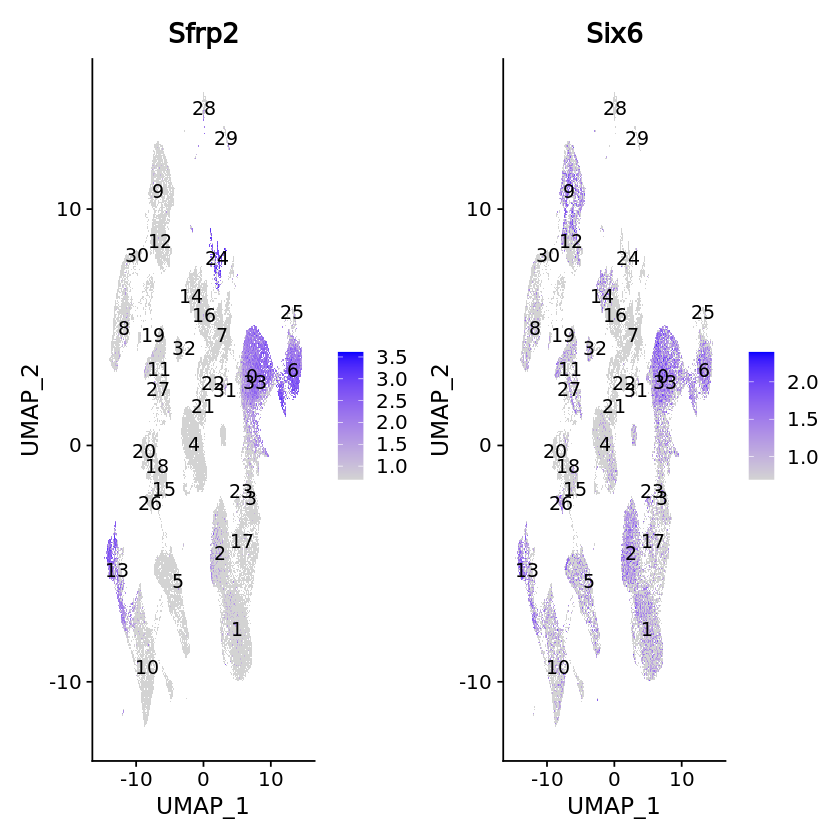

In [4]:
#early RPC
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Sfrp2","Six6"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



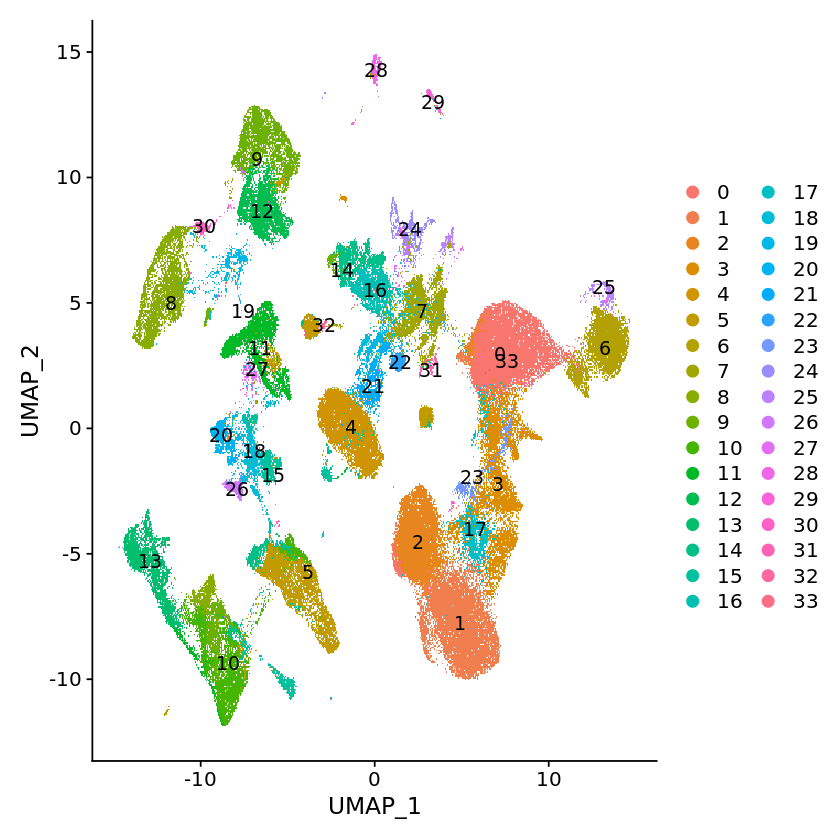

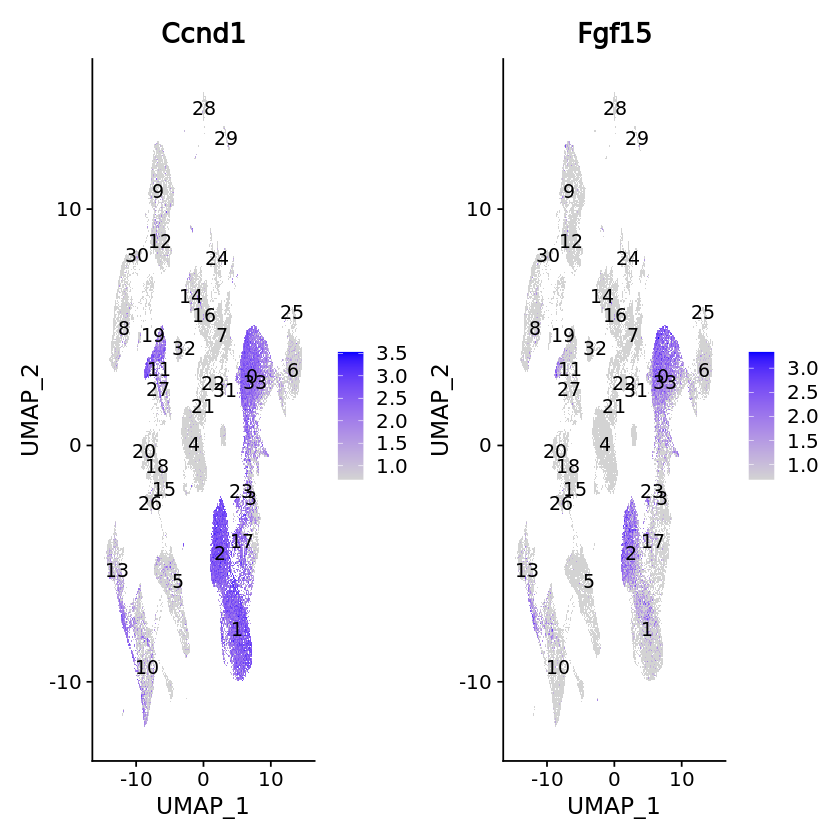

In [5]:
#early RPC
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Ccnd1","Fgf15"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

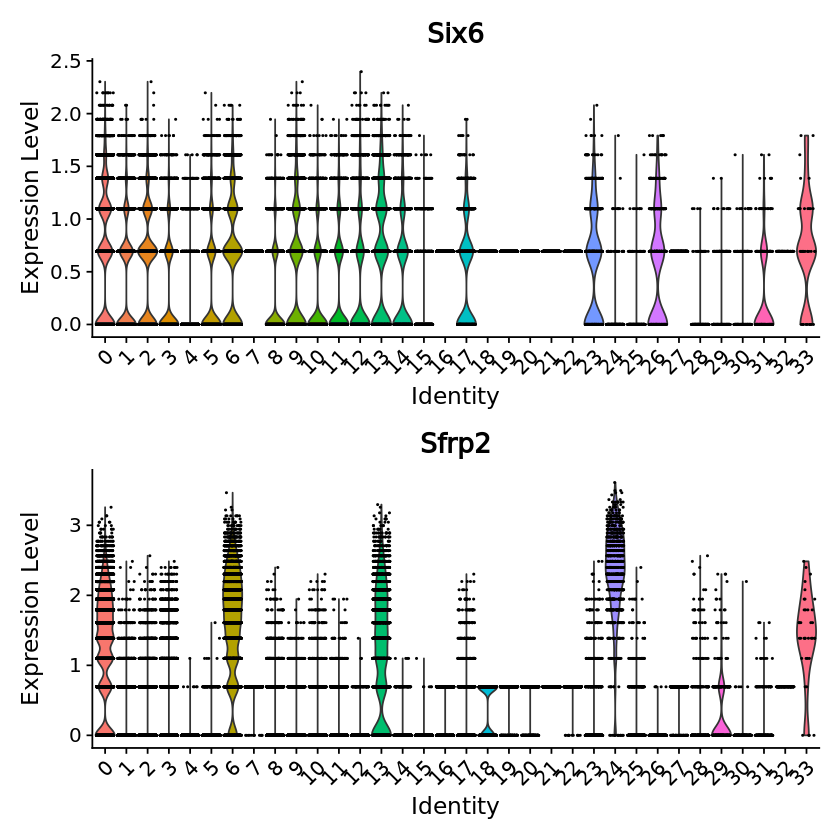

In [7]:
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Six6", "Sfrp2"),
       pt.size = 0.2, ncol = 1)


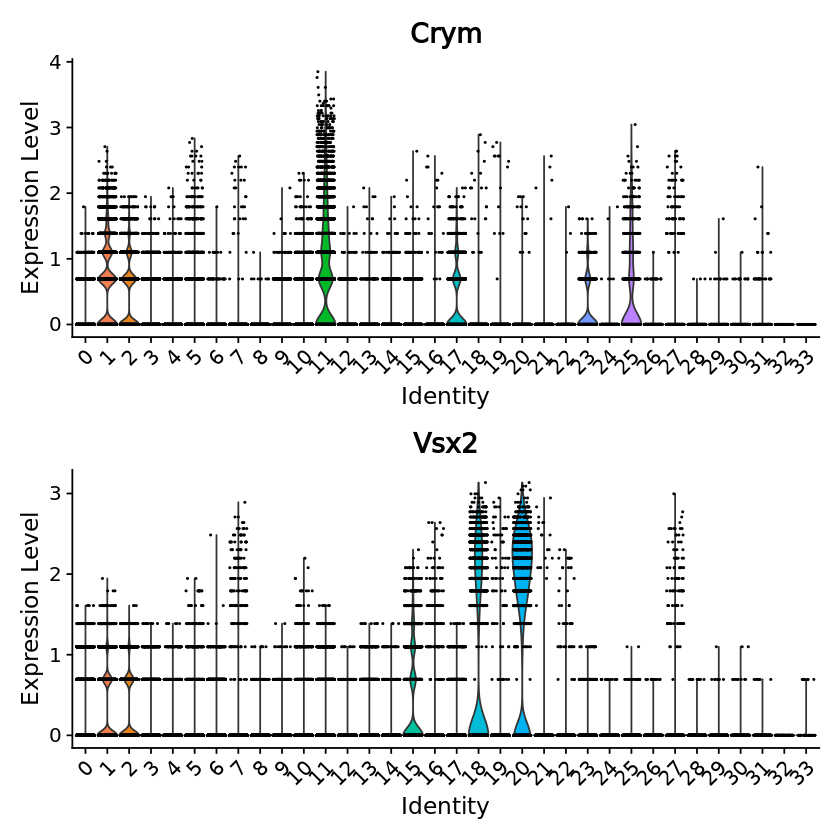

In [4]:
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Crym", "Vsx2"),
       pt.size = 0.2, ncol = 1)


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



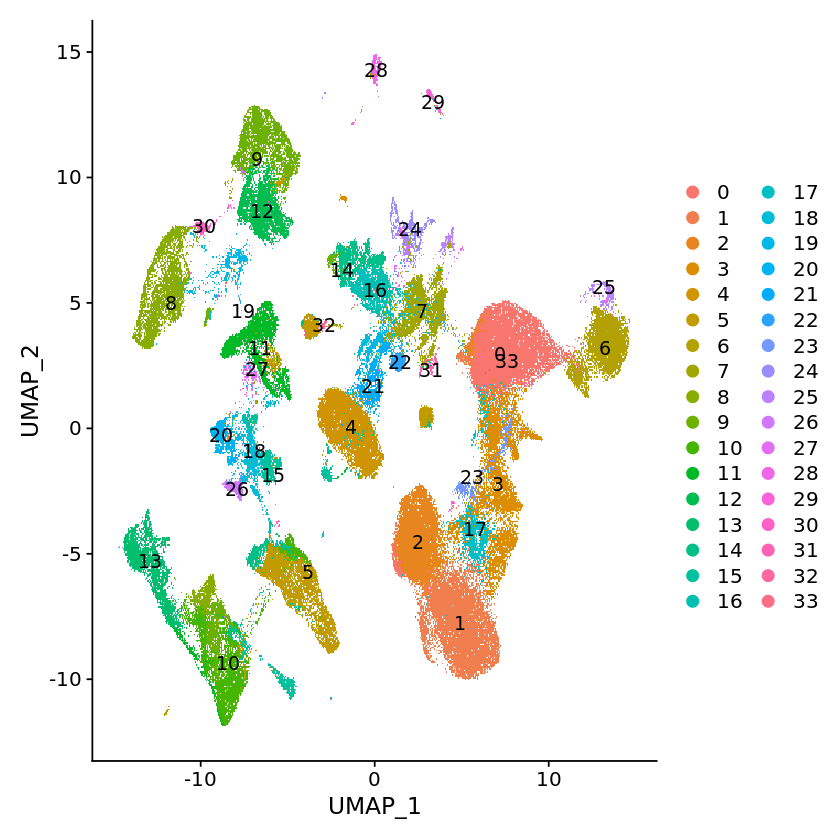

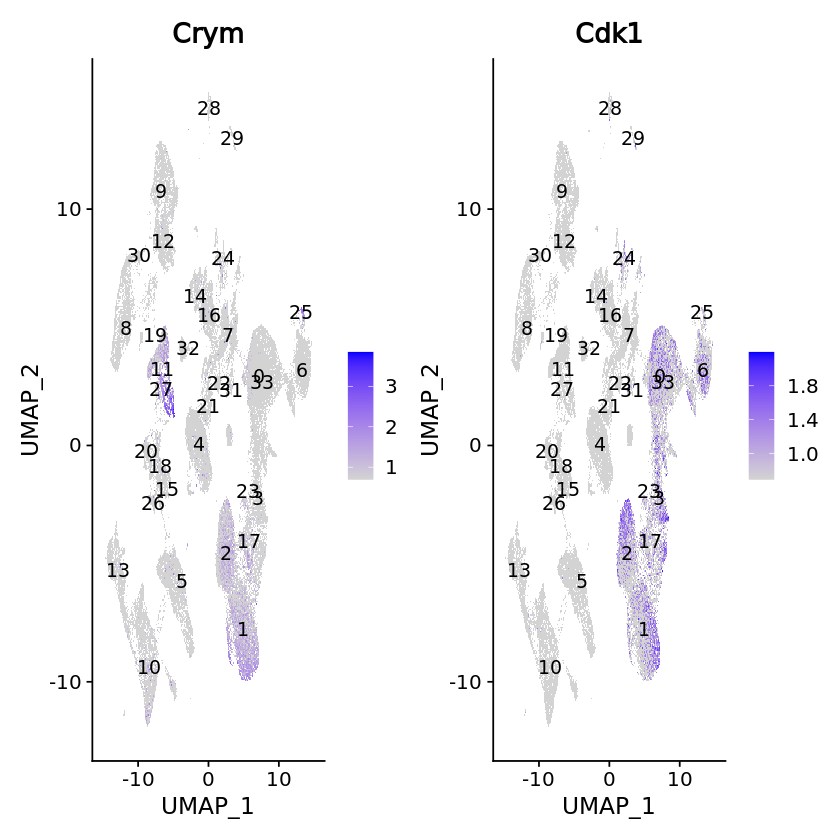

In [6]:
#late RPC
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Crym", "Cdk1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



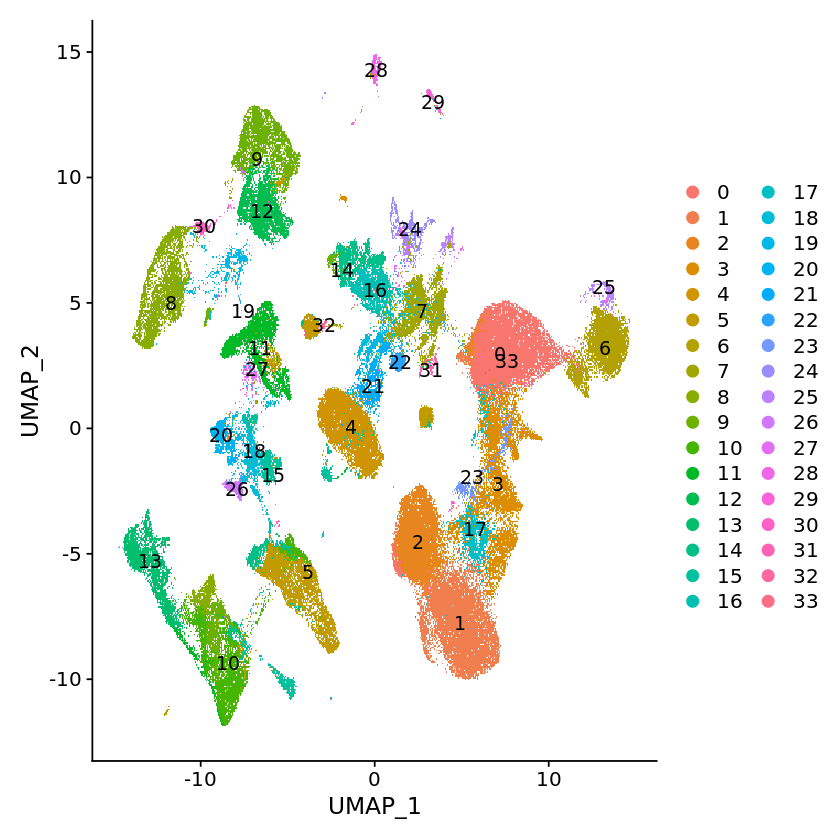

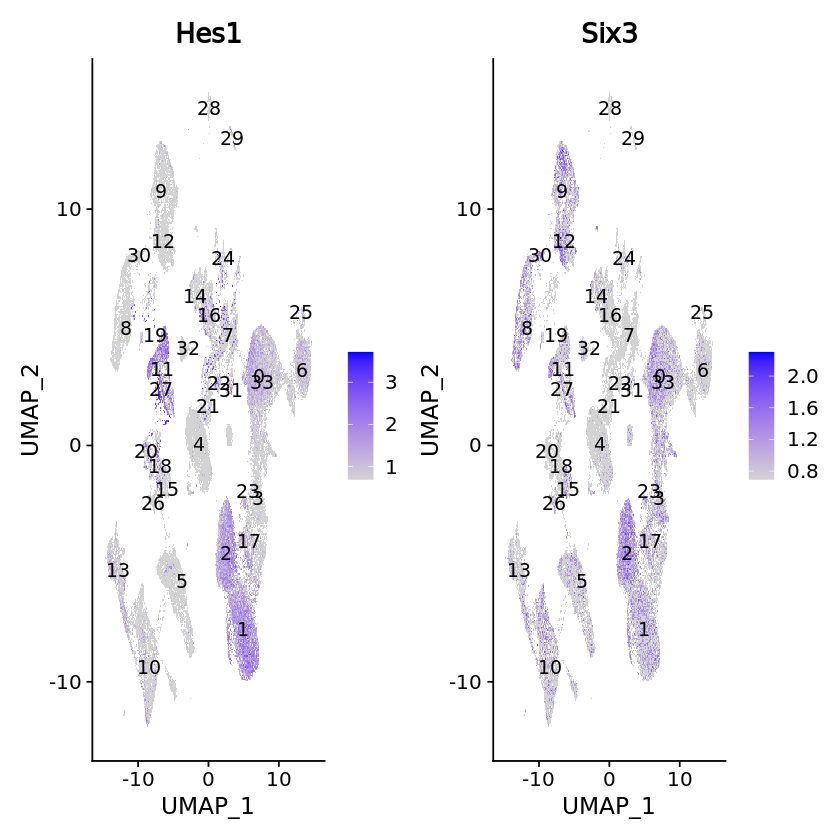

In [8]:
#late RPC
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Hes1", "Six3"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

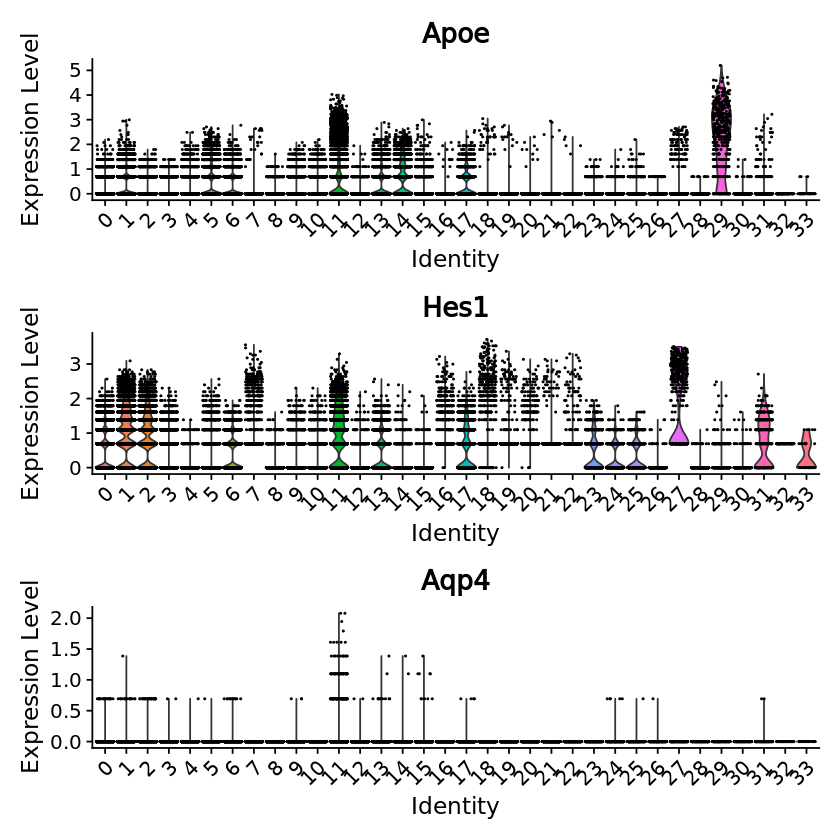

In [10]:
#Muller
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Apoe","Hes1","Aqp4"),
       pt.size = 0.2, ncol = 1)

In [16]:
options(repr.plot.width = 10, repr.plot.height = 7)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



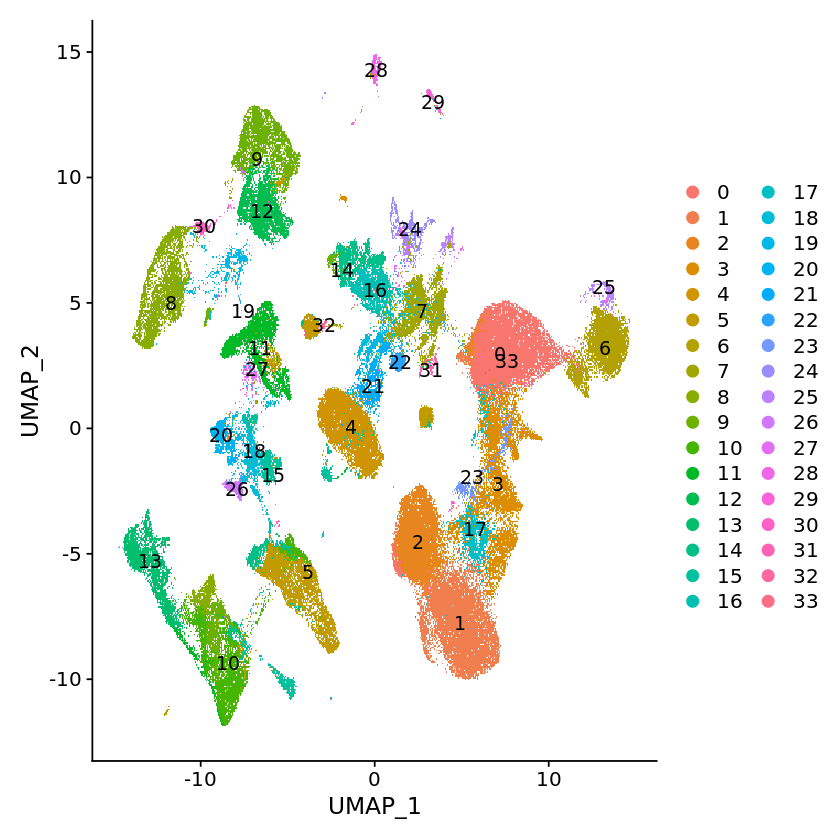

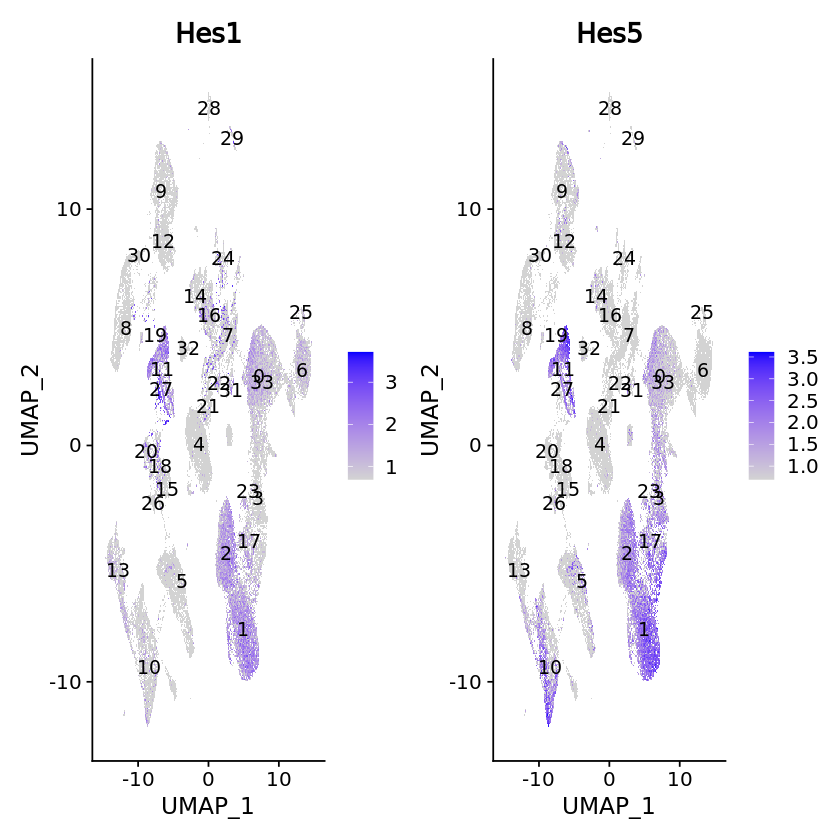

In [14]:
#Muller
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Hes1","Hes5"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



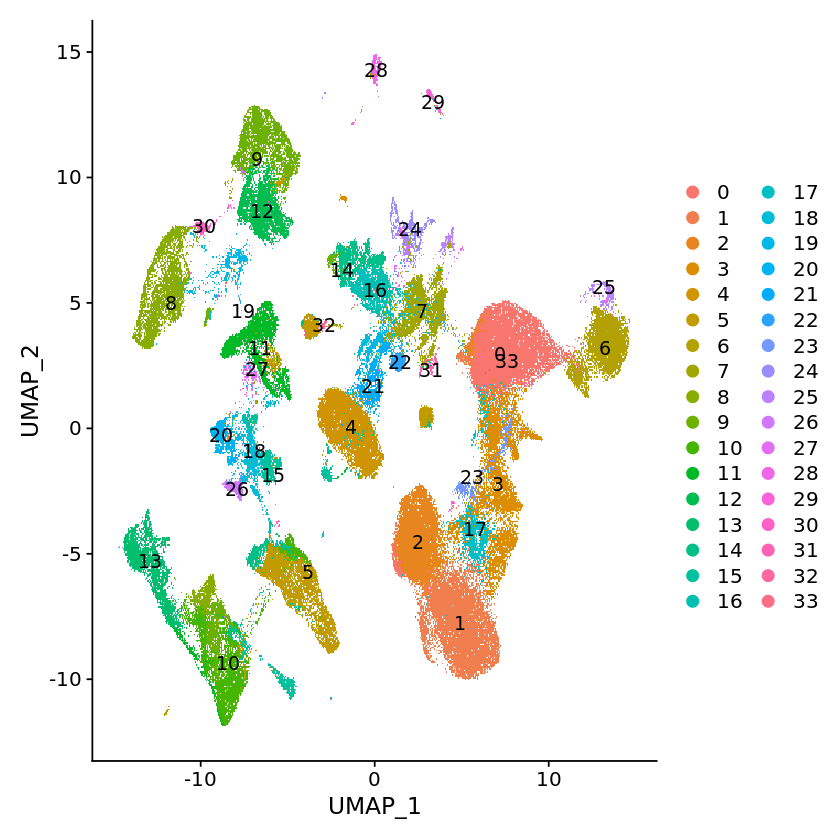

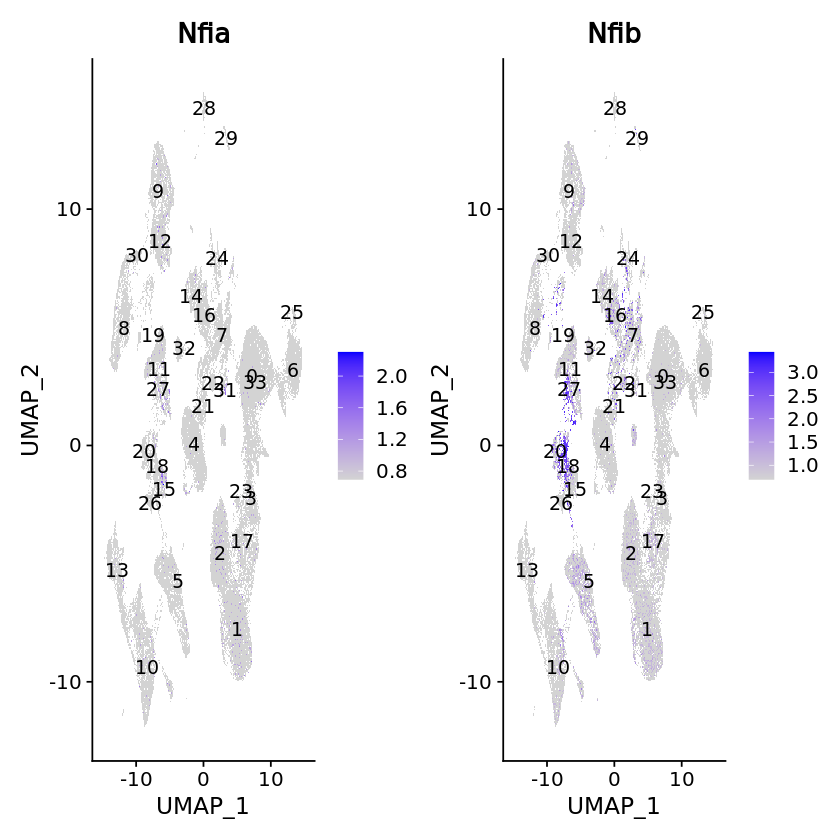

In [15]:
#Muller
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Nfia","Nfib"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

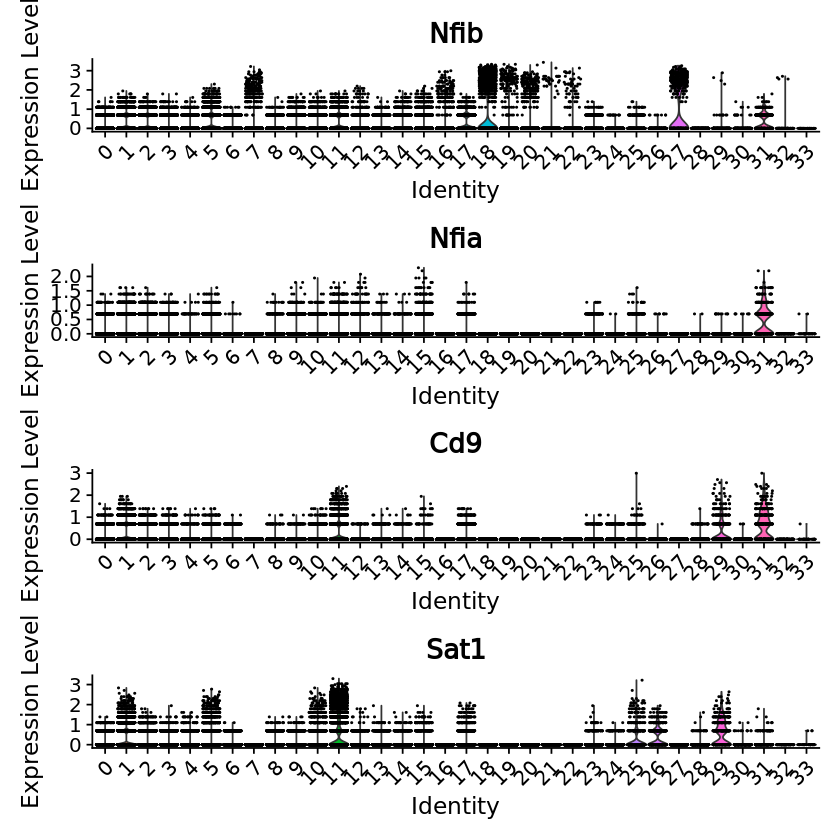

In [16]:
#Muller
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Nfib", "Nfia","Cd9","Sat1"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



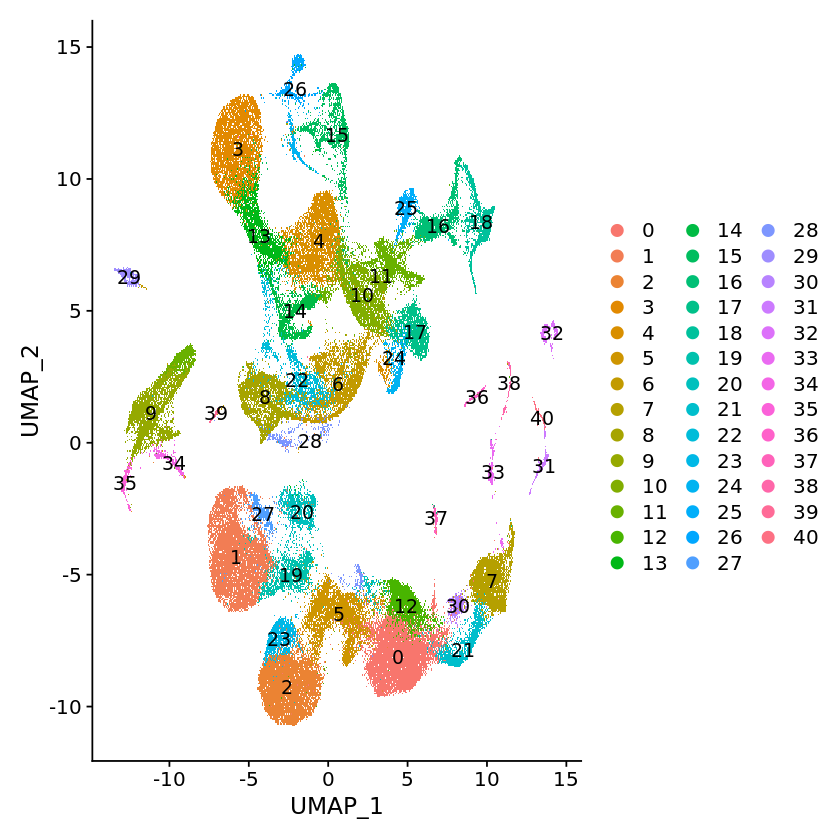

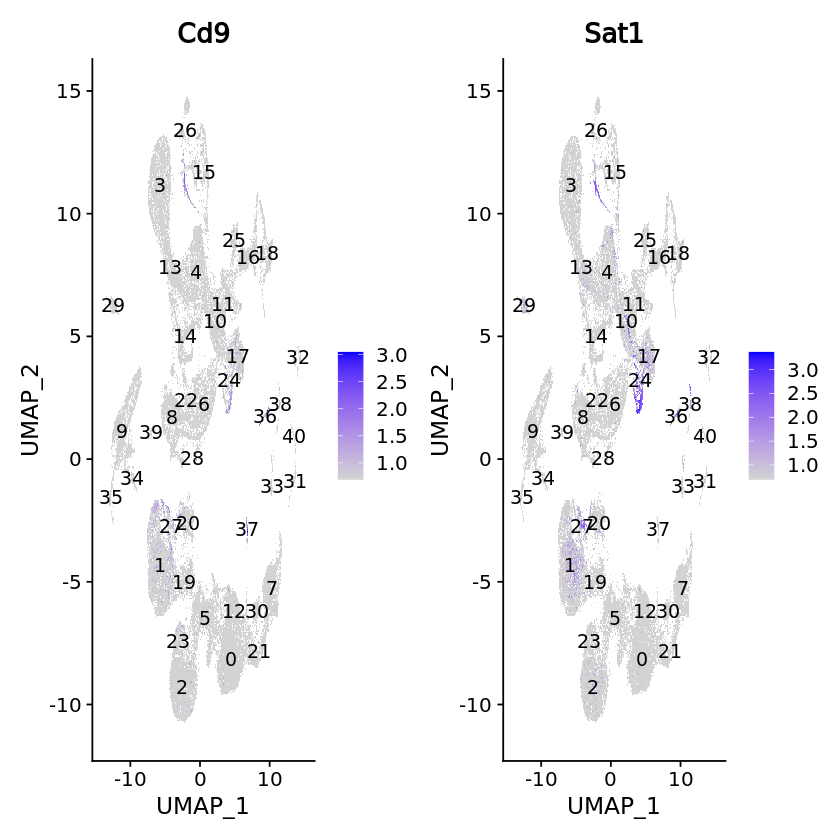

In [13]:
DimPlot(object = seurat_phase_new, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_phase_new, 
            reduction = "umap", 
            features = c("Cd9","Sat1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



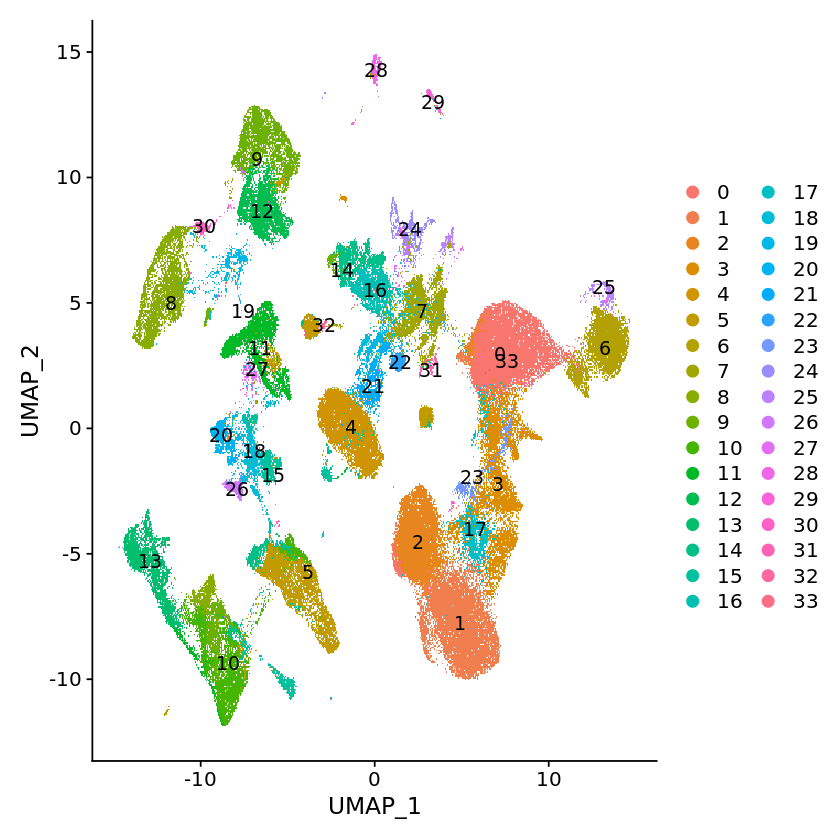

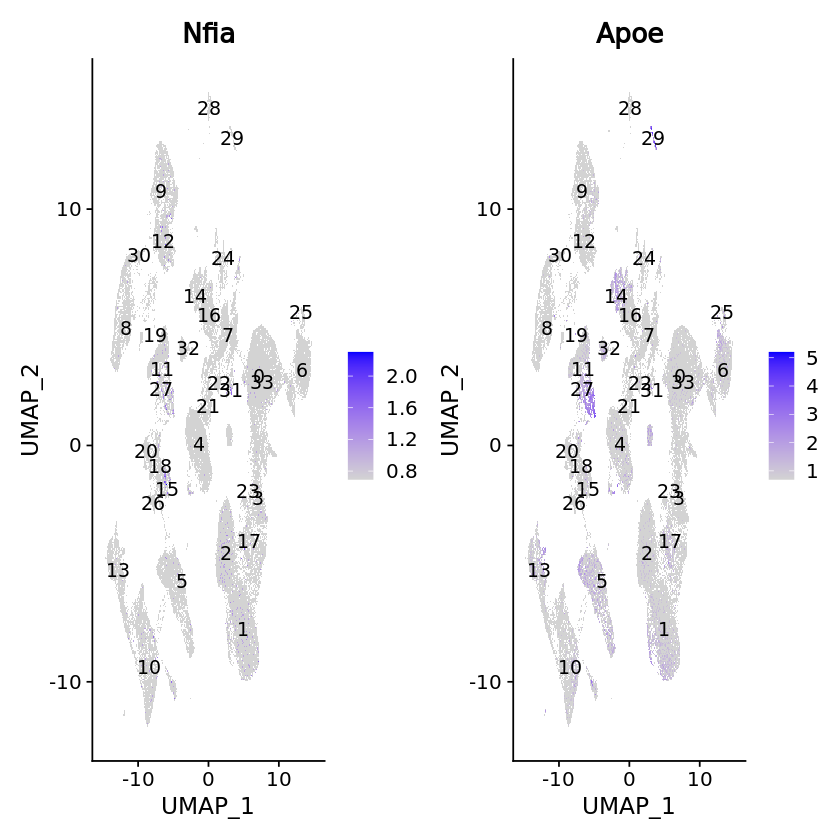

In [17]:
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Nfia", "Apoe"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



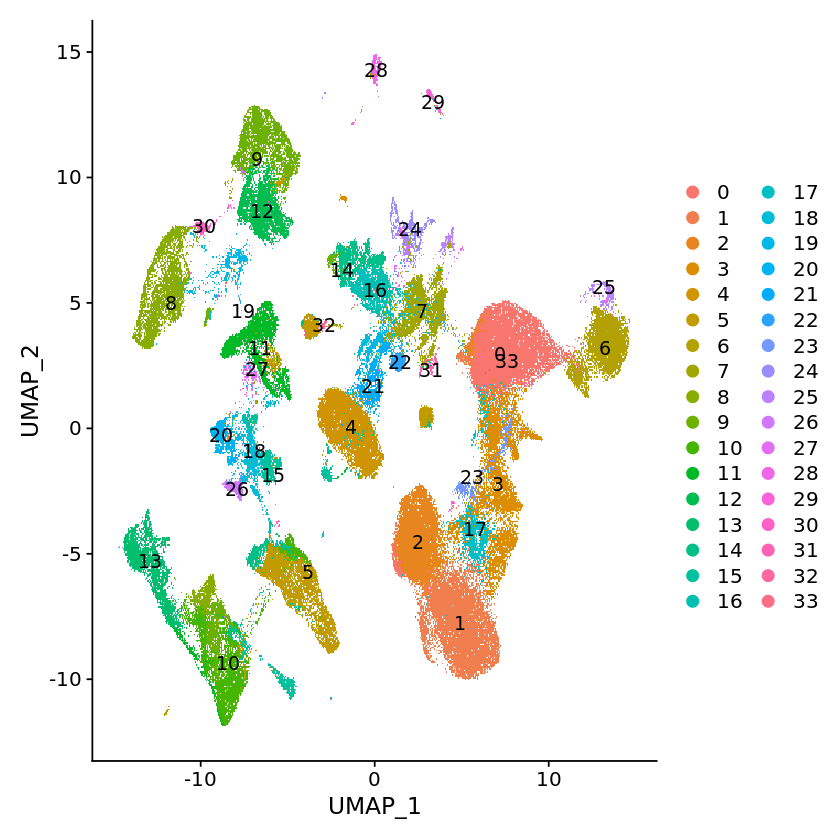

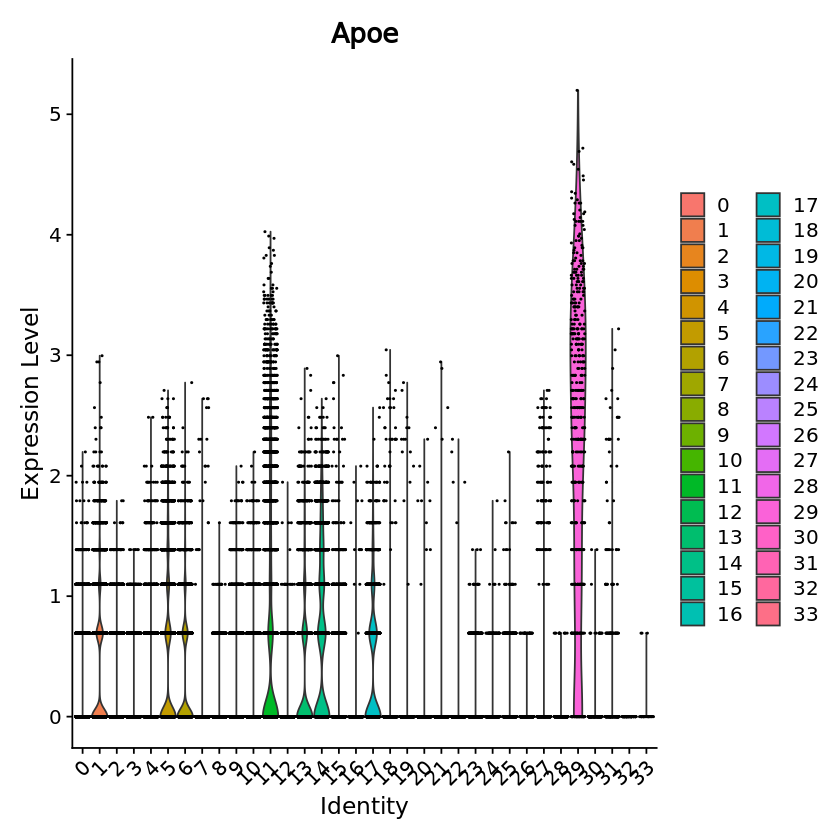

In [4]:
#Muller
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)


#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Apoe"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



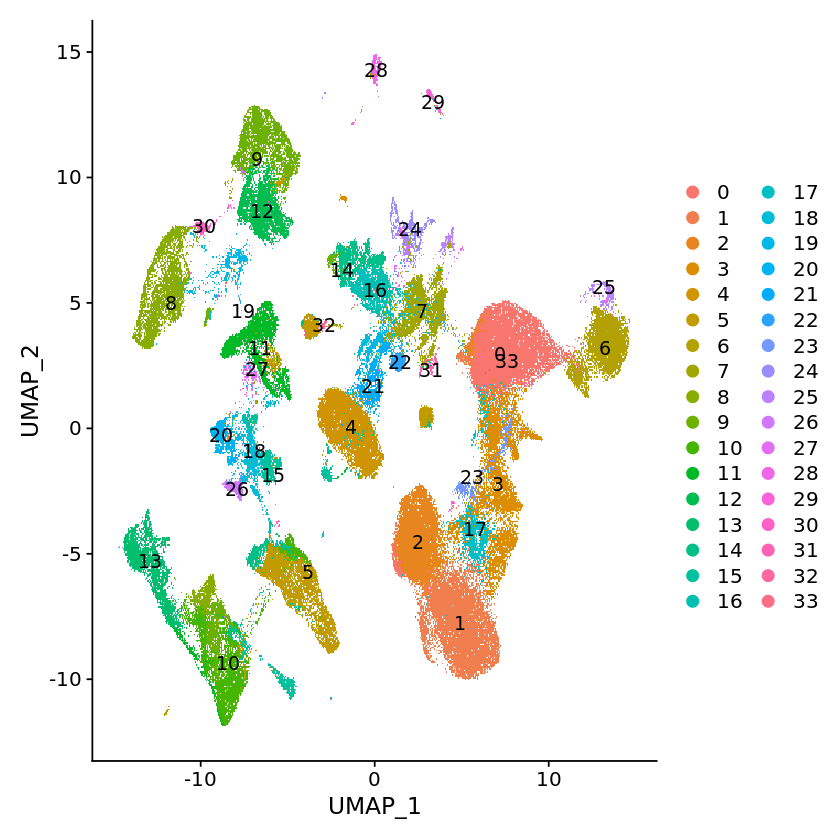

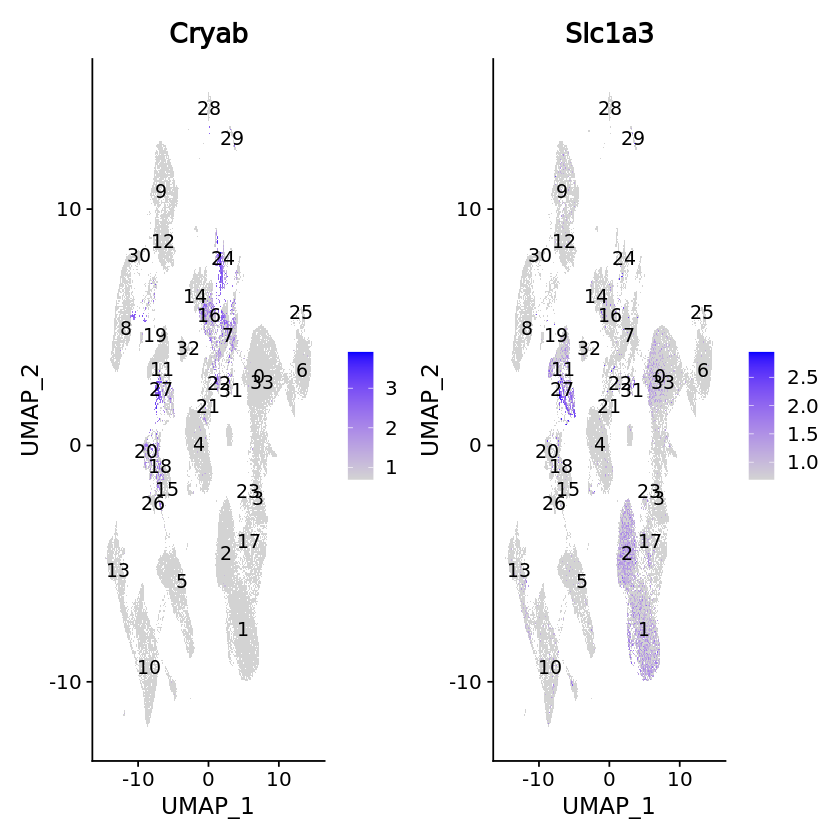

In [5]:
#muller
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Cryab", "Slc1a3"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

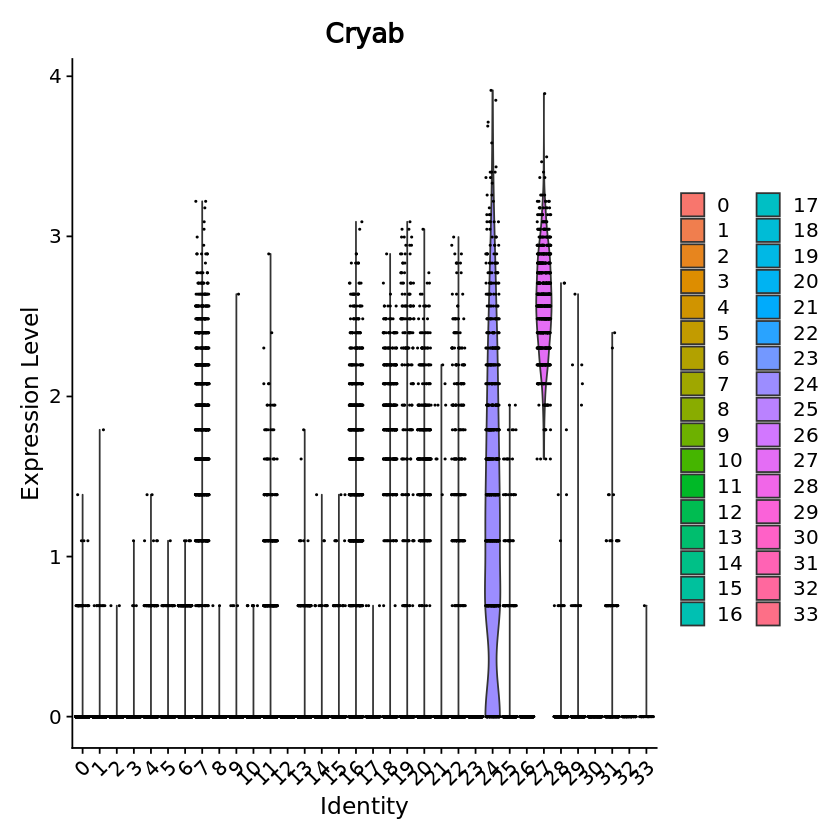

In [6]:
#Muller
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Cryab"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



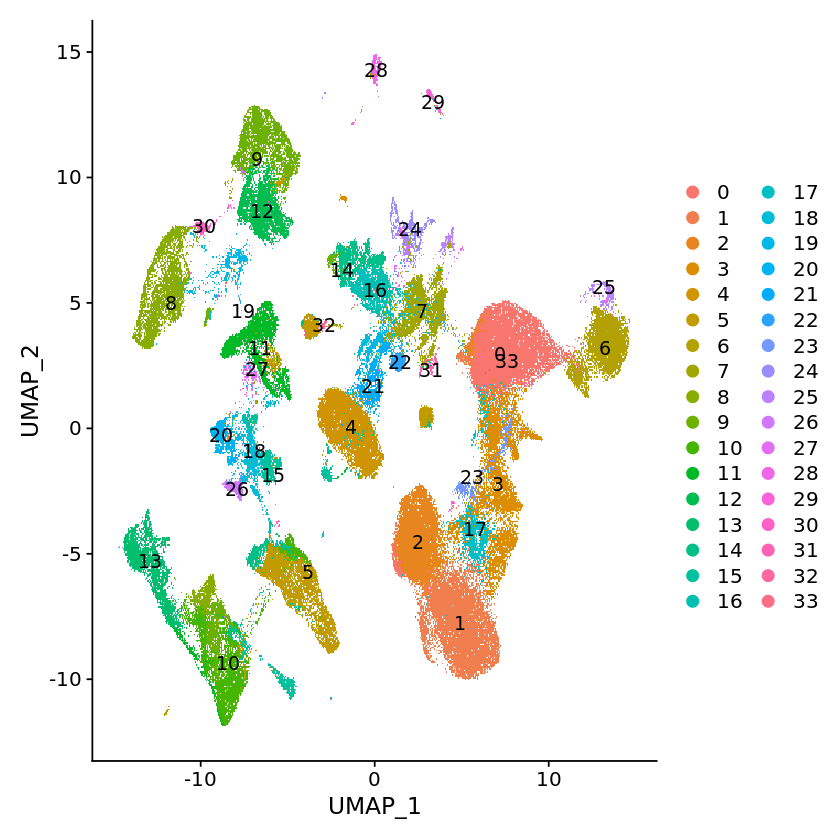

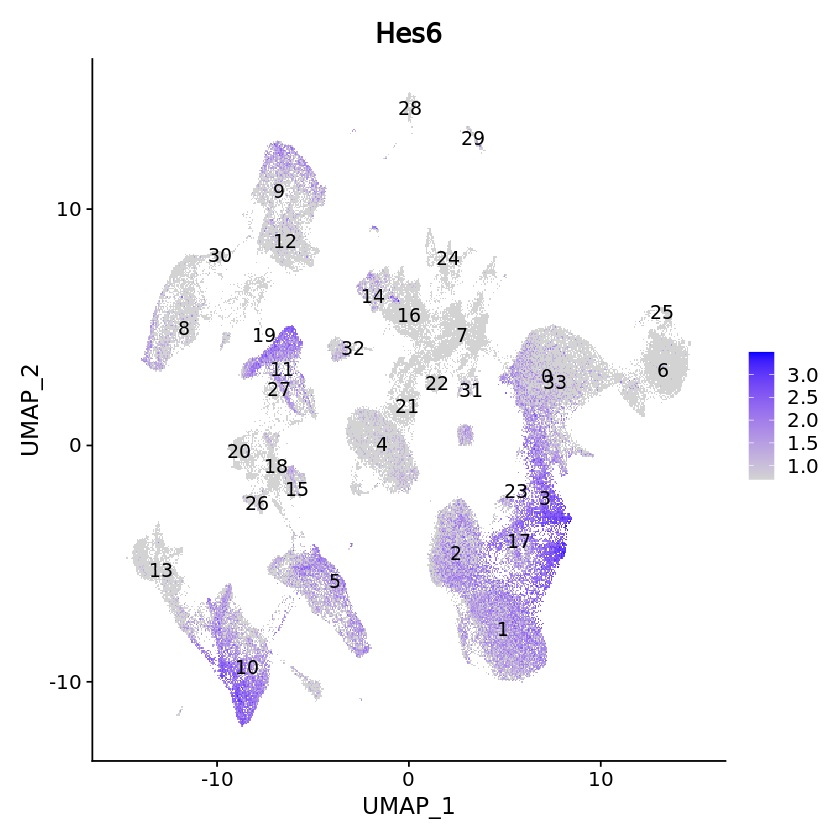

In [7]:
#neurogenic
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c( "Hes6"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

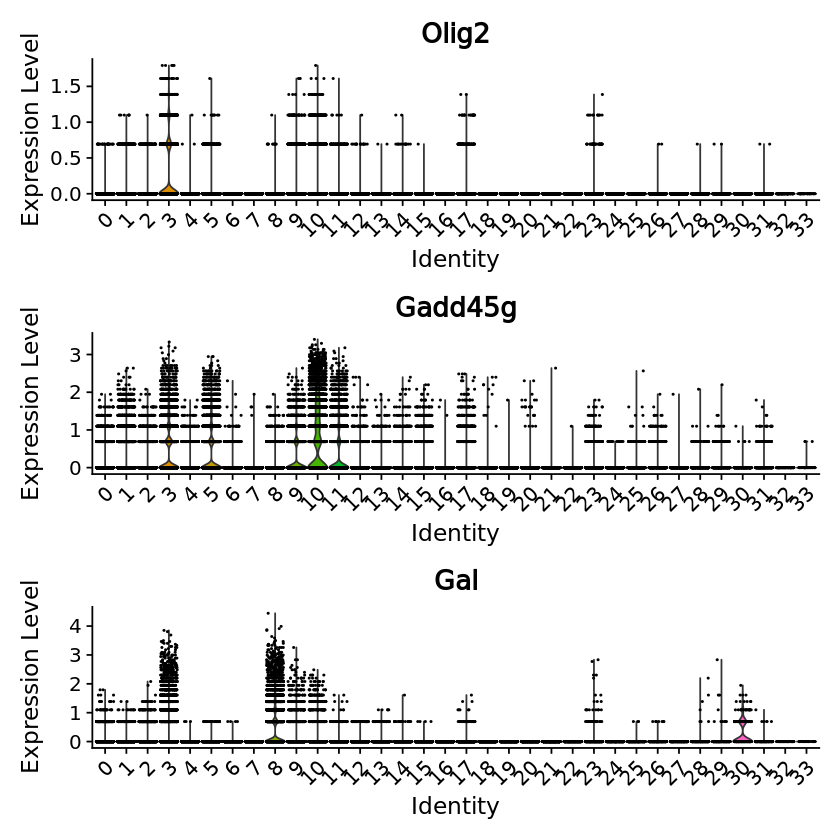

In [8]:
#Neurogenic
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Olig2","Gadd45g","Gal"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



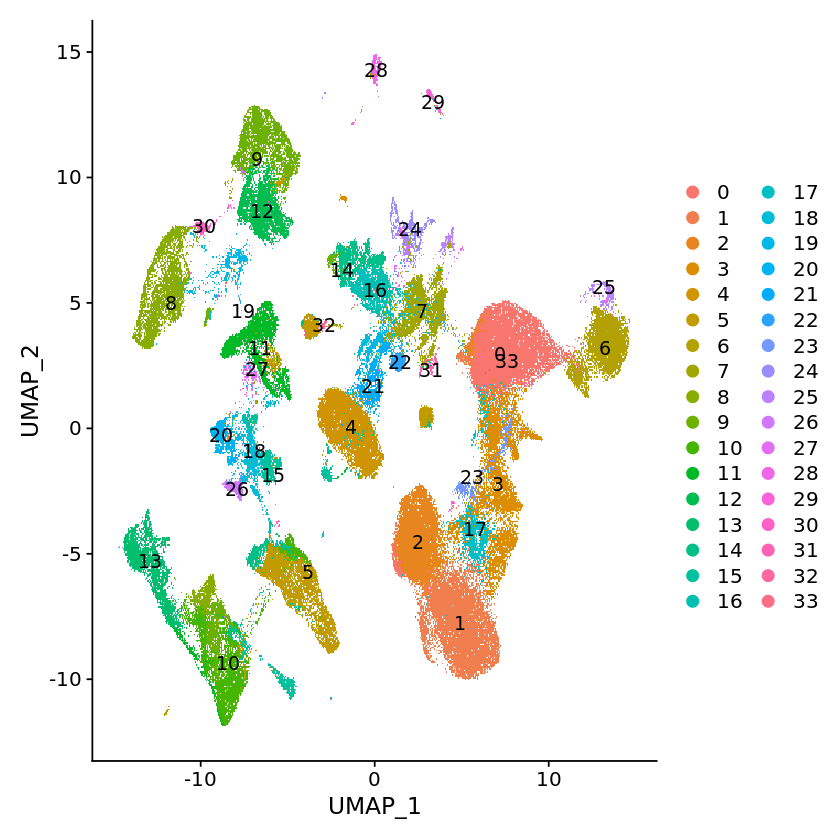

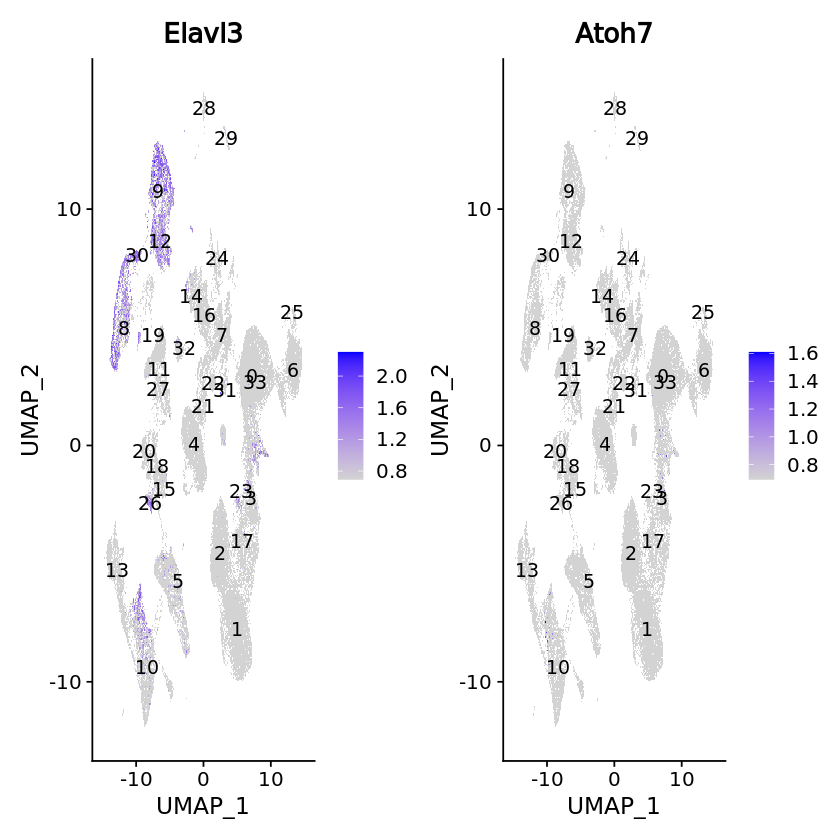

In [11]:
#neurogenic
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c( "Elavl3", "Atoh7"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



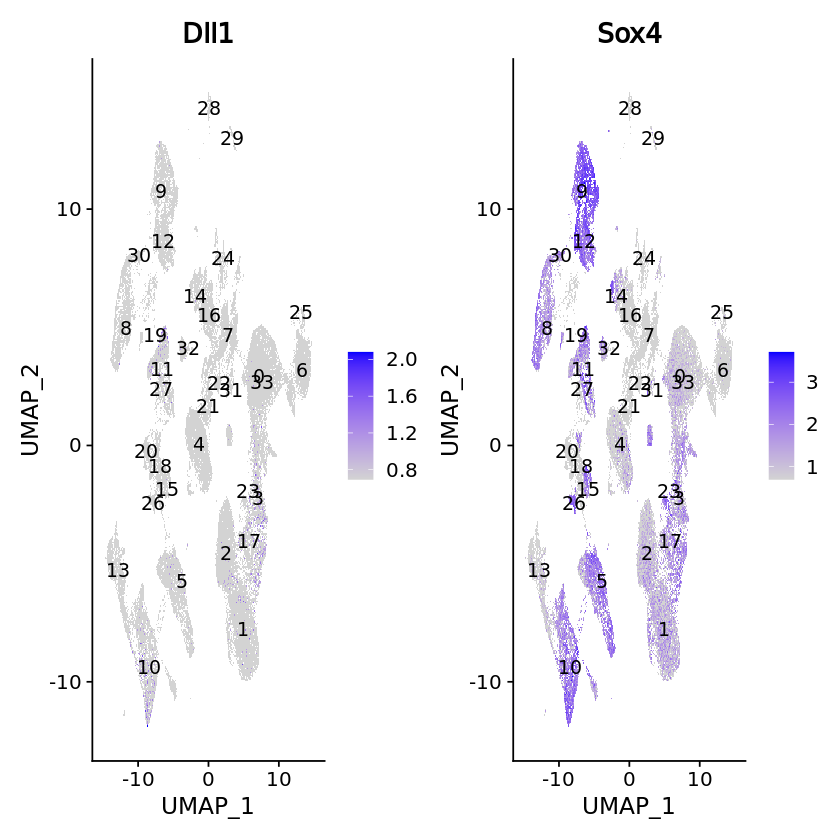

In [25]:
FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Dll1", "Sox4"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

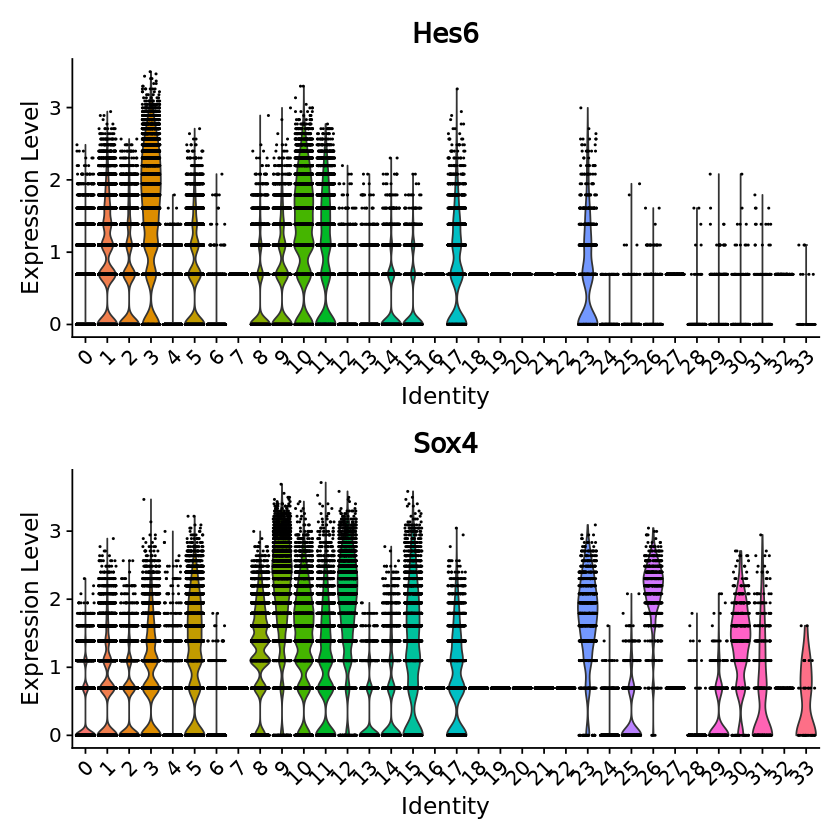

In [24]:
#Neurogenic
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Hes6","Sox4"),
       pt.size = 0.2, ncol = 1)

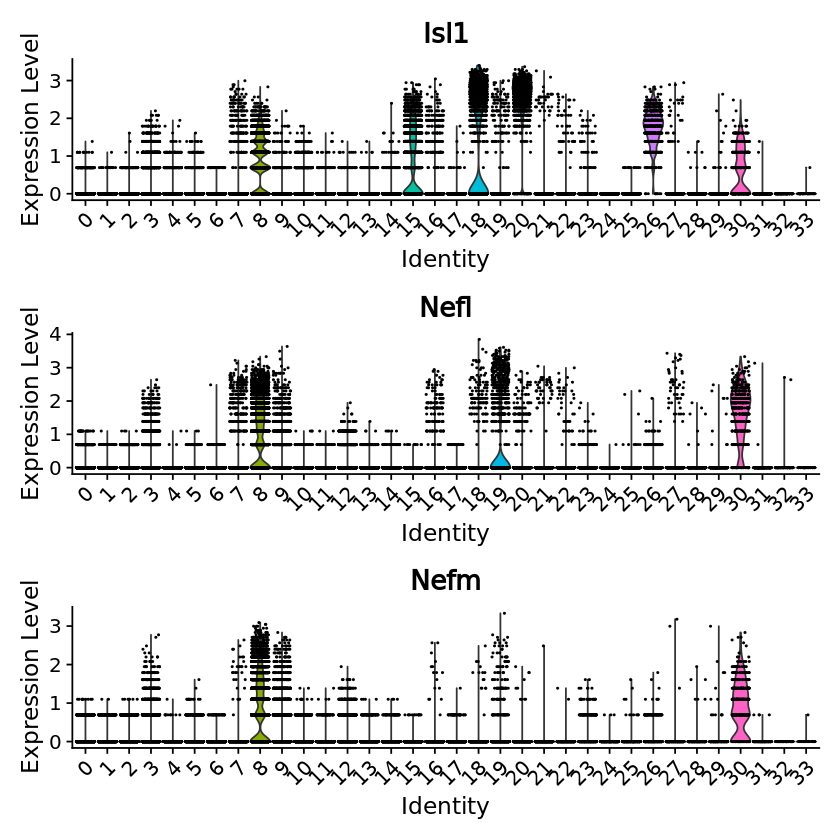

In [28]:
#Bipolar
#find markers for non integrated datase
VlnPlot(seurat_adult_integrated, features = c("Isl1","Nefl", "Nefm"),
       pt.size = 0.2, ncol = 1)

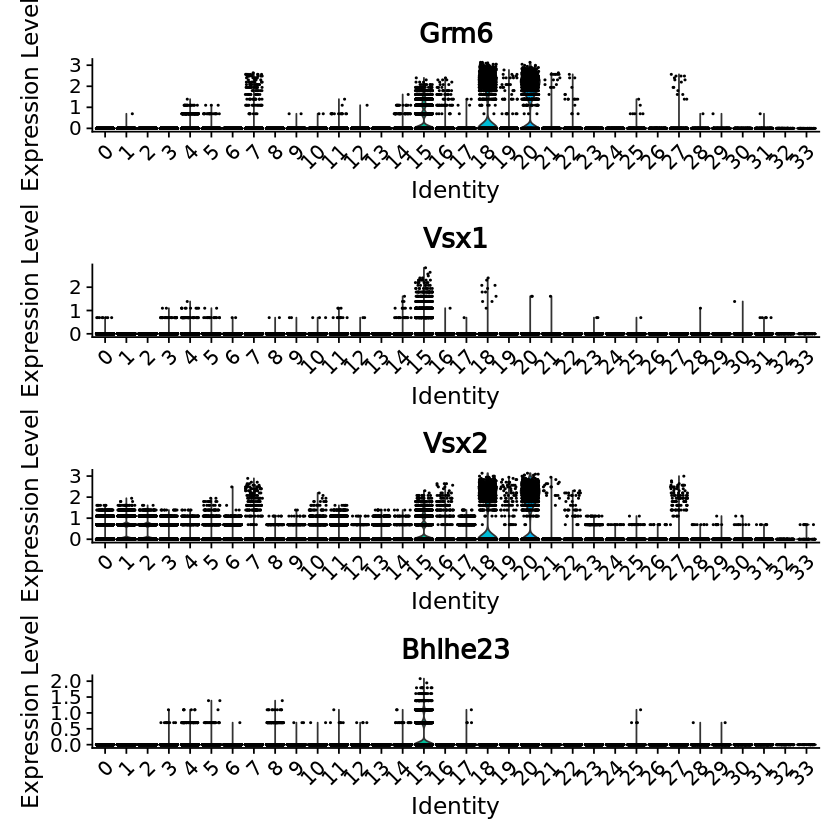

In [29]:
#Bipolar
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Grm6","Vsx1","Vsx2","Bhlhe23"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



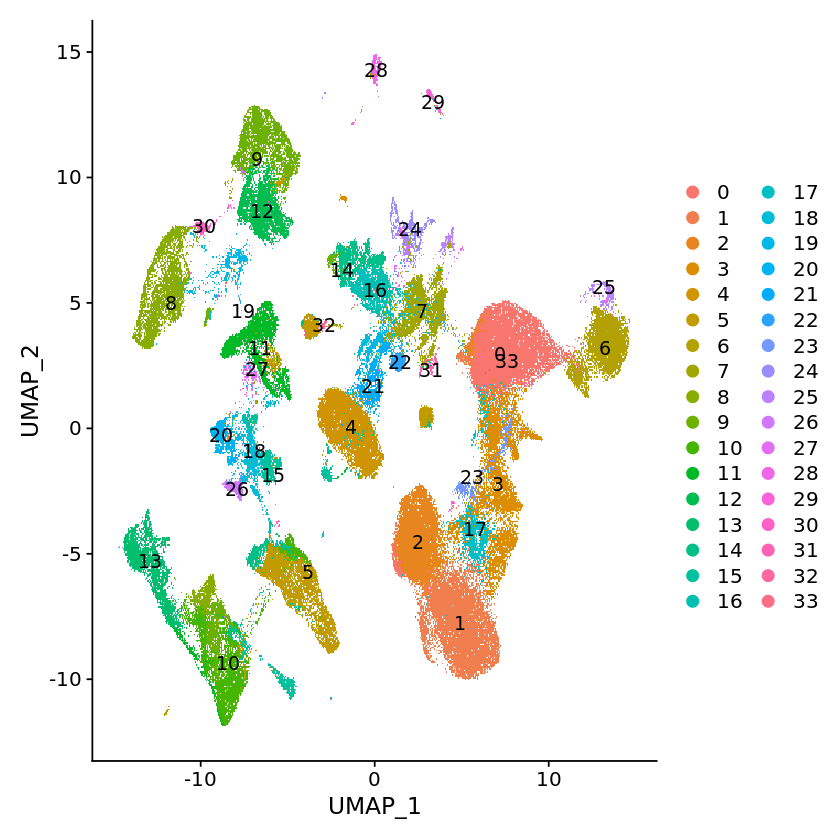

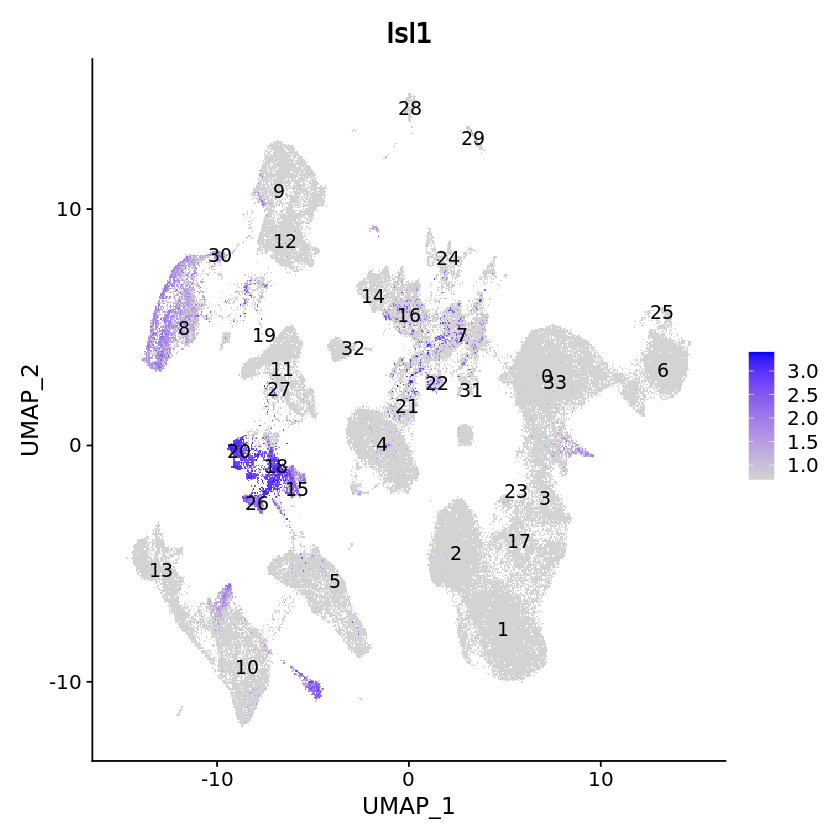

In [33]:
#bipolar
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c( "Isl1"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: Pkca”


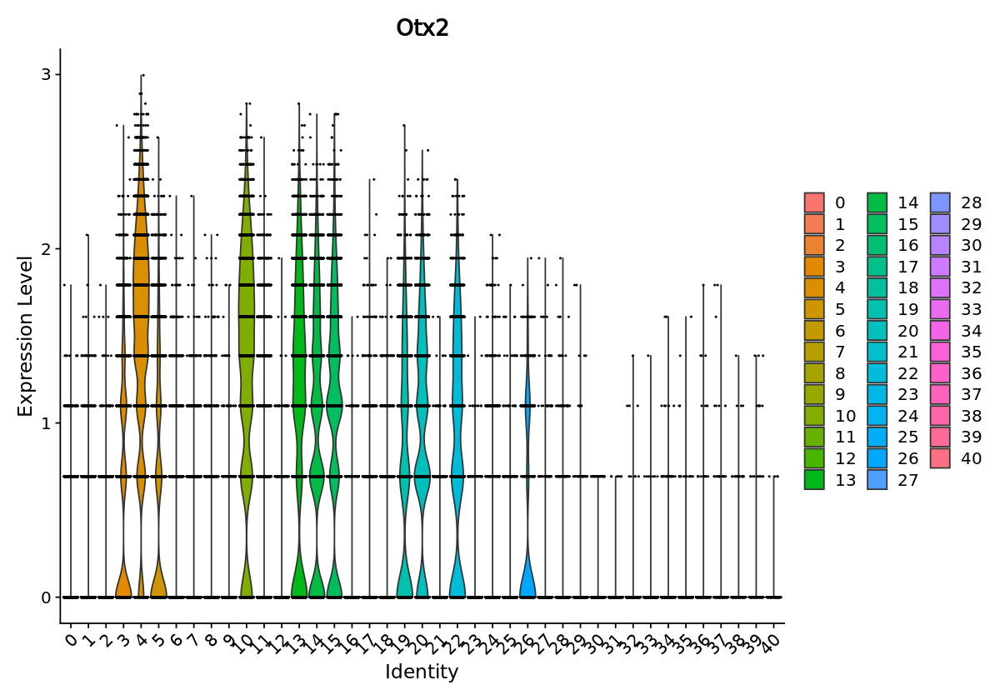

In [30]:
#Bipolar
#find markers for non integrated dataset
VlnPlot(seurat_phase_new, features = c("Pkca","Otx2"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



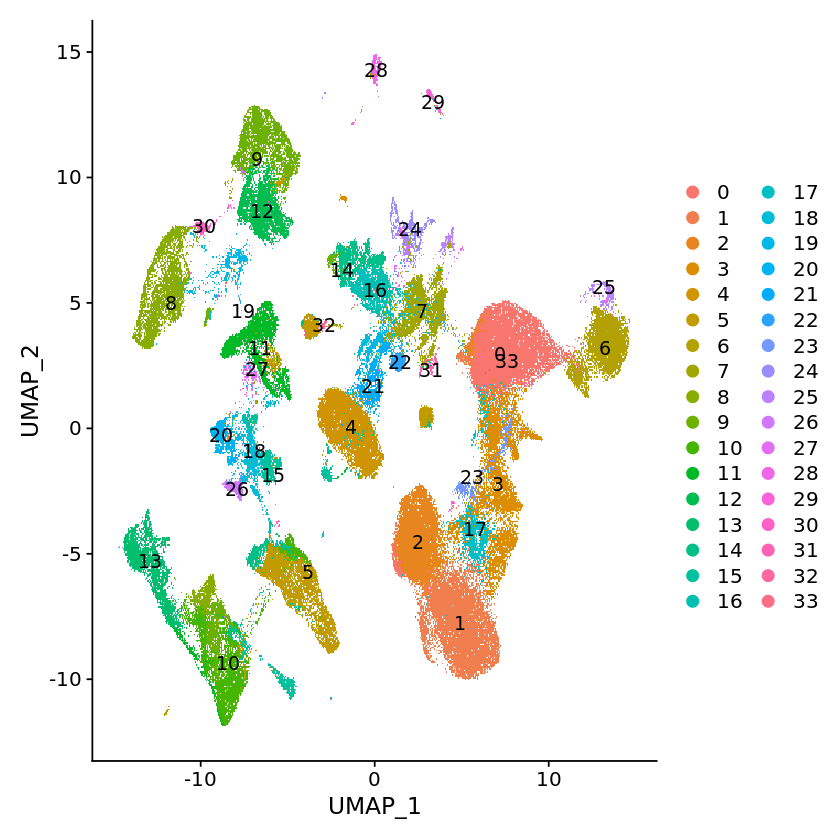

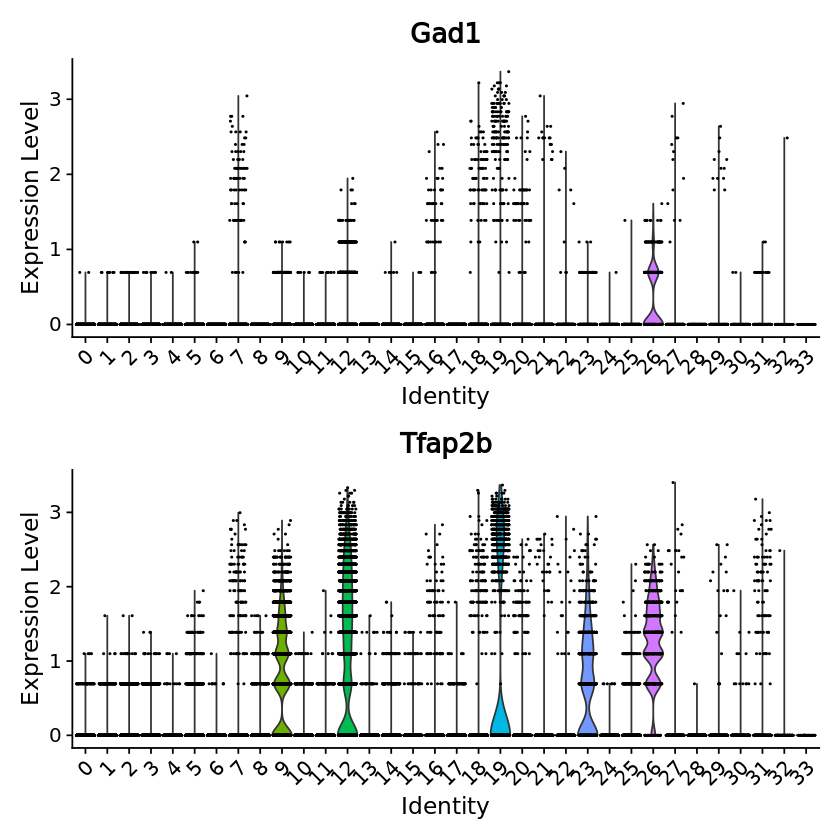

In [34]:
#amaccrine
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Gad1","Tfap2b"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



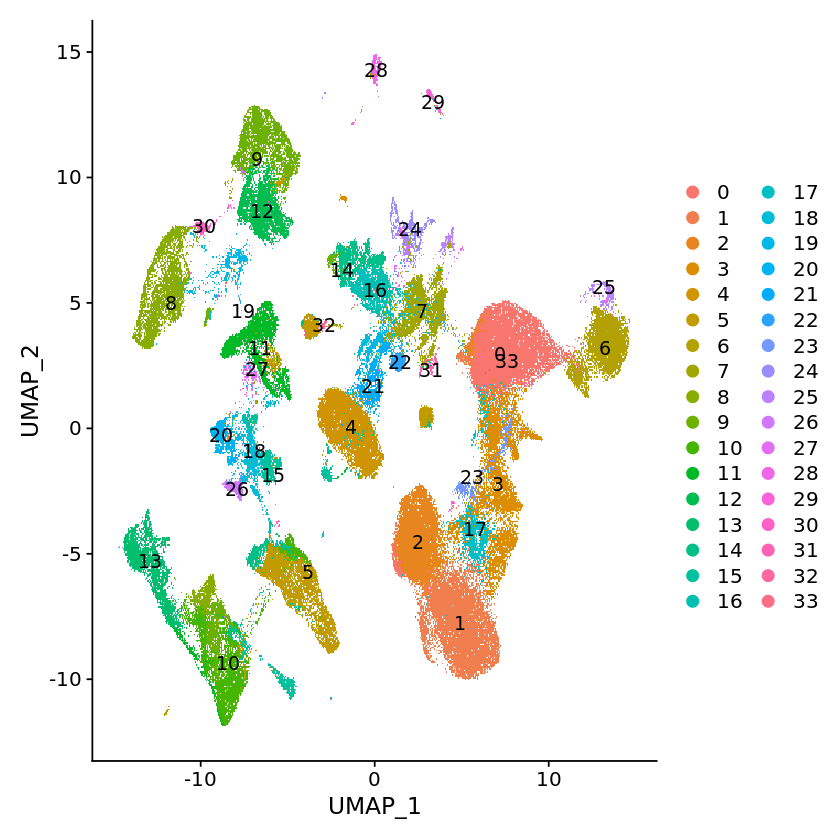

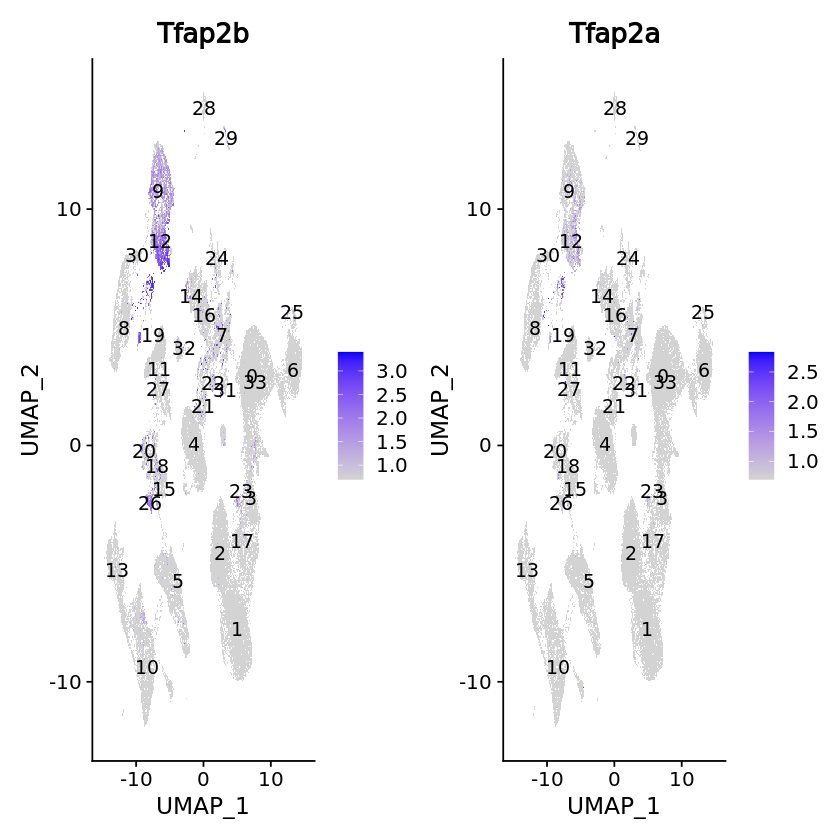

In [37]:
#amaccrine
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Tfap2b", "Tfap2a"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



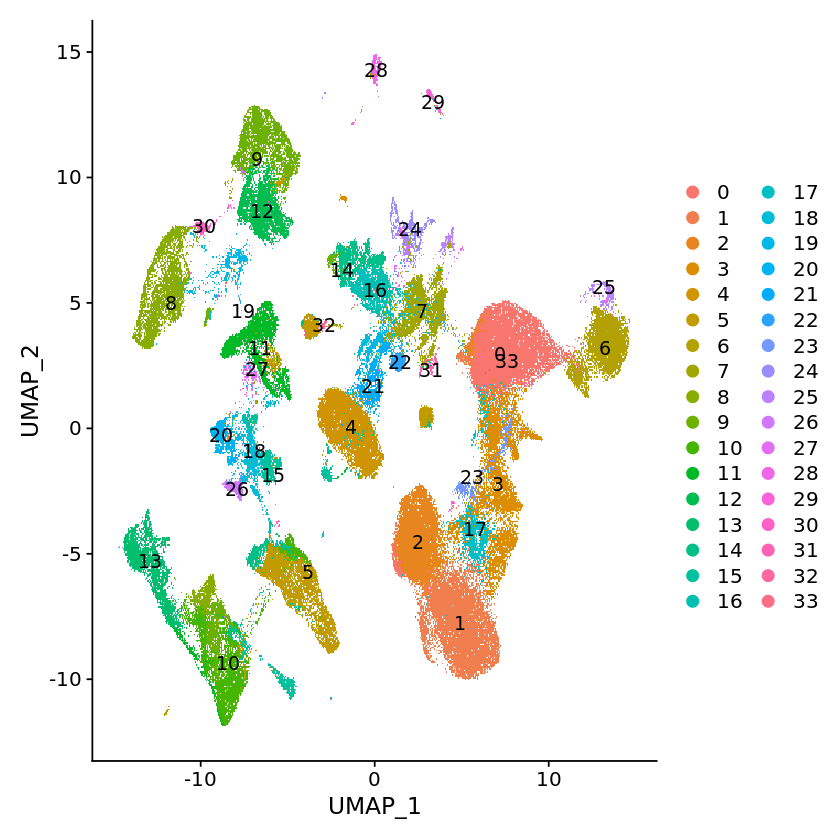

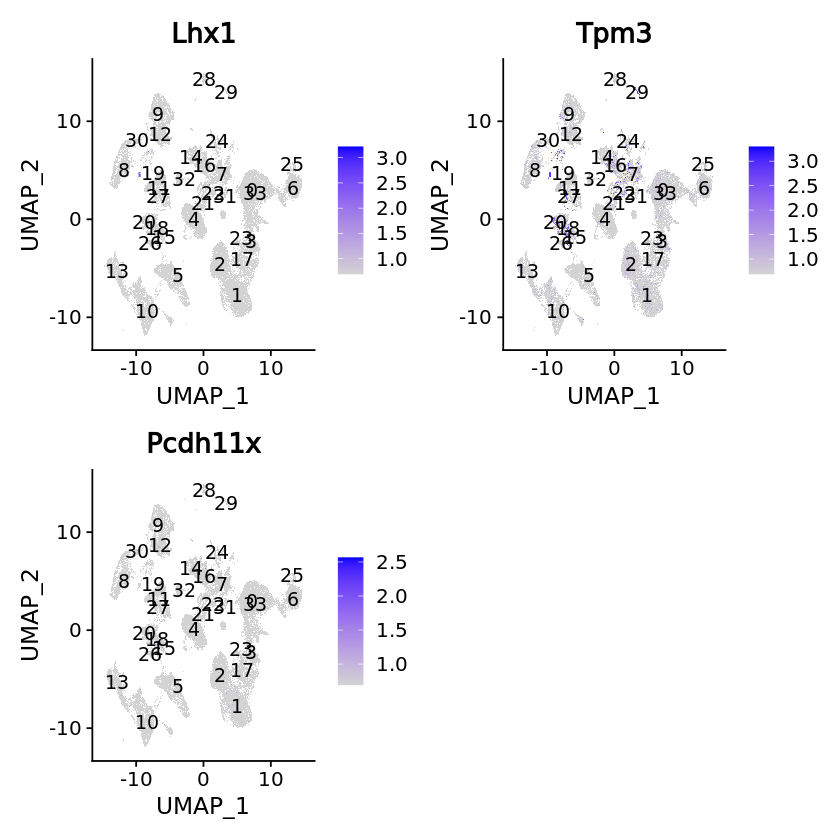

In [39]:
#amaccrine
DimPlot(object = seurat_adult_integrated, 
        reduction = "umap", 
        label = TRUE)

FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Lhx1", "Tpm3","Pcdh11x"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

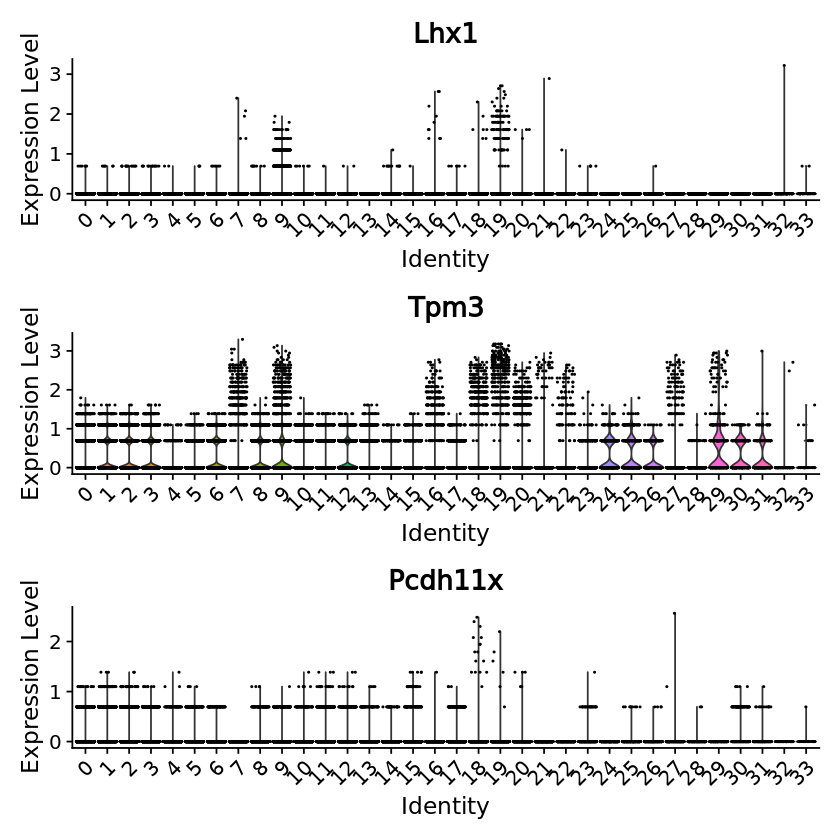

In [38]:
#horizontal
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Lhx1", "Tpm3","Pcdh11x"),
       pt.size = 0.2, ncol = 1)

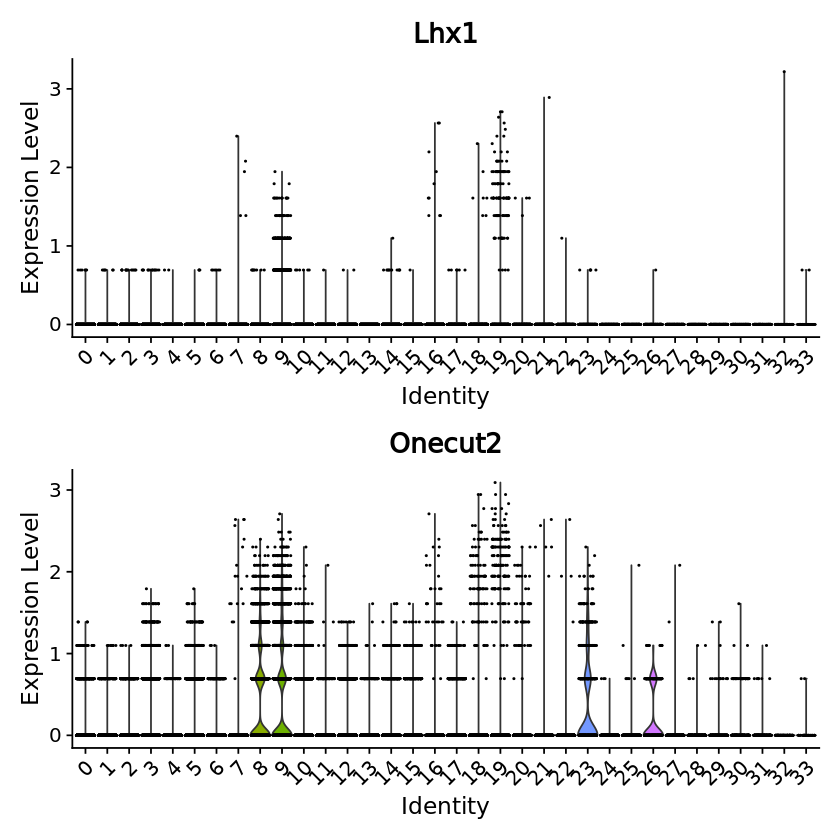

In [41]:
#horizontal
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Lhx1", "Onecut2"),
       pt.size = 0.2, ncol = 1)

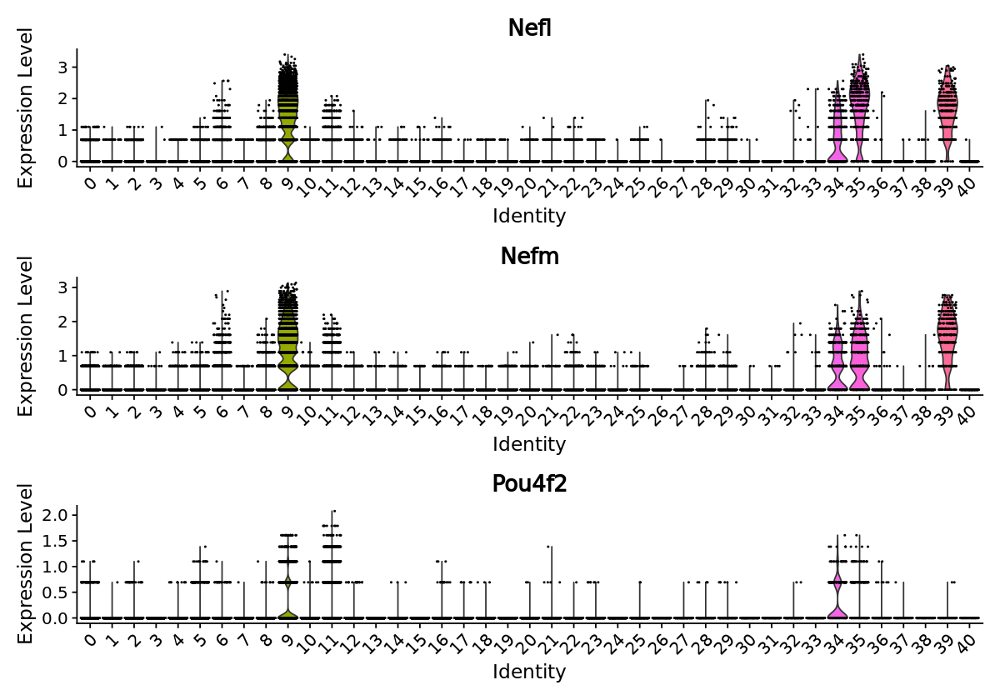

In [36]:
#RGC
#find markers for non integrated dataset
VlnPlot(seurat_phase_new, features = c("Nefl","Nefm","Pou4f2"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



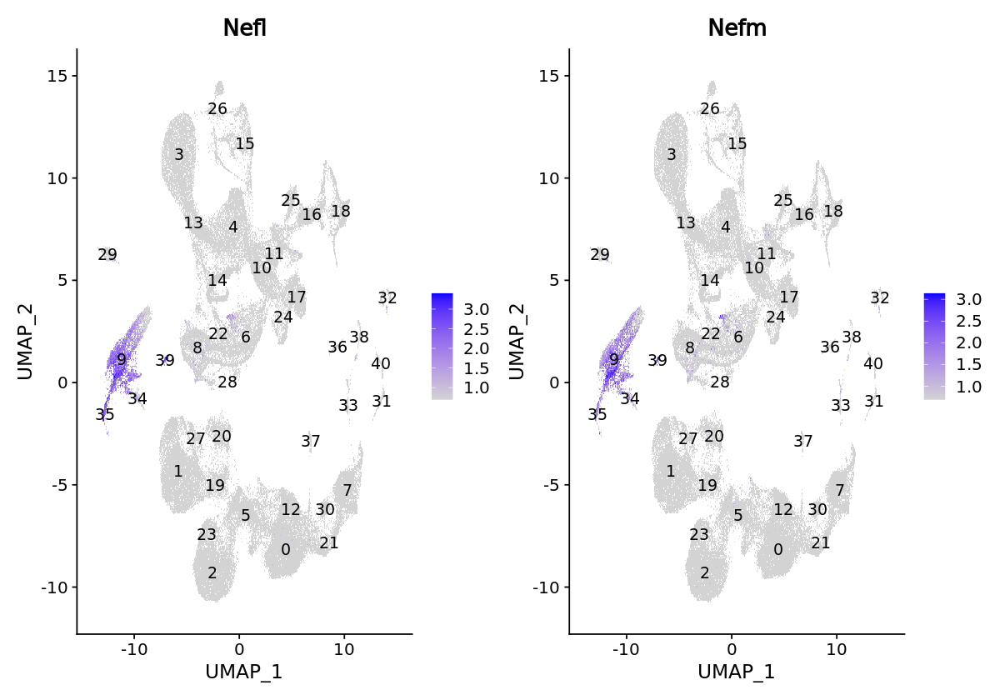

In [37]:
FeaturePlot(seurat_phase_new, 
            reduction = "umap", 
            features = c("Nefl","Nefm"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



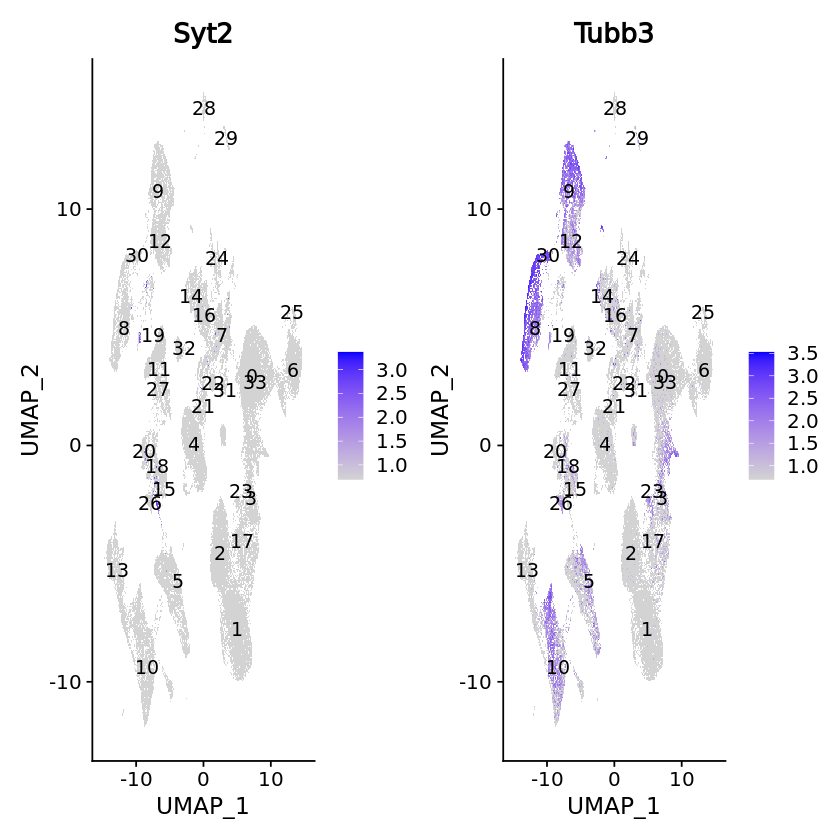

In [42]:
FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Syt2", "Tubb3"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



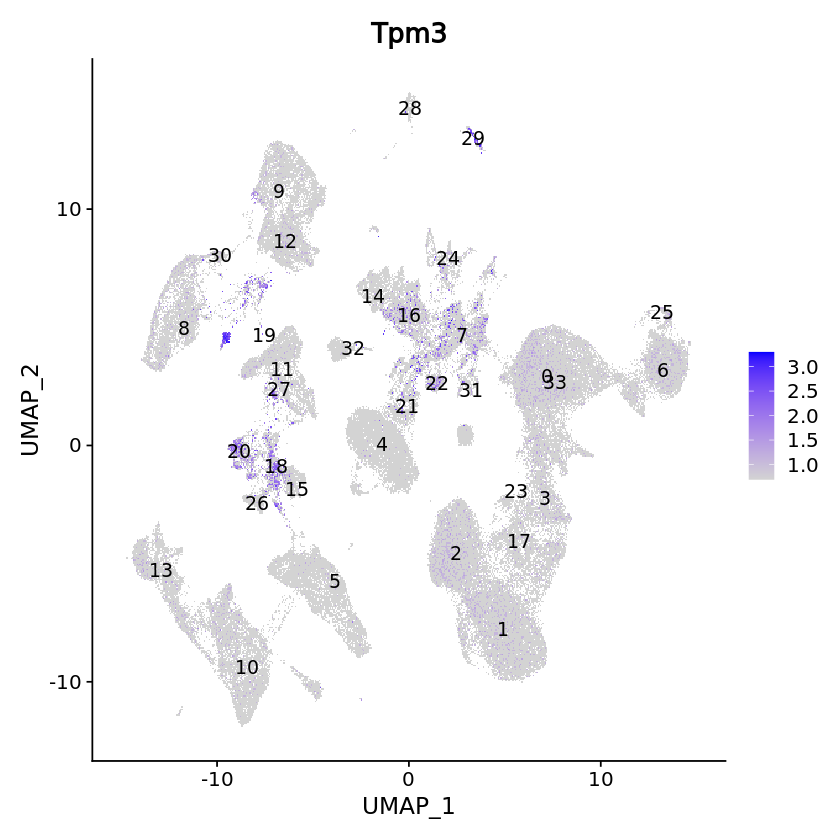

In [43]:
#horizontal
FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Tpm3"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

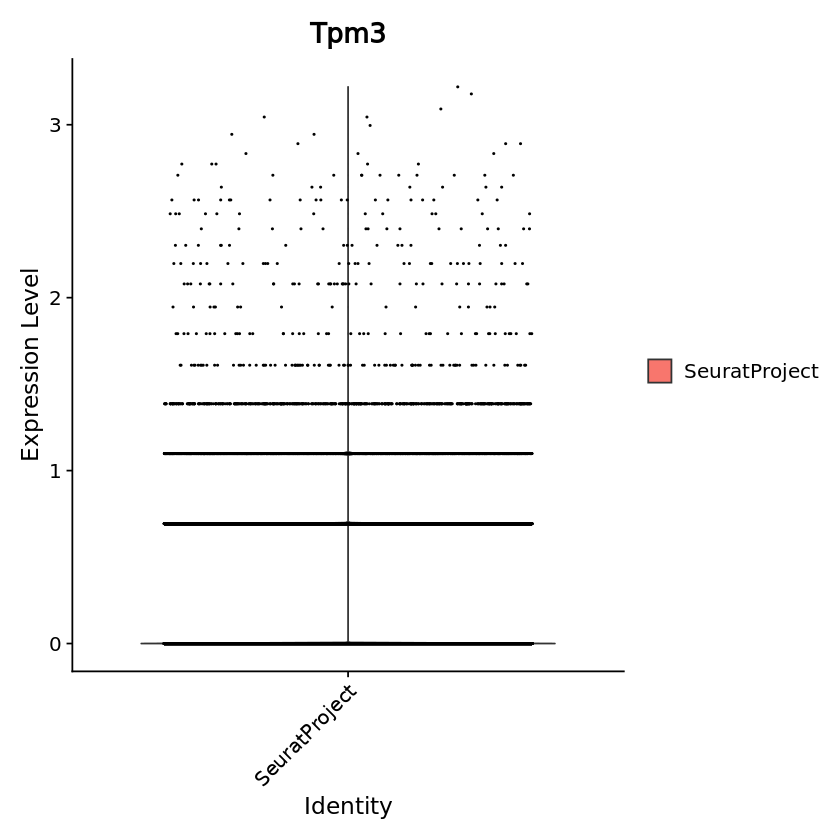

In [20]:
#RGC
#find markers for non integrated dataset
VlnPlot(seurat_phase, features = c("Tpm3"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



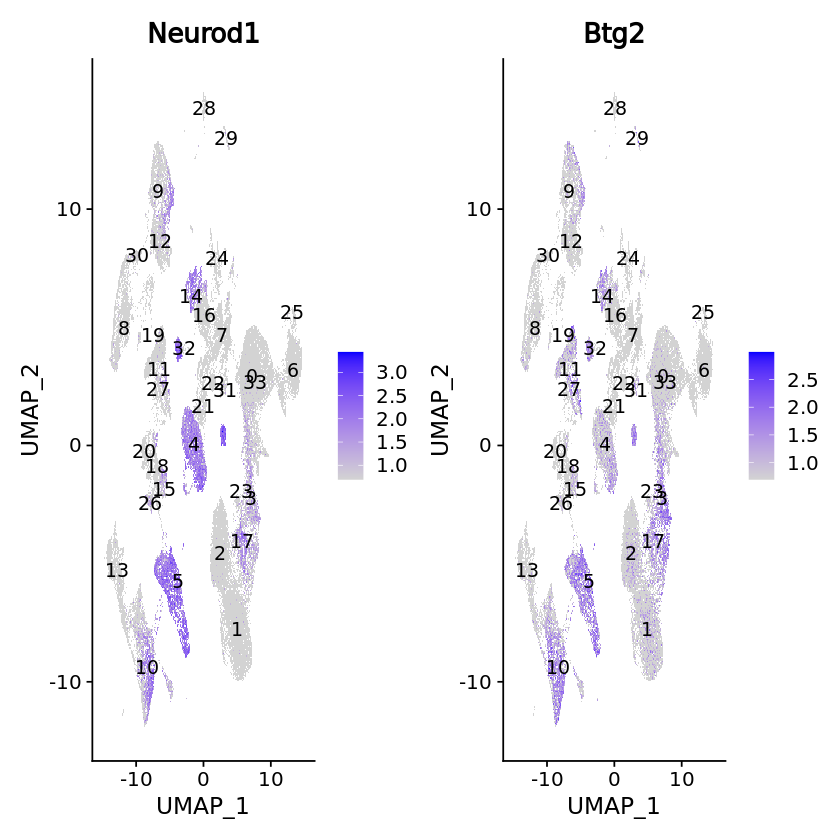

In [52]:
#
FeaturePlot(seurat_adult_integrated,
            reduction = "umap", 
            features = c("Neurod1", "Btg2"),
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

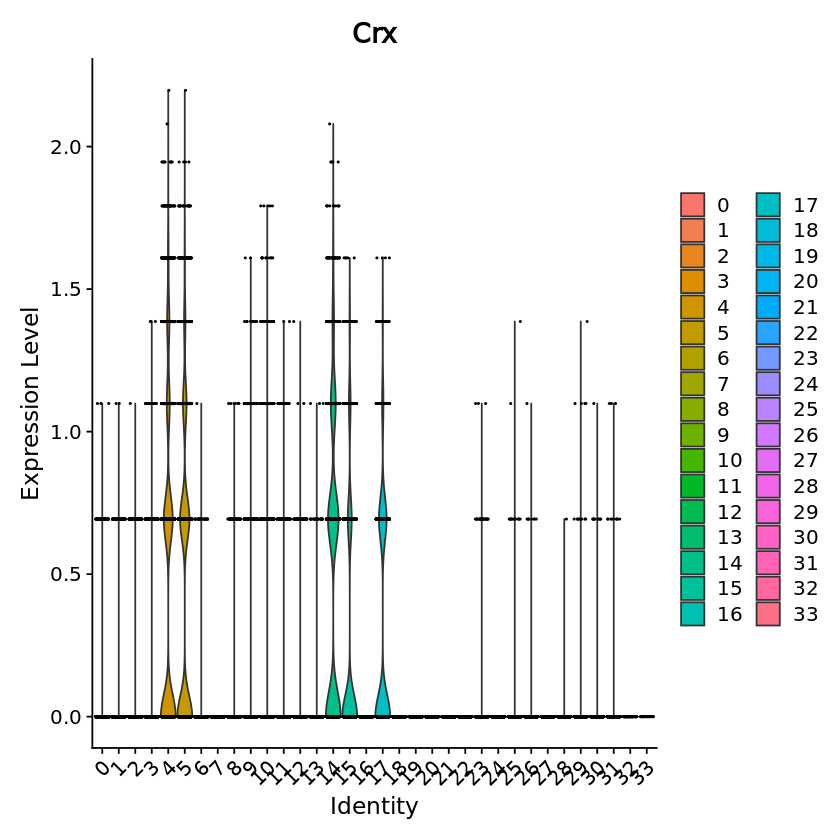

In [47]:
#photoreceptor
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Crx"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



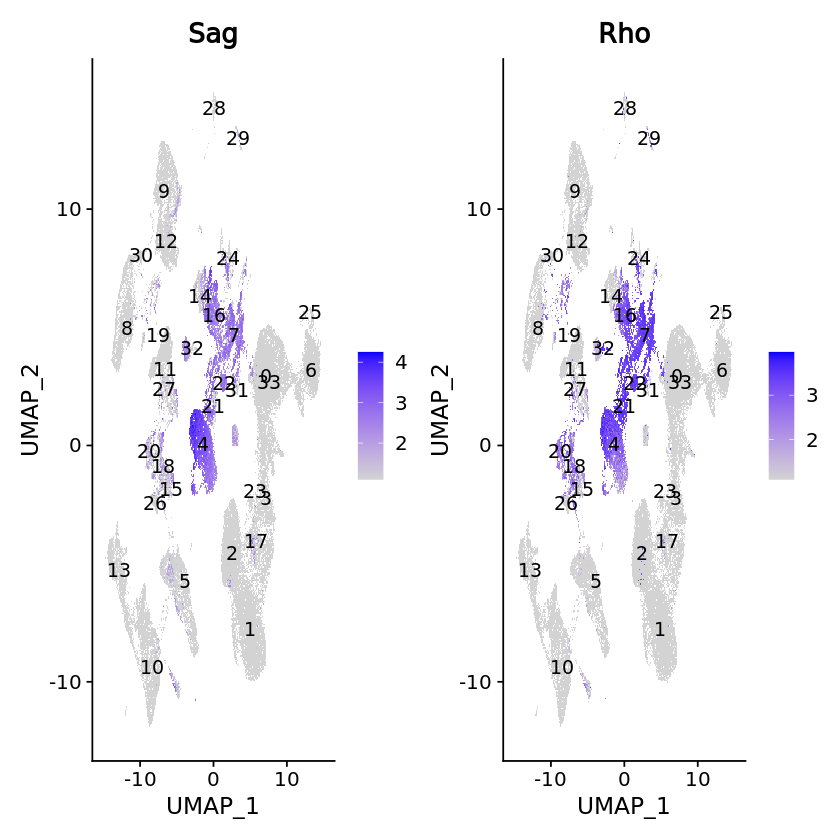

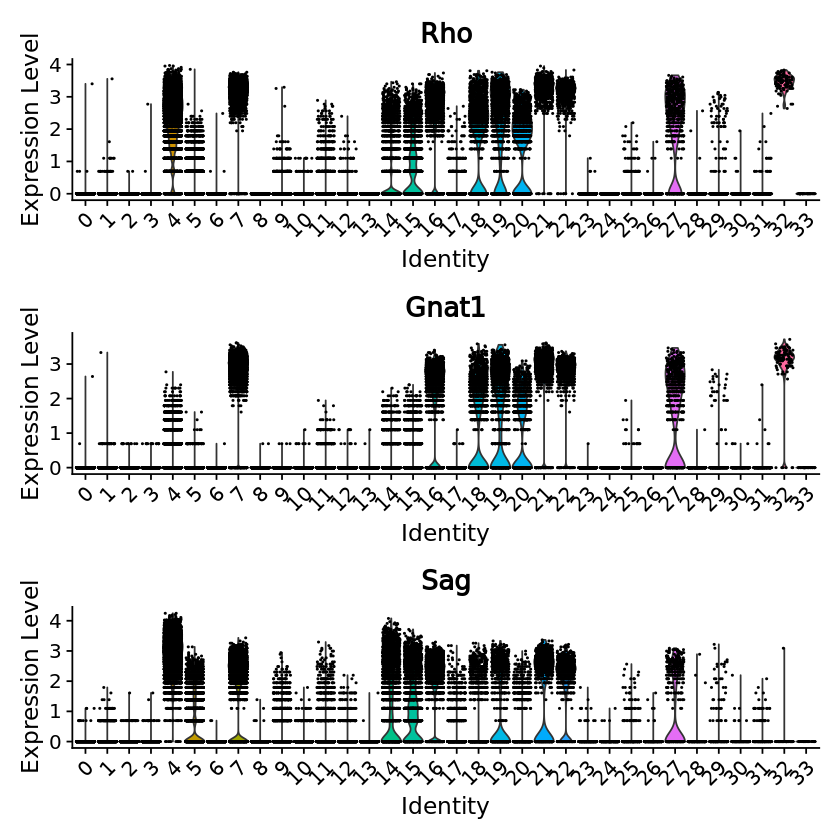

In [56]:
#rods
FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Sag","Rho"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)


#photoreceptor
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Rho","Gnat1","Sag"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



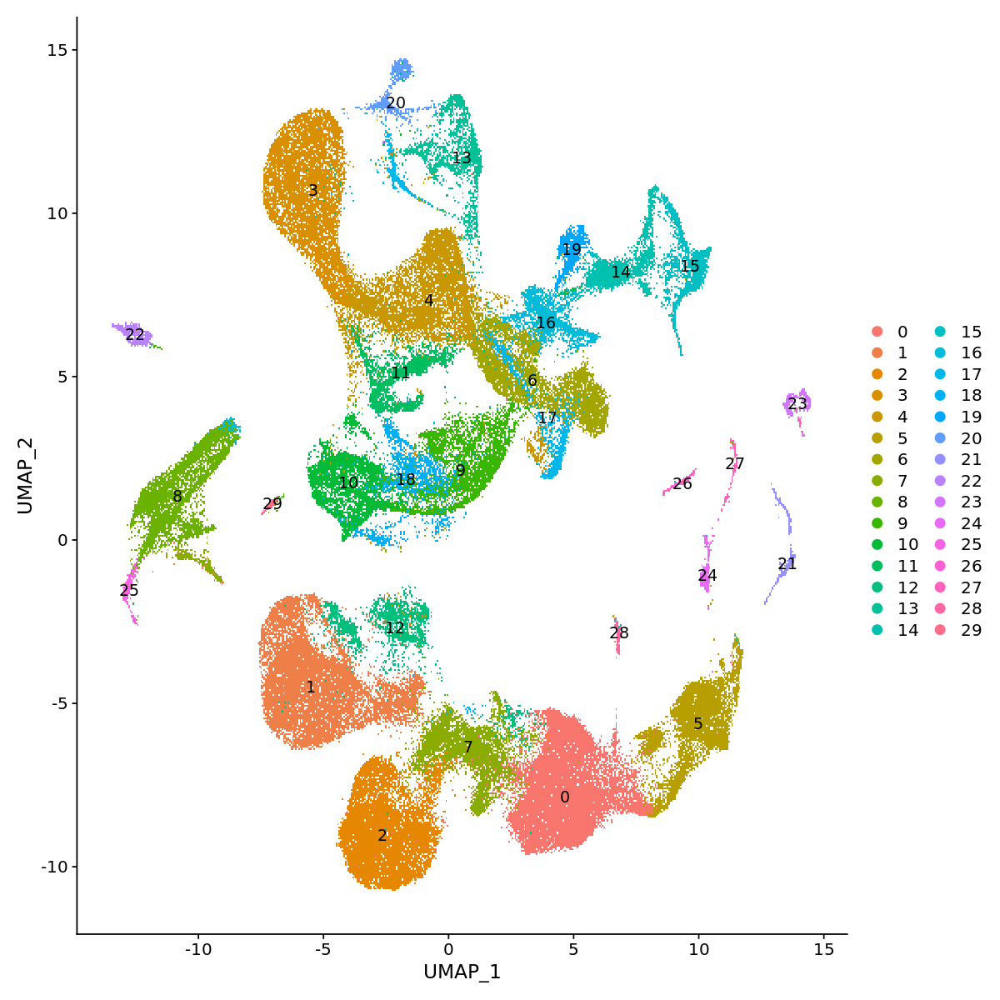

In [103]:
#
DimPlot(object = seurat_phase, 
        reduction = "umap", 
        label = TRUE)

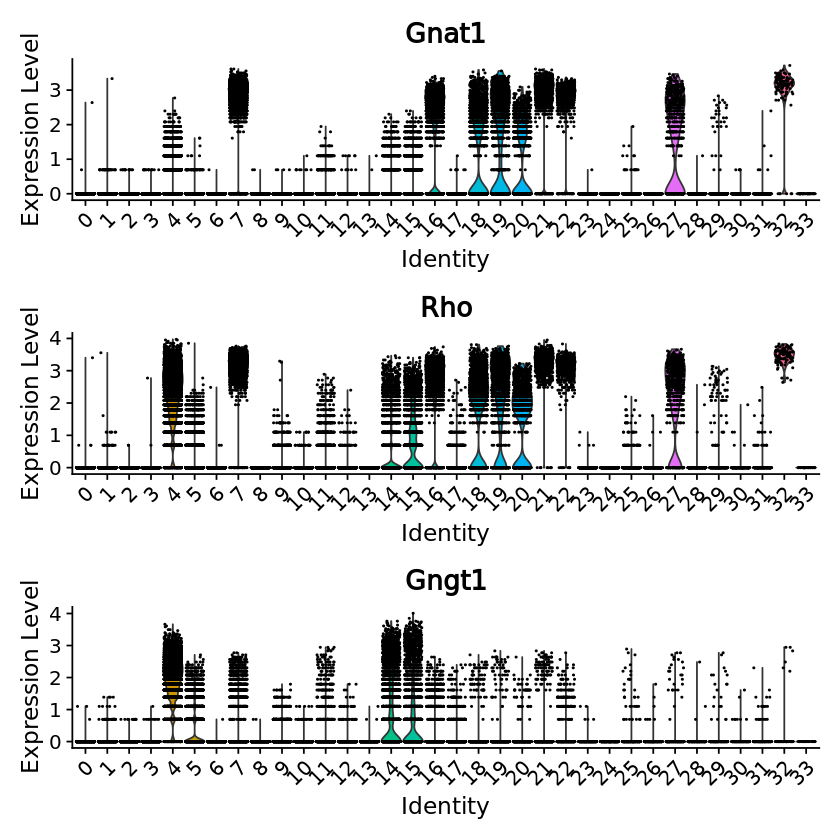

In [57]:
#Rods
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Gnat1","Rho","Gngt1"),
       pt.size = 0.2, ncol = 1)

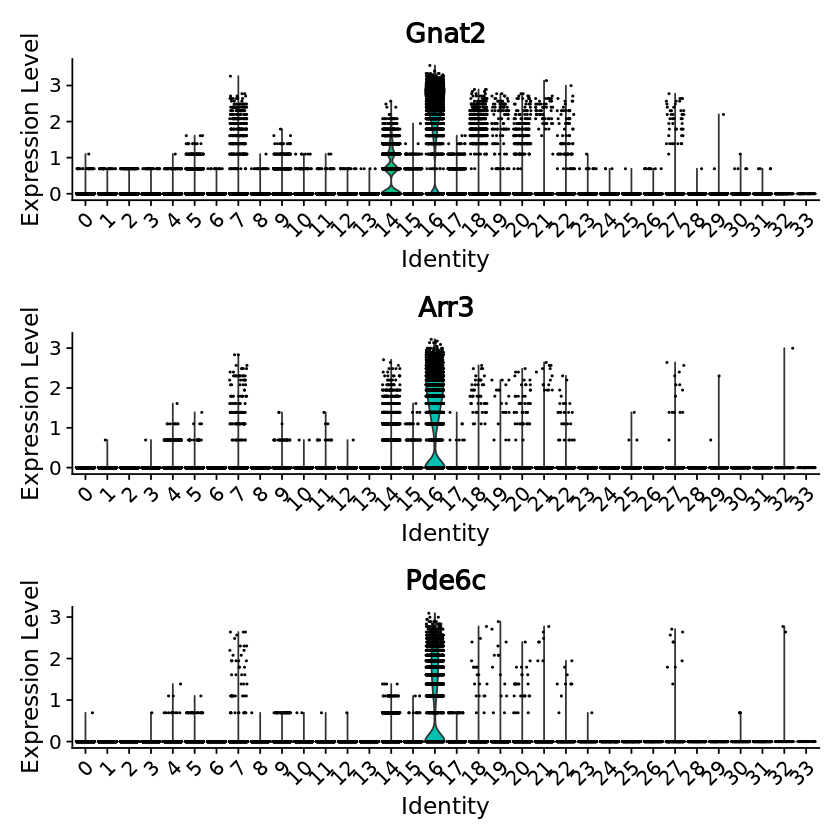

In [59]:
#cones
#find markers for non integrated dataset
VlnPlot(seurat_adult_integrated, features = c("Gnat2","Arr3","Pde6c"),
       pt.size = 0.2, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



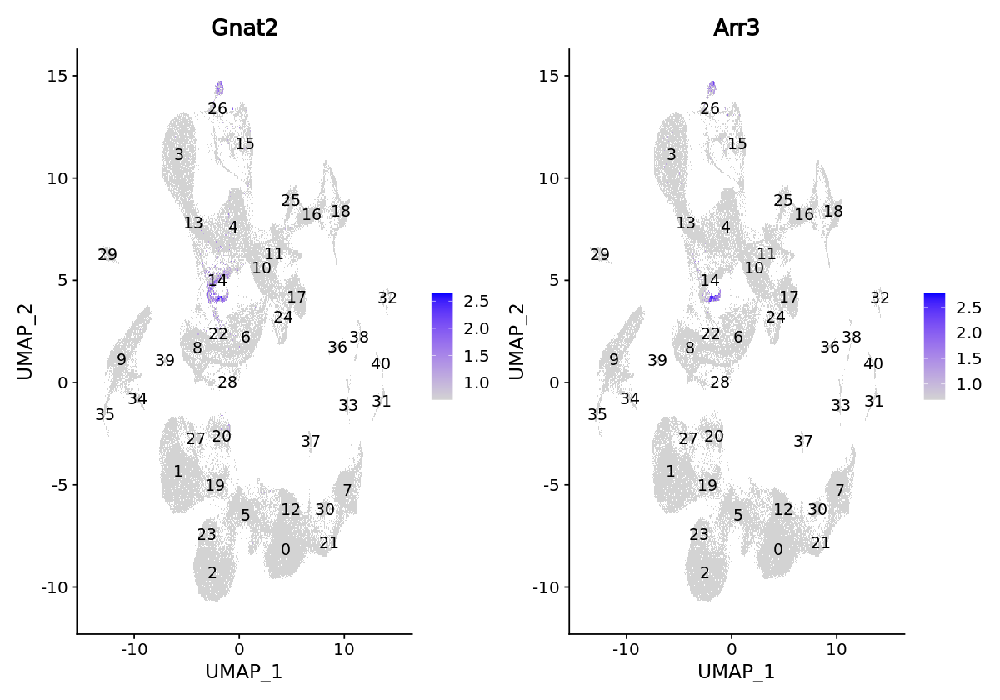

In [47]:
#cones
FeaturePlot(seurat_phase_new, 
            reduction = "umap", 
            features = c("Gnat2","Arr3"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



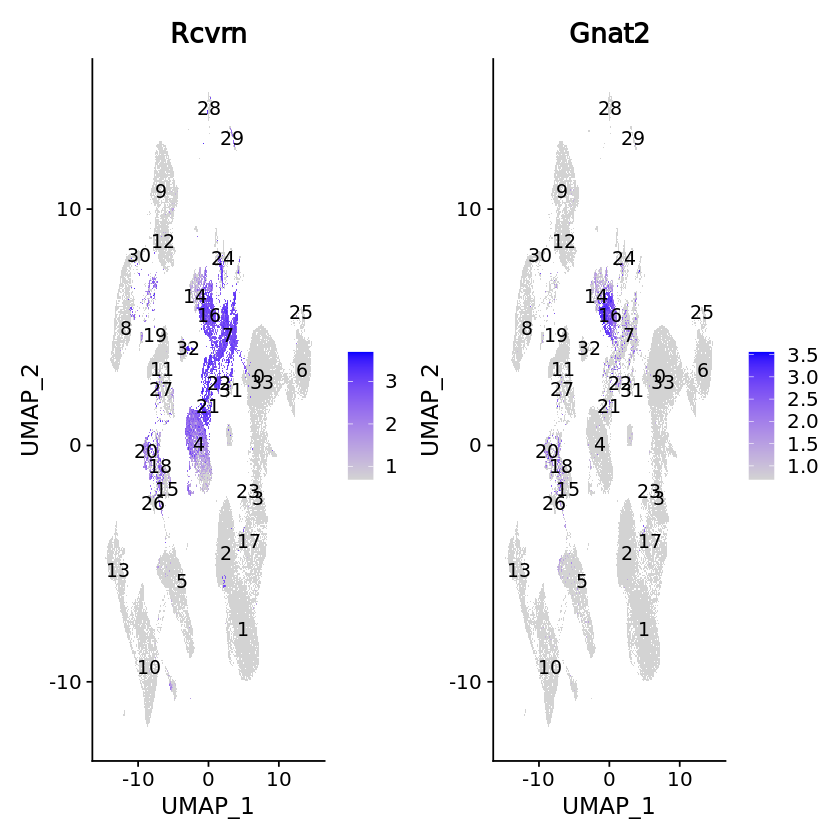

In [64]:
#cones
FeaturePlot(seurat_adult_integrated, 
            reduction = "umap", 
            features = c("Rcvrn","Gnat2"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



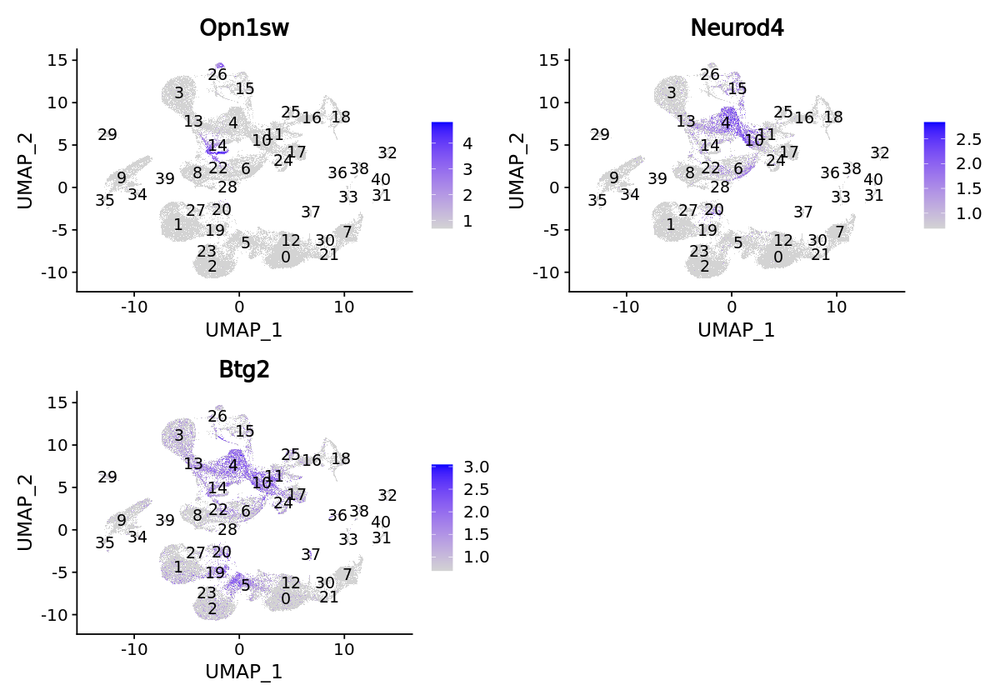

In [49]:
#photo
FeaturePlot(seurat_phase_new, 
            reduction = "umap", 
            features = c("Opn1sw","Neurod4","Btg2"), 
            order = TRUE,
            min.cutoff = 'q10', 
            label = TRUE)

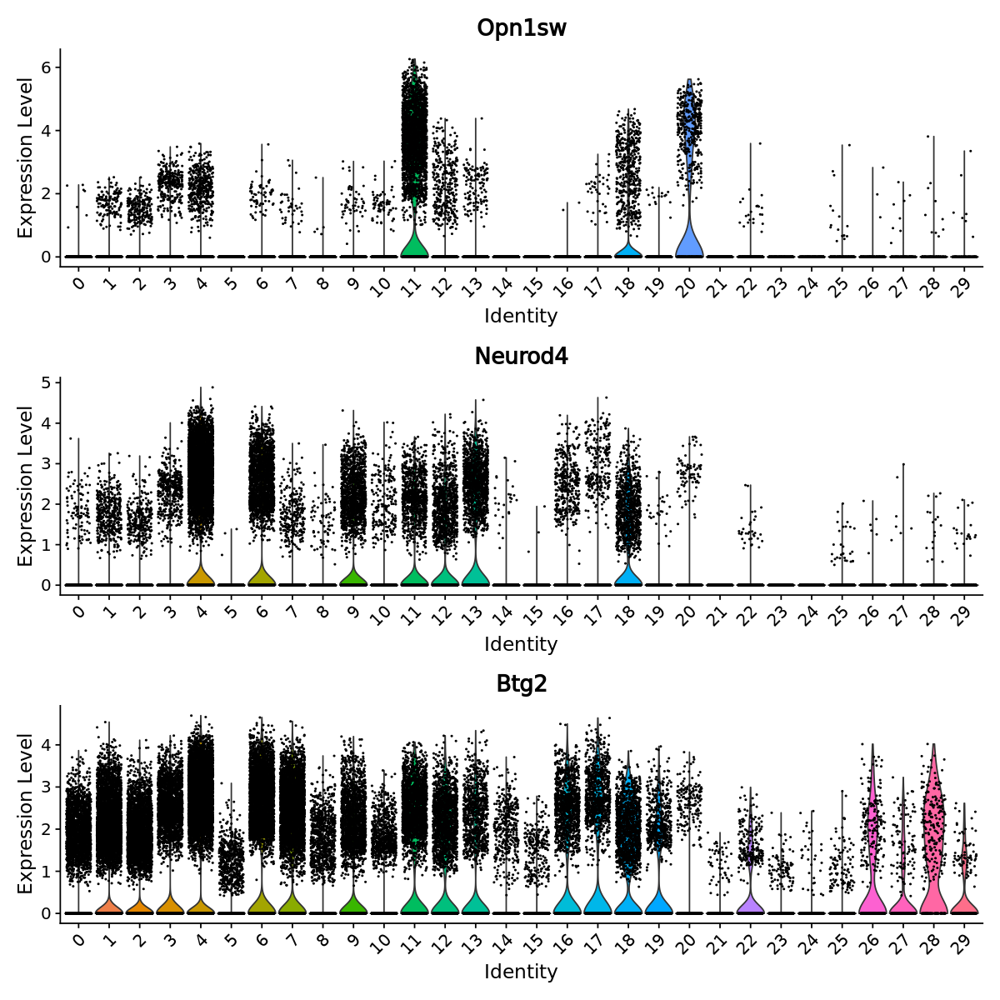

In [114]:
#Rods
#find markers for non integrated dataset
VlnPlot(seurat_phase, features = c("Opn1sw","Neurod4","Btg2"),
       pt.size = 0.2, ncol = 1)

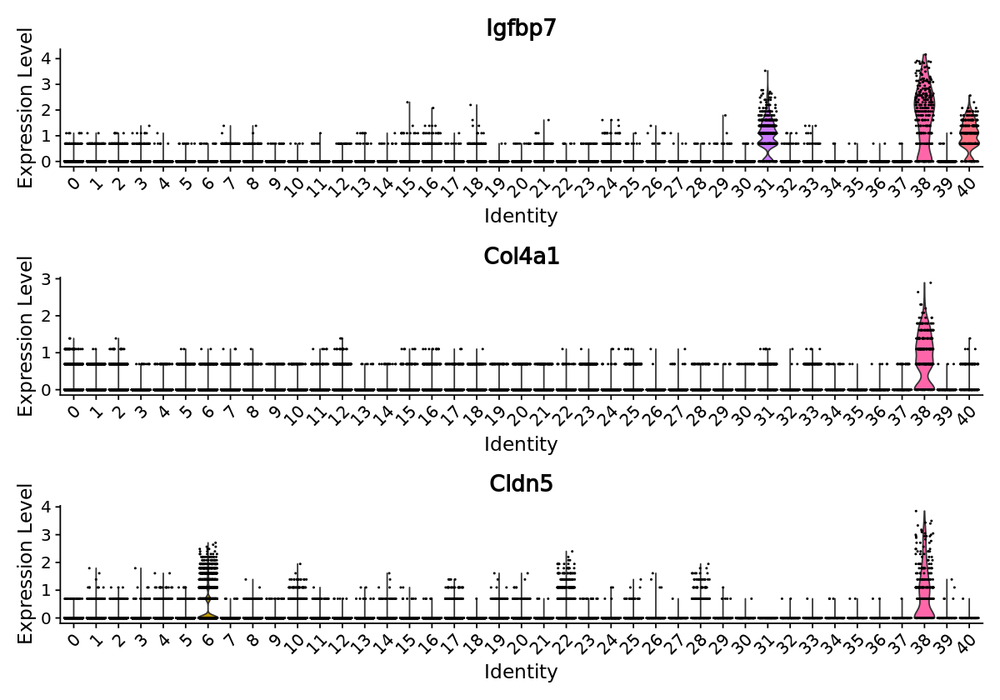

In [50]:
#Rods
#find markers for non integrated dataset
VlnPlot(seurat_phase_new, features = c("Igfbp7","Col4a1","Cldn5"),
       pt.size = 0.2, ncol = 1)

In [51]:
cluster32_conserved_markers <- FindConservedMarkers(seurat_phase_new,
                              ident.1 = 32,
                              grouping.var = "sample_state",
                              only.pos = TRUE,
                            logfc.threshold = 0.25)

Warning message:
“Identity: 32 not present in group P14. Skipping P14”
Warning message:
“E12 has fewer than 3 cells in Identity: 32. Skipping E12”
Warning message:
“E16 has fewer than 3 cells in Identity: 32. Skipping E16”
Warning message:
“P5. has fewer than 3 cells in Identity: 32. Skipping P5.”
Testing group E11: (32) vs (7, 31, 21, 38, 18, 33, 40, 36, 0, 16, 12, 5, 30)

Warning message:
“Identity: 32 not present in group P0.. Skipping P0.”
Warning message:
“P8_ has fewer than 3 cells in Identity: 32. Skipping P8_”
Warning message:
“P2_ has fewer than 3 cells in Identity: 32. Skipping P2_”
Warning message:
“Identity: 32 not present in group E18. Skipping E18”
Testing group E14: (32) vs (0, 11, 9, 16, 12, 5, 21, 6, 34, 7, 20, 33, 28, 38, 18, 4, 36, 10, 2, 30, 25, 39, 8, 35, 29, 15, 14, 23, 22, 1)



In [225]:
cluster23_conserved_markers

,E11_p_val,E11_avg_log2FC,E11_pct.1,E11_pct.2,E11_p_val_adj,E14_p_val,E14_avg_log2FC,E14_pct.1,E14_pct.2,E14_p_val_adj,max_pval,minimump_p_val
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Creg1,0.000000e+00,1.7091719,0.819,0.126,0.000000e+00,6.781873e-02,0.7473306,0.25,0.050,1.000000e+00,6.781873e-02,0.000000e+00
Alas2,0.000000e+00,2.9615690,0.913,0.007,0.000000e+00,4.507121e-123,1.7994056,0.50,0.002,8.058732e-119,4.507121e-123,0.000000e+00
Car2,0.000000e+00,4.2451553,0.998,0.053,0.000000e+00,3.500851e-02,0.8541821,0.25,0.041,1.000000e+00,3.500851e-02,0.000000e+00
Hsd3b6,0.000000e+00,0.8255776,0.272,0.002,0.000000e+00,0.000000e+00,0.7530114,0.25,0.000,0.000000e+00,0.000000e+00,0.000000e+00
Gclm,0.000000e+00,1.9567376,0.841,0.137,0.000000e+00,2.182099e-01,0.6298065,0.25,0.083,1.000000e+00,2.182099e-01,0.000000e+00
Mllt3,0.000000e+00,1.3855226,0.604,0.068,0.000000e+00,8.239827e-02,0.7989828,0.25,0.055,1.000000e+00,8.239827e-02,0.000000e+00
Pdzk1ip1,0.000000e+00,1.1963371,0.459,0.002,0.000000e+00,0.000000e+00,0.7526498,0.25,0.000,0.000000e+00,0.000000e+00,0.000000e+00
Cited4,0.000000e+00,2.4451661,0.887,0.025,0.000000e+00,4.380767e-09,1.0656248,0.25,0.007,7.832812e-05,4.380767e-09,0.000000e+00
Bpgm,0.000000e+00,1.8687267,0.831,0.142,0.000000e+00,1.008352e-02,1.5001944,0.50,0.114,1.000000e+00,1.008352e-02,0.000000e+00


In [6]:
options(repr.plot.width = 10, repr.plot.height = 7)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



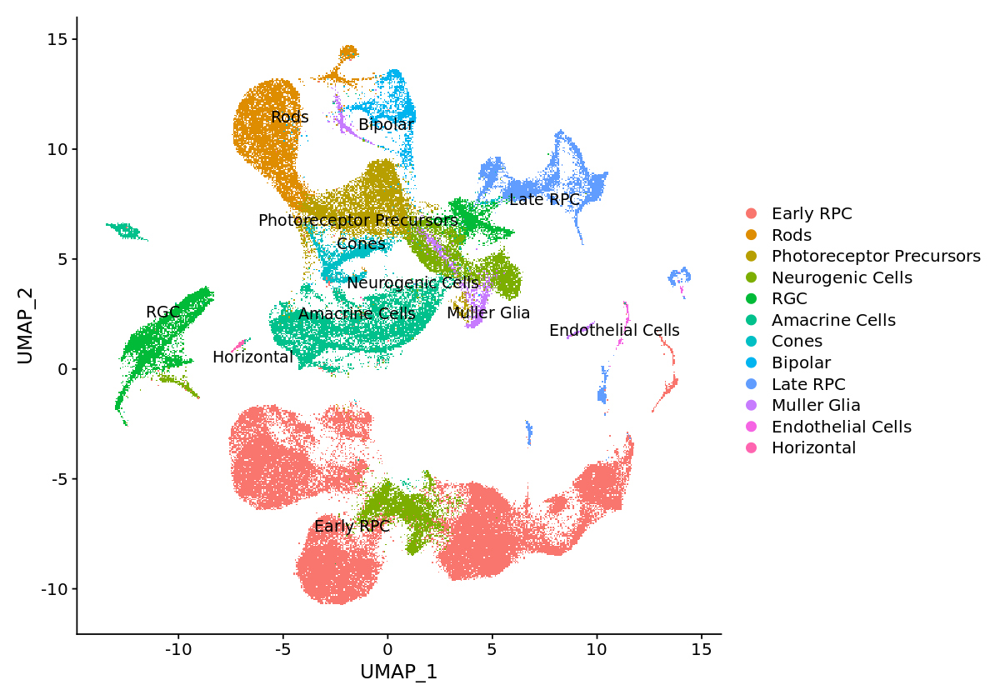

In [248]:
#assign celltypes
# Rename all identities
#the seurat_phase not saved
seurat_ann_new <- RenameIdents(object = seurat_phase, 
                               "0" = "Early RPC",
                               "1" = "Early RPC",
                               "2" = "Early RPC",
                               "3" = "Rods",
                               "4" = "Photoreceptor Precursors",
                               "5" = "Early RPC",
                               "6" = "Neurogenic Cells",
                               "7" = "Neurogenic Cells",
                               "8" = "RGC",
                               "9" = "Amacrine Cells",
                               "10" = "Amacrine Cells",
                               "11" = "Cones",
                               "12" = "Early RPC",
                               "13" = "Bipolar",
                               "14" = "Late RPC",
                               "15" = "Late RPC",
                                "16" = "RGC",
                                "17" = "Muller Glia", 
                                  "18" = "Amacrine Cells", 
                                  "19" = "Late RPC", 
                                   "20" = "Rods",
                                "21" = "Early RPC",
                                 "22" = "Amacrine Cells",
                                  "23" = "Late RPC",
                                 "24" = "Late RPC",
                                 "25" = "RGC",
                                  "26" = "Muller Glia",
                                 "27" = "Endothelial Cells",
                                  "28" = "Late RPC",
                                  "29" = "Horizontal"
                            
                                 )


# Plot the UMAP
DimPlot(object = seurat_ann_new, 
        reduction = "umap", 
        label = TRUE,
        label.size = 4,
        repel = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



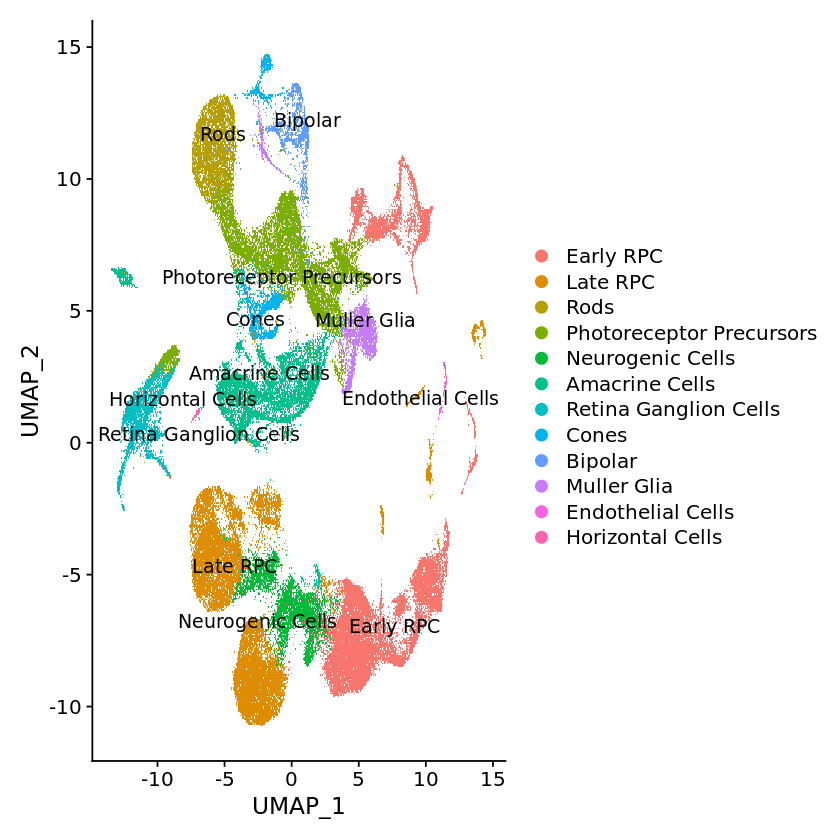

In [5]:
#assign celltypes
# Rename all identities
#the seurat_phase not saved
seurat_ann_40 <- RenameIdents(object = seurat_phase_new, 
                               "0" = "Early RPC",
                               "1" = "Late RPC",
                               "2" = "Late RPC",
                               "3" = "Rods",
                               "4" = "Photoreceptor Precursors",
                               "5" = "Neurogenic Cells",
                               "6" = "Amacrine Cells",
                               "7" = "Early RPC",
                               "8" = "Amacrine Cells",
                               "9" = "Retina Ganglion Cells",
                               "10" = "Photoreceptor Precursors",
                               "11" = "Photoreceptor Precursors",
                               "12" = "Early RPC",
                               "13" = "Photoreceptor Precursors",
                               "14" = "Cones",
                               "15" = "Bipolar",
                                "16" = "Early RPC",
                                "17" = "Muller Glia", 
                                  "18" = "Early RPC", 
                                  "19" = "Neurogenic Cells", 
                                   "20" = "Late RPC",
                                "21" = "Early RPC",
                                 "22" = "Amacrine Cells",
                                  "23" = "Late RPC",
                                 "24" = "Muller Glia",
                                 "25" = "Early RPC",
                                  "26" = "Cones",
                                 "27" = "Late RPC",
                                  "28" = "Amacrine Cells",
                                  "29" = "Amacrine Cells",
                                  "30" = "Early RPC",
                                  "31" = "Early RPC",
                                 "32" = "Late RPC",
                                "33" = "Late RPC",
                                "34"  = "Retina Ganglion Cells",
                                "35" = "Retina Ganglion Cells",
                                "36" = "Late RPC",
                                "37" = "Late RPC",
                                "38" = "Endothelial Cells",
                                "39" = "Horizontal Cells",
                                "40" = "Early RPC"
                            
                                 )


# Plot the UMAP
DimPlot(object = seurat_ann_40, 
        reduction = "umap", 
        label = TRUE,
        label.size = 4,
        repel = TRUE)

In [12]:
seurat_ann_new <- readRDS("seurat_best.rds")

In [9]:
metadata <- seurat_ann_40@meta.data 

In [10]:
metadata$cluster_id <- factor(seurat_ann_40@active.ident)

In [11]:
# Extract raw counts and metadata to create SingleCellExperiment object
counts <- seurat_ann_40@assays$RNA@counts

In [12]:

# Create single cell experiment object
sce <- SingleCellExperiment(assays = list(counts = counts), 
                           colData = metadata)

In [13]:
# Subset metadata to include only the variables you want to aggregate across (here, we want to aggregate by sample and by cluster)
groups <- colData(sce)[, c("cluster_id", "sample_state")]
head(groups)

DataFrame with 6 rows and 2 columns
                         cluster_id sample_state
                           <factor>  <character>
"E11.AAACCTGAGATGTAAC.1"  Early RPC          E11
"E11.AAACCTGAGCCCAGCT.1"  Late RPC           E11
"E11.AAACCTGAGGCAATTA.1"  Early RPC          E11
"E11.AAACCTGAGTAGCGGT.1"  Early RPC          E11
"E11.AAACCTGAGTGGAGTC.1"  Early RPC          E11
"E11.AAACCTGCAAGTTGTC.1"  Early RPC          E11

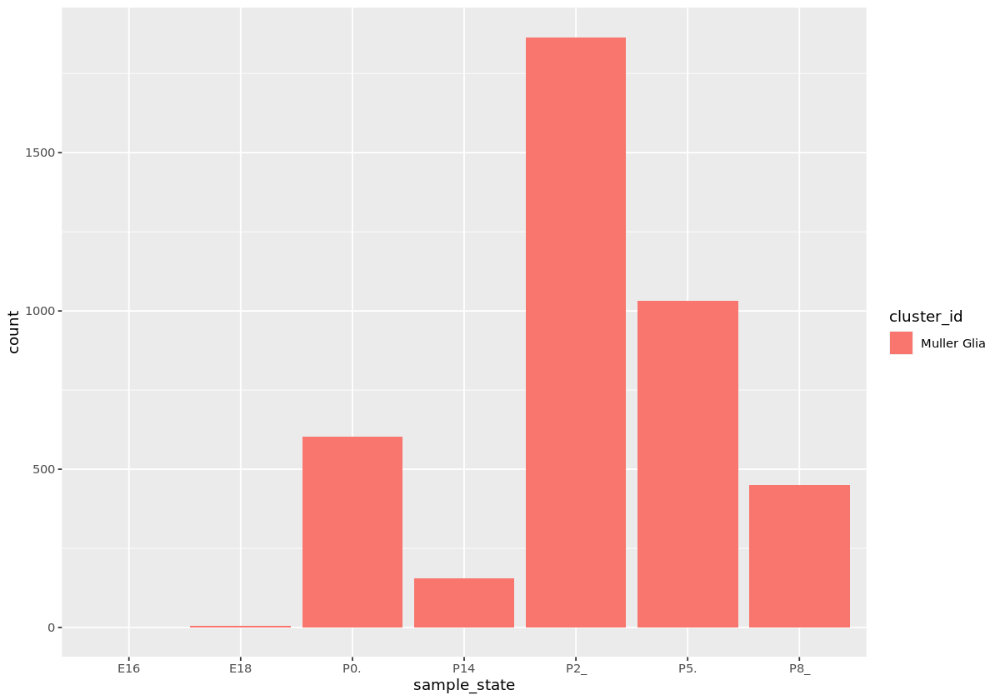

In [14]:
#good 
ann_plot <- ggplot(as.data.frame(groups), aes(sample_state, fill = cluster_id))+
     geom_bar(data = function(x) {x[x$cluster_id %in% c("Muller Glia"), ]})

#ann_plot %+% subset(groups, cluster_id %in% c("Early_RPC"))
#ann_plot %+%
ann_plot    



#ggplot(data=dat, aes(Value1, Value2, group=ID, colour=ID)) + 
#geom_line(data=function(x){x[!x$ID %in% c("P1", "P3"), ]}, alpha=0.5)

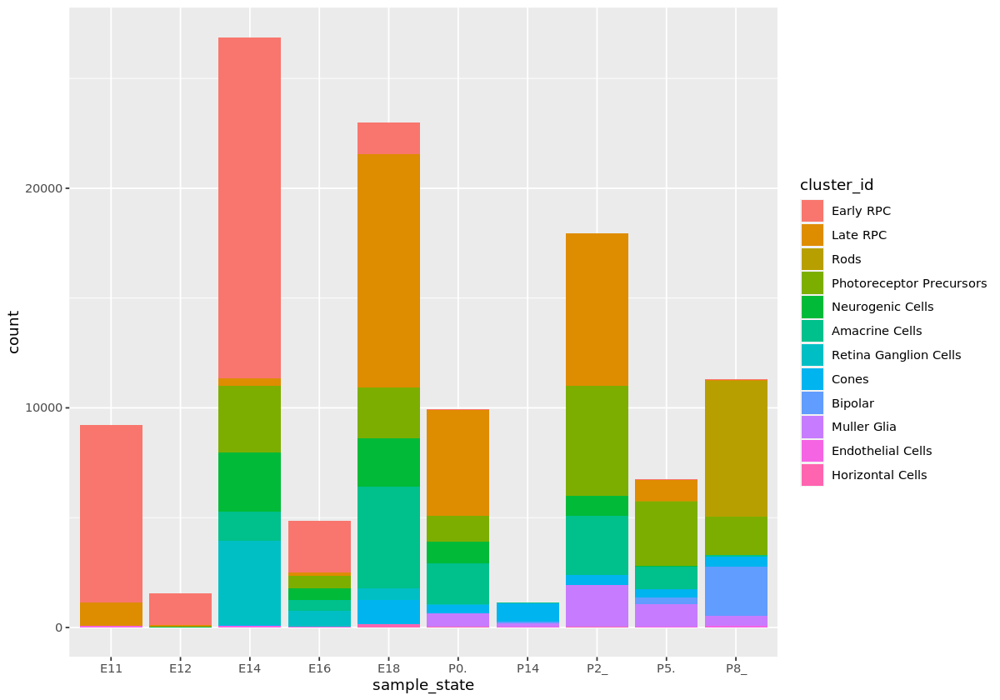

In [15]:
ggplot(as.data.frame(groups), aes(sample_state, fill = cluster_id))+
     geom_bar()

In [235]:
seurat_ann_new

An object of class Seurat 
35760 features across 112642 samples within 2 assays 
Active assay: RNA (17880 features, 3290 variable features)
 1 other assay present: SCT
 2 dimensional reductions calculated: pca, umap

In [6]:
saveRDS(seurat_ann_40, "seurat_best.rds")

In [2]:
seurat_ann_new <- readRDS("seurat_best.rdsest.rds")

In [3]:
seurat_ann_new <- RenameIdents(object = seurat_ann_new, 
                               "late RPC" = "Late RPC")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



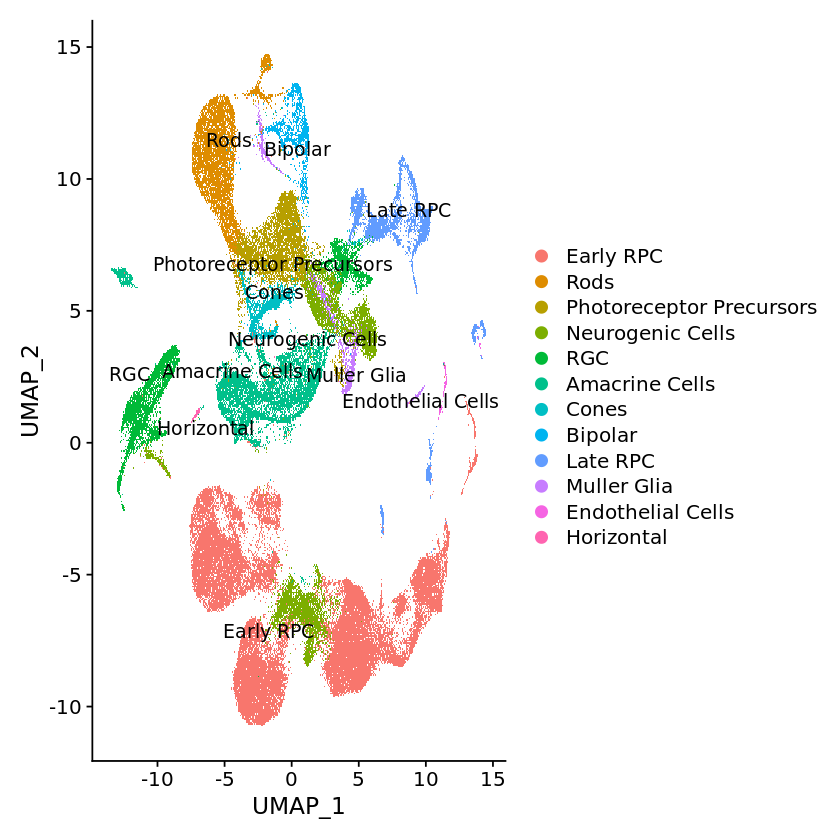

In [20]:
DimPlot(object = seurat_ann_new, 
        reduction = "umap", 
        label = TRUE,
        label.size = 4,
        repel = TRUE)

In [3]:
install.packages("anndata")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [ ]:
library(anndata)
library(reticulate)

In [4]:

BiocManager::install("zellkonverter")

'getOption("repos")' replaces Bioconductor standard repositories, see
'?repositories' for details

replacement repositories:
    CRAN: https://cran.r-project.org


Bioconductor version 3.14 (BiocManager 1.30.19), R 4.1.3 (2022-03-10)

Installing package(s) 'zellkonverter'

also installing the dependencies ‘dir.expiry’, ‘basilisk.utils’, ‘basilisk’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Old packages: 'ade4', 'broom', 'class', 'cli', 'clue', 'codetools', 'curl',
  'digest', 'dplyr', 'e1071', 'forcats', 'future', 'gargle', 'ggplot2',
  'ggrepel', 'httpuv', 'igraph', 'IRkernel', 'lubridate', 'MASS', 'multcomp',
  'nlme', 'nloptr', 'pbdZMQ', 'purrr', 'ragg', 'RcppTOML', 'RCurl', 'readr',
  'readxl', 'repr', 'reticulate', 'RhpcBLASctl', 'RNeXML', 'sp', 'survival',
  'tidyr', 'vroom', 'XML'



+ '/home/soladejo/miniconda3/bin/conda' 'install' '--yes' '--prefix' '/home/soladejo/miniconda3/envs/ArchR_Env' '-c' 'conda-forge' 'anndata>=0.7.5'



In [10]:
#integrate adult mouse data

In [2]:
library(SeuratDisk)

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat



In [47]:
#Convert("adult_mouse_dataset_byrne_lab/mouse_HSP68_v2_facs_pt1_ann.h5ad", dest = "h5seurat", overwrite = TRUE)
adult_mouse <- LoadH5Seurat("adult_mouse_dataset_byrne_lab/mouse_HSP68_v2_facs_pt1_ann.h5seurat")
adult_mouse

Validating h5Seurat file

Initializing RNA with data

Adding counts for RNA

Adding feature-level metadata for RNA

Adding graph RNA_umap

Adding command information

Adding cell-level metadata

Adding miscellaneous information

Adding tool-specific results



An object of class Seurat 
210 features across 18314 samples within 1 assay 
Active assay: RNA (210 features, 0 variable features)

In [48]:
#read in metadata
adult_mouse_barcodes <- read.csv("adult_mouse_dataset_byrne_lab/mouse_HSP68_v2_facs_pt1_barcode.MJ.csv")

In [49]:
adult_mouse@meta.data <- adult_mouse_barcodes


In [50]:
rownames(adult_mouse@meta.data) <- adult_mouse@meta.data$full_cell_id

In [51]:
counts <- GetAssayData(adult_mouse,assay = "RNA",slot = "counts") 
colnames(counts) <- rownames(adult_mouse@meta.data)
adult_mouse <- CreateSeuratObject(counts = counts,meta.data = adult_mouse@meta.data)

In [52]:
# Identify the most variable genes
seurat_adult <- FindVariableFeatures(adult_mouse, 
                     selection.method = "vst",
                     nfeatures = 3000, 
                     verbose = FALSE)
    
# Scale the counts
seurat_adult <- ScaleData(seurat_adult)

Centering and scaling data matrix



In [53]:
# Perform PCA
seurat_adult <- RunPCA(seurat_adult)

seurat_adult <- RunUMAP(seurat_adult, dims = 1:40)


PC_ 1 
Positive:  Trpm1, Isl1, Pcp4, Vsx2, Grm6, Ptprz1, Scg2, Sept7, Tenm2, Ncam1 
	   Otx2, Lsamp, Nfib, Ccdc136, Pcdh7, Slit2, Nrsn1, Grik1, Lmo4, Prkca 
	   Pax6, Nsg1, Reln, Cntfr, Sept4, Car8, Atp1b1, Kcnb2, Prkcb, Cabp5 
Negative:  Gnb1, Rho, Gnat1, Rcvrn, Pdc, Sag, Nrl, Pde6a, Vtn, Slc24a1 
	   Cngb1, Gngt1, Hcn1, Opn1mw, Nr2e3, Arr3, Guca1a, Pde6c, Meis1, Thrb 
	   Meis2, Opn1sw, Cst3, Gnat2, Pde6h, Vopp1, Ndrg1, Ramp3, Cd79a, Kcnj8 
PC_ 2 
Positive:  Atp1b1, Pax6, Tfap2b, Lsamp, Calb1, Scn1a, Dner, Slc6a9, Onecut1, Tfap2a 
	   Nefl, Hes1, Tpm3, C1ql1, Nrsn1, Trpm3, Onecut2, Glul, Ncam1, Slc1a3 
	   Scn1b, Lhx1, Sept4, Cryab, Cntfr, Spon1, Calb2, Gad1, Apoe, Rlbp1 
Negative:  Trpm1, Isl1, Otx2, Ccdc136, Grm6, Gnat2, Prkca, Vsx2, Pygm, Opn1mw 
	   Car8, Pcp4, Arr3, Scg2, Pde6c, Olfm1, Slc1a2, Opn1sw, Pcp2, Ptprz1 
	   Hcn1, Cabp5, Thrb, Reln, Tnnt1, Sag, Nptx1, Hnrnpu, Pde6h, Slit2 
PC_ 3 
Positive:  Trpm1, Prkca, Gnb1, Isl1, Gnat1, Rho, Pcp4, Grm6, Vsx2, Nrl 
	   Scg2, Pde6a, 

In [54]:
seurat_adult@meta.data <- seurat_adult@meta.data[, -which(colnames(seurat_adult@meta.data) %in% 'full_cell_id')]

In [27]:
head(Loadings(seurat_adult, reduction = "pca")[, 1:5])

,PC_1,PC_2,PC_3,PC_4,PC_5
Rpe65,0.002939188,0.007853177,-0.0015812263,0.014368673,0.004288809
Fbln1,0.004814554,0.007638839,-0.0038286746,0.019775676,-0.001074819
Ctss,0.005678360,0.016540775,0.0009203064,0.005861371,0.014414929
Hexb,0.007963335,0.020234991,-0.0046618051,0.009720645,0.014030470
Pcp4,0.188109998,-0.120928270,0.1047607534,-0.005003851,0.190089888
Rgs5,0.001127093,0.002603222,0.0003613672,0.003755170,0.001331933


An object of class Seurat 
210 features across 12581 samples within 1 assay 
Active assay: RNA (210 features, 189 variable features)
 2 dimensional reductions calculated: pca, umap

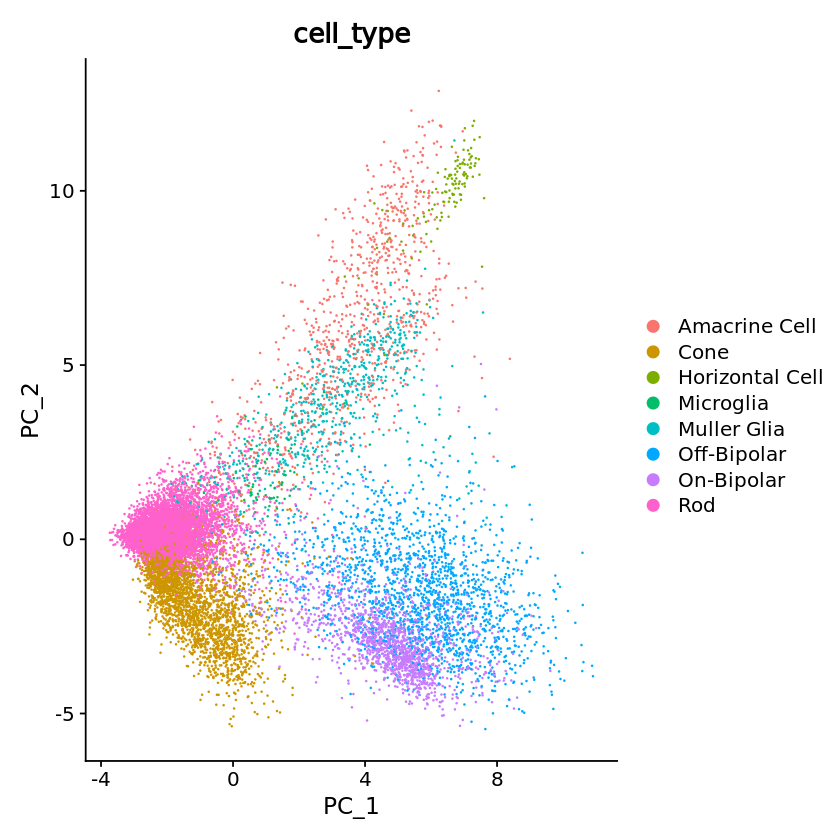

In [55]:
DimPlot(seurat_adult, reduction = "pca", group.by = "cell_type")

In [29]:
#read in developmental seurat data and integrate
seurat_dev <- readRDS("seurat_best.rds")

In [60]:
seurat_adult@meta.data$sample_orig <- "adult"
seurat_dev@meta.data$sample_orig <- "dev"

In [33]:
#merge dataset
seurat_dev

An object of class Seurat 
35760 features across 112642 samples within 2 assays 
Active assay: SCT (17880 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [57]:
seurat_adult

An object of class Seurat 
210 features across 18314 samples within 1 assay 
Active assay: RNA (210 features, 184 variable features)
 2 dimensional reductions calculated: pca, umap

In [61]:
# Create a merged Seurat object
merged_seurat <- merge(x = seurat_adult, 
                       y = seurat_dev, 
                       add.cell.id = c("adult", "dev"))

In [74]:
# Identify the most variable genes
merged_seurat <- FindVariableFeatures(merged_seurat, 
                     selection.method = "vst",
                     nfeatures = 3000, 
                     verbose = FALSE)
    
# Scale the counts
merged_seurat <- ScaleData(merged_seurat)

Centering and scaling data matrix



In [75]:
# Perform PCA
merged_seurat <- RunPCA(merged_seurat)

merged_seurat <- RunUMAP(merged_seurat, dims = 1:40)


PC_ 1 
Positive:  Ccnd1, Rps4x, Ran, Tuba1b, Npm1, 2810417H13Rik, Hmgb2, Rps3a1, Rpl10, Prdx1 
	   Rps27a, Id3, Mdk, Rps16, Rps12, Top2a, Rpl22l1, Cks1b, Birc5, Gnai2 
	   H2afz, Cdca8, Dapl1, Spc25, Cenpf, Eno1, 2700094K13Rik, Nasp, Anp32b, Id1 
Negative:  Rho, Pdc, Sag, Rcvrn, Pde6g, Rom1, Nrl, Prph2, Gngt1, Nr2e3 
	   Tulp1, Platr17, Unc119, Cnga1, Gm11744, Gngt2, Rpgrip1, Neurod1, Pde6b, Cngb1 
	   Rp1, Gnat1, Snap25, Fam57b, Gnb3, Nxnl2, Ebpl, Samd11, March1, Crx 
PC_ 2 
Positive:  Stmn2, Rtn1, Ina, Tubb3, Stmn3, Mllt11, Tubb2b, Tuba1a, Tagln3, Elavl3 
	   Crmp1, Mapt, Tubb2a, Nnat, Tmsb10, Aplp1, Gap43, Sox4, Kif5c, Dpysl3 
	   Basp1, Cd24a, Tmsb4x, Stmn4, Actb, Rbfox2, Ftl1, Hist3h2ba, Gng3, Celf4 
Negative:  Gnat1, Rho, Rcvrn, Hes1, Ccnd1, Opn1mw, 2810417H13Rik, Prkca, Top2a, Spc25 
	   Zfp36l1, Id3, Cenpf, Pbk, Birc5, Cdca8, Hmgb2, Crym, Id1, Nusap1 
	   Rrm2, Ccna2, Cdk1, Smc4, Prc1, Ccnb1, Gmnn, Fgf15, Trpm1, Prss23 
PC_ 3 
Positive:  Stmn2, Nefl, Ina, Gap43, Elavl4, Nefm, I

In [73]:
merged_seurat

An object of class Seurat 
35769 features across 130956 samples within 2 assays 
Active assay: RNA (17889 features, 0 variable features)
 1 other assay present: SCT

In [72]:
#include phase to regress it out
# Perform cell cycle scoring
merged_seurat <- CellCycleScoring(merged_seurat,
                                   g2m.features = g2m_genes,
                                   s.features = s_genes)

Warning message:
"The following features are not present in the object: Jpt1, Pimreg, not searching for symbol synonyms"


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



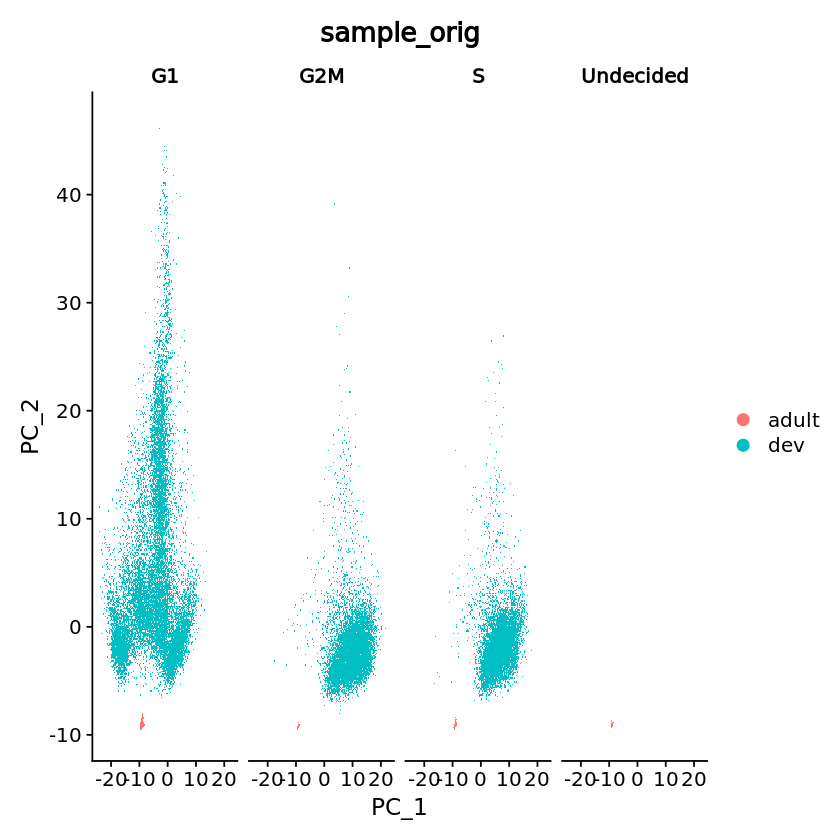

In [80]:
DimPlot(merged_seurat, reduction = "pca", group.by = "sample_orig", split.by = "Phase")

In [85]:
merged_seurat <- merged_seurat %>%
    NormalizeData()


In [86]:
merged_seurat <- merged_seurat %>%
    SCTransform(vars.to.regress = c("Phase"))   

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 17883 by 130956

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 142 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17883 genes



  |======================================================================| 100%


Computing corrected count matrix for 17883 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 8.426014 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out Phase

Centering data matrix

Set default assay to SCT



In [87]:
saveRDS(merged_seurat, "adult_mouse_dataset_byrne_lab/merged_seurat_sct.rds")

In [1]:
merged_seurat <- readRDS("adult_mouse_dataset_byrne_lab/merged_seurat_sct.rds")

In [17]:

# Calculate PCs using variable features determined by SCTransform (3000 by default)
merged_seurat <- RunPCA(merged_seurat, assay = "SCT", npcs = 20)

PC_ 1 
Positive:  Tuba1a, Stmn2, Gap43, Fabp7, Tubb3, Meg3, Nnat, Sox4, Tmsb4x, H3f3b 
	   Actb, Sncg, Tubb2b, Rtn1, mt-Cytb, mt-Nd1, Ina, Tmsb10, Malat1, Ftl1 
	   Tagln3, Xist, Nefm, Mllt11, Crabp1, Stmn3, Sox11, Rpl18a, Rps14, Cd24a 
Negative:  Gnat1, Rho, Gnb1, Rcvrn, Pde6a, Pdc, Sag, Nrl, Prkca, Hcn1 
	   Opn1mw, Hnrnpu, Gnat2, Ncam1, Pcp4, Meis2, Vtn, Arr3, Otx2, Pygm 
	   Dop1a, Trpm1, Sept7, Pde6c, Cryab, Slc24a1, Atp1b1, Grm6, Meis1, Slc1a2 
PC_ 2 
Positive:  Pcp4, Trpm1, Prkca, Grm6, Isl1, Scg2, Car8, Ccdc136, Ncam1, Pygm 
	   Sept7, Otx2, Ptprz1, Vsx2, Nrsn1, Tenm2, Grik1, Atp1b1, Hnrnpu, Dop1a 
	   Pcdh7, Cryab, Nefl, Reln, Scn1a, Nfib, Gap43, Meis2, Lsamp, Stmn2 
Negative:  Sag, Pde6g, Gngt1, Pdc, Rom1, Rho, Prph2, Nr2e3, Cnga1, Unc119 
	   Tulp1, Gngt2, Rcvrn, Pde6b, Platr17, Ebpl, Gm11744, Cngb1, Nrl, Rp1 
	   Rdh12, Neurod1, Rpgrip1, Tma7, Opn1sw, Fam57b, A930003A15Rik, Nxnl2, Aipl1, Samd11 
PC_ 3 
Positive:  Trpm1, Pcp4, Sag, Prkca, Grm6, Pde6g, Gngt1, Isl1, Rom1, Prph

In [8]:
install.packages("harmony")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [10]:
library(harmony)

Loading required package: Rcpp



In [11]:
#integrate with harmony
harmonized_seurat <- RunHarmony(merged_seurat, 
             group.by.vars = c("sample_orig"), 
              reduction = "pca", assay.use = "SCT", reduction.save = "harmony")

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6547800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6547800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6547800)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony converged after 7 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.harmony; see ?make.names for more details on syntax validity”


In [18]:
harmonized_seurat_2 <- RunHarmony(merged_seurat, 
             group.by.vars = c("sample_orig"), 
              reduction = "pca", assay.use = "SCT", reduction.save = "harmony")

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6547800)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.harmony; see ?make.names for more details on syntax validity”


In [12]:
harmonized_seurat

An object of class Seurat 
35772 features across 130956 samples within 2 assays 
Active assay: SCT (17883 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



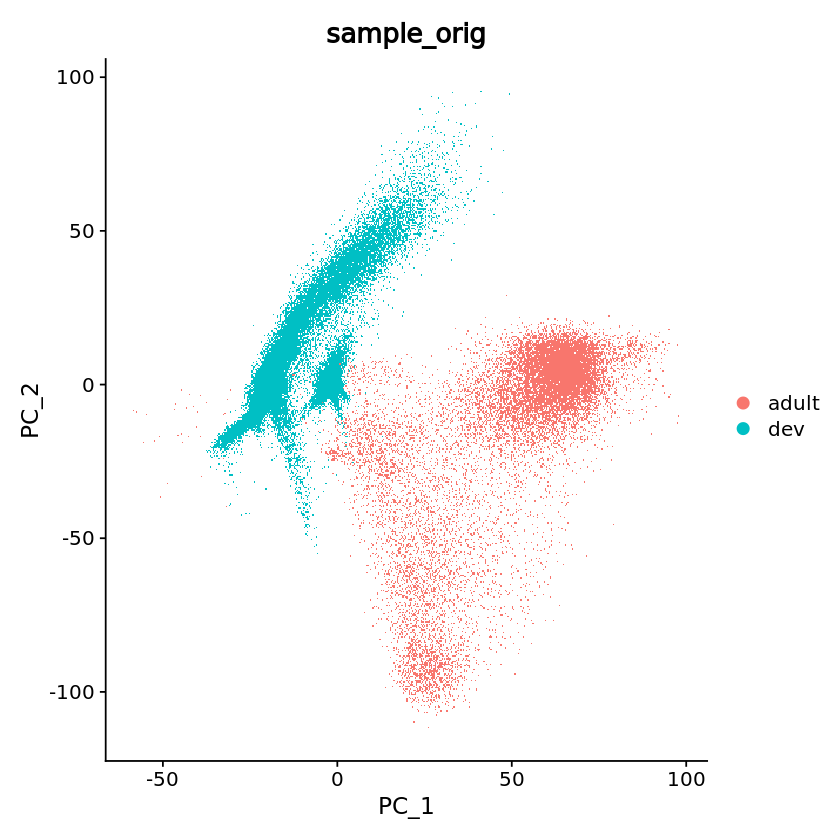

In [21]:
DimPlot(harmonized_seurat, reduction = "pca", group.by = "sample_orig")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



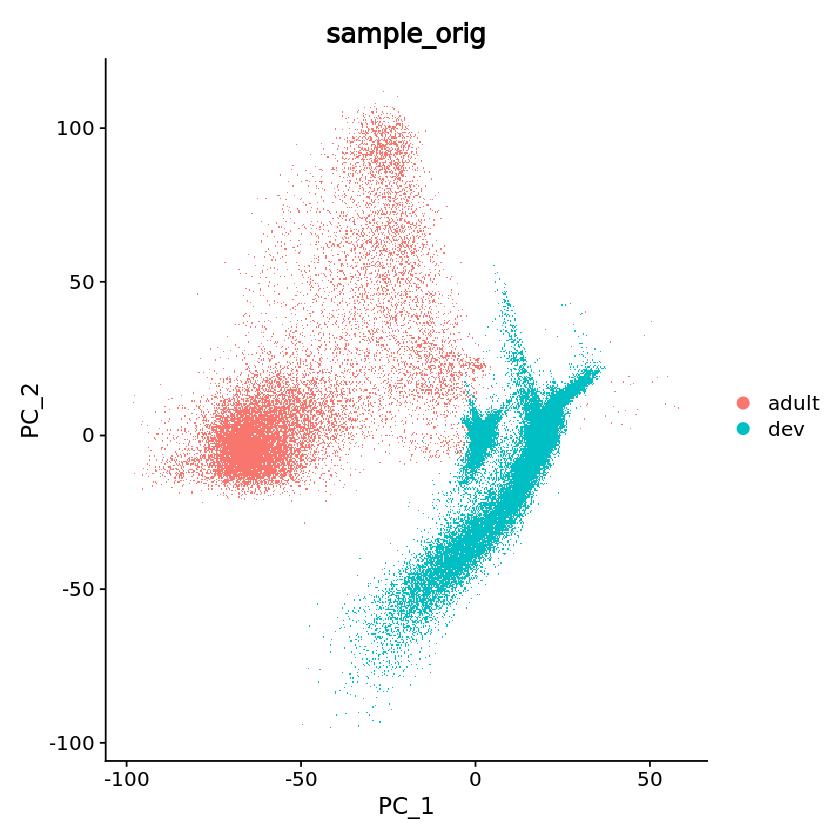

In [20]:
DimPlot(harmonized_seurat_2, reduction = "pca", group.by = "sample_orig")

Warning message in ElbowPlot(object = harmonized_seurat, ndims = 60):
“The object only has information for 40 reductions”


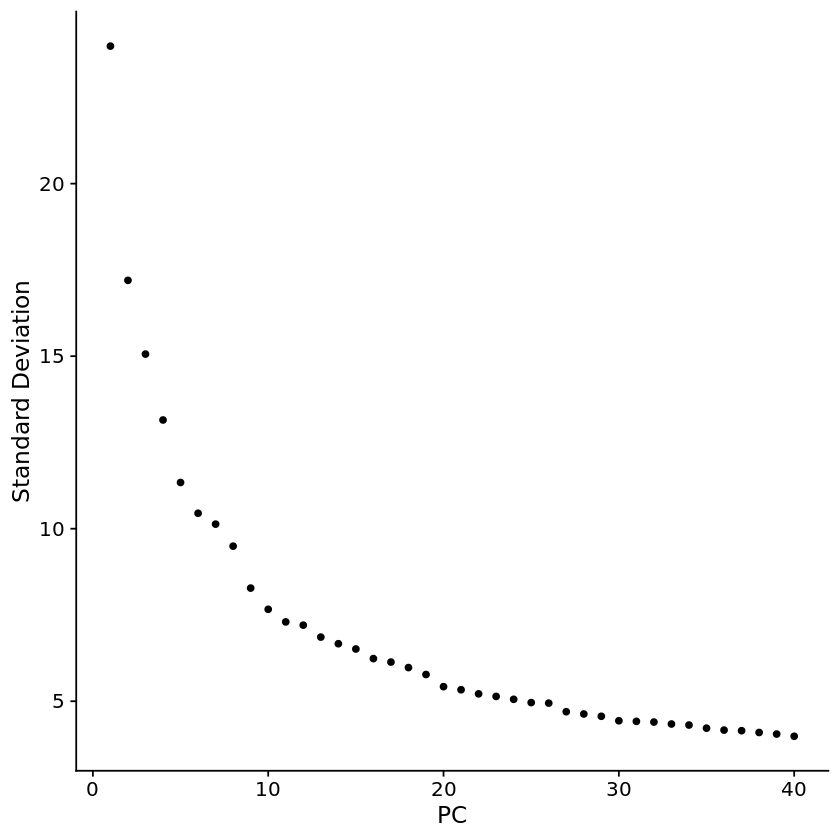

In [31]:
# Determine the K-nearest neighbor graph
# Plot the elbow plot to determine pcs to use
ElbowPlot(object = harmonized_seurat, 
          ndims = 60)


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 130956
Number of edges: 4775361

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9605
Number of communities: 34
Elapsed time: 72 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 130956
Number of edges: 4775361

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9511
Number of communities: 42
Elapsed time: 72 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 130956
Number of edges: 4775361

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9430
Number of communities: 46
Elapsed time: 71 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 130956
Number of edges: 4775361

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9354
Number of communities: 54
Elapsed time: 69 seconds


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



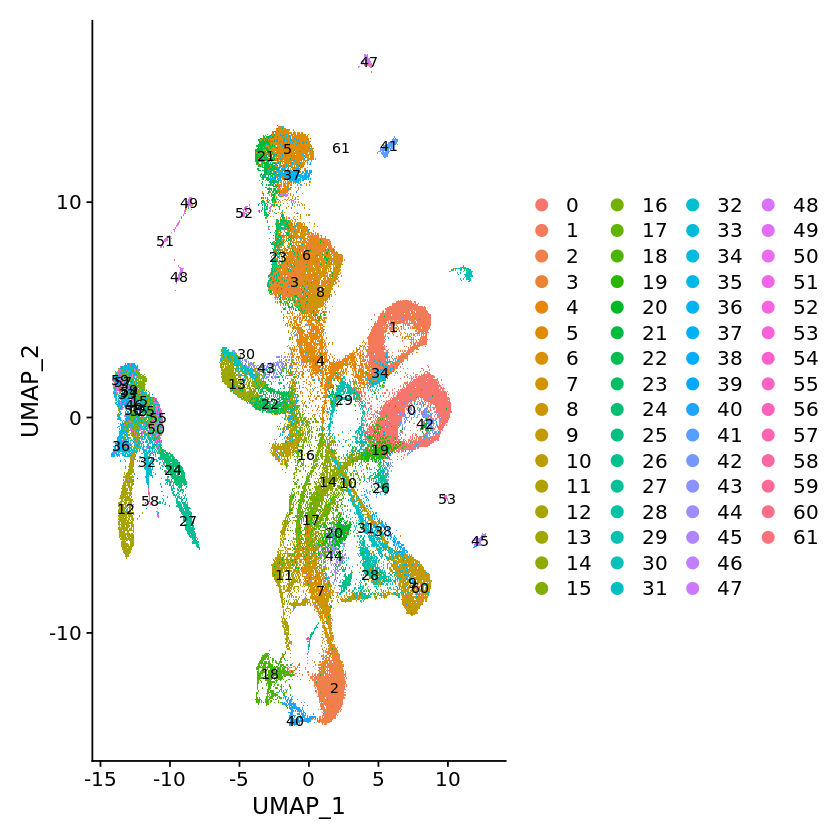

In [28]:
DimPlot(seurat_integrated, reduction = "umap",
       label = TRUE, label.size = 3)

In [33]:
harmonized_seurat <- RunUMAP(harmonized_seurat, reduction = "harmony", assay = "SCT", dims = 1:40)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
03:52:17 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

03:52:17 Read 130956 rows and found 40 numeric columns

03:52:17 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

03:52:17 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

03:52:54 Writing NN index file to

In [34]:
seurat_integrated <- FindNeighbors(object = harmonized_seurat, 
                                dims = 1:40)

Computing nearest neighbor graph

Computing SNN



In [35]:
seurat_integrated <- FindClusters(object = seurat_integrated,
                                 resolution = c(0.4, 0.6, 0.8, 1.0, 1.4))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 130956
Number of edges: 4775361

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9605
Number of communities: 34
Elapsed time: 67 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 130956
Number of edges: 4775361

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9511
Number of communities: 42
Elapsed time: 66 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 130956
Number of edges: 4775361

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9430
Number of communities: 46
Elapsed time: 65 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 130956
Number of edges: 4775361

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9354
Number of communities: 54
Elapsed time: 63 seconds


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



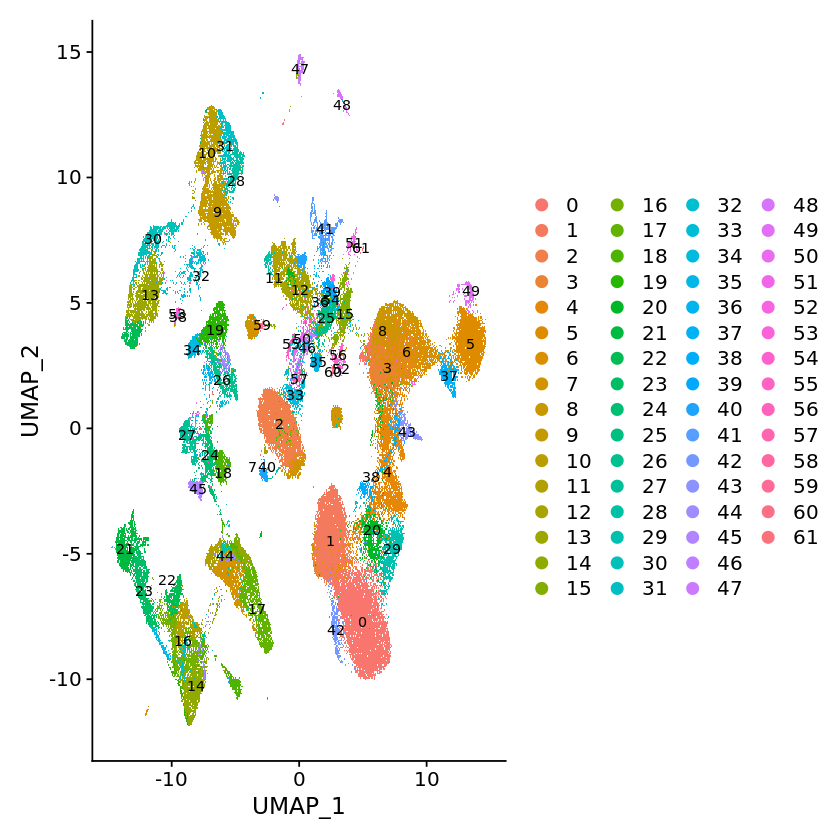

In [36]:
DimPlot(seurat_integrated, reduction = "umap",
       label = TRUE, label.size = 3)

In [ ]:
merged_seurat@

In [45]:
# Assign identity of clusters
Idents(object = seurat_integrated) <- "SCT_snn_res.0.4"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



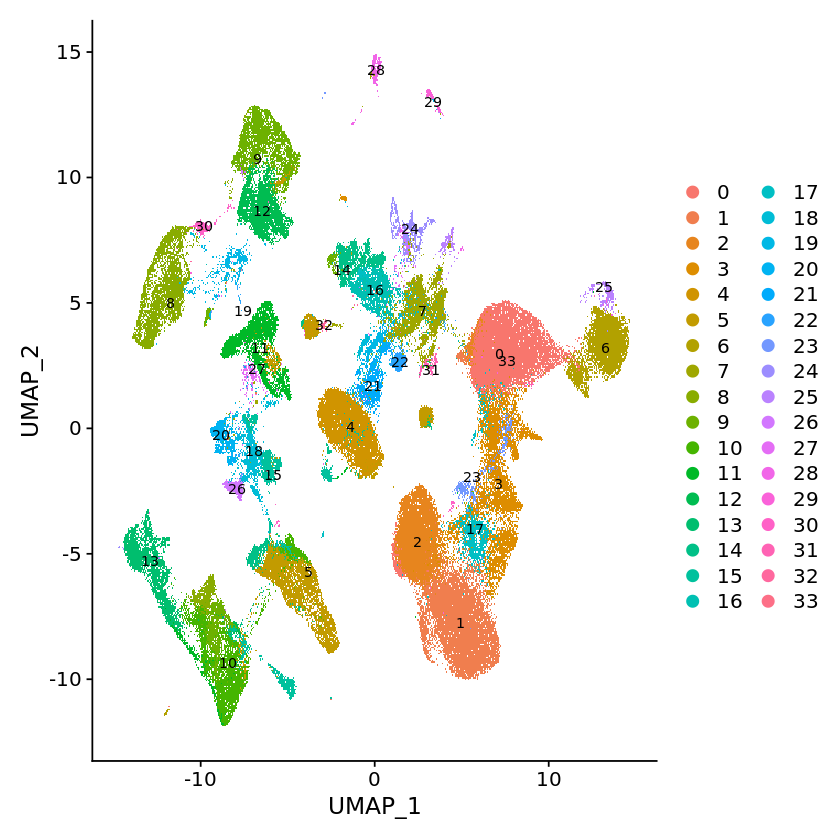

In [46]:
DimPlot(seurat_integrated, reduction = "umap",
       label = TRUE, label.size = 3)

In [52]:
saveRDS(seurat_integrated, "adult_mouse_dataset_byrne_lab/seurat_adult_integrated.rds")

In [3]:
seurat_adult_integrated <- readRDS("adult_mouse_dataset_byrne_lab/seurat_adult_integrated.rds")